In [303]:
%load_ext autoreload
%autoreload 2
import numpy as np
import pandas as pd
from random import seed
from random import random
import matplotlib.pyplot as plt
from conf_ope_rl import * 
from joblib import Parallel, delayed


The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [2]:

import gurobipy as gp

nS = 4
nA = 2
P = np.zeros([nS,nA, nS])
Pi = np.zeros([nA, nS]) # prob A given state S 
P[:,0,:] = np.array(
    [[0.15, 0.15, 0.35, 0.35], # s=a,u1;
    [0.05, 0.05, 0.45, 0.45], #s=a,u2 ;
    [0.1, 0.1, 0.4, 0.4], #s=b,u1,
    [0.35, 0.35, 0.15, 0.15]])  #s=b,u2,
# s=a,u1; s=a,u2; s=b,u1; s=b,u2

#     [[0.15, 0.05, 0.35, 0.45], # s=a,u1;
#     [0.15, 0.05, 0.35, 0.45], #s=a,u2 ;
#     [0.1, 0.1, 0.4, 0.4], #s=b,u1,
#     [0.35, 0.35, 0.15, 0.15]])  #s=b,u2,
# # s=a,u1; s=a,u2; s=b,u1; s=b,u2
P[:,1,:] = np.array(
    [[0.15, 0.15, 0.35, 0.35], # s=a,u1;
    [0.2, 0.2, 0.3, 0.3], #s=a,u2 ;
    [0.05, 0.05, 0.45, 0.45], #s=b,u1,
    [0.15, 0.15, 0.35, 0.35]])  #s=b,u2,

# state=np.array([[1, 0.0, 0.0, 0]])
state_dist = np.ones(nS) * 1.0/nS
n = 20000
nU = 2
nSmarg = nS / nU
gamma = 0.99
p0 = np.asarray([0.1,0.1,0.2,0.2])
p_e_su = np.asarray([ p0 ,1-p0 ])
print p_e_su

# very extreme
Pi = np.array(# s=a,u1; s=a,u2; s=b,u1; s=b,u2
    [[0.8, 0.1, 0.1, 0.9],
        [0.2, 0.9, 0.9, 0.1]]) 

# Pi = np.array(# s=a,u1; s=a,u2; s=b,u1; s=b,u2
#     [[0.2, 0.7, 0.8, 0.2], 
#     [0.8, 0.3, 0.2, 0.8]]) 

[[0.1 0.1 0.2 0.2]
 [0.9 0.9 0.8 0.8]]


## Train on one long trajectory

In [7]:
tight = False
# def get_full_agg_w_densratio( gamma, nS, nA, nU, P, Pi, p_e_su, state, n ): 
nSmarg = nS / nU
[ stateChangeHist, stateHist, a_s, s_a_sprime, p_infty_b_su, distr_hist ] =  simulate_rollouts( 
    nS, nA, P, Pi, state_dist, n )
p_infty_b_s = (reshape_byxrow(p_infty_b_su.T, nU).T).flatten()
p_infty_b_su = p_infty_b_su.flatten()
print p_infty_b_su, p_infty_b_s
print('stationary distn on s,u: ', p_infty_b_su)

# process history 
[ p_a1_su, joint_s_a_sprime, s_a_giv_sprime ] = get_auxiliary_info_from_traj(stateChangeHist, 
                                        stateHist, a_s, s_a_sprime, p_infty_b_su, distr_hist, nA,nS)
# agg history and process
[aggStateHist, p_a1_s, p_e_s, agg_s_a_sprime, joint_s_a_sprime_agg, s_a_giv_sprime_agg] = agg_history(
            stateHist, s_a_sprime, p_infty_b_s, a_s, p_e_su, nA, nS, nSmarg, nU)
# Simulate from evaluation policy: 
[ stateChangeHist_e, stateHist_e, a_s_e, s_a_sprime_e, p_infty_e, distr_hist_e ] =  simulate_rollouts( 
    nS, nA, P, p_e_su, state_dist, n )


# Solve on the full information space 
w_su = get_w_lp(gamma, s_a_giv_sprime, p_infty_b_su, p_e_su, p_a1_su, nA, nS, tight = tight)
print 'LP solution norm', w_su / sum(w_su)
print w_su
print 'oracle solution norm', (p_infty_e / p_infty_b_su) / np.sum((p_infty_e / p_infty_b_su))
print (p_infty_e / p_infty_b_su)

# Solve linear system on the aggregated space 
# print 'p_e_sum ', p_e_su, 'p_e_s, ', p_e_s

w_ = get_w_lp(gamma, s_a_giv_sprime_agg, p_infty_b_s, p_e_s, p_a1_s, nA, nSmarg, tight = tight, quiet = False)
print ' solving with the biased weights ', w_ / sum(w_)
w_su_oracle_norm = (p_infty_e / p_infty_b_su)/ np.sum((p_infty_e / p_infty_b_su))

w_s_oracle_norm = reshape_byxrow(w_su_oracle_norm.T,nU).T.flatten()
print 'marginalized stationary distribution', w_s_oracle_norm



[0.25 0.25 0.25 0.25]
[0.18314084 0.18469077 0.31713414 0.31503425] [0.36783161 0.63216839]
('stationary distn on s,u: ', array([0.18314084, 0.18469077, 0.31713414, 0.31503425]))
[0.25 0.25 0.25 0.25]
LP solution norm [0.1938196  0.19986058 0.3062521  0.30006772]
[0.07339892 0.07568662 0.11597678 0.11363477]
oracle solution norm [[0.19980611 0.19477121 0.30492045 0.30050223]]
[[0.75702976 0.73795344 1.1552893  1.13854944]]
Gurobi Optimizer version 9.0.0 build v9.0.0rc2 (mac64)
Optimize a model with 3 rows, 2 columns and 6 nonzeros
Model fingerprint: 0x75a71c55
Coefficient statistics:
  Matrix range     [5e-02, 6e-01]
  Objective range  [0e+00, 0e+00]
  Bounds range     [0e+00, 0e+00]
  RHS range        [1e-01, 1e-01]
Presolve removed 1 rows and 1 columns
Presolve time: 0.01s

Solved in 0 iterations and 0.01 seconds
Infeasible model


AttributeError: Unable to retrieve attribute 'X'

In [ ]:

n = 1000
[ stateChangeHist, stateHist, a_s, s_a_sprime, p_infty_b_su, distr_hist ] =  simulate_rollouts( 
    nS, nA, P, Pi, state_dist, n )



In [8]:
[ stateChangeHist, stateHist, a_s, s_a_sprime, p_infty_b_su_long, distr_hist ] =  simulate_rollouts( 
    nS, nA, P, Pi, state_dist, 10000 )
[ stateChangeHist_e, stateHist_e, a_s, s_a_sprime_e, p_infty_e_long, distr_hist_e ] =  simulate_rollouts( 
    nS, nA, P, p_e_su, state_dist, 10000 )

print p_infty_b_su_long
print p_infty_e_long

[0.25 0.25 0.25 0.25]
[0.25 0.25 0.25 0.25]
[[0.18708129 0.18138186 0.31516848 0.31636836]]
[[0.13388661 0.14258574 0.36026397 0.36326367]]


## Simulate from many trajectories

In [ ]:
n_traj = 500
n = 1000
trajs = Parallel(n_jobs=12, verbose=5)(delayed(rollout_parallel)(i, nS, nA, P, Pi, state_dist, n ) for i in range(n_traj))



In [ ]:

[ p_a1_su, joint_s_a_sprime, s_a_giv_sprime, s_a_sprime, stateHist, a_s, p_infty_b_su] = get_auxiliary_info_from_all_trajectories(trajs, nA,nS)
print 'stationary on s,u: ', p_infty_b_su
# agg history and process
p_infty_b_s = (reshape_byxrow(p_infty_b_su.T,nU).T ).flatten()

[aggStateHist, p_a1_s, p_e_s, agg_s_a_sprime, joint_s_a_sprime_agg, s_a_giv_sprime_agg] = agg_history(
            stateHist, s_a_sprime, p_infty_b_s, a_s, p_e_su, nA, nS, nSmarg, nU)
print p_e_s
print p_e_su
# print aggStateHist



# Solve on the full information space 
tight = False
w_su = get_w_lp(gamma, s_a_giv_sprime, p_infty_b_su, p_e_su, p_a1_su, nA, nS, tight = tight)
print 'LP solution norm', w_su / sum(w_su)
print w_su
print 'oracle solution norm', (p_infty_e_long / p_infty_b_su) / np.sum((p_infty_e_long / p_infty_b_su))
print (p_infty_e / p_infty_b_su)

# Solve linear system on the aggregated space 
print p_infty_b_s
print s_a_giv_sprime_agg
w_ = get_w_lp(gamma, s_a_giv_sprime_agg, p_infty_b_s, p_e_s, p_a1_s, nA, nSmarg, tight = False ,quiet = False)
print ' solving with the biased weights, normalized ', w_ / sum(w_)
print ' solving with the biased weights, unnormalized ', w_
w_su_oracle_norm = (p_infty_e_long / p_infty_b_su)/ np.sum((p_infty_e_long / p_infty_b_su))
w_su = (p_infty_e_long / p_infty_b_su)
w_s_oracle_norm = reshape_byxrow(w_su.T,nU).T.flatten()/2 
print 'w(s)', w_s_oracle_norm
print 'w(s) normalized', w_s_oracle_norm/w_s_oracle_norm.sum()

## Optimize over primal over w

In [162]:
tight = True; quiet = True; sense_min = False
ngams = 150
logGams_full = np.linspace(0.1, 2.75, ngams)

phi = np.asarray([1,2])
min_bnds = [None] * ngams; w_min_bnds = [None] * ngams
max_bnds = [None] * ngams; w_max_bnds = [None] * ngams

for ind,logGam in enumerate(logGams_full): 
    sense_min = False
    [a_bnd, b_bnd] = get_bnds_as( p_a1_s, logGam )
    [objVal, w_, m] = primal_opt_outer_L1_test_function(gamma, phi, a_bnd,b_bnd, s_a_giv_sprime_agg, p_infty_b_s, p_e_s, p_a1_s, nSmarg, nA, tight, sense_min, quiet)
    print objVal
    print w_
    min_bnds[ind] = objVal; w_min_bnds[ind] = w_; 
    sense_min = True
    [objVal, w_, m] = primal_opt_outer_L1_test_function(gamma, phi, a_bnd,b_bnd, s_a_giv_sprime_agg, p_infty_b_s, p_e_s, p_a1_s, nSmarg, nA, tight, sense_min, quiet)
    print objVal
    max_bnds[ind] = objVal; w_max_bnds[ind] = w_; 
    print w_  



None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
None
1.63048143519
[1.0045862192145825, 0.9973314762130904]
1.62355979914
[1.0234036234180517, 0.9863824377185537]
1.63425966814
[0.9943145816966784, 1.0033081004790838]
1.62146980118
[1.0290855656590958, 0.9830763598106637]
1.63789040031
[0.9844439449989111, 1.009051399607957]
1.61932878962
[1.0349061952898615, 0.9796895856732433]
1.64125529723
[0.9752960174187574, 1.0143741853725246]
1.61710624111
[1.0409484941522071, 0.9761738317401305]
1.64330901014
[0.9697127209715745, 1.017622865534018]
1.61481851986
[1.0471679739

1.83510029687
[0.44830215609321733, 1.3210092563763205]
1.39842697462
[1.635457670334708, 0.6302545016883543]
1.83580385112
[0.44638944866698693, 1.322122178595142]
1.39500581402
[1.6447585583421844, 0.6248427148273132]
1.83649235952
[0.44451764539209593, 1.3232113004468797]
1.39161185307
[1.6539855004364994, 0.6194739539140046]
1.83716619418
[0.44268573469087774, 1.324277210525088]
1.38827409465
[1.6630596483533284, 0.614194097363537]
1.83782571604
[0.440892735295043, 1.3253204797875962]
1.38480937573
[1.672478955552901, 0.6087134074657788]
1.83847127528
[0.4391376951330252, 1.3263416622039175]
1.38140421767
[1.6817363384986845, 0.6033269343297357]
1.83910321178
[0.4374196902661529, 1.3273412953742416]
1.37798129943
[1.6910420049019441, 0.5979123671256245]
1.8397218554
[0.4357378238713097, 1.3283199011213835]
1.37649353482
[1.6950866943012102, 0.5955589362564058]
1.84032752641
[0.4340912252676801, 1.3292779860570765]
1.37566768117
[1.6973318892183202, 0.5942525538611847]
1.8409205358


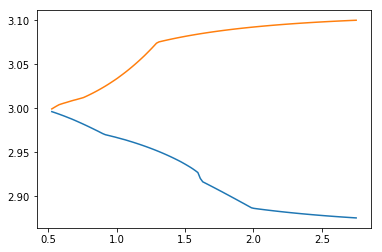

In [164]:
[min_,max_] = plot_bounds(w_min_bnds, w_max_bnds, Phi, ngams, nSmarg, logGams_full, rearrange=False)


## Solve the dual

In [ ]:
# phi = [1,2]
# tight = True; quiet = True; 

# for ind,logGam in enumerate(logGams): 
#     sense_max = False
#     [a_bnd, b_bnd] = get_bnds_as( p_a1_s, logGam )
#     [objVal, lmbda_, w_] = dual_opt_outer_L1_(gamma, phi, a_bnd,b_bnd, s_a_giv_sprime_agg, p_infty_b_s, p_e_s, p_a1_s, nSmarg, nA, tight, sense_max, quiet)
#     print lmbda_
#     #     print objVal
#     print w_
#     sense_max = True
#     [objVal, lmbda_, w_] = dual_opt_outer_L1_(gamma, phi, a_bnd,b_bnd, s_a_giv_sprime_agg, p_infty_b_s, p_e_s, p_a1_s, nSmarg, nA, tight, sense_max, quiet)
#     print lmbda_
# #     print objVal
#     print w_  

# # [objVal, lmbda_, w_] = dual_opt_outer_L1_(gamma, phi, a_bnd,b_bnd, s_a_giv_sprime_agg, p_infty_b_s, p_e_s, p_a1_s, nSmarg, nA, tight, sense_max, quiet)

# Projected gradient descent

$$  \min_g \left\{   \Phi^\top \mathbb E[A'^{-1}] v
	\colon 
	l \leq g \leq m, \;\;	Qg = 1 
	\right\} $$

In [133]:
min_pgd_bnds = [None] * ngams; w_min_pgd_bnds = [None] * ngams
max_pgd_bnds = [None] * ngams; w_max_pgd_bnds = [None] * ngams
Phi = np.asarray([1,2])
data_ = {'Phi': Phi, 'pbs': p_infty_b_s, 's_a_giv_sprime': s_a_giv_sprime_agg, 'p_e_s': p_e_s}
data_['check_grad'] = False
data_['tight'] = True; data_['a_bnd']=a_bnd; data_['b_bnd']=b_bnd
data_['gamma'] = 1
data_['sense_min'] =False

ngams = 25 
logGams = np.linspace(0.1, 2.75, ngams)


N_RST = 20
N_RNDS = 100


0.1


None None


None None
0.21041666666666667


None None


None None
0.3208333333333333


None None


None None
0.43125


None None


None None
0.5416666666666666


[[[2.40809039 2.59461501]
  [1.47466844 2.39294961]]

 [[2.9266901  2.71553288]
  [1.50718825 1.58291419]]]
None None


[[[2.40809039 2.59461501]
  [1.47466844 2.39294961]]

 [[2.9266901  2.71553288]
  [1.50718825 1.58291419]]]
None None
0.6520833333333332


[[[2.34553497 2.76789861]
  [1.42504554 2.22109197]]

 [[2.62602324 2.91582816]
  [1.42511852 1.67477476]]]


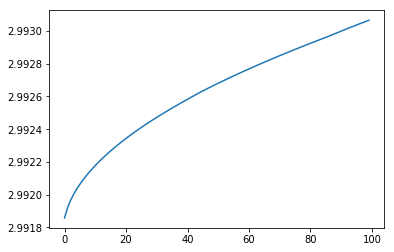

[[[2.17484396 2.43118459]
  [1.42502358 2.39221645]]

 [[2.91262514 2.915894  ]
  [1.75660074 1.5219491 ]]]


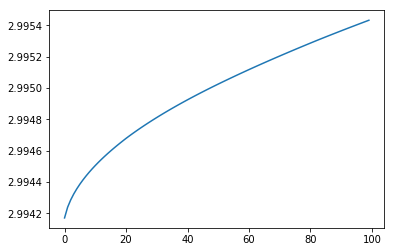

[[[3.065764   2.51494913]
  [1.530062   1.8690898 ]]

 [[2.98739823 2.46122045]
  [1.73483723 1.52194911]]]
None None


[[[2.34553497 2.76789861]
  [1.42504554 2.22109197]]

 [[2.62602324 2.91582816]
  [1.42511852 1.67477476]]]


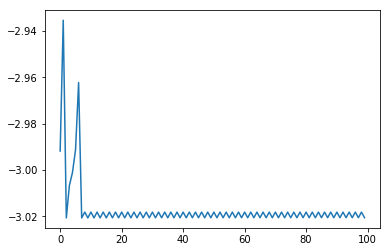

[[[2.09924202 2.91589562]
  [1.43045194 2.11222261]]

 [[2.62766146 2.91589562]
  [1.6360121  1.60241826]]]


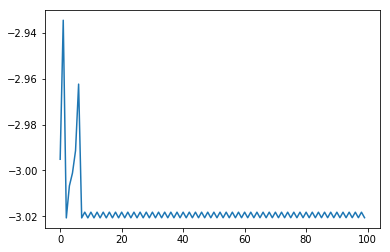

[[[2.9663353  2.37577393]
  [1.58571193 1.56867708]]

 [[3.10623574 2.47169163]
  [1.73116906 1.5219491 ]]]
None None
0.7625


[[[2.12628234 2.82049138]
  [1.41480088 2.42682745]]

 [[2.50460606 3.0798751 ]
  [1.90280787 1.4675467 ]]]


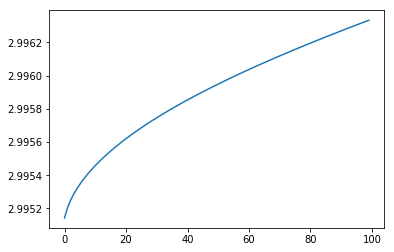

[[[3.36233755 1.90800443]
  [1.59339501 1.79015155]]

 [[3.62748511 2.11925124]
  [1.78076149 1.46738504]]]


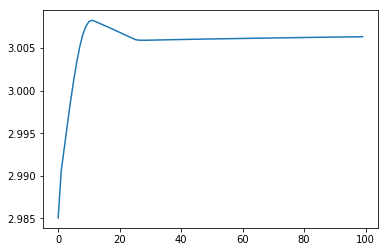

[[[3.19208239 2.59674083]
  [1.45888171 1.94036738]]

 [[2.93056975 2.41744409]
  [1.98432058 1.46738504]]]


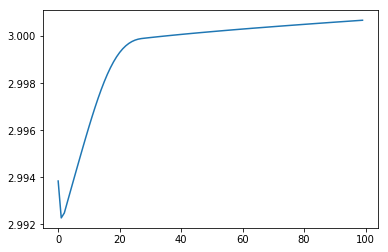

[[[2.61967256 2.28457547]
  [1.58321752 1.90429846]]

 [[3.13015287 2.63456793]
  [1.75901175 1.46832947]]]


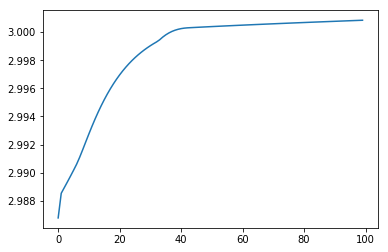

[[[2.54150249 2.46184029]
  [1.38059202 2.89610275]]

 [[2.93953747 2.73473867]
  [1.4756701  1.598345  ]]]


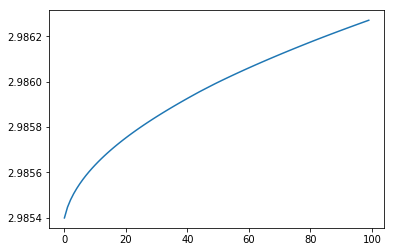

[[[2.07769887 2.62577814]
  [1.3983201  2.19566411]]

 [[2.6882153  3.04435675]
  [2.0125275  1.46738504]]]


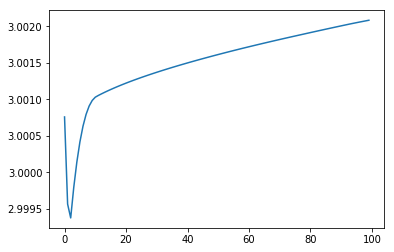

[[[1.89312987 3.13956356]
  [1.59417233 1.59186189]]

 [[2.32646339 3.13956356]
  [1.84632433 1.46738504]]]


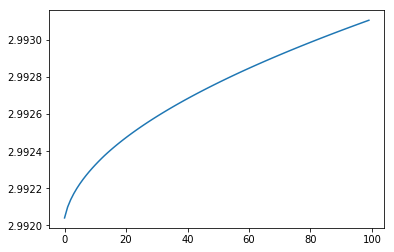

[[[1.99762419 3.10821849]
  [1.46265244 1.81227279]]

 [[2.30530175 3.13956356]
  [1.52296266 1.66270345]]]


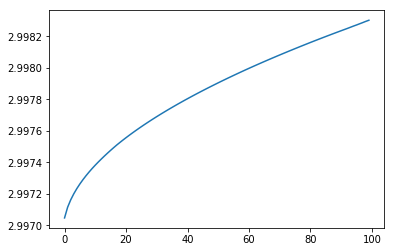

[[[3.60418855 1.91936751]
  [1.54093451 1.65462885]]

 [[3.62748546 2.02187422]
  [1.55826083 1.61165957]]]


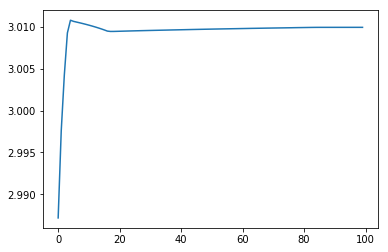

[[[2.96269962 2.0780938 ]
  [1.60556542 1.46738507]]

 [[3.40047907 2.37824153]
  [1.86686195 1.46738504]]]


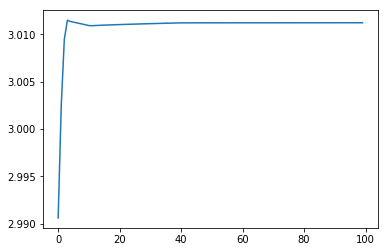

[[[3.48584091 2.04465724]
  [1.57653937 1.78701474]]

 [[3.53387379 2.07758944]
  [1.81369285 1.46738504]]]


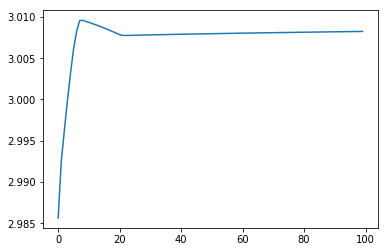

[[[2.76322207 2.09570359]
  [1.38059202 2.28956536]]

 [[3.34479919 2.49444103]
  [1.38059202 1.71616487]]]


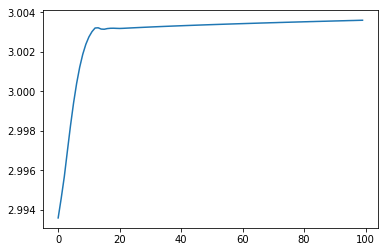

[[[1.91547891 3.13956356]
  [1.38059202 2.70339587]]

 [[2.31758048 3.13956356]
  [1.38059202 1.66124475]]]


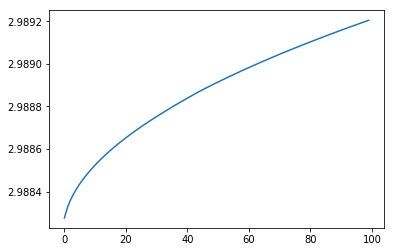

[[[3.00693855 2.24755631]
  [1.48199017 1.92531744]]

 [[3.24105527 2.40807001]
  [1.61415576 1.59754678]]]


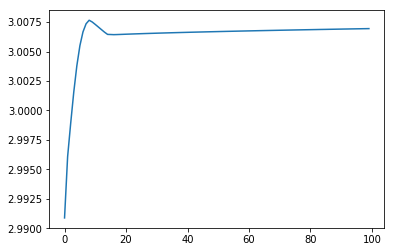

[[[2.91432821 2.13821767]
  [1.4925346  1.82773177]]

 [[3.33163766 2.42433088]
  [1.57747936 1.61706877]]]


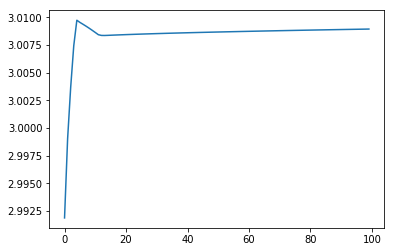

[[[3.5526991  1.95841461]
  [1.38059202 2.14894937]]

 [[3.62748521 2.0172542 ]
  [1.38059202 1.73482625]]]


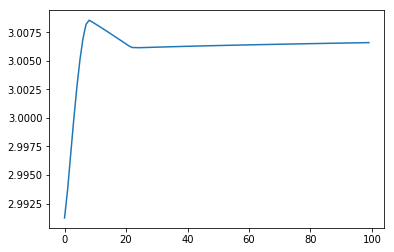

[[[1.91977331 3.13956356]
  [1.38059202 2.49439609]]

 [[2.31587361 3.13956356]
  [1.3805923  1.68898135]]]


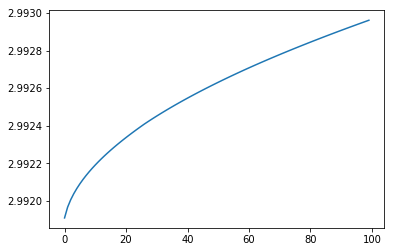

[[[2.39422508 2.93964624]
  [1.59376656 1.68055909]]

 [[2.43790207 2.96959179]
  [1.81710712 1.46738504]]]


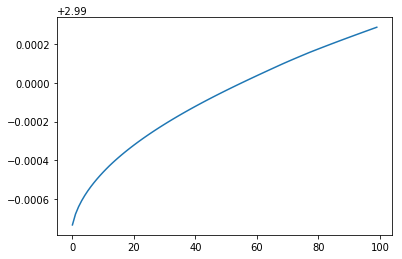

[[[2.6616878  2.19316771]
  [1.38059202 2.8598865 ]]

 [[3.22877197 2.58196857]
  [1.38059202 1.64047663]]]


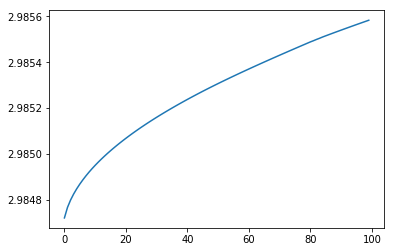

[[[2.12963597 2.61952116]
  [1.38059202 2.85612215]]

 [[2.70436902 3.01356621]
  [1.68015684 1.52337445]]]


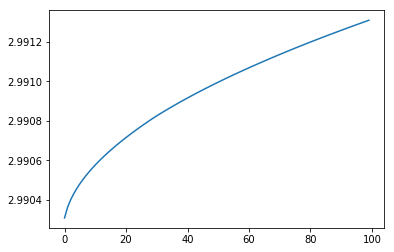

[[[3.10005567 2.24264988]
  [1.38059202 2.29781315]]

 [[3.2637635  2.35489027]
  [1.56646915 1.64209952]]]


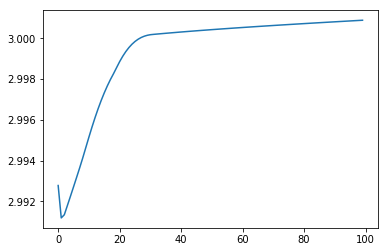

[[[2.38661336 2.46330995]
  [1.44361125 2.31076266]]

 [[2.90839506 2.82105081]
  [1.88798065 1.46738505]]]


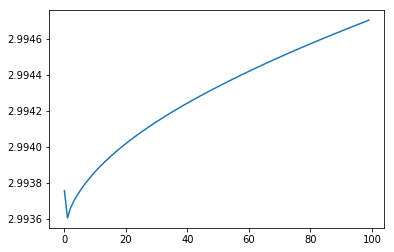

[[[2.1857327  2.49489434]
  [1.45881013 1.82892284]]

 [[2.8386003  2.94250953]
  [2.02213019 1.46738504]]]


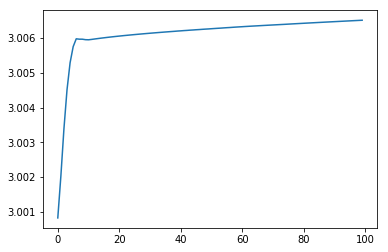

[[[2.49693516 2.90594562]
  [1.47765595 2.17998233]]

 [[2.49097805 2.90186135]
  [1.74565549 1.51534348]]]


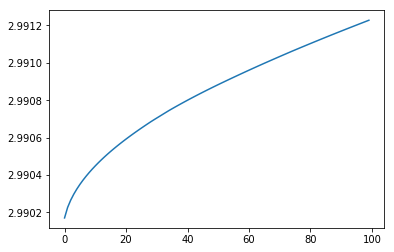

[[[3.22952146 2.45596063]
  [1.50238967 1.85275501]]

 [[3.07722977 2.35154731]
  [1.60627081 1.59512977]]]


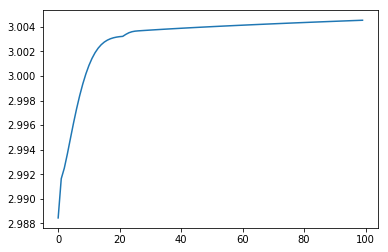

[0.92992789 1.04077195] 3.0114717862815272


[[[2.12628234 2.82049138]
  [1.41480088 2.42682745]]

 [[2.50460606 3.0798751 ]
  [1.90280787 1.4675467 ]]]


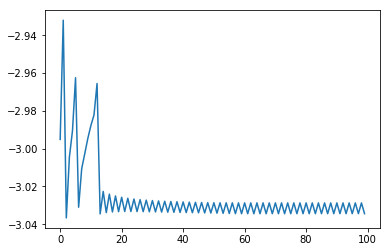

[[[2.41808018 2.29517921]
  [1.38059202 2.53931943]]

 [[3.08100923 2.74969267]
  [1.65252251 1.57626641]]]


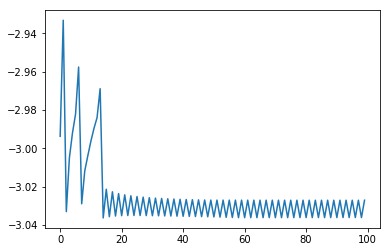

[[[3.14603606 2.23078884]
  [1.66875445 1.5017171 ]]

 [[3.28432804 2.32560376]
  [1.67259604 1.49218829]]]


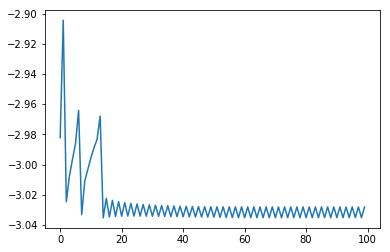

[[[2.77636328 2.57730921]
  [1.62421159 1.67500955]]

 [[2.87014516 2.64160738]
  [1.76141716 1.46738504]]]


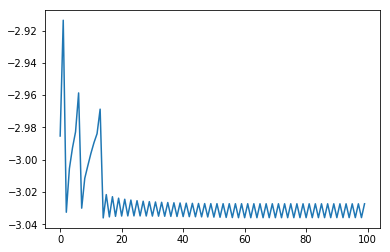

[[[2.06744348 3.13956344]
  [1.47933881 2.18982182]]

 [[2.25718026 3.13956356]
  [1.8613109  1.46738504]]]


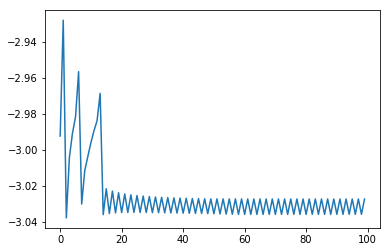

[[[3.1006973  2.00965526]
  [1.46243981 2.28426849]]

 [[3.4947365  2.27981407]
  [1.77875631 1.49980369]]]


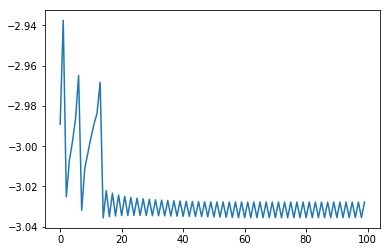

[[[2.80847169 2.32474341]
  [1.38059202 2.54078096]]

 [[3.12654017 2.54281563]
  [1.50914328 1.63235959]]]


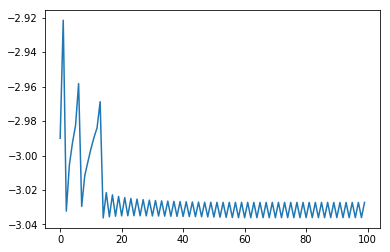

[[[2.58800037 2.3895757 ]
  [1.49630596 1.46738508]]

 [[3.02004876 2.68579414]
  [2.07345166 1.46738504]]]


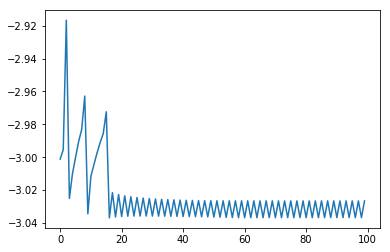

[[[2.97261551 2.26428553]
  [1.38059202 2.5509892 ]]

 [[3.21790162 2.43245713]
  [1.49515386 1.63649674]]]


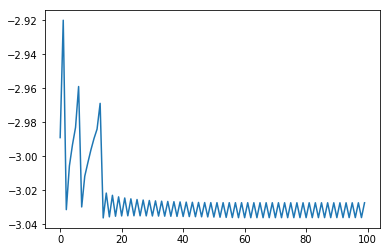

[[[2.03315828 3.10991583]
  [1.55112806 1.75879251]]

 [[2.29007518 3.13956356]
  [1.87128164 1.46738504]]]


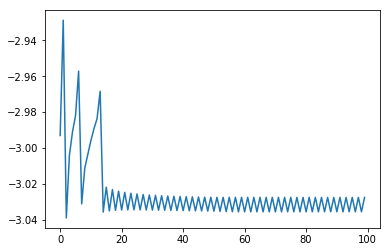

[[[2.10801526 2.88811421]
  [1.38059202 2.88817309]]

 [[2.43410439 3.11168546]
  [1.63155285 1.53820164]]]


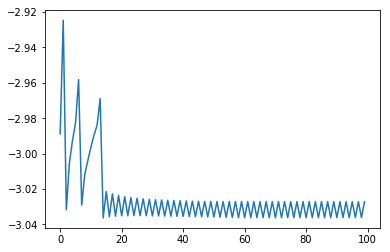

[[[2.4711053  2.99340282]
  [1.46970102 1.64846324]]

 [[2.39937527 2.9442237 ]
  [1.44495437 1.70983493]]]


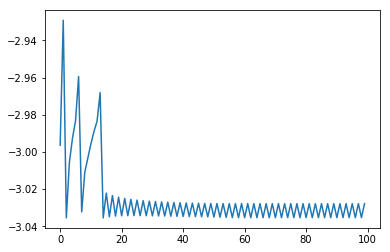

[[[2.168203   3.07879586]
  [1.38059202 2.22093761]]

 [[2.25677045 3.13942634]
  [1.38059203 1.72527257]]]


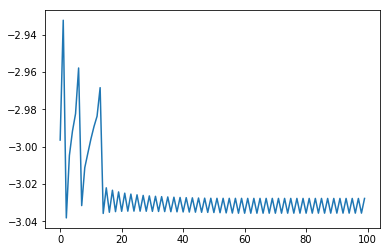

[[[1.98539714 2.77433186]
  [1.38059202 2.50210328]]

 [[2.52716412 3.13955269]
  [1.9424551  1.46738504]]]


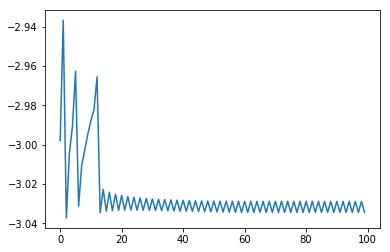

[[[2.08971006 2.67981016]
  [1.43861912 1.86537644]]

 [[2.63698311 3.05502756]
  [2.04798442 1.46738504]]]


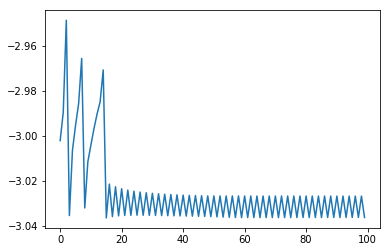

[[[2.31381142 2.71166145]
  [1.48101149 2.14082132]]

 [[2.64837617 2.94104374]
  [1.87471296 1.46738504]]]


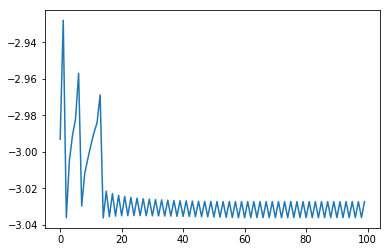

[[[2.681914   2.30734718]
  [1.38059233 2.68896853]]

 [[3.11952004 2.60737603]
  [1.82761229 1.48767007]]]


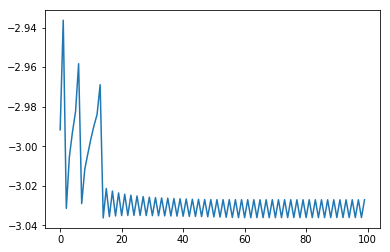

[[[2.73899103 2.667317  ]
  [1.6327123  1.5119878 ]]

 [[2.77380303 2.69118459]
  [1.80045402 1.46738504]]]


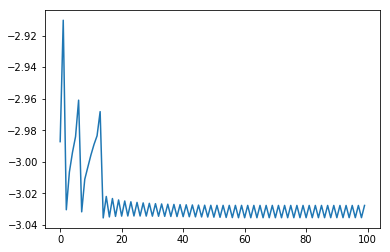

[[[2.12103248 3.13956205]
  [1.54059552 1.56754089]]

 [[2.23588152 3.13956356]
  [1.95585012 1.46738504]]]


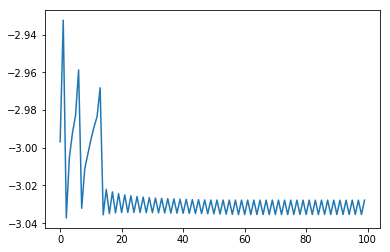

[[[3.02480104 2.10293566]
  [1.38059202 2.15028999]]

 [[3.38776831 2.35179111]
  [1.38059224 1.73464825]]]


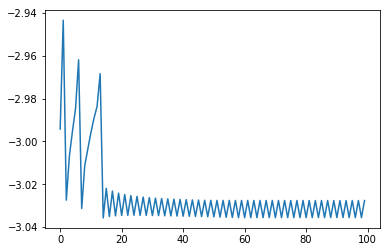

[[[1.9517929  2.80631258]
  [1.38059202 2.83046385]]

 [[2.51972493 3.13956355]
  [1.38059202 1.64438136]]]


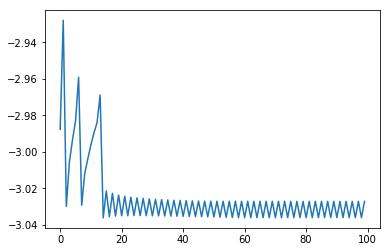

[[[2.17785831 3.13956354]
  [1.38059202 2.68053884]]

 [[2.21329439 3.13956356]
  [1.88213427 1.46738504]]]


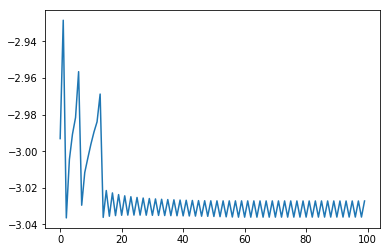

[[[3.42328633 1.98621211]
  [1.38059202 2.74063722]]

 [[3.57979177 2.09351444]
  [1.85699293 1.46927915]]]


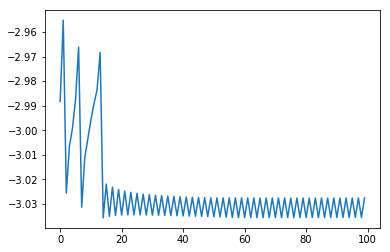

[[[2.72775849 2.58439276]
  [1.50485439 1.64763192]]

 [[2.85381114 2.67081623]
  [1.99635499 1.46738504]]]


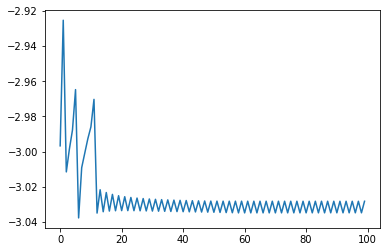

[[[2.17018573 2.36715438]
  [1.38059202 2.75141821]]

 [[2.96218472 2.91016001]
  [1.38059211 1.6548716 ]]]


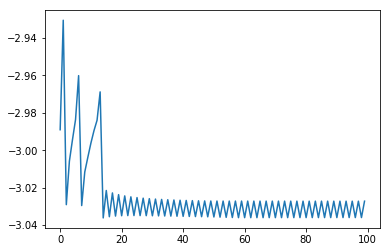

[1.21284638 0.87615384] -2.9044530681772294
0.8729166666666667


[[[3.38873475 2.4311846 ]
  [1.483614   1.75197608]]

 [[3.13229281 2.2553644 ]
  [2.12551059 1.41860055]]]


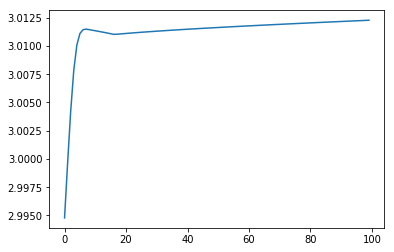

[[[2.92291706 2.80818755]
  [1.34080533 2.95881301]]

 [[2.66948065 2.63442799]
  [1.71610738 1.52516608]]]


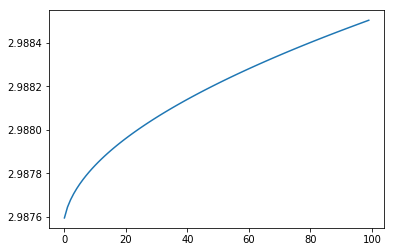

[[[3.52541567 2.47791843]
  [1.62147105 1.66244607]]

 [[3.11218561 2.1946021 ]
  [1.89530632 1.41852505]]]


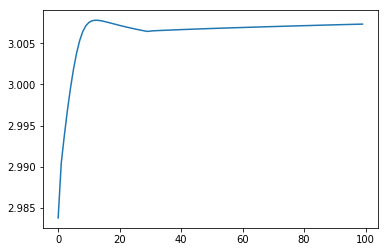

[[[2.15845686 3.22919799]
  [1.46263894 1.99764993]]

 [[2.10582779 3.19311476]
  [2.08231192 1.41852505]]]


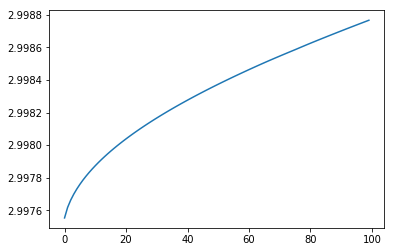

[[[2.74845857 2.34100329]
  [1.34080529 2.80953275]]

 [[3.09892775 2.58128988]
  [2.03821698 1.41852505]]]


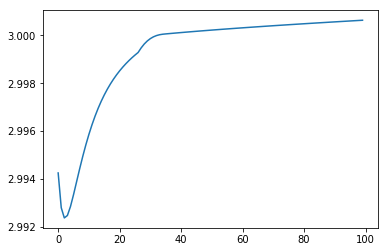

[[[3.57534644 2.21581284]
  [1.58945324 2.00903095]]

 [[3.38144846 2.08287367]
  [1.82547061 1.42371144]]]


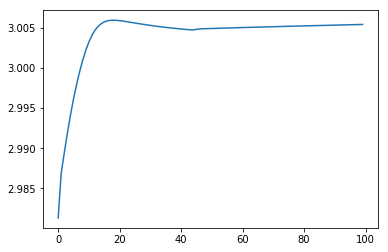

[[[3.1594886  2.44572942]
  [1.40969765 2.60069653]]

 [[3.0739442  2.38707898]
  [1.97855197 1.41852506]]]


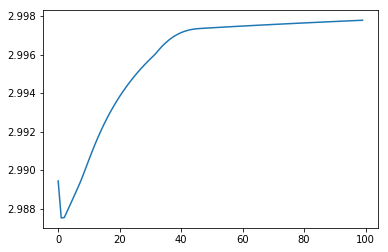

[[[3.6218236  2.28001772]
  [1.58345233 1.41852505]]

 [[3.32674244 2.07770593]
  [2.04965125 1.41852505]]]


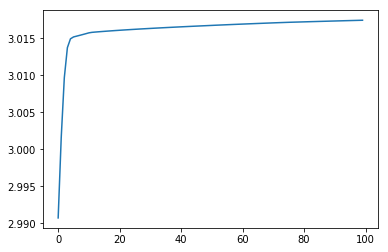

[[[3.09058692 2.52422456]
  [1.40387407 2.08721289]]

 [[2.98296577 2.45043799]
  [1.58142083 1.64689697]]]


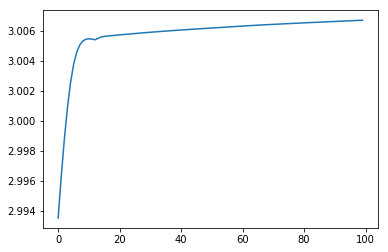

[[[2.89483757 2.89358602]
  [1.50542805 2.32940547]]

 [[2.57948647 2.67737688]
  [1.86960878 1.42623738]]]


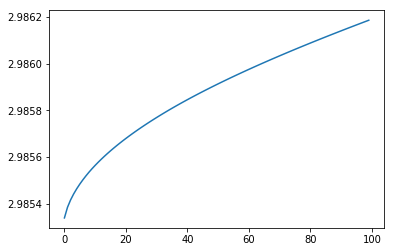

[[[2.2460741  2.40556565]
  [1.3408053  2.85356793]]

 [[2.93867189 2.88042041]
  [1.84239192 1.48955715]]]


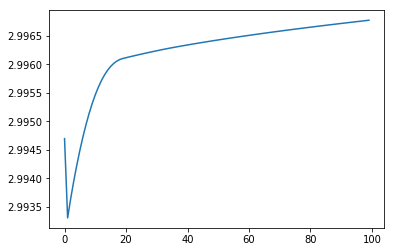

[[[3.10584933 2.75433537]
  [1.34080529 2.77875376]]

 [[2.75789822 2.51577521]
  [1.58968996 1.59869042]]]


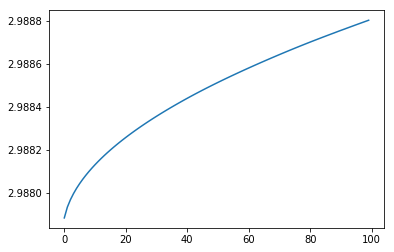

[[[2.22721914 2.83611692]
  [1.34080529 2.39608038]]

 [[2.50846984 3.02894635]
  [1.40258858 1.72292701]]]


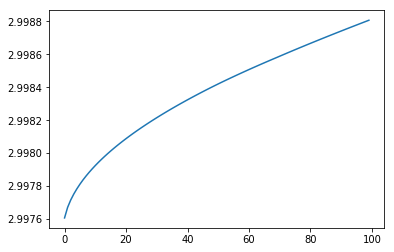

[[[3.28181992 2.45476066]
  [1.3987168  2.51863406]]

 [[3.0884423  2.32217825]
  [2.02705632 1.41852505]]]


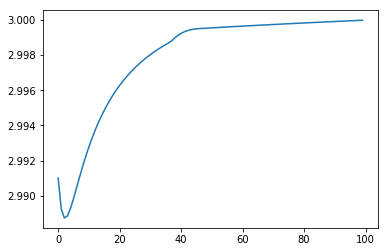

[[[2.29897334 3.20914243]
  [1.5692703  1.59685293]]

 [[2.15263034 3.10880763]
  [2.01618244 1.41852505]]]


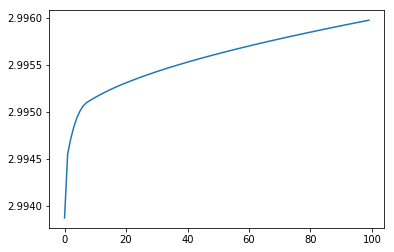

[[[1.83845691 3.09900942]
  [1.34080529 2.74499357]]

 [[2.17348664 3.32871007]
  [1.47529885 1.64807792]]]


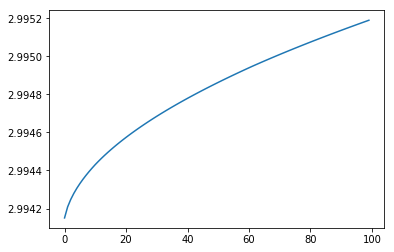

[[[2.51970973 2.44996501]
  [1.46599977 2.04108347]]

 [[2.94712662 2.74300803]
  [1.65229025 1.57908211]]]


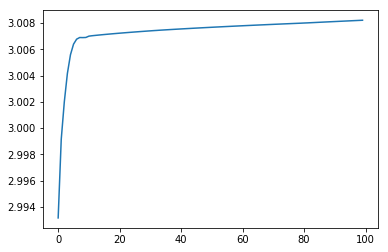

[[[2.35885995 3.04305781]
  [1.43540372 2.59324774]]

 [[2.32866421 3.02235519]
  [1.93246326 1.41852557]]]


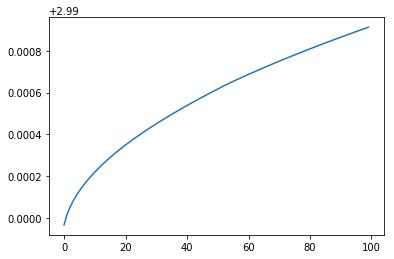

[[[3.59409833 2.06068349]
  [1.49746425 1.76656255]]

 [[3.53874395 2.02273175]
  [2.0945836  1.41852505]]]


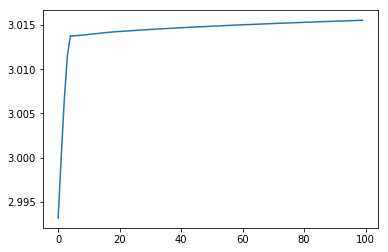

[[[3.48699929 2.14376992]
  [1.39386035 2.39051167]]

 [[3.43589552 2.10873246]
  [2.07955125 1.41852505]]]


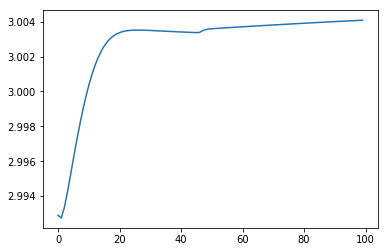

[[[3.41500586 2.25026886]
  [1.4327175  1.7586822 ]]

 [[3.31657848 2.18278566]
  [1.44767298 1.72159277]]]


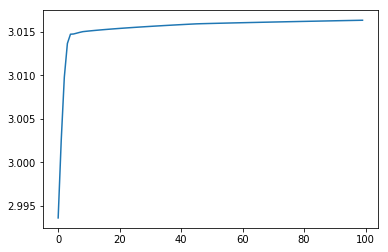

[[[3.69439428 2.09257166]
  [1.34080529 2.75152069]]

 [[3.52637216 1.97737334]
  [1.34080529 1.70001054]]]


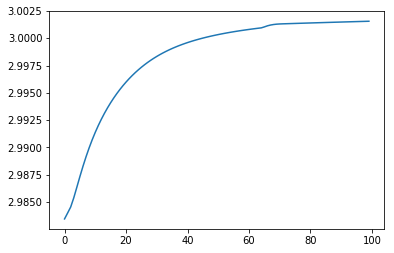

[[[3.33276691 2.53250921]
  [1.34080529 2.47812242]]

 [[3.02117396 2.31887671]
  [1.3408053  1.73629367]]]


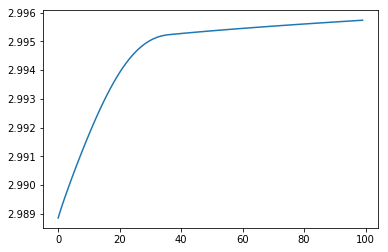

[[[3.18920312 2.53553364]
  [1.34080529 2.80780416]]

 [[2.99066171 2.39941087]
  [1.42713058 1.6586519 ]]]


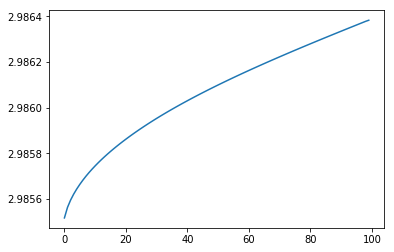

[[[2.16092509 2.61833946]
  [1.34080535 2.20420121]]

 [[2.71153676 2.99584655]
  [1.46984674 1.72198767]]]


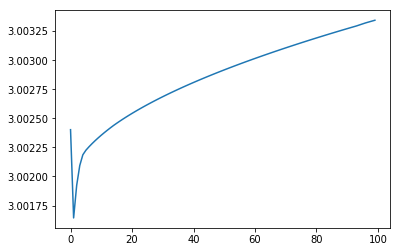

[0.89345496 1.06199398] 3.017442915886787


[[[3.38873475 2.4311846 ]
  [1.483614   1.75197608]]

 [[3.13229281 2.2553644 ]
  [2.12551059 1.41860055]]]


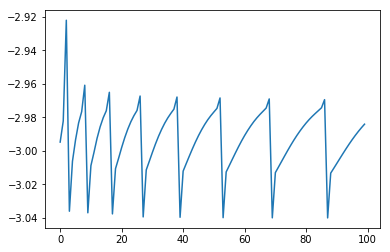

[[[2.11627993 3.11248985]
  [1.34080529 2.57194608]]

 [[2.213378   3.17906165]
  [1.34080539 1.72384214]]]


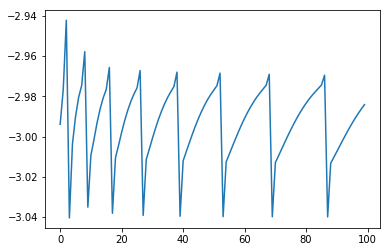

[[[2.1463465  2.35490647]
  [1.68693634 1.52678193]]

 [[2.96975084 2.91944404]
  [1.81738519 1.41852505]]]


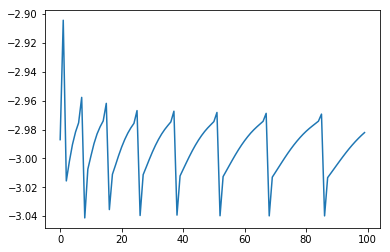

[[[2.87736346 2.6565823 ]
  [1.56639716 1.7701758 ]]

 [[2.81095958 2.61105487]
  [1.66026661 1.53737956]]]


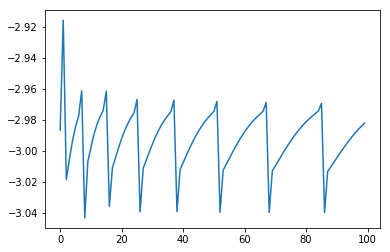

[[[3.23837636 1.97115988]
  [1.34080529 2.62765621]]

 [[3.55926533 2.19116586]
  [1.3408053  1.7164488 ]]]


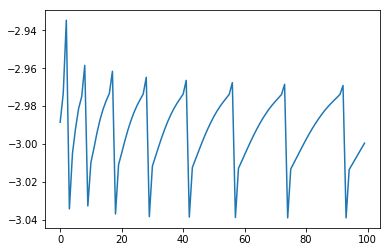

[[[3.41074023 1.85931432]
  [1.49145978 1.87882825]]

 [[3.70311693 2.05977189]
  [1.60354697 1.600852  ]]]


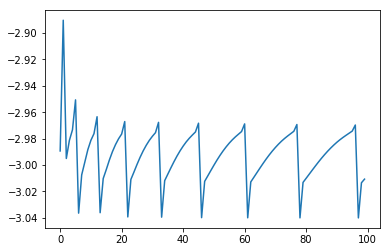

[[[2.8096191  2.23919565]
  [1.34080529 3.0338734 ]]

 [[3.21152043 2.51474484]
  [1.34080529 1.66253906]]]


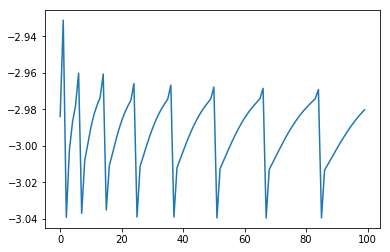

[[[2.992451   2.36557902]
  [1.34080529 2.85987372]]

 [[3.12134218 2.45394862]
  [1.5911615  1.58734717]]]


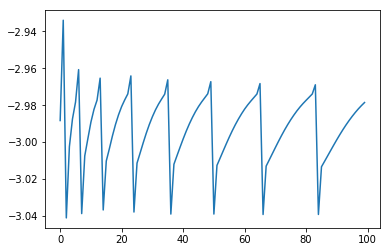

[[[2.30764899 2.72895121]
  [1.34080529 3.05038137]]

 [[2.63006446 2.95000378]
  [1.6718578  1.53038522]]]


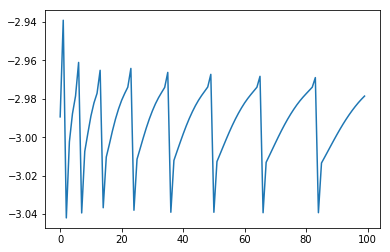

[[[3.41168551 1.90588311]
  [1.40535083 2.15007048]]

 [[3.65715795 2.07418246]
  [1.61780922 1.62317367]]]


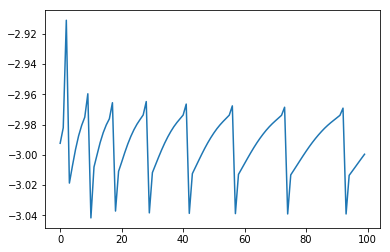

[[[3.93422674 1.65570795]
  [1.55737186 1.44937882]]

 [[3.93422674 1.77110481]
  [2.08853443 1.41852505]]]


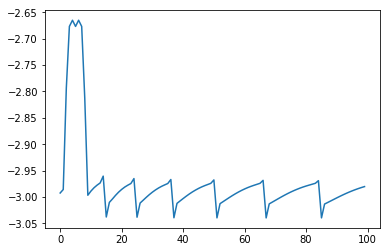

[[[3.06295384 2.52901498]
  [1.3408053  3.09120152]]

 [[2.97292324 2.46728874]
  [1.94259074 1.41868483]]]


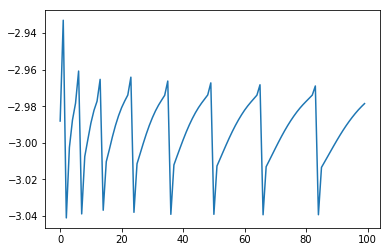

[[[2.68313104 2.95344183]
  [1.54204076 1.86728629]]

 [[2.47960561 2.81390194]
  [1.67536408 1.53664445]]]


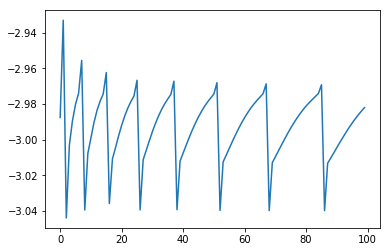

[[[3.44094455 2.5543784 ]
  [1.34080529 2.22896974]]

 [[3.02023955 2.26593715]
  [1.34080529 1.76935913]]]


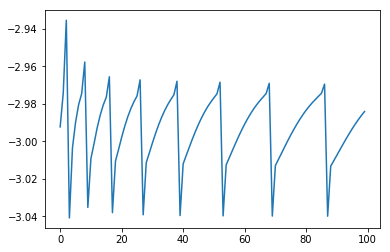

[[[2.43069961 2.43628051]
  [1.55737497 1.84514635]]

 [[2.94362535 2.78794959]
  [1.95473779 1.41852505]]]


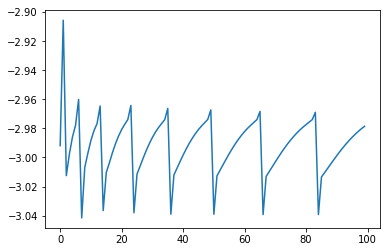

[[[2.83997211 2.48829488]
  [1.5334779  1.52558598]]

 [[2.97053152 2.57780825]
  [1.476727   1.66632818]]]


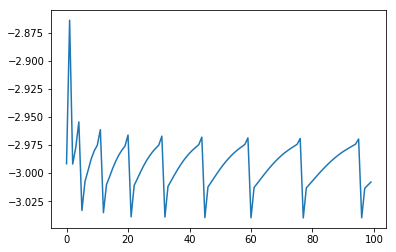

[[[2.95989101 2.53021311]
  [1.37315226 2.43961122]]

 [[2.95198296 2.52479125]
  [1.72522056 1.56648183]]]


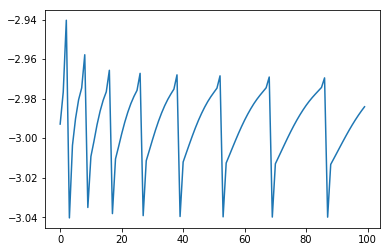

[[[2.74906742 2.56616253]
  [1.49160877 1.71480052]]

 [[2.87595767 2.65316027]
  [1.51476963 1.65736158]]]


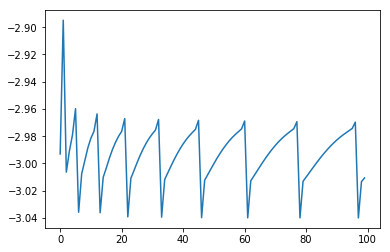

[[[1.83945661 3.28808923]
  [1.55420618 1.48297652]]

 [[1.98635121 3.38878164]
  [2.08316231 1.41852505]]]


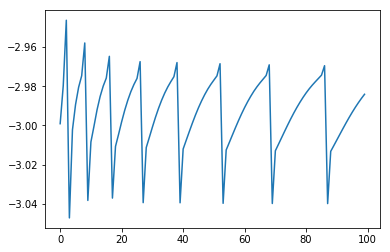

[[[2.30169218 2.79134629]
  [1.53231034 1.87053859]]

 [[2.567102   2.97331499]
  [1.66210837 1.54863948]]]


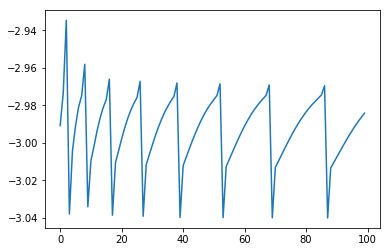

[[[1.81517271 3.20586379]
  [1.61005445 1.57189386]]

 [[2.06315294 3.37588238]
  [1.94750456 1.41852505]]]


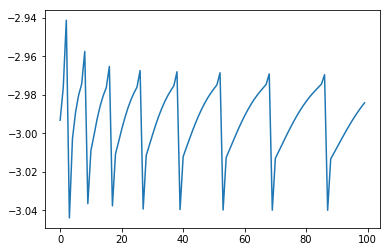

[[[2.26430758 2.49340061]
  [1.34080531 2.83658407]]

 [[2.85514006 2.89848365]
  [1.67169953 1.55882072]]]


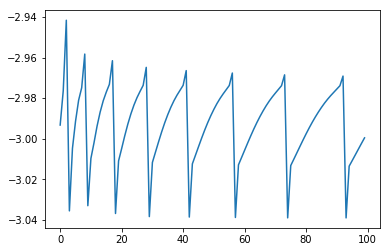

[[[2.49898117 2.2694764 ]
  [1.65255469 1.76849242]]

 [[3.12198106 2.69661387]
  [1.80068329 1.41852511]]]


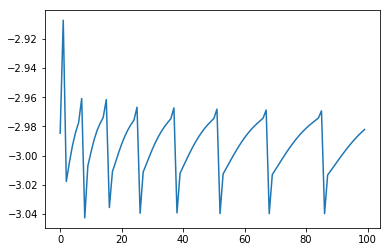

[[[2.03361202 3.23644061]
  [1.50746272 1.61832789]]

 [[2.07472392 3.26462745]
  [2.12578961 1.41852505]]]


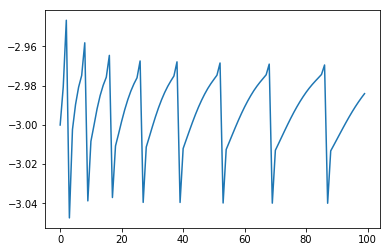

[[[3.61870084 2.22767476]
  [1.7028346  1.46477102]]

 [[3.3780051  2.06265038]
  [1.80828751 1.41852505]]]


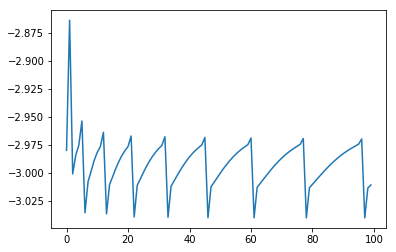

[1.20050534 0.88333456] -2.665295958761463
0.9833333333333333


[[[3.04933192 2.90338461]
  [1.67234133 1.37497951]]

 [[2.59938869 2.59489722]
  [2.00771795 1.37478476]]]


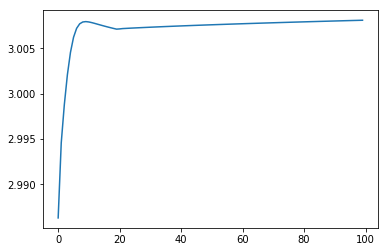

[[[2.54814287 2.60067655]
  [1.58136107 1.50113132]]

 [[2.80325183 2.77558284]
  [2.13712929 1.37477284]]]


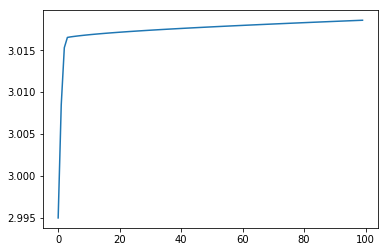

[[[1.63862841 3.47536064]
  [1.58764084 1.50440845]]

 [[1.76229984 3.5601515 ]
  [1.54884487 1.60062247]]]


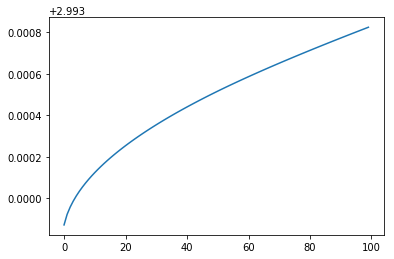

[[[3.26634121 2.14853947]
  [1.30517783 2.15053722]]

 [[3.38887821 2.23255256]
  [1.32927047 1.81074217]]]


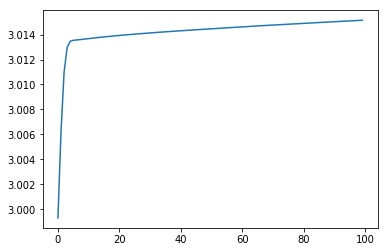

[[[3.58487612 2.23516396]
  [1.34145811 1.90108625]]

 [[3.36410193 2.08379808]
  [1.38407213 1.79540301]]]


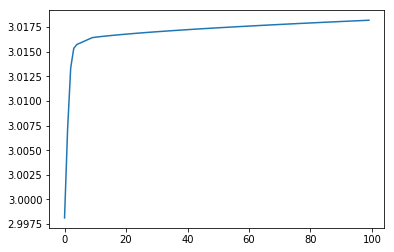

[[[2.35932256 2.99361134]
  [1.51411226 2.31929045]]

 [[2.37774422 3.00624149]
  [1.98770263 1.37477284]]]


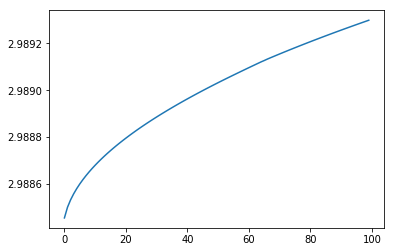

[[[2.45691643 2.631817  ]
  [1.35379701 2.96329518]]

 [[2.75491342 2.83612792]
  [1.97951228 1.41152141]]]


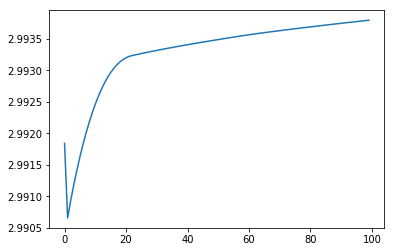

[[[2.99101637 2.5271786 ]
  [1.42369981 2.51292574]]

 [[2.96095508 2.50656816]
  [2.09319693 1.37477284]]]


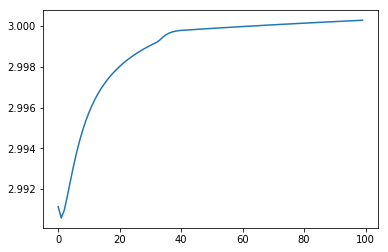

[[[3.62791196 1.94531838]
  [1.67316657 1.56856999]]

 [[3.65952796 1.96699475]
  [1.94074392 1.37477284]]]


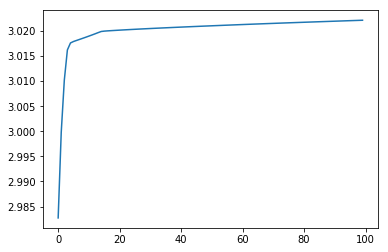

[[[2.4696771  3.15608693]
  [1.61243871 1.47584535]]

 [[2.23791485 2.99718747]
  [2.08691515 1.37477284]]]


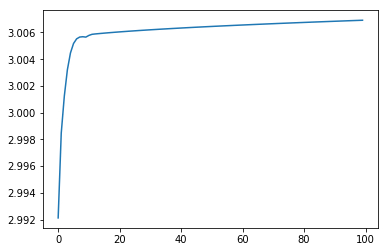

[[[2.08076155 2.42586037]
  [1.41858942 2.40307612]]

 [[2.88687992 2.97854644]
  [2.13999484 1.37477284]]]


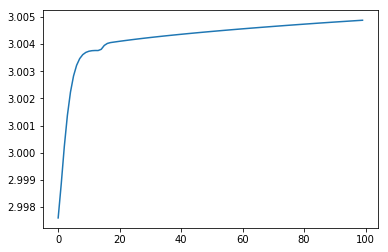

[[[1.66165675 3.41314468]
  [1.72321054 1.61254673]]

 [[1.82835677 3.52743656]
  [1.83125337 1.37477284]]]


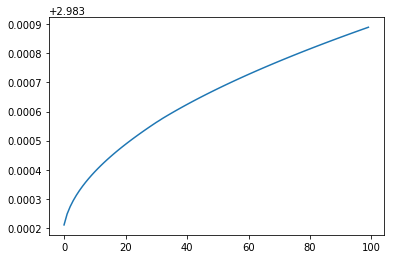

[[[3.12234004 2.56659652]
  [1.42930367 2.50991648]]

 [[2.94706968 2.44642869]
  [1.8500498  1.46646609]]]


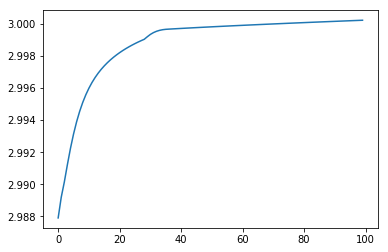

[[[2.61534831 3.07831943]
  [1.30517783 2.6991856 ]]

 [[2.3428861  2.89151551]
  [1.31706132 1.74272317]]]


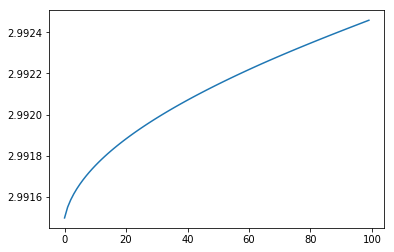

[[[2.92171204 2.6058694 ]
  [1.45014775 2.25923951]]

 [[2.86970561 2.57021307]
  [2.12894831 1.37477284]]]


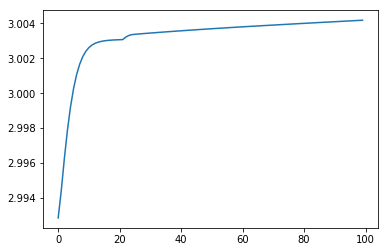

[[[2.9534881  3.04700368]
  [1.77933118 1.38302524]]

 [[2.43872198 2.69407281]
  [1.80273011 1.37477284]]]


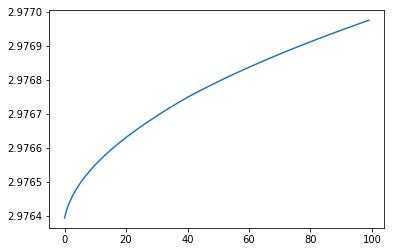

[[[3.15965386 2.12166762]
  [1.39475916 2.47591926]]

 [[3.39505486 2.28306185]
  [2.16042861 1.37477284]]]


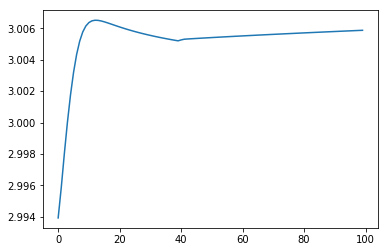

[[[2.22656105 2.90919172]
  [1.76603381 1.37478152]]

 [[2.43594153 3.05274592]
  [1.83065984 1.37477284]]]


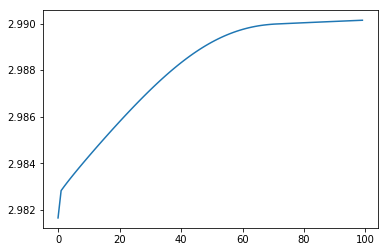

[[[2.67780713 2.72047243]
  [1.30517809 2.1912452 ]]

 [[2.70941026 2.74213998]
  [1.4358391  1.76350335]]]


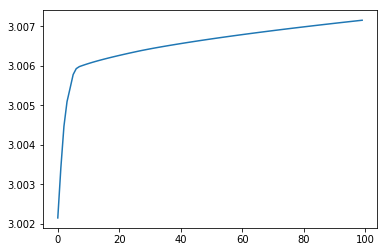

[[[3.04654595 2.93631389]
  [1.30517786 3.20133548]]

 [[2.56622854 2.60700154]
  [1.84002904 1.4707778 ]]]


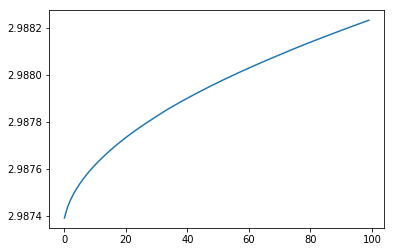

[[[1.86905848 3.28677642]
  [1.50784198 2.05994239]]

 [[1.99331282 3.37196692]
  [1.72711468 1.5161461 ]]]


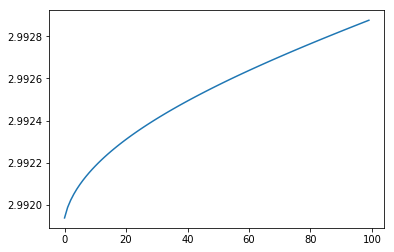

[[[3.2340972  2.49941888]
  [1.30517785 2.2468743 ]]

 [[3.03504853 2.36294831]
  [1.43592465 1.75608731]]]


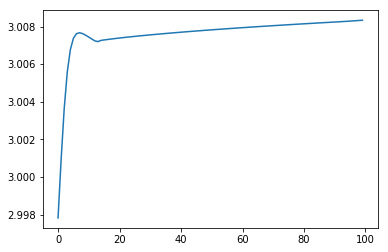

[[[3.66687867 2.1118105 ]
  [1.37142834 2.99924924]]

 [[3.50203672 1.99879255]
  [2.02624785 1.37531512]]]


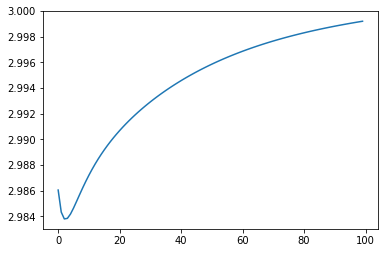

[[[2.9901995  2.42366992]
  [1.48688948 1.68843989]]

 [[3.06335446 2.47382598]
  [1.49318039 1.67283842]]]


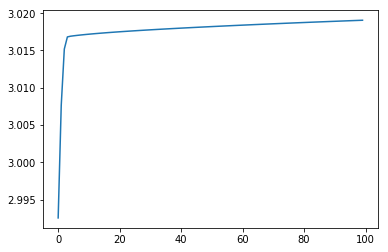

[[[2.93596992 2.96695424]
  [1.30663729 2.80871381]]

 [[2.51467706 2.67810994]
  [1.82282421 1.52855413]]]


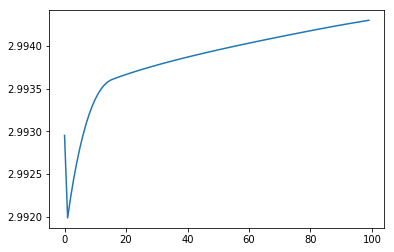

[0.86494886 1.07858045] 3.022109764820884


[[[3.04933192 2.90338461]
  [1.67234133 1.37497951]]

 [[2.59938869 2.59489722]
  [2.00771795 1.37478476]]]


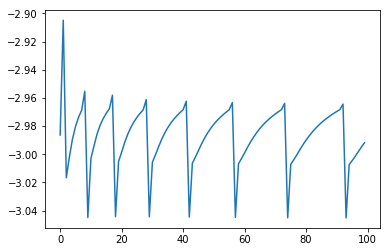

[[[2.10832512 2.80788951]
  [1.52534574 2.2731198 ]]

 [[2.51365003 3.08578596]
  [1.98207029 1.37477286]]]


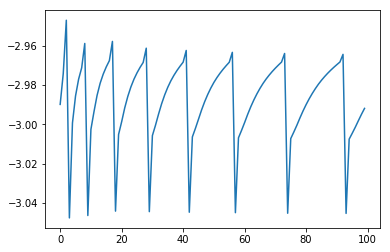

[[[2.34862445 2.48349322]
  [1.65010906 1.48716154]]

 [[2.88111656 2.84857728]
  [2.01186191 1.37477284]]]


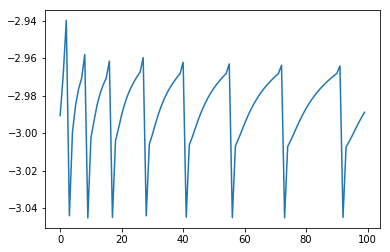

[[[2.73244242 2.33746226]
  [1.49908264 2.19692802]]

 [[3.09936651 2.58903057]
  [1.78792644 1.48059527]]]


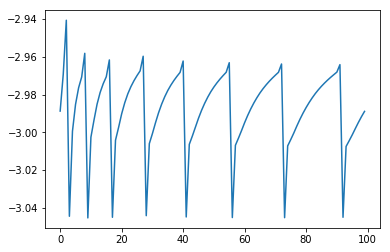

[[[3.16628092 2.45277771]
  [1.48914939 1.68864706]]

 [[3.06826262 2.38557499]
  [2.24809434 1.37477284]]]


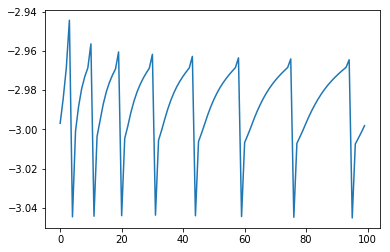

[[[3.02244659 2.56615452]
  [1.76735812 1.404942  ]]

 [[2.92836187 2.50164872]
  [1.77229449 1.39269997]]]


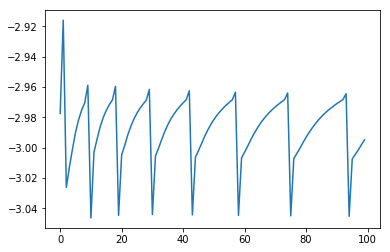

[[[3.93756548 1.89291245]
  [1.61430905 1.91299461]]

 [[3.77080018 1.77857581]
  [1.93559866 1.37477284]]]


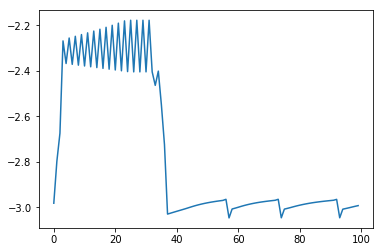

[[[2.31898521 2.55172857]
  [1.45378588 1.73657637]]

 [[2.80782857 2.88688644]
  [1.46820003 1.70082925]]]


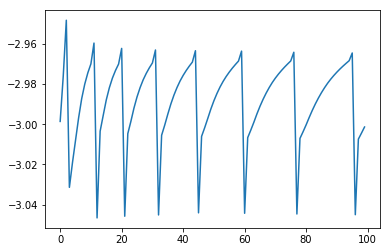

[[[2.18005938 2.69518312]
  [1.61771683 1.4778529 ]]

 [[2.63906772 3.00988567]
  [2.07625652 1.37477284]]]


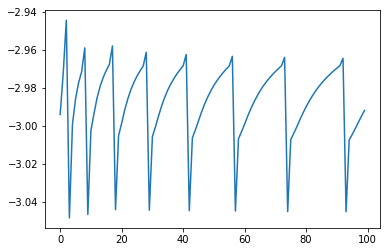

[[[2.0358938  3.36050624]
  [1.30517783 3.24399907]]

 [[1.95223755 3.30315034]
  [1.30517791 1.67508522]]]


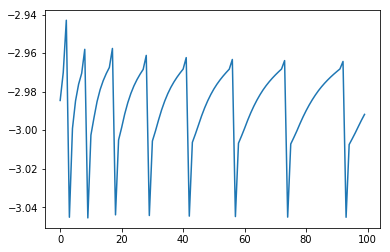

[[[2.6597764  2.83319191]
  [1.30517785 2.97574851]]

 [[2.59427251 2.78828152]
  [1.73813616 1.54071645]]]


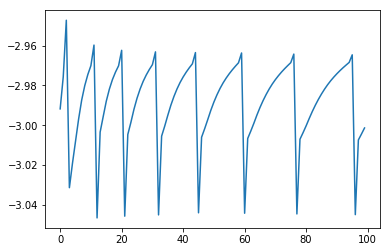

[[[2.18694099 3.00118795]
  [1.53140043 1.3747731 ]]

 [[2.33719843 3.10420656]
  [2.27431164 1.37477284]]]


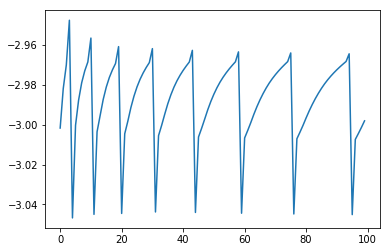

[[[2.85241403 2.56795505]
  [1.52677147 1.85926829]]

 [[2.89398922 2.59645958]
  [2.11927866 1.37477284]]]


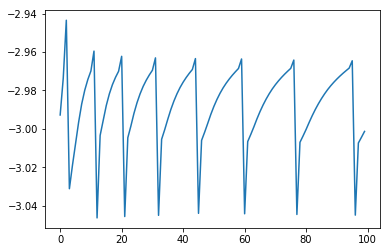

[[[3.21994468 2.37019939]
  [1.48205787 2.50515869]]

 [[3.16036613 2.32935149]
  [1.98547802 1.37477289]]]


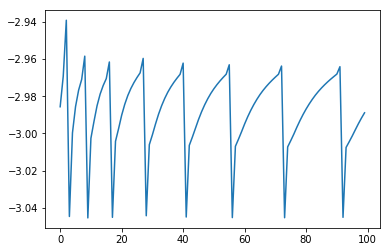

[[[3.25184449 2.06952611]
  [1.30517803 3.22492642]]

 [[3.46438583 2.21524744]
  [2.07660518 1.37477293]]]


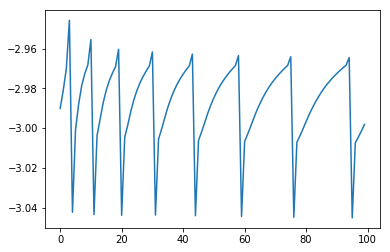

[[[3.33945723 2.4851187 ]
  [1.44581685 2.63506542]]

 [[3.06941054 2.2999709 ]
  [2.01008782 1.37477285]]]


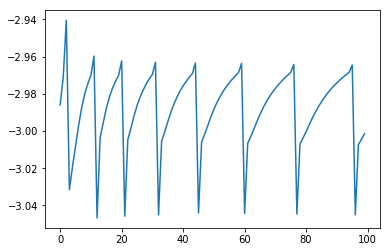

[[[3.63120897 2.50638872]
  [1.53945857 2.04535935]]

 [[3.10425387 2.14510091]
  [2.03238086 1.37477284]]]


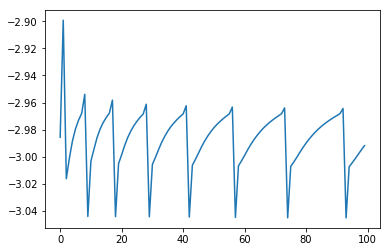

[[[2.24604611 2.83791126]
  [1.56116392 1.86289913]]

 [[2.51030042 3.01908773]
  [1.70250324 1.51237761]]]


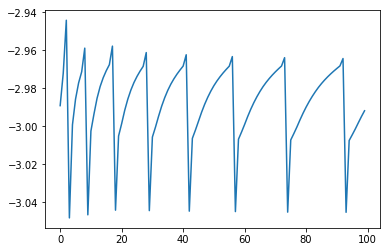

[[[3.5674196  1.87786449]
  [1.30517783 2.82266271]]

 [[3.71476691 1.97888787]
  [1.50644709 1.65198814]]]


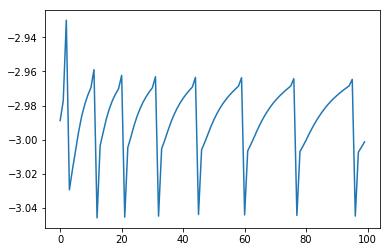

[[[2.31523183 2.70916298]
  [1.3370361  2.30656187]]

 [[2.65112388 2.93945529]
  [1.59727203 1.66117706]]]


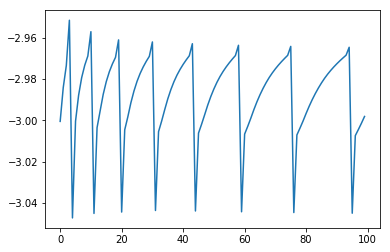

[[[2.27992441 2.68373894]
  [1.30517784 2.05119176]]

 [[2.66954684 2.95086954]
  [1.30517851 1.83338437]]]


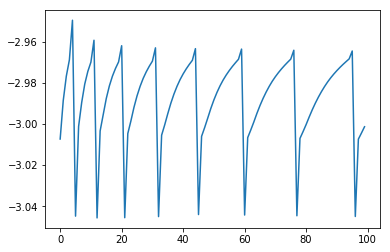

[[[2.88510051 2.45587771]
  [1.36045121 3.03788396]]

 [[3.01129969 2.54240163]
  [2.03026212 1.37676014]]]


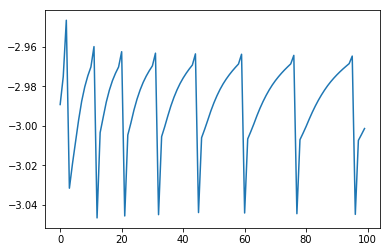

[[[2.22565119 2.74479056]
  [1.35121588 2.20797816]]

 [[2.59865508 3.00052726]
  [1.565666   1.67614253]]]


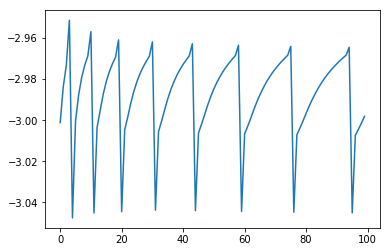

[[[2.55456565 2.76616806]
  [1.33309014 2.05503763]]

 [[2.64051459 2.82509586]
  [1.45469409 1.75345888]]]


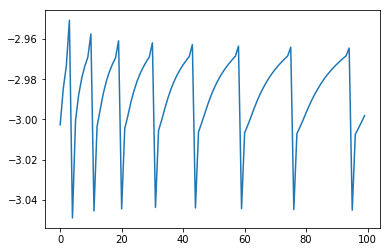

[[[3.5780003  2.78735753]
  [1.4626682  1.78626674]]

 [[2.81567318 2.26469536]
  [2.26516472 1.37477284]]]


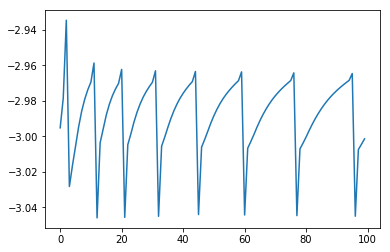

[1.24235887 0.85898179] -2.178244963168247
1.09375


[[[2.75957309 2.15037774]
  [1.65372553 1.49159095]]

 [[3.28992892 2.51399714]
  [2.10305279 1.33570125]]]


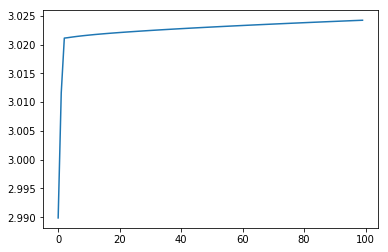

[[[4.0935766  2.40915835]
  [1.38288701 2.95735403]]

 [[3.28920737 1.85767151]
  [2.1199242  1.33559444]]]


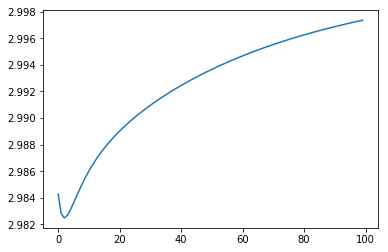

[[[2.29585734 2.73377264]
  [1.64282315 1.61521098]]

 [[2.6230274  2.95808503]
  [2.08214904 1.33559444]]]


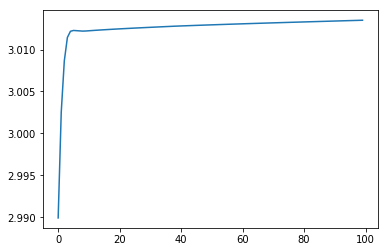

[[[2.80226781 2.32854545]
  [1.27327483 2.95166712]]

 [[3.12158409 2.54747317]
  [1.27327483 1.75008666]]]


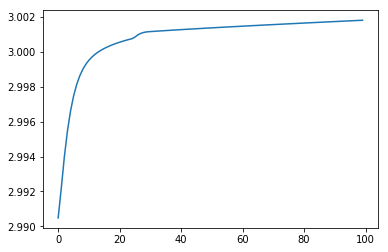

[[[2.43089364 2.23440607]
  [1.27327483 3.18946564]]

 [[3.14367883 2.7231016 ]
  [1.27327494 1.71852799]]]


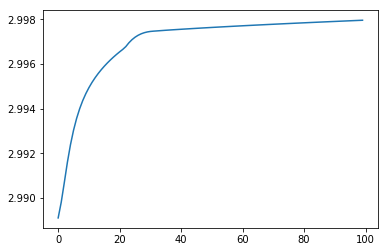

[[[3.36909492 2.91432357]
  [1.27327483 2.90680335]]

 [[2.64983667 2.42119002]
  [1.27327483 1.7560406 ]]]


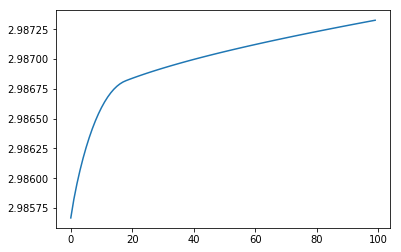

[[[2.43805751 3.33262063]
  [1.34365334 2.91976114]]

 [[2.05694579 3.07132508]
  [2.20681634 1.33559445]]]


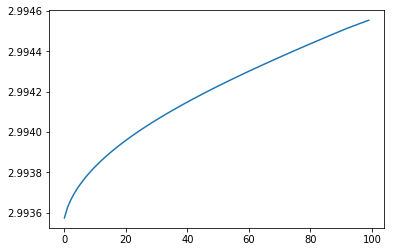

[[[2.99724591 3.08249312]
  [1.27327483 3.08011218]]

 [[2.4119459  2.68120321]
  [1.27327483 1.73304051]]]


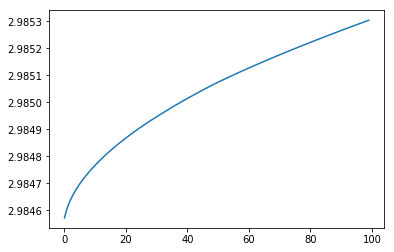

[[[2.39294216 3.00042318]
  [1.55341996 1.33559445]]

 [[2.37743866 2.98979376]
  [2.34571963 1.33559444]]]


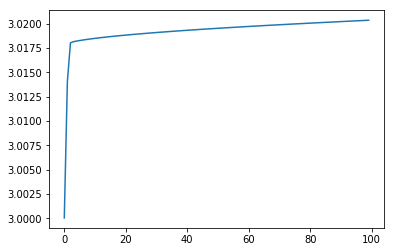

[[[3.23603063 2.42426438]
  [1.49256727 1.65059073]]

 [[3.10988183 2.33777499]
  [1.48140665 1.67826897]]]


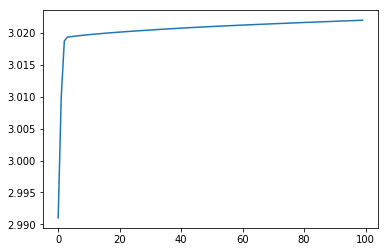

[[[2.54695762 2.67711402]
  [1.49748799 1.57699564]]

 [[2.72729076 2.80075296]
  [2.36987018 1.33559444]]]


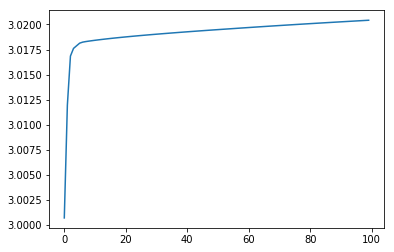

[[[3.97701321 2.02313293]
  [1.27327495 2.99249194]]

 [[3.64933892 1.79847483]
  [1.85234837 1.51733866]]]


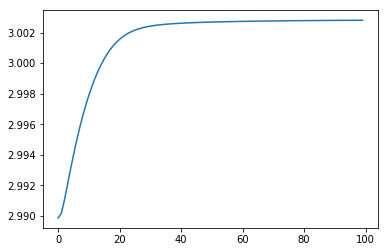

[[[4.28882112 1.71793437]
  [1.27327483 3.32242146]]

 [[4.01148986 1.52779216]
  [1.27327484 1.70088325]]]


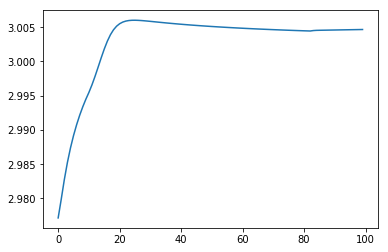

[[[4.0754806  2.41727994]
  [1.52021751 1.81549947]]

 [[3.27769222 1.87030503]
  [2.24626565 1.33559444]]]


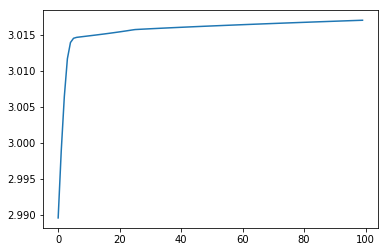

[[[2.8821367  2.87255788]
  [1.53866363 1.33559446]]

 [[2.59788679 2.67767215]
  [2.37362117 1.33559444]]]


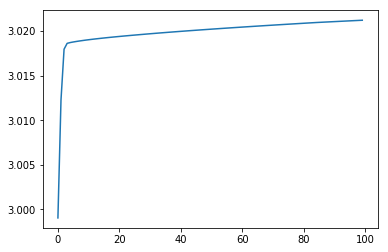

[[[1.92711598 2.89279892]
  [1.27327483 2.13200223]]

 [[2.39479135 3.21344371]
  [1.27327485 1.85886571]]]


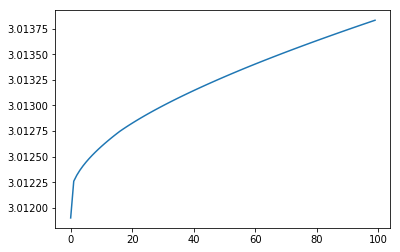

[[[4.07964952 1.93073148]
  [1.42162997 2.87840999]]

 [[3.76056129 1.71196011]
  [2.03816177 1.3494107 ]]]


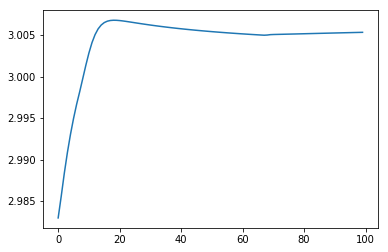

[[[3.09312019 2.35623474]
  [1.49346668 2.13717401]]

 [[3.14989486 2.39516025]
  [1.74683266 1.50882639]]]


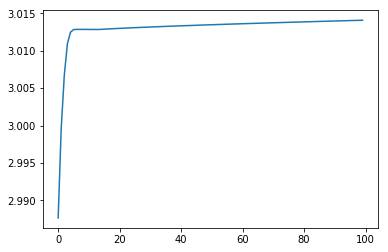

[[[2.24602726 3.42347677]
  [1.41326332 1.8162901 ]]

 [[1.93012112 3.20688708]
  [1.44890223 1.72790557]]]


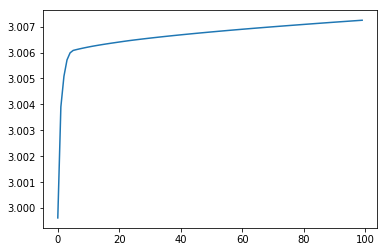

[[[3.84131955 1.62581115]
  [1.64933813 1.77157882]]

 [[4.01699631 1.7462576 ]
  [2.01696963 1.33559444]]]


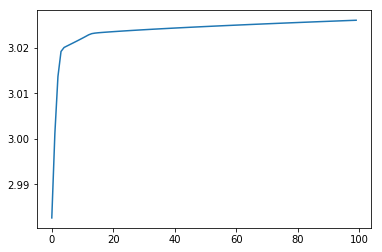

[[[1.47526202 3.74392276]
  [1.27327483 3.65985398]]

 [[1.46489863 3.73681748]
  [1.38385624 1.6126905 ]]]


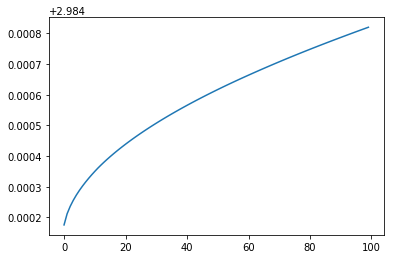

[[[1.84590495 3.23885198]
  [1.27327483 2.60423585]]

 [[2.0363585  3.3694296 ]
  [1.27327483 1.79619483]]]


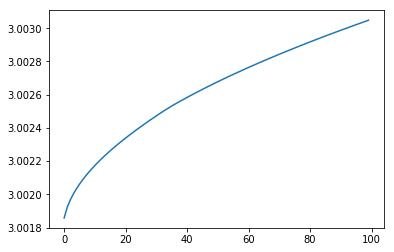

[[[4.0424913  2.07841698]
  [1.31836662 3.0879733 ]]

 [[3.60711335 1.77991575]
  [2.19776415 1.33559444]]]


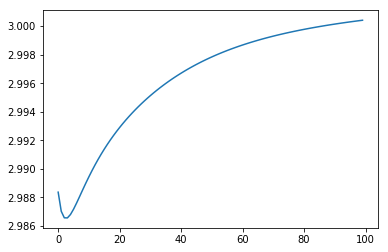

[[[1.59546001 3.35980175]
  [1.34320011 1.89833779]]

 [[1.86852134 3.54701644]
  [1.38526979 1.79400452]]]


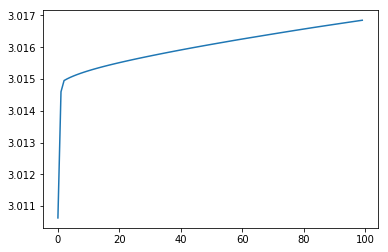

[[[3.97947204 2.46769123]
  [1.42044623 2.05269166]]

 [[3.2093438  1.9396805 ]
  [2.35473122 1.33559444]]]


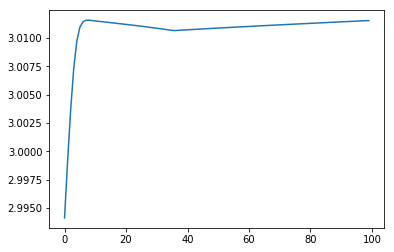

[0.84035247 1.09289203] 3.0261365378789975


[[[2.75957309 2.15037774]
  [1.65372553 1.49159095]]

 [[3.28992892 2.51399714]
  [2.10305279 1.33570125]]]


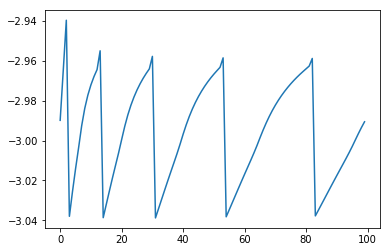

[[[4.11419769 1.96113528]
  [1.46292441 2.22419499]]

 [[3.73705889 1.70256363]
  [2.21643534 1.33559444]]]


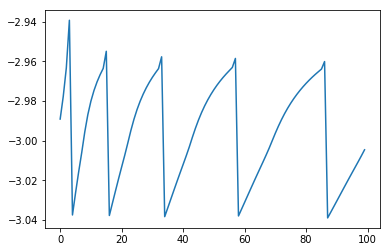

[[[4.2440076  1.64358484]
  [1.34677182 3.17647974]]

 [[4.07656601 1.52878454]
  [2.11413513 1.33559445]]]


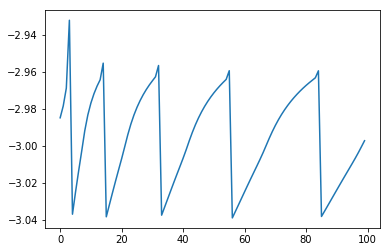

[[[3.24568199 2.53778754]
  [1.41266793 2.46127391]]

 [[2.99925339 2.36883263]
  [2.23131573 1.33559444]]]


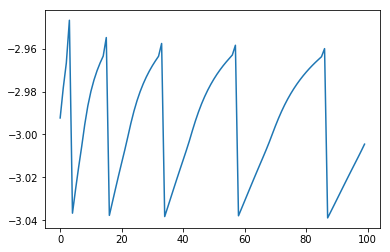

[[[1.78484849 2.93914807]
  [1.4494965  2.6549454 ]]

 [[2.32160161 3.30715355]
  [2.09620821 1.33559444]]]


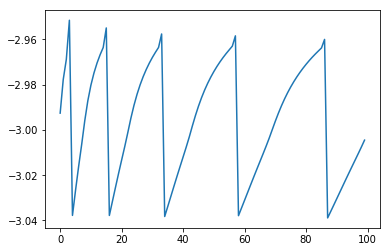

[[[1.89221475 3.04002002]
  [1.54217404 2.12031232]]

 [[2.24223612 3.27999958]
  [1.81287084 1.44898427]]]


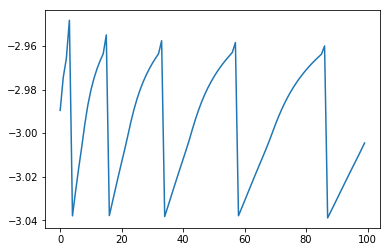

[[[3.6956051  2.0237026 ]
  [1.5167765  1.53037976]]

 [[3.59483939 1.95461621]
  [2.3491578  1.33559444]]]


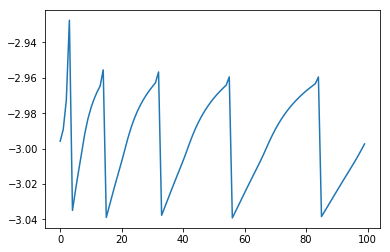

[[[4.28272544 1.83208611]
  [1.27327483 2.76029994]]

 [[3.89722051 1.56777853]
  [1.53592479 1.67237341]]]


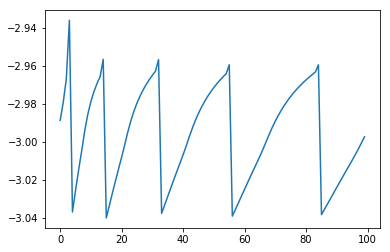

[[[3.8830432  2.00596855]
  [1.27327487 2.48413223]]

 [[3.64833487 1.84504923]
  [1.51546841 1.71705472]]]


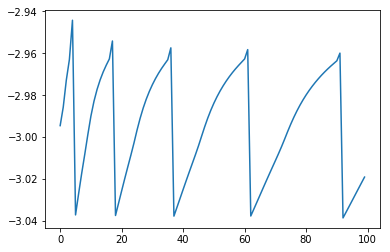

[[[2.14938488 2.49321026]
  [1.47503884 1.92792183]]

 [[2.8333024  2.96211371]
  [1.60483846 1.60601877]]]


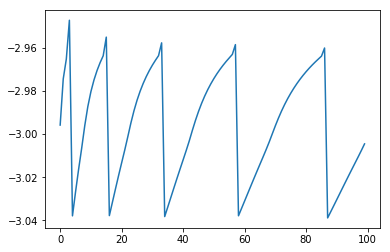

[[[4.03775503 1.61372217]
  [1.63957889 1.70387807]]

 [[4.06662314 1.63351454]
  [2.05830908 1.33559444]]]


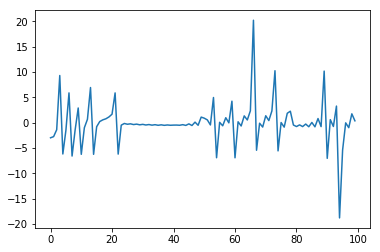

[[[2.08236116 3.36153363]
  [1.27327483 3.32404883]]

 [[1.96012561 3.27772722]
  [1.45658764 1.62870319]]]


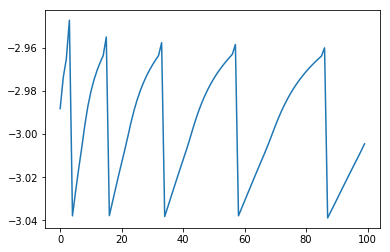

[[[3.63258759 2.6261926 ]
  [1.27327483 3.38365784]]

 [[2.98581695 2.18275757]
  [1.48766743 1.60859122]]]


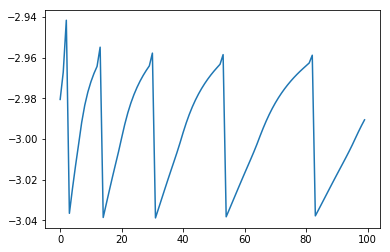

[[[3.85591443 2.49835549]
  [1.74305325 1.5805288 ]]

 [[3.15528055 2.01799107]
  [1.90435663 1.33559444]]]


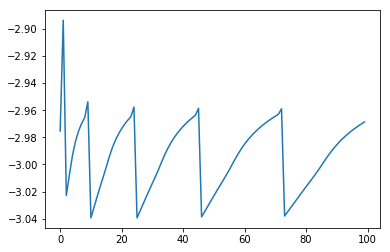

[[[2.74376495 2.85903978]
  [1.46648198 2.24382571]]

 [[2.58475993 2.7500237 ]
  [1.76305031 1.50833625]]]


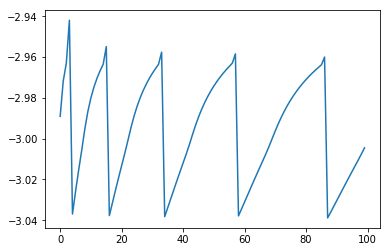

[[[3.80405453 1.65414388]
  [1.6653303  1.33559444]]

 [[3.98178209 1.77599639]
  [2.13411758 1.33559444]]]


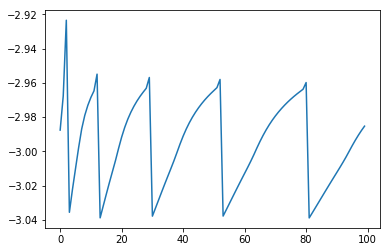

[[[4.1284182  1.74986918]
  [1.60884462 1.36619596]]

 [[3.94910593 1.62693017]
  [2.23057674 1.33559444]]]


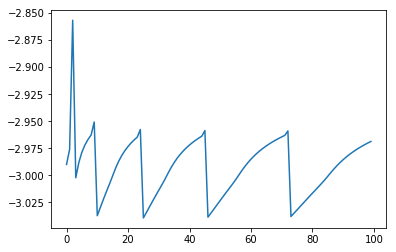

[[[3.94074249 1.61724747]
  [1.31103525 2.81073569]]

 [[4.04453672 1.68841025]
  [2.30534769 1.33559444]]]


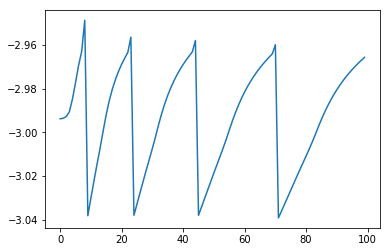

[[[3.79471979 1.82354836]
  [1.2732751  2.9858047 ]]

 [[3.81214779 1.83549724]
  [1.77756741 1.54758318]]]


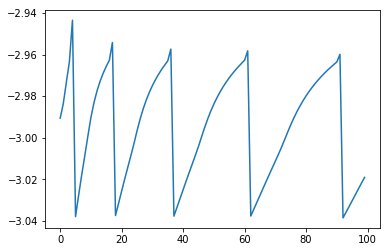

[[[1.9970409  3.53253476]
  [1.44569387 2.75553705]]

 [[1.77434585 3.3798519 ]
  [2.06939278 1.33559448]]]


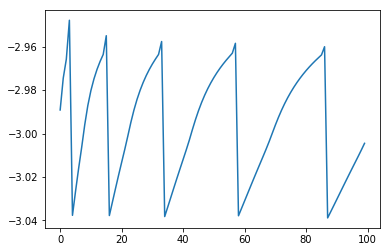

[[[3.83063847 2.18166112]
  [1.27327483 2.92632403]]

 [[3.46421549 1.93043638]
  [1.27327483 1.75344998]]]


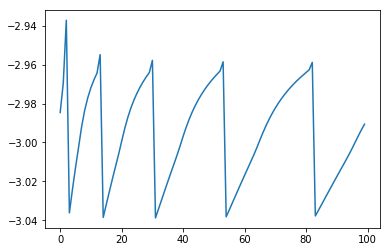

[[[2.05518687 3.46254935]
  [1.63418395 1.54043861]]

 [[1.85483143 3.32518285]
  [2.12376129 1.33559444]]]


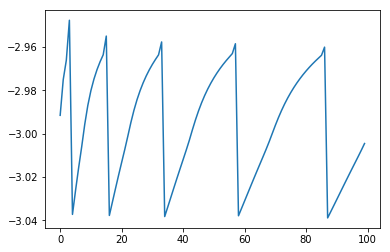

[[[2.2947025  2.35595983]
  [1.27327483 2.54397373]]

 [[2.99714131 2.83756173]
  [1.27327516 1.80419218]]]


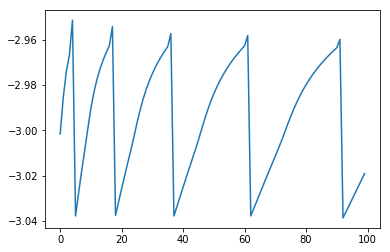

[[[3.64415065 2.86780684]
  [1.45067974 1.92654434]]

 [[2.74864284 2.25383411]
  [1.56648865 1.63933825]]]


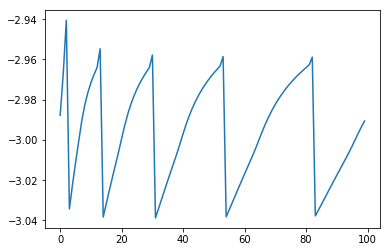

[[[4.01533921 1.65728068]
  [1.53243403 2.38947329]]

 [[4.01916931 1.65990665]
  [2.02913234 1.33559444]]]


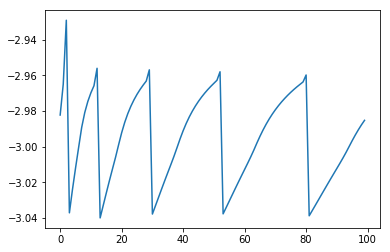

[1.3491898  0.79682147] 20.232520563049547
1.2041666666666666


[[[1.49458126 3.92893263]
  [1.44578258 2.60264836]]

 [[1.36774535 3.70787844]
  [2.21022437 1.30053174]]]


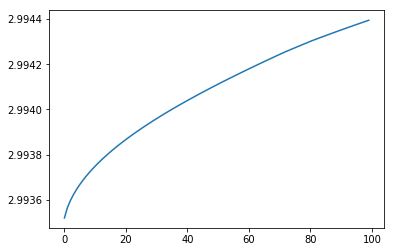

[[[2.72752962 3.47164977]
  [1.24470702 3.34396303]]

 [[1.97467699 2.95548344]
  [1.95388193 1.45204044]]]


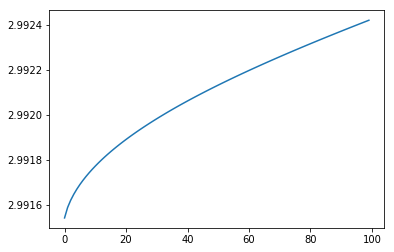

[[[1.3676443  3.93409335]
  [1.24470694 3.52047289]]

 [[1.3676443  3.75228087]
  [1.68318804 1.53488333]]]


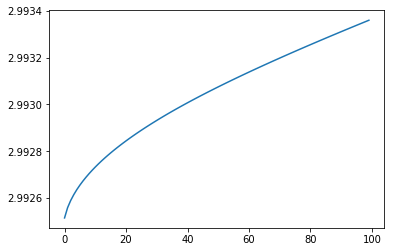

[[[3.81053387 2.19419594]
  [1.41649537 2.92852172]]

 [[3.44794276 1.94559839]
  [2.15548937 1.30051172]]]


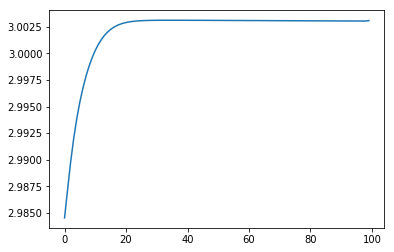

[[[2.01607774 3.21829207]
  [1.6712662  1.56591219]]

 [[2.08934474 3.26852495]
  [2.13439966 1.30051172]]]


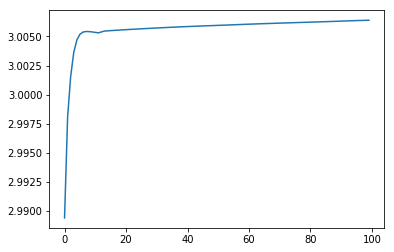

[[[4.05121475 1.52641592]
  [1.24470694 3.75968414]]

 [[4.15570549 1.59805624]
  [1.77769012 1.46603803]]]


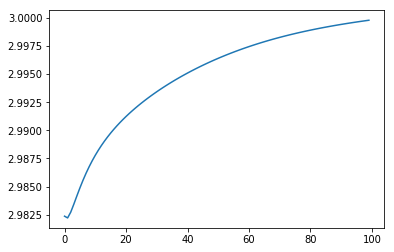

[[[2.18664326 2.84775162]
  [1.24470694 3.89289415]]

 [[2.4891654  3.05516504]
  [1.24470696 1.65759555]]]


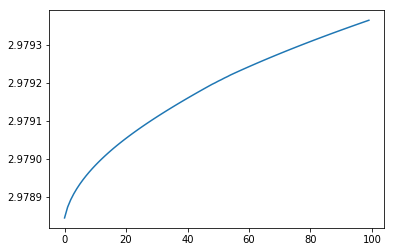

[[[2.76872812 2.59311184]
  [1.24470694 3.67142367]]

 [[2.85302462 2.6509067 ]
  [1.79199112 1.472137  ]]]


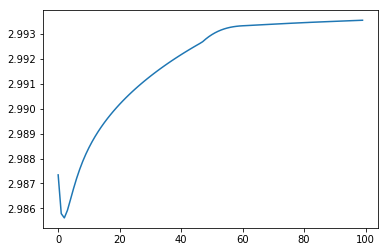

[[[1.93966972 2.97887445]
  [1.24470694 2.34645519]]

 [[2.31191416 3.23409047]
  [1.24470697 1.86282597]]]


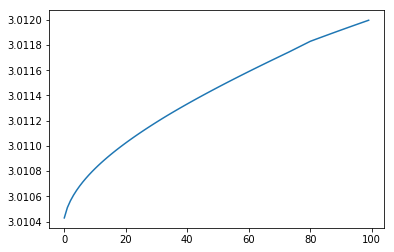

[[[4.32435356 2.56803908]
  [1.24470694 2.1620499 ]]

 [[3.17602011 1.78072555]
  [1.25174731 1.88453483]]]


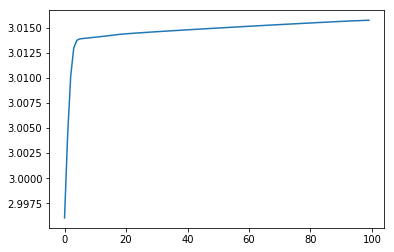

[[[2.70080515 3.14425776]
  [1.24470701 2.45435537]]

 [[2.29393348 2.86530084]
  [1.45468359 1.76607467]]]


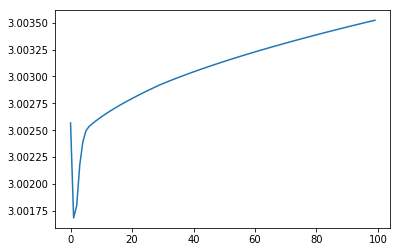

[[[2.50229817 3.50449515]
  [1.58183558 2.02823439]]

 [[1.89896574 3.09084197]
  [2.14720683 1.30051172]]]


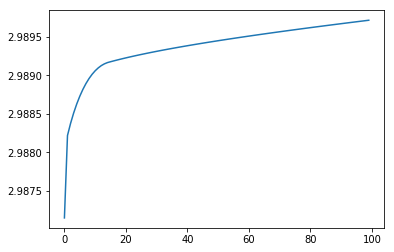

[[[3.18051118 2.55956435]
  [1.48343056 2.76816838]]

 [[2.96518628 2.41193458]
  [2.08313396 1.3005122 ]]]


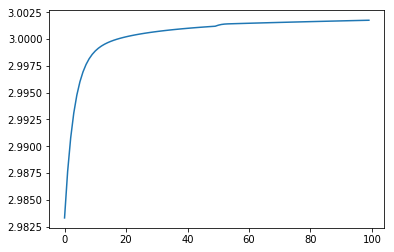

[[[3.64049994 3.10462341]
  [1.60473058 1.67222026]]

 [[2.51330633 2.33180366]
  [2.22426852 1.30051172]]]


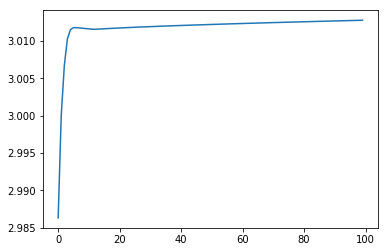

[[[4.6036616  1.90745114]
  [1.37477465 2.94712197]]

 [[3.88406022 1.41408245]
  [2.22808776 1.30051172]]]


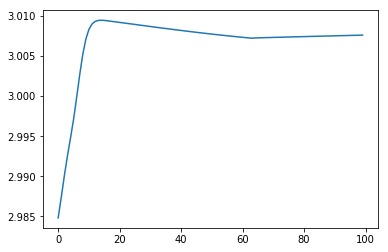

[[[4.26842945 2.06852947]
  [1.24470694 3.48149514]]

 [[3.6602135  1.65152808]
  [1.40047281 1.65104315]]]


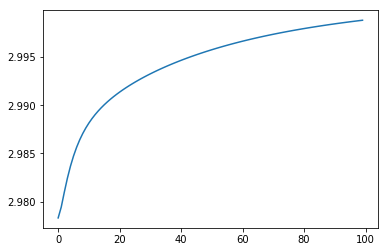

[[[2.42889921 2.92880623]
  [1.41142613 1.85725072]]

 [[2.455288   2.94689875]
  [1.46829294 1.71622103]]]


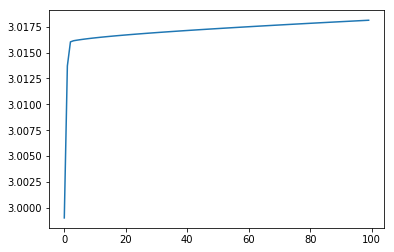

[[[3.8674516  2.92693548]
  [1.29737508 3.05420588]]

 [[2.73285665 2.14904125]
  [1.94174671 1.45616367]]]


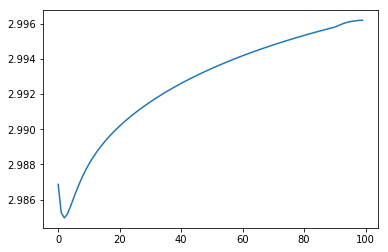

[[[3.56939962 2.56327242]
  [1.24470694 3.27432778]]

 [[3.03604729 2.19759857]
  [1.24470696 1.73968649]]]


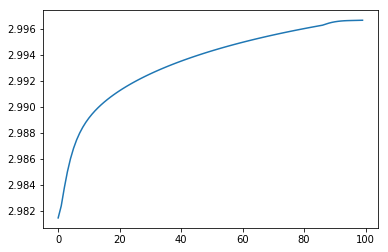

[[[1.80113499 3.06587739]
  [1.49229252 2.5511172 ]]

 [[2.19916027 3.33876911]
  [2.13975386 1.30051172]]]


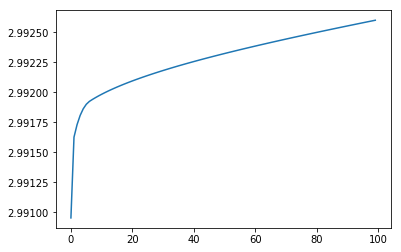

[[[4.22114108 2.38232154]
  [1.3552273  2.98567872]]

 [[3.34024636 1.77836776]
  [1.99386624 1.40185415]]]


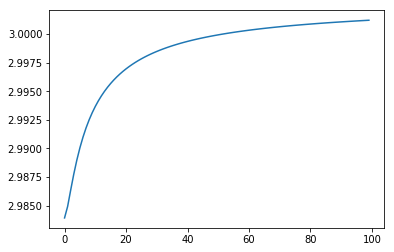

[[[1.60915508 3.80678864]
  [1.54013806 2.12999664]]

 [[1.42827356 3.68277371]
  [2.19164811 1.30051172]]]


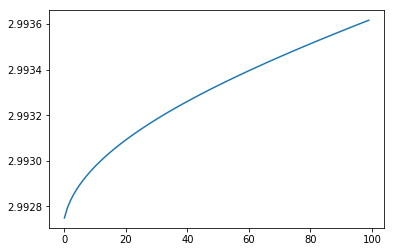

[[[4.35486545 1.46386524]
  [1.60468701 1.3384647 ]]

 [[4.27587858 1.40971073]
  [2.33717827 1.30051172]]]


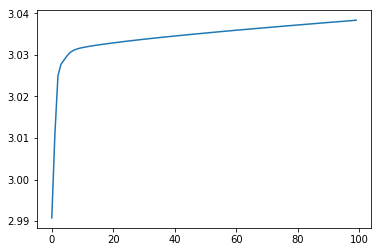

[[[2.43437561 2.76441896]
  [1.60234817 1.75102177]]

 [[2.61921178 2.89114523]
  [2.20213408 1.30051172]]]


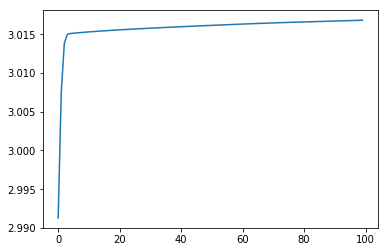

[[[4.08062672 1.53395561]
  [1.433145   2.68904375]]

 [[4.15387234 1.58417383]
  [2.20496443 1.30051172]]]


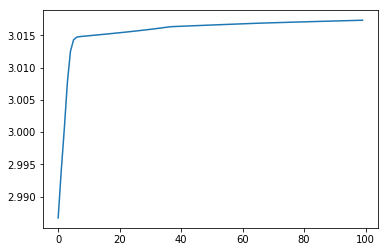

[0.76600312 1.13615273] 3.0383085694049976


[[[1.49458126 3.92893263]
  [1.44578258 2.60264836]]

 [[1.36774535 3.70787844]
  [2.21022437 1.30053174]]]


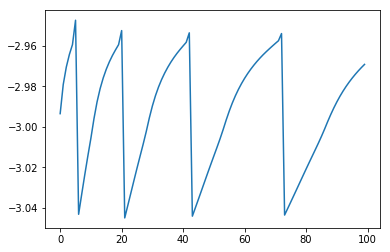

[[[1.84483678 2.71914789]
  [1.24470694 2.77351331]]

 [[2.55107426 3.20335422]
  [1.47896902 1.71418489]]]


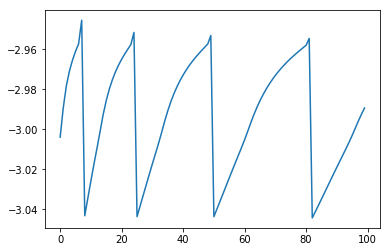

[[[3.79944223 2.22151128]
  [1.63101733 2.02713384]]

 [[3.41875301 1.96050541]
  [1.89945329 1.36141265]]]


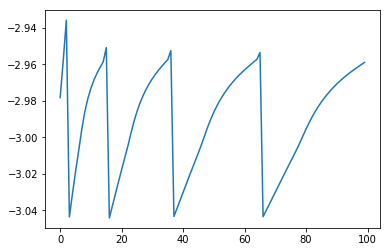

[[[2.00832475 3.29025337]
  [1.24470694 3.92351853]]

 [[2.01655985 3.29589947]
  [2.04851515 1.33797608]]]


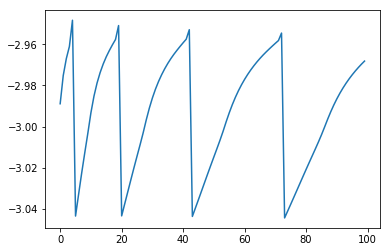

[[[2.67718761 2.98671235]
  [1.5549014  1.95260316]]

 [[2.44550219 2.82786558]
  [1.74151263 1.48980732]]]


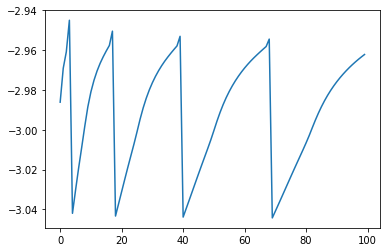

[[[2.04146249 2.7289399 ]
  [1.24470694 2.84951487]]

 [[2.57905796 3.0975229 ]
  [1.4565459  1.71290136]]]


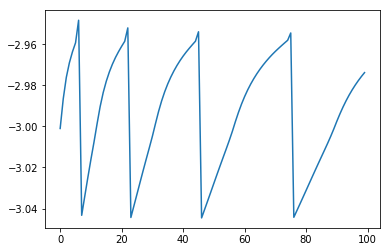

[[[4.3020444  1.77409542]
  [1.24470694 3.87451383]]

 [[3.95838013 1.53847438]
  [2.06183147 1.33925191]]]


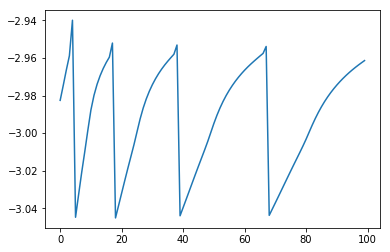

[[[3.92892509 2.43375495]
  [1.24470694 2.52364797]]

 [[3.23327981 1.95681079]
  [1.3312729  1.80532678]]]


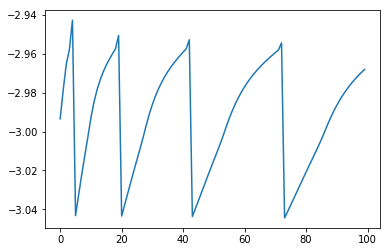

[[[4.26854885 1.75959904]
  [1.65790787 1.30051173]]

 [[3.96632327 1.55238895]
  [2.24937748 1.30051172]]]


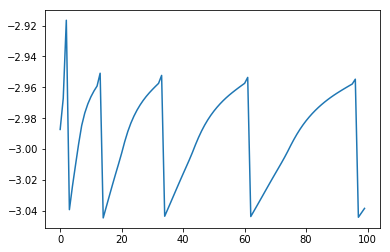

[[[1.63847079 3.41630959]
  [1.24470694 3.36788665]]

 [[1.82077714 3.54130138]
  [1.65233762 1.56724441]]]


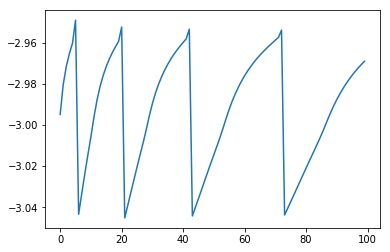

[[[4.40585626 1.63706087]
  [1.24470694 2.97472737]]

 [[4.1140501  1.43699446]
  [1.24470694 1.77944696]]]


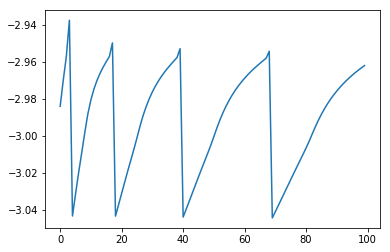

[[[4.08787984 2.89037653]
  [1.51566235 1.52612931]]

 [[2.81132669 2.01515378]
  [2.44206693 1.30051172]]]


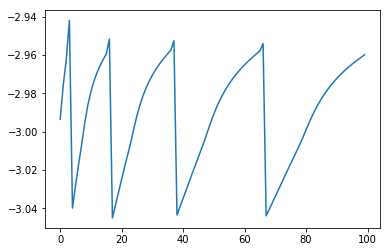

[[[3.09571347 2.30950491]
  [1.33252116 3.29809568]]

 [[3.19669161 2.37873693]
  [2.18933306 1.30051185]]]


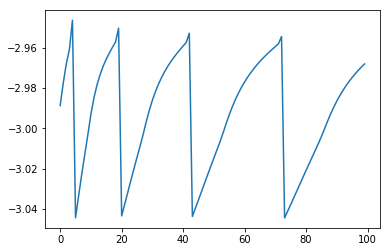

[[[3.69105792 1.90074982]
  [1.24470694 3.65459635]]

 [[3.71578893 1.91770575]
  [1.24470694 1.68922044]]]


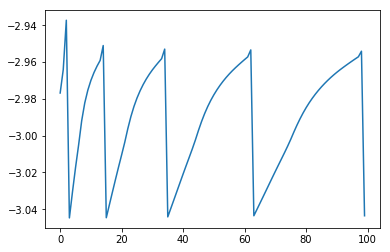

[[[4.07071734 2.7715919 ]
  [1.24470694 3.73354423]]

 [[2.92572859 1.98657153]
  [1.24470695 1.67874314]]]


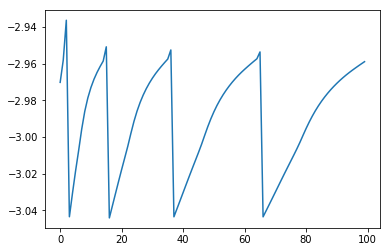

[[[3.06461996 2.16846888]
  [1.24470694 3.92232971]]

 [[3.33047004 2.35073943]
  [1.24470744 1.65368892]]]


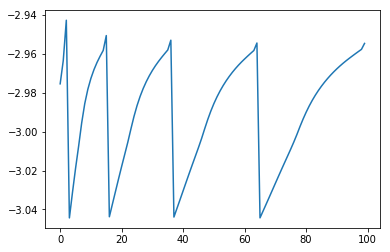

[[[4.73163831 1.29937306]
  [1.72159376 1.73377095]]

 [[4.35031701 1.29937306]
  [1.88008388 1.34071545]]]


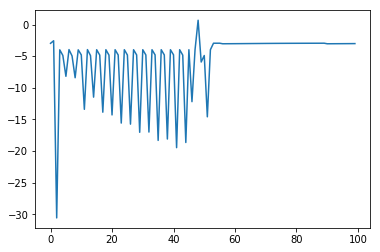

[[[2.09423993 3.23663366]
  [1.24470694 3.59741193]]

 [[2.08615265 3.23108891]
  [1.57493886 1.56716858]]]


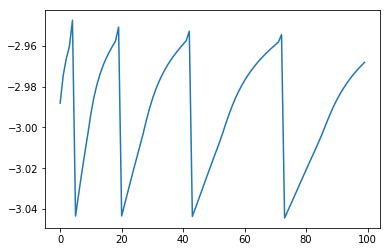

[[[2.52892746 3.23273952]
  [1.4712191  1.75876945]]

 [[2.17332382 2.98893267]
  [2.4474561  1.30051172]]]


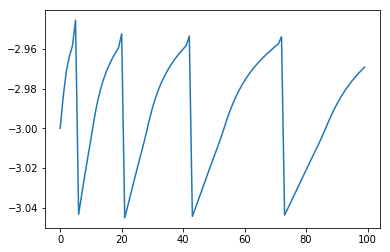

[[[3.69792019 2.33332692]
  [1.45489862 2.57365527]]

 [[3.28850871 2.05262866]
  [1.92414683 1.40991971]]]


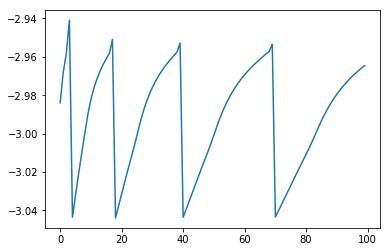

[[[2.0002964  2.43769258]
  [1.4226114  2.91347937]]

 [[2.85973455 3.02693543]
  [2.1490102  1.30051172]]]


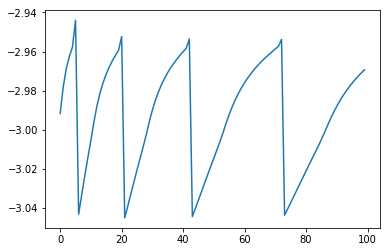

[[[2.29925598 3.62226735]
  [1.24470694 3.7451485 ]]

 [[1.74336219 3.24113877]
  [1.38577823 1.62182201]]]


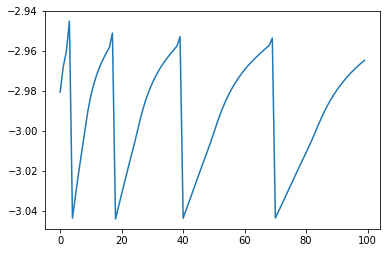

[[[2.12013097 3.19270789]
  [1.56691358 1.62851639]]

 [[2.13463642 3.20265303]
  [2.31054784 1.30051172]]]


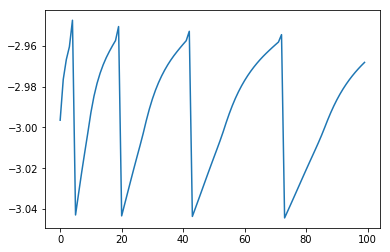

[[[3.12231698 2.20273148]
  [1.64830654 1.93917146]]

 [[3.30758111 2.32975117]
  [2.05163043 1.30051172]]]


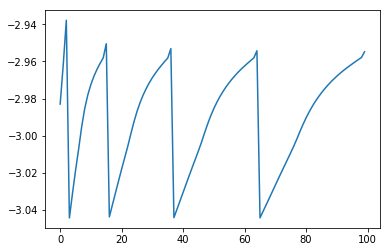

[[[4.40903311 1.78843733]
  [1.24470694 3.77813555]]

 [[3.96467585 1.48377976]
  [1.24470694 1.67282535]]]


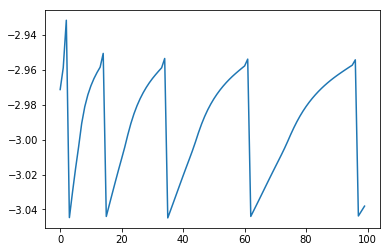

[1.28539203 0.83394265] 0.6745772697069761
1.3145833333333334


[[[1.81370607 3.3016649 ]
  [1.21916295 3.71256453]]

 [[1.96795245 3.40741838]
  [1.21924281 1.71048499]]]


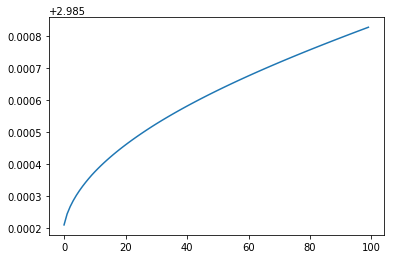

[[[3.92170727 1.85059668]
  [1.21912551 3.94200005]]

 [[3.80968704 1.77379404]
  [1.21912551 1.68011007]]]


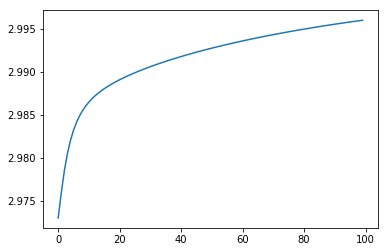

[[[2.68119061 2.69779624]
  [1.68309276 1.93889313]]

 [[2.73252621 2.73299265]
  [2.06597351 1.26909651]]]


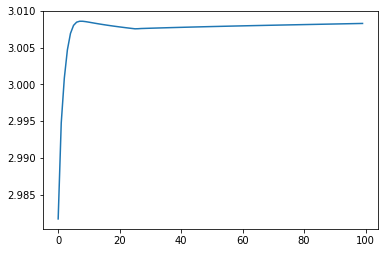

[[[2.94216222 2.56914494]
  [1.84597386 1.3176236 ]]

 [[2.91001156 2.54710199]
  [1.96801764 1.26909651]]]


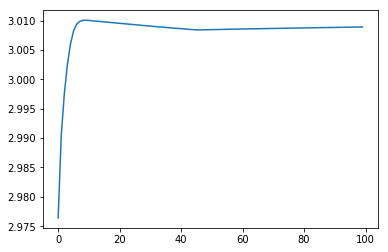

[[[3.28505384 2.24319944]
  [1.21912551 4.17325627]]

 [[3.29867603 2.252539  ]
  [1.21912552 1.64941968]]]


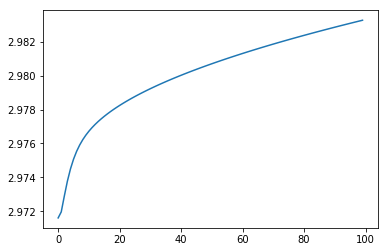

[[[3.36048909 3.09852972]
  [1.43360349 1.7669757 ]]

 [[2.46567663 2.48503374]
  [1.45354063 1.71753097]]]


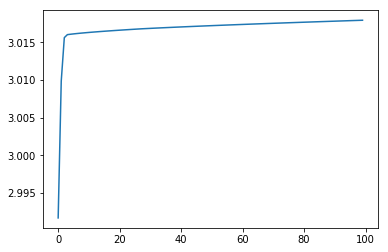

[[[1.48911452 3.82926477]
  [1.21912551 3.08028235]]

 [[1.38299715 3.75650921]
  [1.3594002  1.73940164]]]


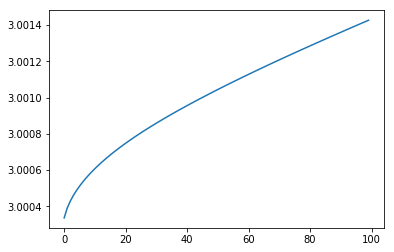

[[[2.58173176 3.39319324]
  [1.37474279 2.55920259]]

 [[2.02446754 3.01112506]
  [2.43930907 1.26909651]]]


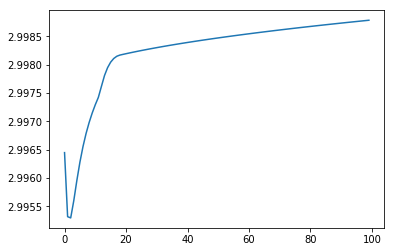

[[[2.06109496 3.29245085]
  [1.72630448 1.34795439]]

 [[2.02449661 3.26735851]
  [2.18403719 1.26909651]]]


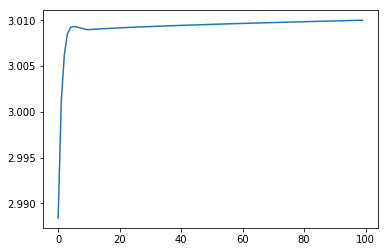

[[[3.61854801 1.87049455]
  [1.42757334 2.72514437]]

 [[3.73186837 1.94818857]
  [1.96416913 1.39438681]]]


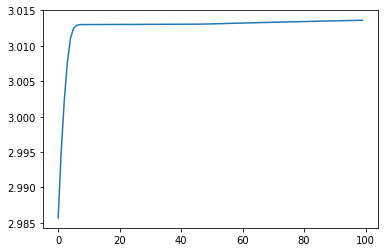

[[[2.29555936 3.29645691]
  [1.23173551 3.60006534]]

 [[2.06546523 3.13870114]
  [2.35784169 1.26909665]]]


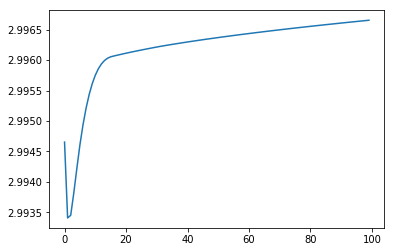

[[[2.22022064 3.22235445]
  [1.65765828 1.96640766]]

 [[2.12444608 3.15669007]
  [2.10476409 1.26909651]]]


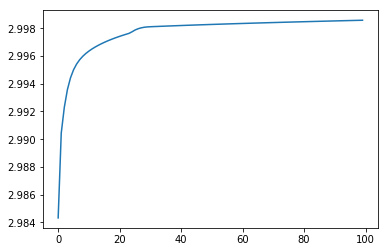

[[[2.48359666 2.39322741]
  [1.30178216 2.94633163]]

 [[2.99642049 2.74482663]
  [2.44639383 1.26909651]]]


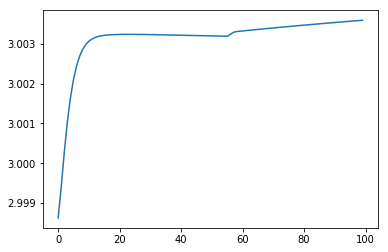

[[[4.2024633  1.79035617]
  [1.44640572 2.30643819]]

 [[3.9231832  1.59887781]
  [1.76603503 1.5137575 ]]]


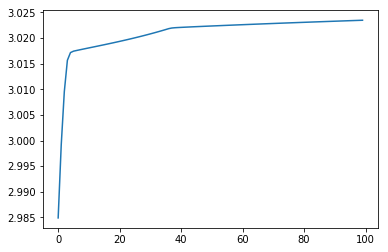

[[[2.32873957 2.70191087]
  [1.70675224 1.26909651]]

 [[2.66089816 2.92964346]
  [2.24766511 1.26909651]]]


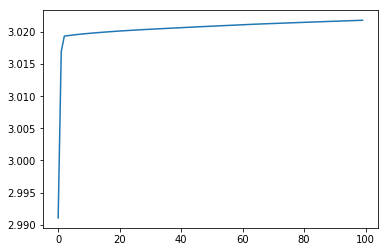

[[[3.5153351  1.92710262]
  [1.54989011 2.3127643 ]]

 [[3.6559994  2.02354403]
  [1.92921324 1.37204294]]]


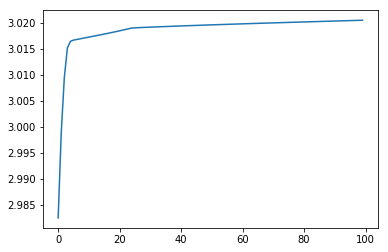

[[[2.24683945 2.62967552]
  [1.21912551 4.08436003]]

 [[2.71677152 2.95186754]
  [1.36209195 1.60509215]]]


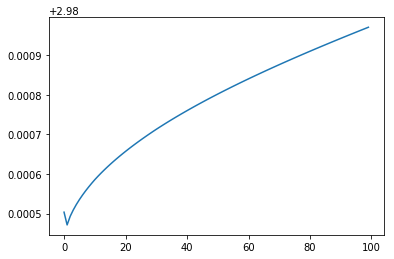

[[[2.81818314 2.73466796]
  [1.61521454 1.86292591]]

 [[2.72225007 2.6688949 ]
  [2.21999987 1.26909651]]]


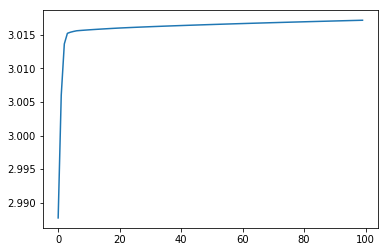

[[[1.9108253  2.89514133]
  [1.5897511  1.88978887]]

 [[2.3893482  3.22322335]
  [1.76122374 1.46453689]]]


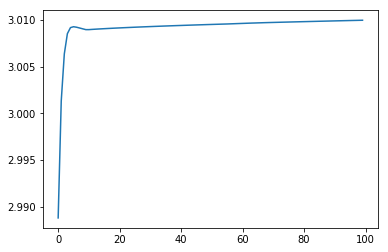

[[[4.26584677 2.27877994]
  [1.21912551 3.27637652]]

 [[3.45140327 1.72038605]
  [1.65329688 1.59800108]]]


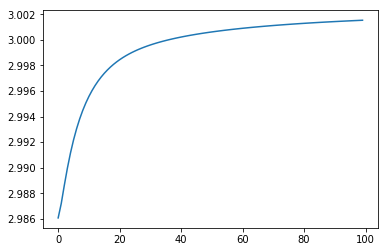

[[[2.9755992  2.21778681]
  [1.21912551 3.63760319]]

 [[3.2645442  2.41589156]
  [1.21912551 1.72050707]]]


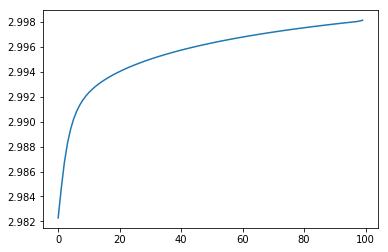

[[[4.45803688 1.462638  ]
  [1.21912551 4.11408793]]

 [[4.29686849 1.35213872]
  [1.21912551 1.65727201]]]


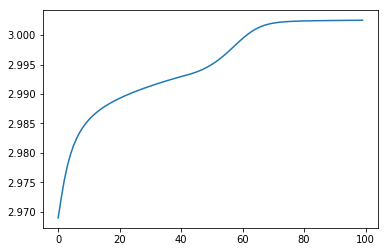

[[[2.82786517 2.01991129]
  [1.5279344  2.58256398]]

 [[3.43228346 2.43430895]
  [2.14175424 1.26909651]]]


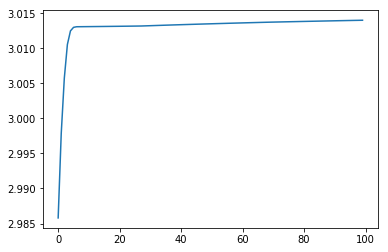

[[[1.53788683 3.9709754 ]
  [1.28646214 2.74855955]]

 [[1.3292112  3.70223258]
  [2.54221883 1.26909651]]]


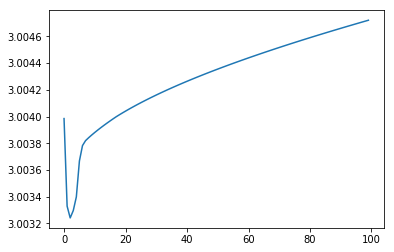

[[[2.69112921 2.15005414]
  [1.6964572  1.7754526 ]]

 [[3.27713149 2.55182552]
  [2.0959555  1.26909651]]]


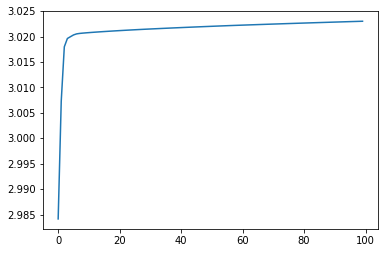

[0.85665086 1.0834087 ] 3.023468263797173


[[[1.81370607 3.3016649 ]
  [1.21916295 3.71256453]]

 [[1.96795245 3.40741838]
  [1.21924281 1.71048499]]]


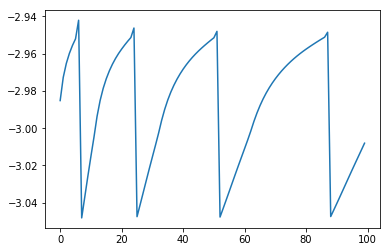

[[[1.95202862 2.98921329]
  [1.72584263 1.26909761]]

 [[2.30403921 3.2305567 ]
  [2.2115683  1.26909651]]]


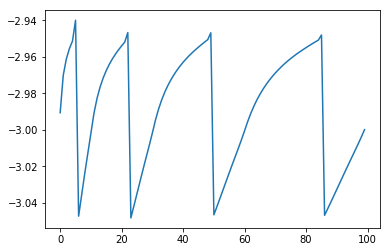

[[[3.83833757 1.95415537]
  [1.21912551 3.064812  ]]

 [[3.6911028  1.85320914]
  [1.21912551 1.79652312]]]


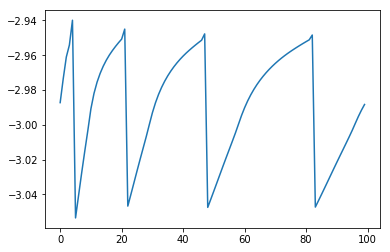

[[[1.82628187 2.89828939]
  [1.75234525 1.43600522]]

 [[2.3700254  3.27108758]
  [1.76597559 1.40220204]]]


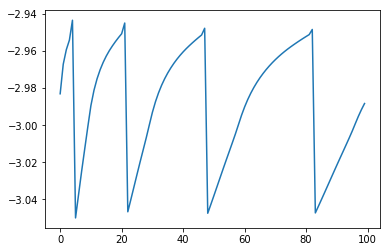

[[[1.32921114 4.04548799]
  [1.46201078 2.65823947]]

 [[1.32921112 3.73470255]
  [2.2408214  1.26909651]]]


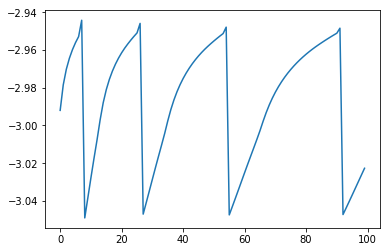

[[[4.64769708 1.76808562]
  [1.23430008 3.62806867]]

 [[4.0305829  1.34498353]
  [2.34352628 1.26909651]]]


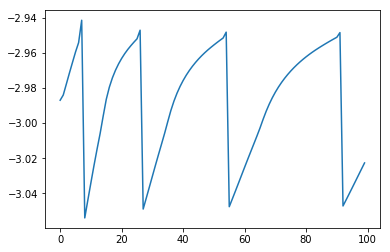

[[[2.45481517 2.9167096 ]
  [1.21912551 2.28436403]]

 [[2.47224038 2.92865656]
  [1.35806122 1.8455549 ]]]


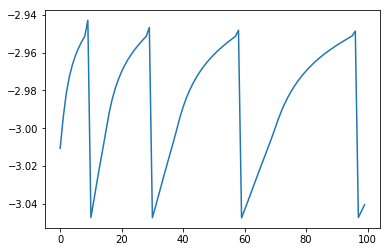

[[[4.85455679 1.26807688]
  [1.21912551 3.08453988]]

 [[4.35506857 1.26807688]
  [1.21912551 1.793905  ]]]


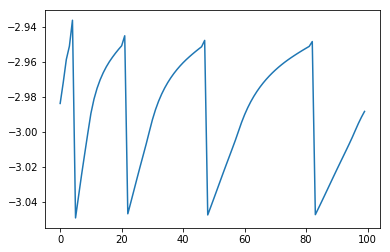

[[[1.68932042 3.65545768]
  [1.28176053 2.02818561]]

 [[1.5935762  3.5898141 ]
  [1.36088771 1.83194989]]]


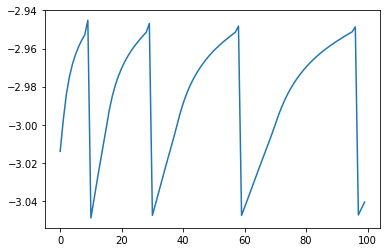

[[[3.51674351 2.69853241]
  [1.34828308 2.25327551]]

 [[2.89194015 2.27015845]
  [1.58571788 1.66443616]]]


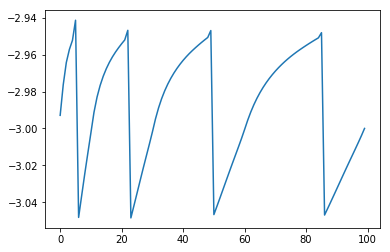

[[[3.0344174  2.65254765]
  [1.21912551 3.76239796]]

 [[2.84505829 2.52272039]
  [1.2410513  1.69533783]]]


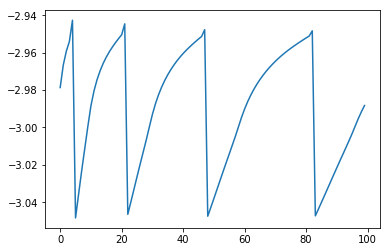

[[[2.24164719 3.31667502]
  [1.39543056 2.17610792]]

 [[2.03510032 3.17506359]
  [2.52969892 1.26909651]]]


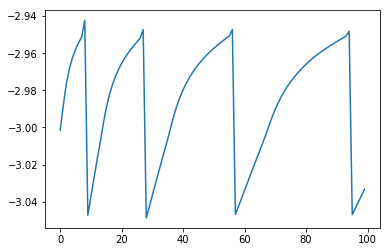

[[[3.72612506 2.20965008]
  [1.69442891 1.77661516]]

 [[3.41645296 1.99733454]
  [2.09939762 1.26909651]]]


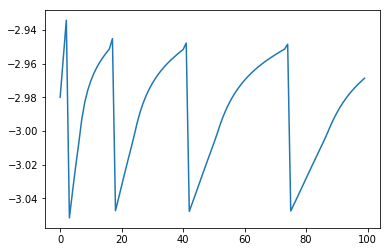

[[[2.93890347 3.01766827]
  [1.21912551 2.26047808]]

 [[2.46499206 2.69274796]
  [1.21912605 1.90326736]]]


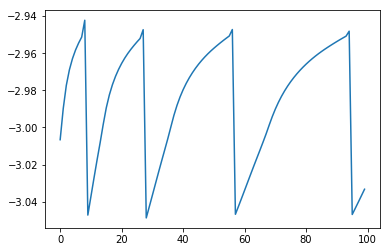

[[[1.44355726 3.97326412]
  [1.21912556 3.70560058]]

 [[1.32921112 3.73610378]
  [2.13697065 1.35115963]]]


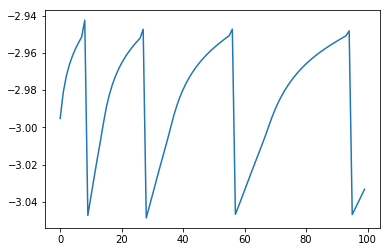

[[[4.52186911 1.87932763]
  [1.33345879 2.52281187]]

 [[3.89624846 1.45039334]
  [2.52967162 1.26909651]]]


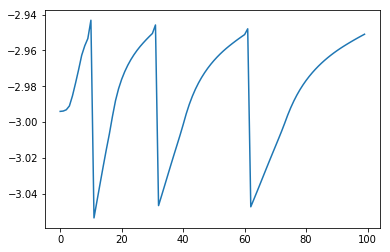

[[[4.62106567 1.26807752]
  [1.21912551 3.80949985]]

 [[4.44787221 1.26807691]
  [2.31088511 1.26909651]]]


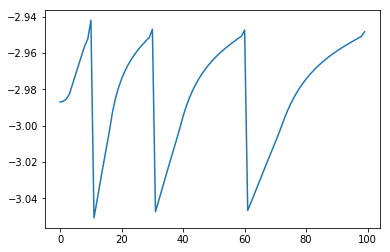

[[[2.61359637 3.22318905]
  [1.21912553 3.86698013]]

 [[2.19901415 2.93894566]
  [2.29145363 1.26909651]]]


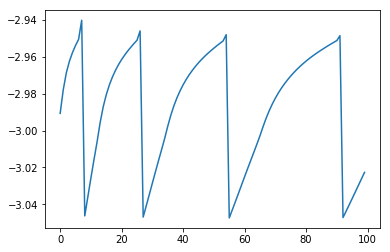

[[[3.97777419 2.28633584]
  [1.55454894 1.73138607]]

 [[3.3887045  1.88246139]
  [2.37917503 1.26909651]]]


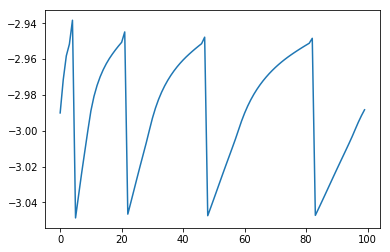

[[[2.50873383 2.82609576]
  [1.38030445 2.04110829]]

 [[2.57235429 2.86971484]
  [2.60393678 1.26909651]]]


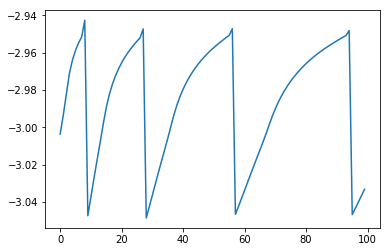

[[[1.50729244 4.06359964]
  [1.21912579 2.60848094]]

 [[1.32921112 3.65704382]
  [1.48815096 1.75147059]]]


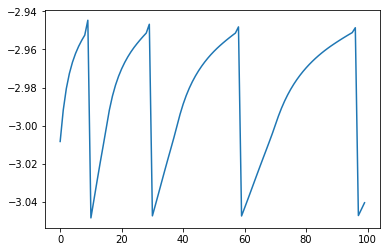

[[[2.62110989 2.56681714]
  [1.54035268 2.27835649]]

 [[2.85078456 2.72428531]
  [2.22111207 1.26909651]]]


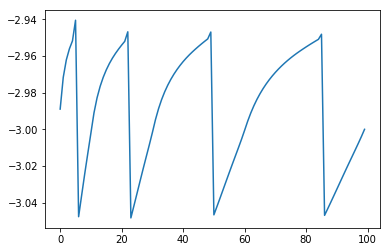

[[[4.59903814 2.63219317]
  [1.26677884 2.55590523]]

 [[3.16510299 1.6490671 ]
  [1.62412073 1.66969731]]]


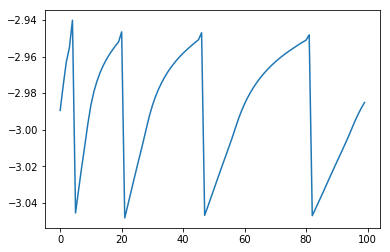

[[[2.86841753 2.61096633]
  [1.21912551 3.61038668]]

 [[2.85444109 2.60138389]
  [1.21912585 1.72411889]]]


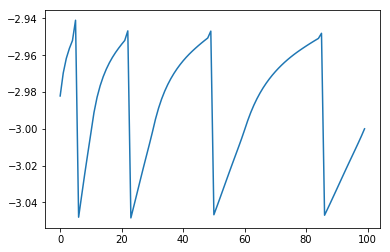

[[[2.59558838 3.51150991]
  [1.50975144 1.62642879]]

 [[1.90989569 3.04138938]
  [2.49936014 1.26909651]]]


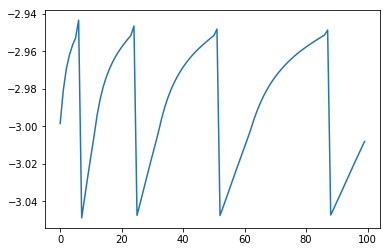

[1.30659704 0.82160436] -2.9342457551790826
1.425


[[[2.58946904 3.50317511]
  [1.19626389 3.68601945]]

 [[1.91698093 3.04210782]
  [1.19636276 1.73998768]]]


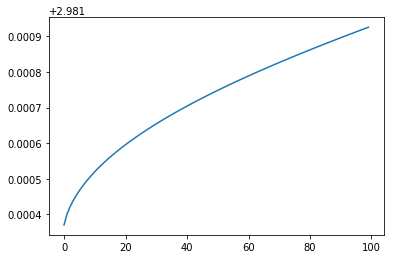

[[[1.96140048 3.63136099]
  [1.19621833 3.03334732]]

 [[1.66959837 3.43129736]
  [1.19621834 1.82669537]]]


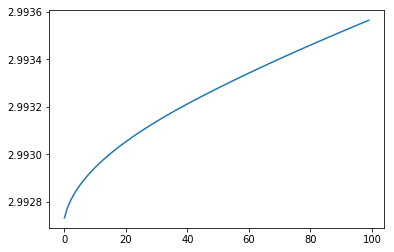

[[[4.64676692 2.43210457]
  [1.557281   1.68686025]]

 [[3.37249765 1.55844767]
  [1.60098429 1.5784761 ]]]


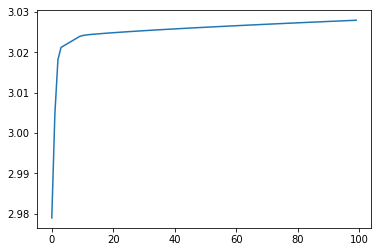

[[[4.59208497 2.2158296 ]
  [1.19621833 3.50397695]]

 [[3.57630149 1.51939419]
  [1.1962184  1.76423732]]]


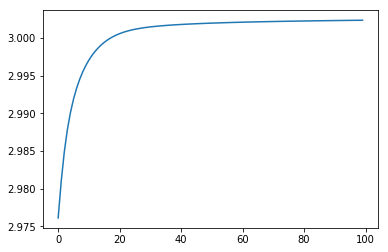

[[[2.86119194 2.73679175]
  [1.19621876 3.5313232 ]]

 [[2.72838896 2.64574016]
  [2.51989411 1.24096542]]]


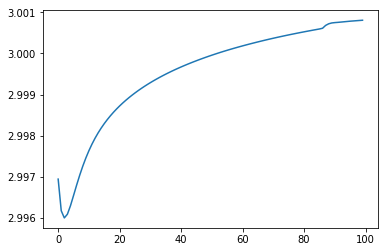

[[[2.83862122 2.99663164]
  [1.19621833 4.09669192]]

 [[2.46661482 2.74157883]
  [1.19621834 1.68557718]]]


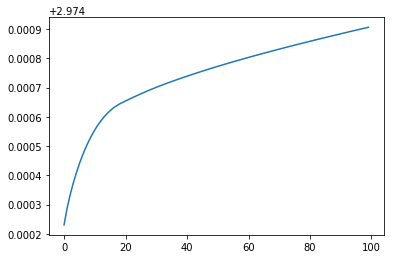

[[[2.66667301 3.90118086]
  [1.19621833 4.47080107]]

 [[1.53743563 3.12695987]
  [2.20230076 1.24096541]]]


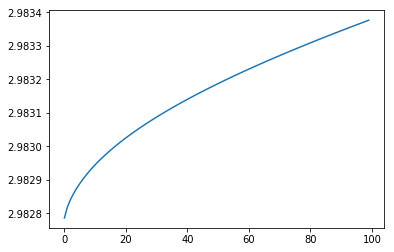

[[[3.03157832 2.49764878]
  [1.19621833 4.09154969]]

 [[2.99798725 2.47461827]
  [1.19621847 1.68625956]]]


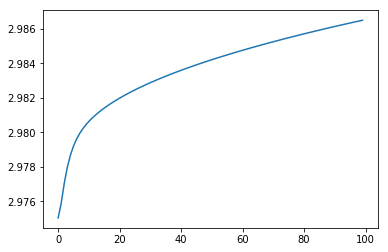

[[[4.53248413 1.48701005]
  [1.19621846 2.44509926]]

 [[4.28698941 1.31869551]
  [1.30823984 1.86078575]]]


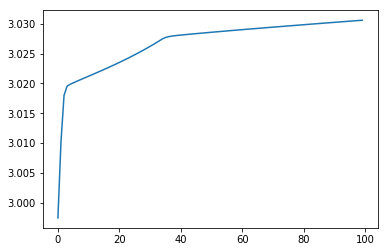

[[[2.23710609 3.77378675]
  [1.19621833 3.29614769]]

 [[1.58132571 3.32417452]
  [2.59939693 1.24096541]]]


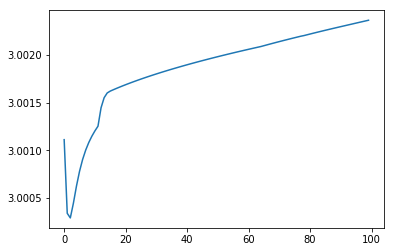

[[[4.33506798 2.81639227]
  [1.19621854 3.84249927]]

 [[2.93200642 1.85443357]
  [2.1430205  1.34762018]]]


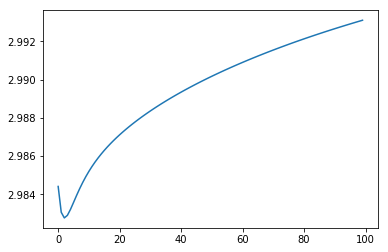

[[[5.1024568  2.17950211]
  [1.91182304 1.26899816]]

 [[3.69399743 1.24005248]
  [1.93160467 1.24096542]]]


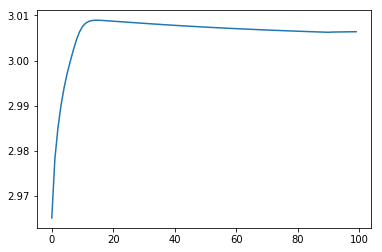

[[[1.2947957  4.12177284]
  [1.21492872 3.11505735]]

 [[1.2947957  3.73330762]
  [2.62523729 1.24096541]]]


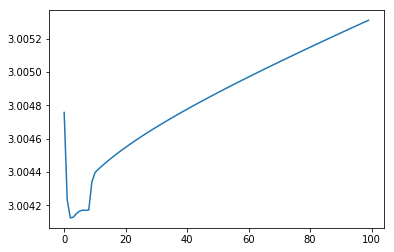

[[[3.49332059 1.99357305]
  [1.19621833 4.29722431]]

 [[3.58592145 2.05706151]
  [2.26097906 1.24096542]]]


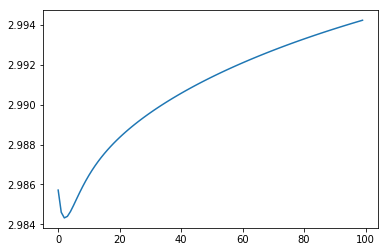

[[[2.6215752  2.60701865]
  [1.59375771 1.4416715 ]]

 [[2.81104227 2.73691992]
  [2.47463536 1.24096541]]]


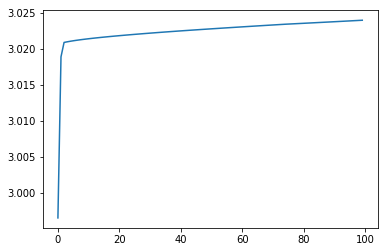

[[[2.22319143 2.9793545 ]
  [1.28857161 3.60395216]]

 [[2.36577873 3.07711436]
  [2.32071918 1.24096543]]]


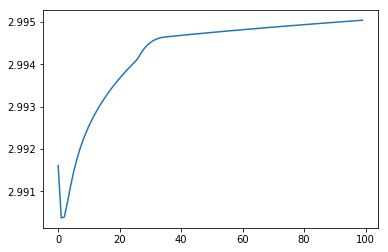

[[[3.8529208  1.59478517]
  [1.68070926 1.54241978]]

 [[4.04996023 1.72987816]
  [2.27616746 1.24096541]]]


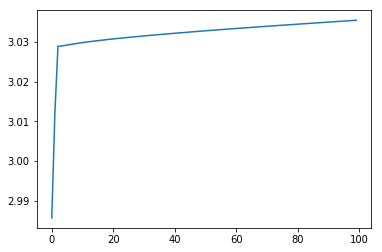

[[[2.97846685 2.72180031]
  [1.19621833 4.52177666]]

 [[2.7657195  2.57593774]
  [1.19621834 1.6291635 ]]]


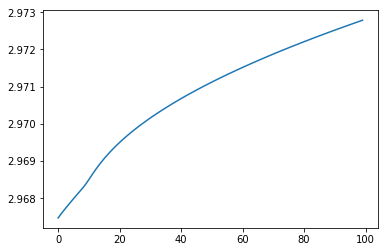

[[[3.52575169 3.30856269]
  [1.19621834 4.44713892]]

 [[2.28925139 2.46080073]
  [2.21029959 1.24096551]]]


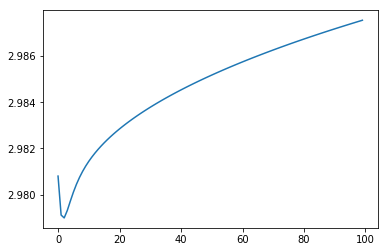

[[[5.29893718 1.24005238]
  [1.19621833 3.14160109]]

 [[4.22644688 1.24005238]
  [1.3643389  1.74632885]]]


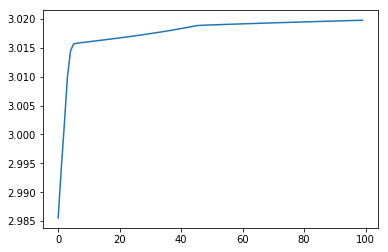

[[[4.99292112 1.90963463]
  [1.20472249 2.38948652]]

 [[3.91291926 1.24005238]
  [1.43802158 1.81090465]]]


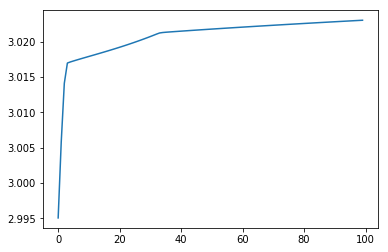

[[[3.50291553 1.69358577]
  [1.62361448 1.24096542]]

 [[3.8849865  1.95553898]
  [2.48603111 1.24096541]]]


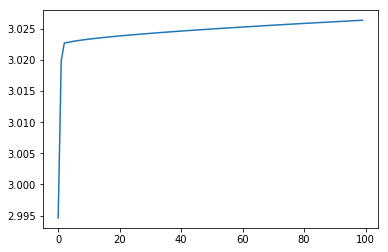

[[[2.05908097 2.55296762]
  [1.30632787 2.59075287]]

 [[2.75678729 3.03132487]
  [2.62966134 1.24096541]]]


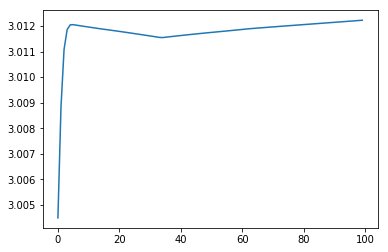

[[[3.45303172 2.33850909]
  [1.54927126 1.24096541]]

 [[3.23643855 2.19000977]
  [2.62660059 1.24096541]]]


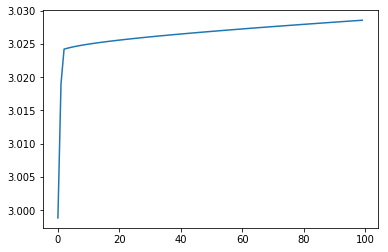

[[[3.68690622 1.86470234]
  [1.19621834 4.07306484]]

 [[3.75070889 1.90844635]
  [1.66412688 1.50502342]]]


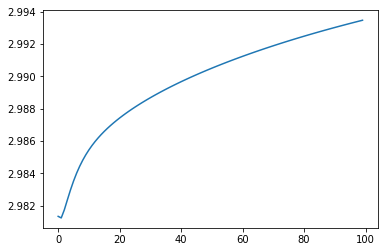

[0.78311383 1.12619674] 3.035507306043755


[[[2.58946904 3.50317511]
  [1.19626389 3.68601945]]

 [[1.91698093 3.04210782]
  [1.19636276 1.73998768]]]


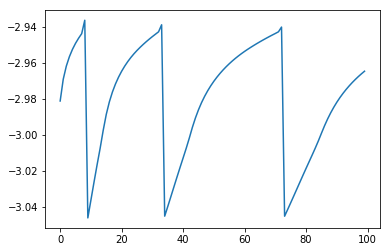

[[[5.07921025 1.24005238]
  [1.59904477 1.24096542]]

 [[4.3137802  1.24005238]
  [2.53248797 1.24096541]]]


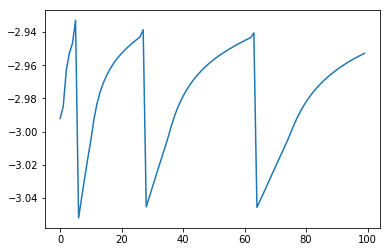

[[[3.70161314 2.29677279]
  [1.20360916 3.5227037 ]]

 [[3.32543417 2.03885921]
  [2.50883408 1.24096541]]]


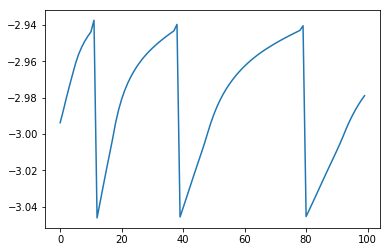

[[[4.16966335 2.716052  ]
  [1.19621834 3.03374307]]

 [[2.99972141 1.91392338]
  [1.68616859 1.63430046]]]


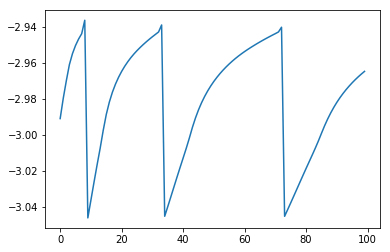

[[[2.90287365 2.54929619]
  [1.19621833 4.11180396]]

 [[2.92214751 2.56251061]
  [1.19621838 1.68357162]]]


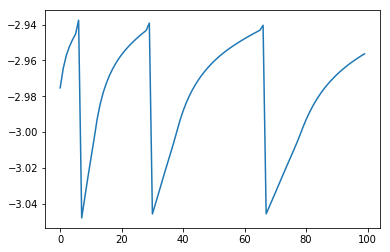

[[[3.52942827 2.6966058 ]
  [1.48701513 1.93203822]]

 [[2.8962802  2.2625106 ]
  [2.51069574 1.24096541]]]


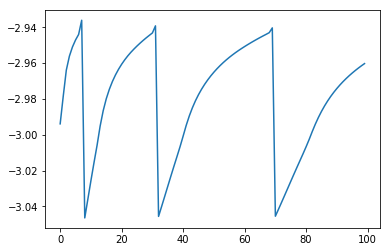

[[[2.00795873 3.78110682]
  [1.19621836 2.25092024]]

 [[1.53015428 3.45351739]
  [1.26528672 1.90341797]]]


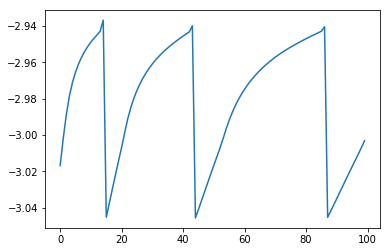

[[[2.0255947  2.38030441]
  [1.19621833 4.19601771]]

 [[2.9214432  2.99451072]
  [2.29519235 1.24096541]]]


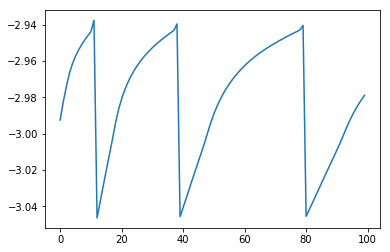

[[[3.49489919 3.42885609]
  [1.41392719 2.09977843]]

 [[2.16415199 2.51647713]
  [2.59218647 1.24096541]]]


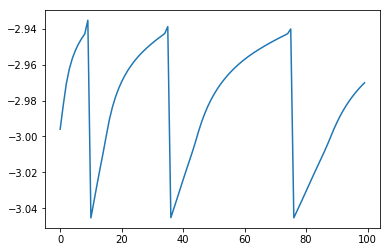

[[[1.7073434  3.56324469]
  [1.19621833 2.799647  ]]

 [[1.68839473 3.55025322]
  [1.25822892 1.83336629]]]


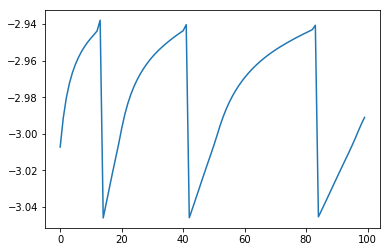

[[[4.74872247 2.47190578]
  [1.19621834 3.90788284]]

 [[3.35260374 1.51470719]
  [1.76102988 1.48890326]]]


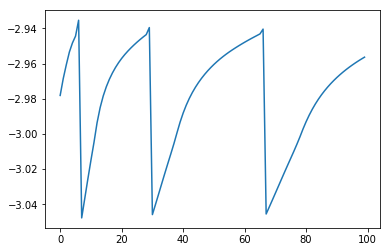

[[[3.34836216 3.25310827]
  [1.33514535 3.47134615]]

 [[2.31019663 2.54132741]
  [2.27748462 1.24096546]]]


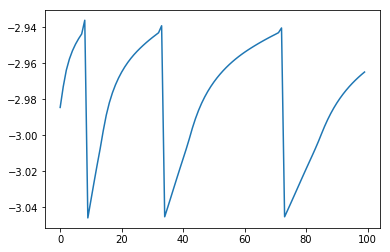

[[[4.39313086 2.42970052]
  [1.19621833 4.12548118]]

 [[3.3262673  1.69824388]
  [1.33882048 1.62577443]]]


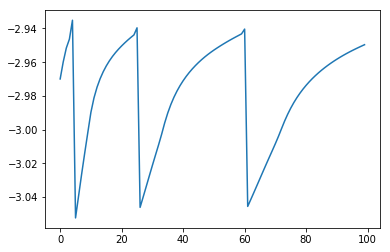

[[[4.57642656 2.27317565]
  [1.51760255 1.93881518]]

 [[3.51648217 1.5464629 ]
  [1.67645378 1.54486415]]]


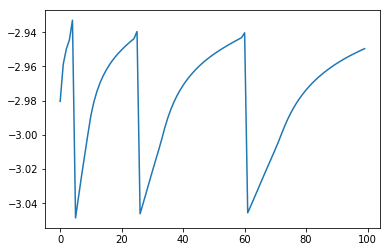

[[[3.9582439  2.51486588]
  [1.19621833 4.55780978]]

 [[3.15853475 1.96657406]
  [1.9588398  1.32499511]]]


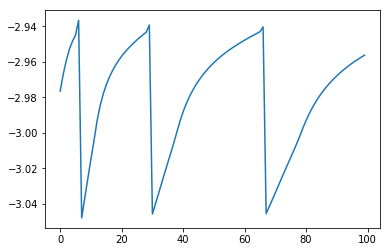

[[[3.97476806 1.63783075]
  [1.52153279 2.27929044]]

 [[4.03066429 1.67615399]
  [1.86727487 1.4218501 ]]]


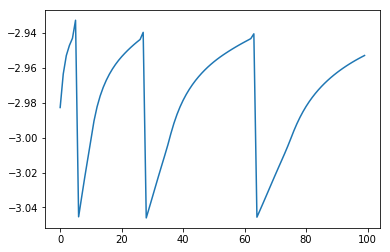

[[[3.85577988 2.52489844]
  [1.19621834 4.19822329]]

 [[3.12895613 2.02657787]
  [1.64991269 1.49399358]]]


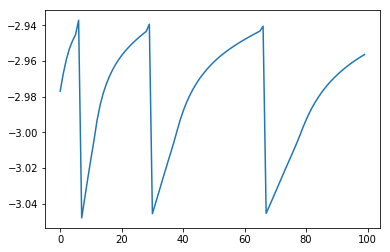

[[[4.5448748  1.90764381]
  [1.83138259 1.38958001]]

 [[3.87260223 1.4467243 ]
  [2.04293975 1.24096541]]]


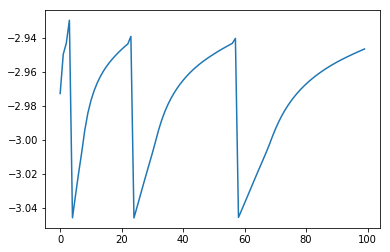

[[[4.86697138 1.24005302]
  [1.38858495 2.62427263]]

 [[4.39813688 1.24005238]
  [2.46279671 1.24096541]]]


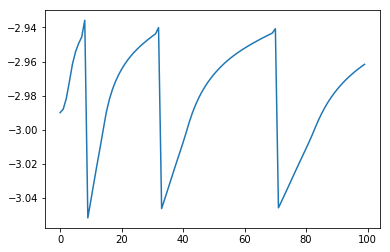

[[[4.30480357 1.44701599]
  [1.19621833 3.93502437]]

 [[4.2829778  1.43205193]
  [1.76553787 1.48353154]]]


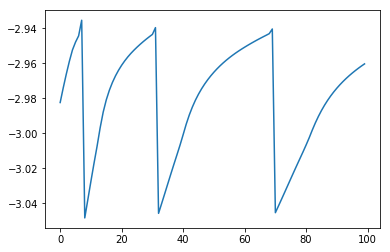

[[[3.07379879 2.69407352]
  [1.79246381 1.54653819]]

 [[2.81146254 2.51421211]
  [2.06346775 1.24096541]]]


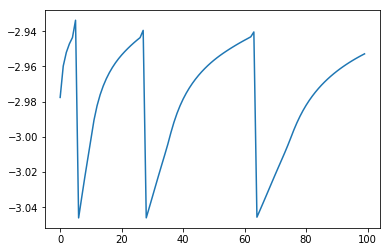

[[[4.41401963 1.98447508]
  [1.80963316 1.60083629]]

 [[3.77139825 1.54388484]
  [2.01264794 1.24096542]]]


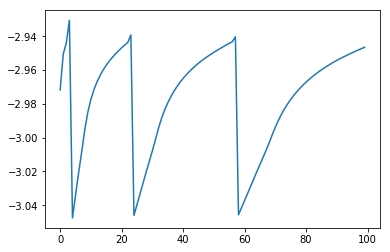

[[[2.77374775 2.49650521]
  [1.57569311 2.14198001]]

 [[2.94970411 2.61714335]
  [2.27205019 1.24096541]]]


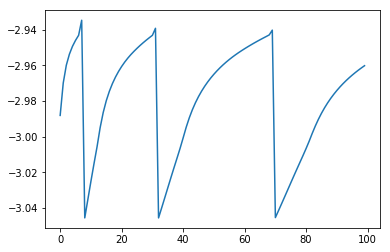

[[[4.94368773 1.63220243]
  [1.19621834 2.65313211]]

 [[4.11278929 1.2400524 ]
  [1.36683251 1.81017542]]]


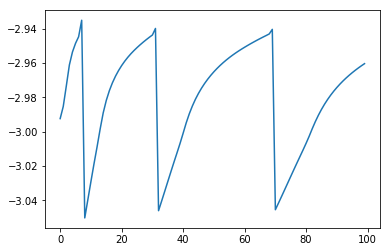

[[[2.01083512 2.8471443 ]
  [1.196219   3.572413  ]]

 [[2.45607147 3.1524046 ]
  [2.00989308 1.43572596]]]


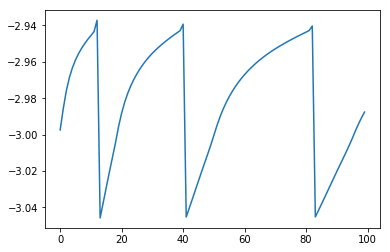

[1.37505025 0.78177438] -2.929658468733928
1.5354166666666667


[[[4.55852459 1.37327286]
  [1.42402579 2.02690672]]

 [[4.40467072 1.26778849]
  [2.6615787  1.21589859]]]


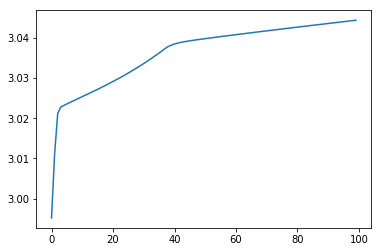

[[[1.72769846 4.31309662]
  [1.17570586 5.00933722]]

 [[1.26397804 3.48346296]
  [1.6214996  1.41272979]]]


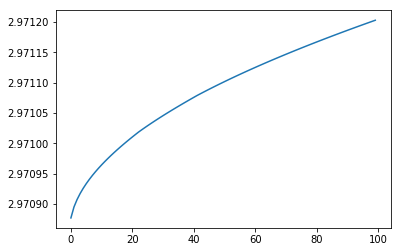

[[[3.86242714 1.65657737]
  [1.17570586 4.1343685 ]]

 [[3.99055879 1.74442623]
  [1.17570586 1.70385593]]]


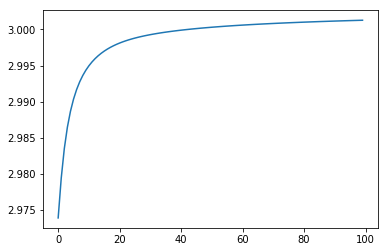

[[[4.1600877  3.00462585]
  [1.39414568 3.00425804]]

 [[2.71196844 2.01177497]
  [2.06402507 1.34295718]]]


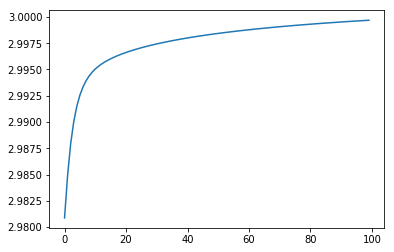

[[[4.69796199 2.48725385]
  [1.46156025 3.06835866]]

 [[3.32766811 1.54776113]
  [2.20287405 1.22990054]]]


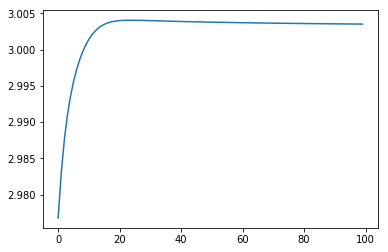

[[[4.27930375 2.61731322]
  [1.17570586 4.44123708]]

 [[3.1185652  1.82149458]
  [2.30903867 1.21821241]]]


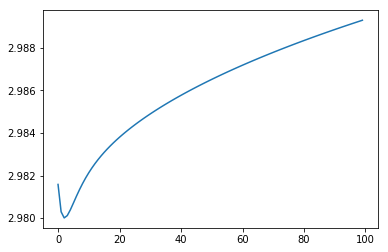

[[[3.82133228 2.17022063]
  [1.17570586 4.73437556]]

 [[3.47376704 1.93192502]
  [2.21615051 1.21577512]]]


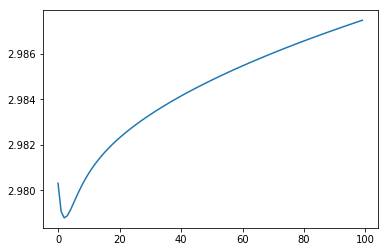

[[[4.95873476 1.21495753]
  [1.45133216 1.90978345]]

 [[4.40464962 1.21495753]
  [1.55840071 1.64425346]]]


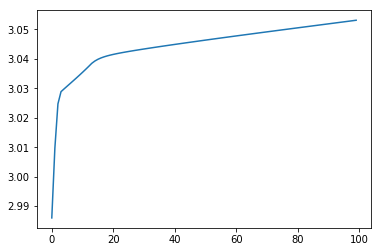

[[[5.49429469 1.631735  ]
  [1.46624903 2.03169999]]

 [[3.92092307 1.21495753]
  [2.58043636 1.21577512]]]


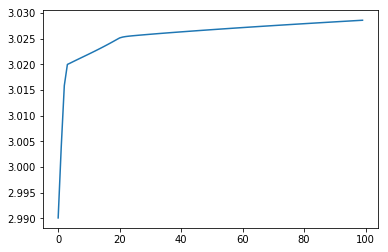

[[[4.96032521 2.96779991]
  [1.63594264 1.42006207]]

 [[2.90183014 1.5564668 ]
  [2.46634327 1.21577512]]]


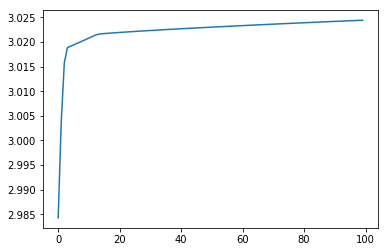

[[[5.58295204 1.21495753]
  [1.52866778 1.83912273]]

 [[4.15654635 1.21495753]
  [2.52751538 1.21577512]]]


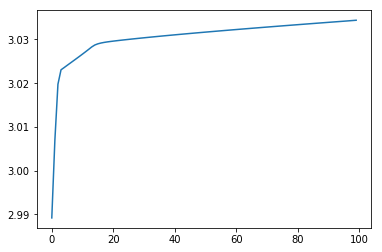

[[[2.42949183 2.90340764]
  [1.79390946 1.21577516]]

 [[2.48056639 2.93842507]
  [2.23671679 1.21577512]]]


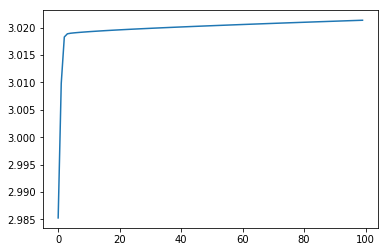

[[[4.71991764 1.80593229]
  [1.17570586 4.6812033 ]]

 [[4.0069265  1.31709559]
  [1.17570586 1.6312846 ]]]


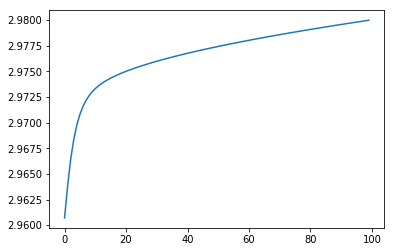

[[[3.57678411 3.29654947]
  [1.8150198  1.56947579]]

 [[2.31093498 2.42866554]
  [1.93515011 1.27155262]]]


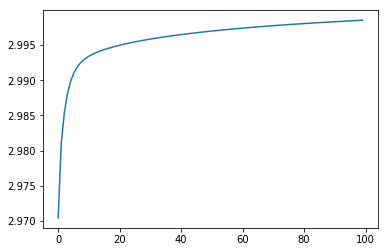

[[[5.06704746 2.01929556]
  [1.17570586 4.33557728]]

 [[3.83886428 1.21495787]
  [2.35096584 1.21577512]]]


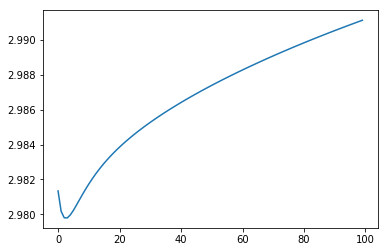

[[[1.63177043 3.46060831]
  [1.17570586 4.57666457]]

 [[1.77560197 3.55922123]
  [1.17570586 1.6451581 ]]]


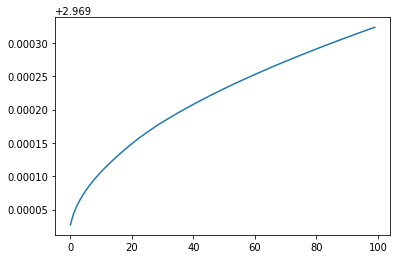

[[[1.63863622 4.021596  ]
  [1.26389586 2.55367533]]

 [[1.26397804 3.69498045]
  [1.61846036 1.67435537]]]


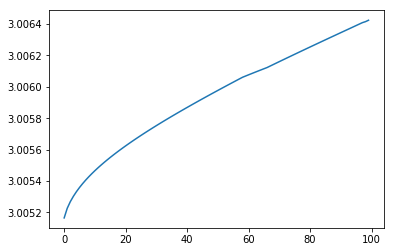

[[[3.32896282 2.31110808]
  [1.17570586 4.50737272]]

 [[3.23980811 2.24998236]
  [2.29288972 1.21577512]]]


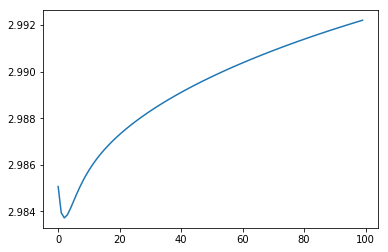

[[[4.18927965 2.94193168]
  [1.17570588 2.88107337]]

 [[2.77968052 1.97549073]
  [1.52164347 1.73437617]]]


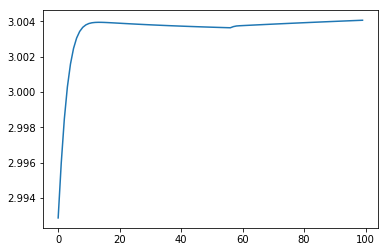

[[[5.14744106 2.71667448]
  [1.27778902 1.9959803 ]]

 [[3.186507   1.37223058]
  [1.33728088 1.84843938]]]


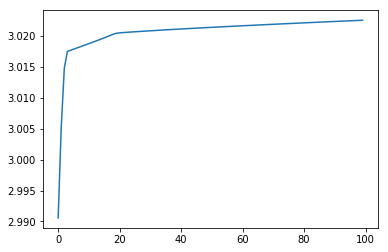

[[[2.97459138 3.97545003]
  [1.73336737 1.21577514]]

 [[1.52286617 2.98012685]
  [2.35119086 1.21577512]]]


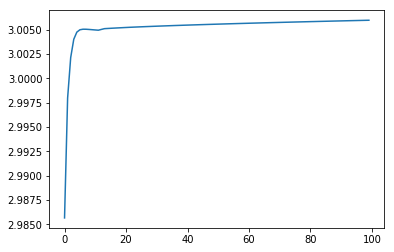

[[[1.26397804 4.36603095]
  [1.17570586 4.34924332]]

 [[1.26397804 3.62448807]
  [2.34634598 1.21577512]]]


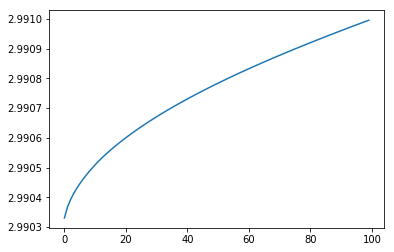

[[[3.09563085 2.78376941]
  [1.58233643 2.42596813]]

 [[2.72677662 2.53087777]
  [2.22765237 1.21577512]]]


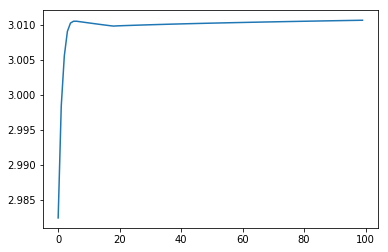

[[[4.7145029  1.22914896]
  [1.2698801  3.36287835]]

 [[4.49249983 1.21495753]
  [2.06680066 1.38651536]]]


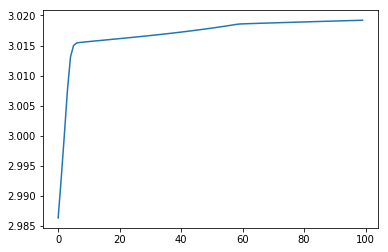

[[[3.45678929 3.51148302]
  [1.17570586 5.07059711]]

 [[2.07498139 2.56409613]
  [1.17570601 1.57960745]]]


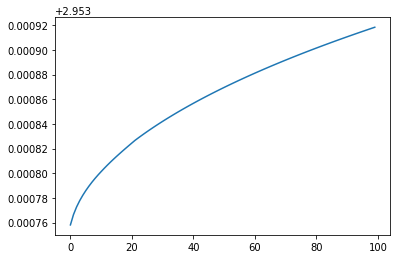

[0.67577122 1.18865479] 3.053080795567795


[[[4.55852459 1.37327286]
  [1.42402579 2.02690672]]

 [[4.40467072 1.26778849]
  [2.6615787  1.21589859]]]


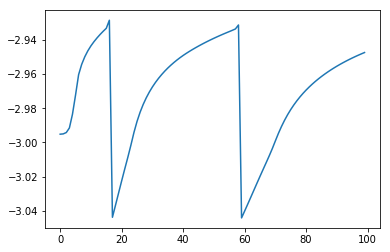

[[[3.7276773  3.60798187]
  [1.21654093 3.37424995]]

 [[2.03128956 2.44491463]
  [2.59873461 1.21577512]]]


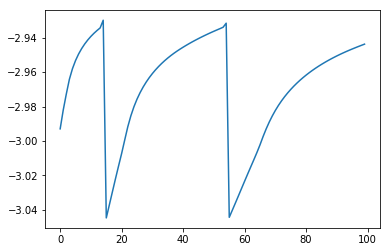

[[[3.0411167  2.02472454]
  [1.39495786 2.0149653 ]]

 [[3.46838663 2.31766679]
  [2.7208922  1.21577512]]]


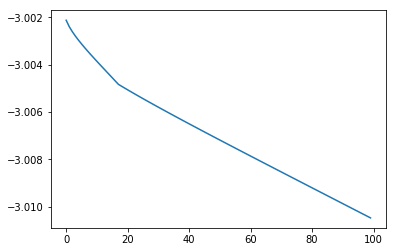

[[[4.41183996 3.39091631]
  [1.17570586 2.16409113]]

 [[2.3774848  1.99613386]
  [1.18384809 1.96213819]]]


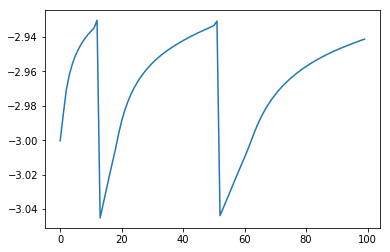

[[[3.48944851 3.39186832]
  [1.17570586 4.66816446]]

 [[2.19975461 2.50763609]
  [1.67749001 1.43602692]]]


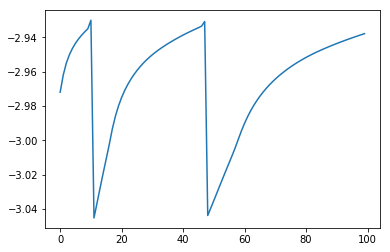

[[[5.01605166 2.80209724]
  [1.17570586 4.88113529]]

 [[3.07668822 1.47244245]
  [1.17570586 1.6047513 ]]]


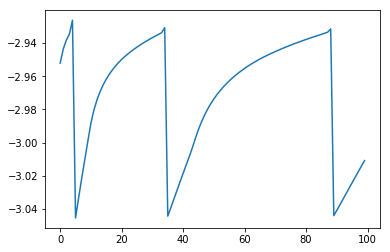

[[[3.45204116 2.3692031 ]
  [1.17570586 3.90654184]]

 [[3.2058372  2.20040221]
  [1.96421067 1.42454364]]]


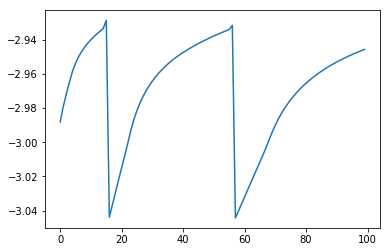

[[[4.41402592 1.98663238]
  [1.17570586 4.43099213]]

 [[3.76926201 1.5445732 ]
  [1.17570586 1.66449052]]]


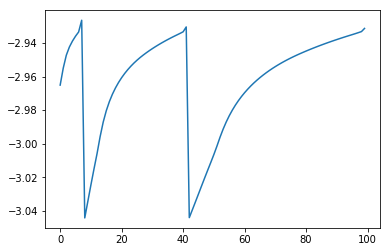

[[[1.26397814 4.28787288]
  [1.17570586 4.53712297]]

 [[1.26397804 3.67227202]
  [1.51573563 1.51691843]]]


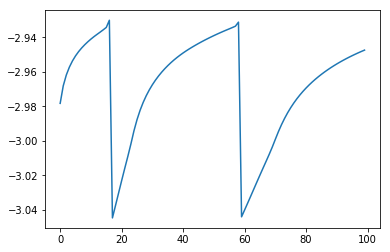

[[[3.70918703 3.05017617]
  [1.17570586 2.54851507]]

 [[2.58041708 2.27627566]
  [1.20252955 1.90378679]]]


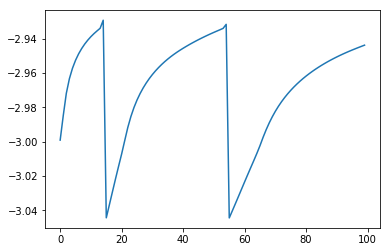

[[[3.94942175 2.61693247]
  [1.17570586 3.79934632]]

 [[3.05571676 2.00419579]
  [2.5322408  1.21577512]]]


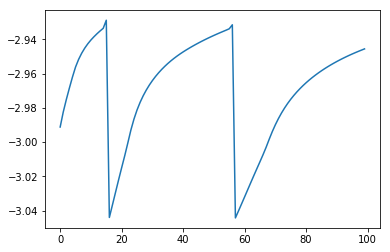

[[[2.1109788  3.60501489]
  [1.27382307 2.28590842]]

 [[1.72437037 3.33995072]
  [2.85834264 1.21577512]]]


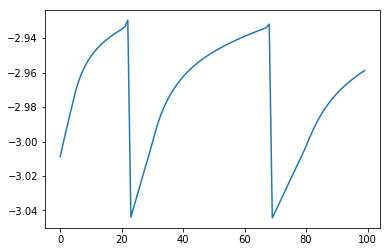

[[[2.2081728  3.20639771]
  [1.17570586 4.89155967]]

 [[2.13794684 3.15824981]
  [2.16301381 1.21577512]]]


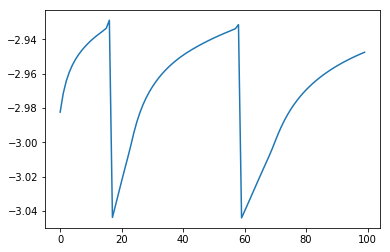

[[[4.6176077  1.70311788]
  [1.43157348 1.785117  ]]

 [[4.08918569 1.34082435]
  [2.72935987 1.21577512]]]


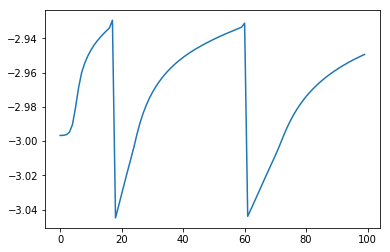

[[[3.10777827 3.23813654]
  [1.22609009 3.75890632]]

 [[2.27891989 2.6698596 ]
  [2.21410247 1.30863561]]]


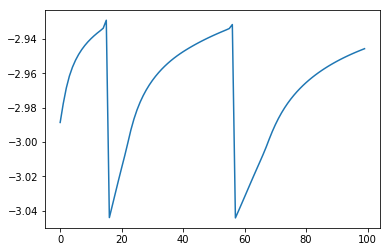

[[[2.64666384 4.0296848 ]
  [1.71216815 1.5931244 ]]

 [[1.40627952 3.1792599 ]
  [1.78921401 1.40205066]]]


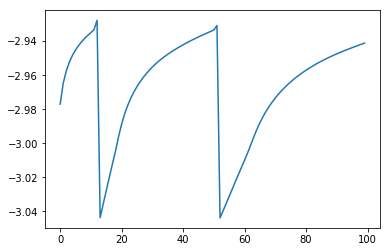

[[[1.71162448 4.0499122 ]
  [1.17570586 3.42503115]]

 [[1.26397829 3.65037759]
  [2.65877951 1.21577512]]]


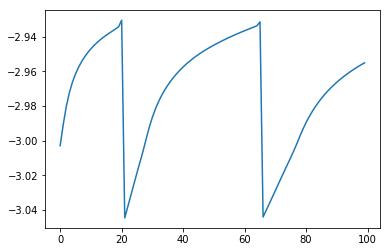

[[[3.48066997 2.53053223]
  [1.55613555 1.21577524]]

 [[3.05148006 2.2362736 ]
  [2.6863039  1.21577512]]]


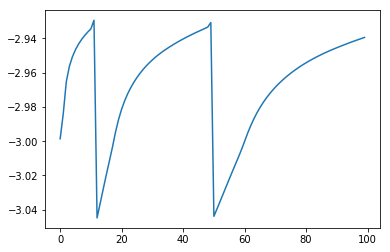

[[[2.90190425 2.04933845]
  [1.79274912 1.30058674]]

 [[3.41731761 2.40271308]
  [2.21023991 1.21577512]]]


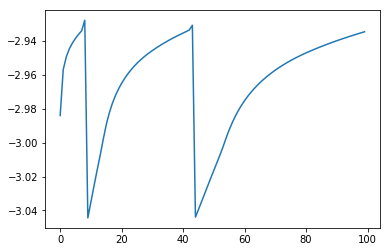

[[[3.17955852 1.98411719]
  [1.1757059  3.4023336 ]]

 [[3.53515417 2.22791856]
  [2.66645242 1.21577512]]]


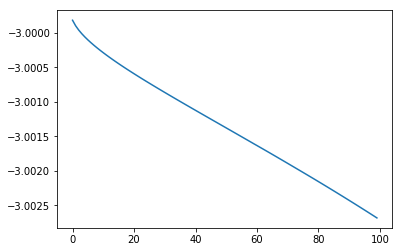

[[[5.37131032 1.92293446]
  [1.17570586 3.29679125]]

 [[3.78055594 1.21495753]
  [1.2869451  1.77134238]]]


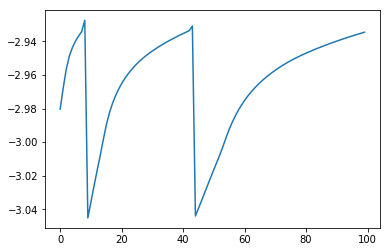

[[[1.99810182 4.03574619]
  [1.19151553 1.97422297]]

 [[1.27596966 3.54064206]
  [1.19229768 1.97228347]]]


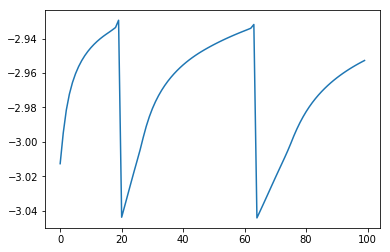

[[[3.72758562 3.00799873]
  [1.17570586 3.48339397]]

 [[2.62573261 2.25255284]
  [1.17570586 1.79024781]]]


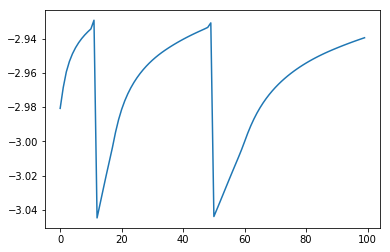

[[[5.03044436 2.20453038]
  [1.51196465 1.21577512]]

 [[3.67151332 1.2728282 ]
  [2.76982306 1.21577512]]]


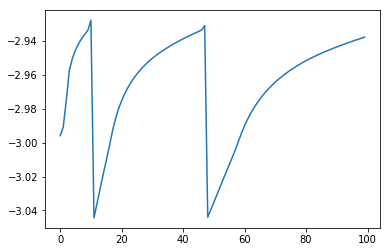

[[[2.89138794 3.29594907]
  [1.45926254 1.68681103]]

 [[2.18016579 2.80832519]
  [2.71023761 1.21577512]]]


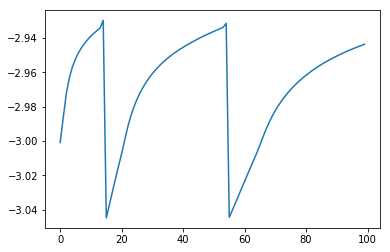

[1.41726468 0.75721162] -2.9262638400145966
1.6458333333333335


[[[4.44430628 3.01809389]
  [1.15735725 4.75409477]]

 [[2.75309813 1.85857785]
  [2.30140587 1.19330896]]]


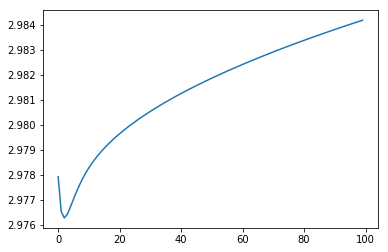

[[[4.89589158 1.1947264 ]
  [1.15733773 5.39802796]]

 [[4.46666277 1.19248607]
  [1.55425804 1.40117783]]]


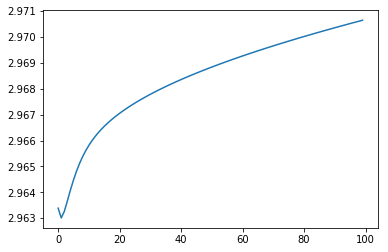

[[[5.60158783 2.26802286]
  [1.48811531 2.65217801]]

 [[3.48864537 1.19248608]
  [2.01803159 1.33798563]]]


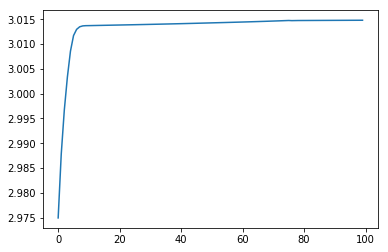

[[[1.23638204 4.54705743]
  [1.80328596 1.51236345]]

 [[1.23638202 3.55009153]
  [2.17618355 1.19321819]]]


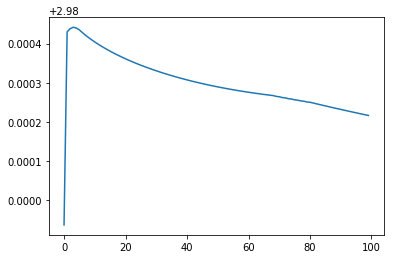

[[[2.22082483 3.05570402]
  [1.15733773 3.83611958]]

 [[2.28967838 3.10291098]
  [1.87005966 1.4844853 ]]]


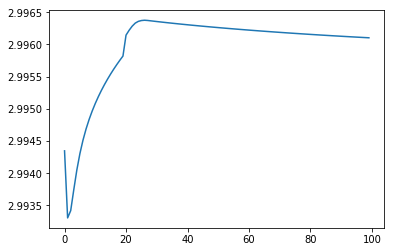

[[[5.67226294 1.81416597]
  [1.15733774 4.2903501 ]]

 [[3.75551363 1.19248608]
  [2.45844464 1.1932182 ]]]


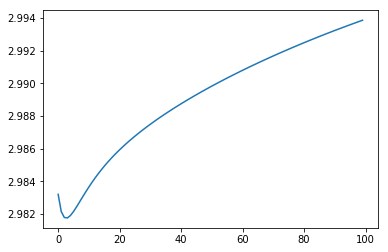

[[[5.7541543  1.19248608]
  [1.21663319 3.48155771]]

 [[4.12699106 1.19248607]
  [2.61974321 1.19321819]]]


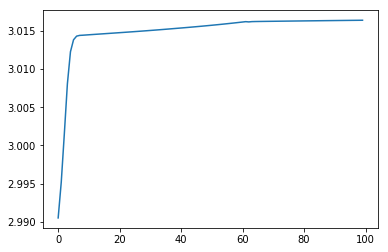

[[[4.49132176 2.94593595]
  [1.15733773 3.9416835 ]]

 [[2.83360296 1.80938067]
  [1.55704483 1.59335764]]]


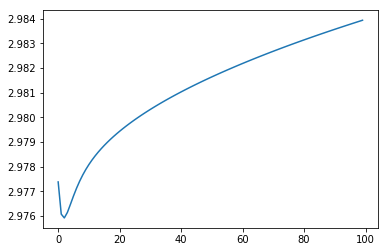

[[[2.31000827 3.61277441]
  [1.15733774 5.03027034]]

 [[1.75482856 3.23213541]
  [2.05929575 1.2517182 ]]]


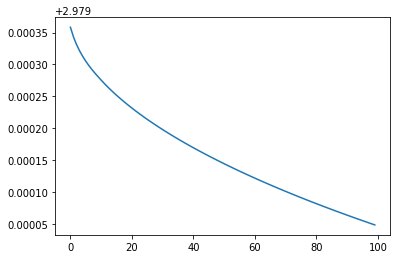

[[[3.33001665 1.94519923]
  [1.15733773 2.48623375]]

 [[3.60255094 2.13205257]
  [1.1962962  1.92813375]]]


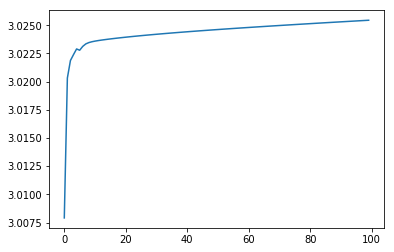

[[[5.46291313 1.65914398]
  [1.15733773 4.7077663 ]]

 [[3.93947028 1.19248614]
  [1.15733774 1.64860469]]]


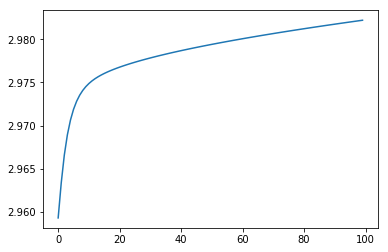

[[[4.4678397  2.70413781]
  [1.15733773 3.93530974]]

 [[3.06867486 1.74485076]
  [1.78997148 1.50276226]]]


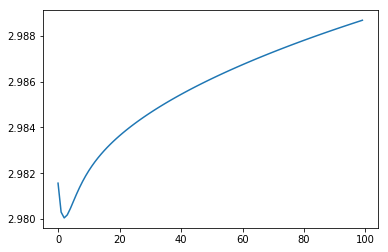

[[[4.94298295 3.05299209]
  [1.15734036 3.25279362]]

 [[2.81409827 1.59339887]
  [1.82968892 1.57774604]]]


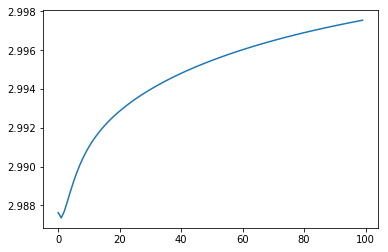

[[[3.4932396  1.90355117]
  [1.24320233 3.58473762]]

 [[3.67509921 2.02823667]
  [2.14600737 1.34578005]]]


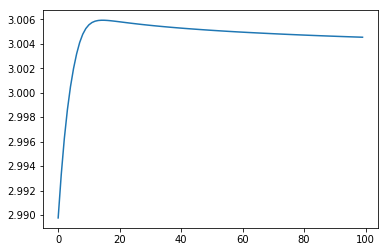

[[[3.4987199  3.02447823]
  [1.15733773 3.1067311 ]]

 [[2.56554005 2.38467702]
  [2.85857171 1.19321819]]]


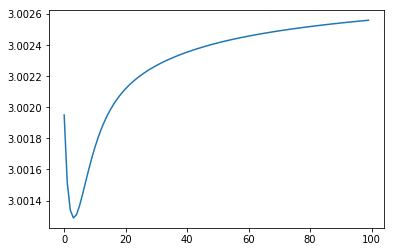

[[[3.71549973 3.396136  ]
  [1.32324727 1.86828071]]

 [[2.23885153 2.38372527]
  [1.33815947 1.83129855]]]


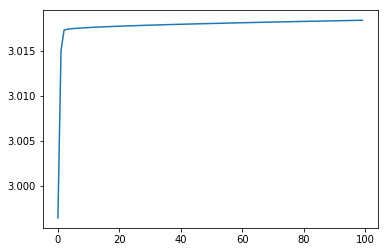

[[[3.82293535 3.75096489]
  [1.37476951 1.86483849]]

 [[1.90787993 2.43797601]
  [2.8672745  1.19321819]]]


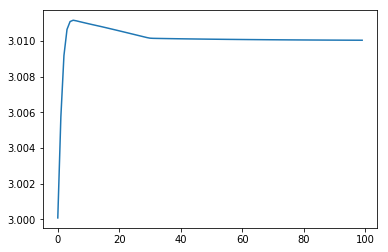

[[[3.78460245 2.07171432]
  [1.15733773 4.42747061]]

 [[3.56432696 1.92069035]
  [2.41209055 1.19321819]]]


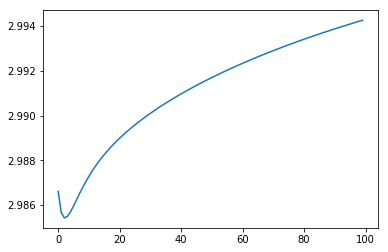

[[[2.81522564 3.71738017]
  [1.15733773 4.68574098]]

 [[1.74801636 2.98568651]
  [1.66506197 1.4522077 ]]]


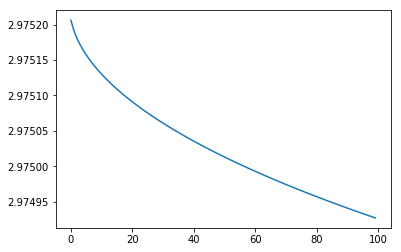

[[[5.53207248 2.43146459]
  [1.55198541 1.3386255 ]]

 [[3.4100553  1.19248607]
  [2.7100799  1.19321819]]]


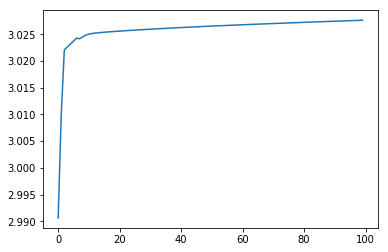

[[[2.90593506 3.41466017]
  [1.15733773 4.99913905]]

 [[2.06533548 2.83833331]
  [1.15733773 1.60993614]]]


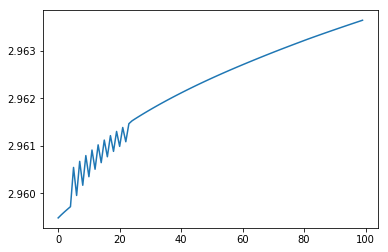

[[[3.26347434 3.68996779]
  [1.15733774 4.5056139 ]]

 [[1.86108844 2.72847234]
  [2.38567389 1.1932182 ]]]


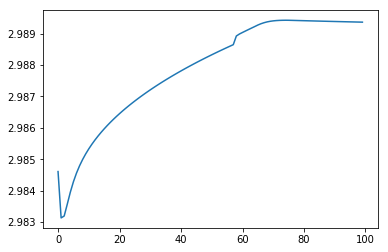

[[[2.4733484  2.77022282]
  [1.15733773 4.66757701]]

 [[2.62093093 2.87140747]
  [1.1573378  1.65393825]]]


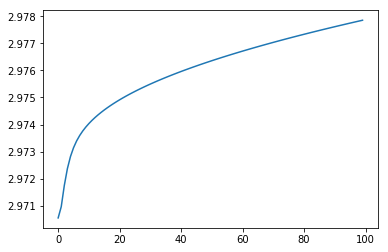

[[[2.96535303 2.0599884 ]
  [1.81247521 1.61664634]]

 [[3.41892637 2.37096465]
  [2.12355514 1.19321819]]]


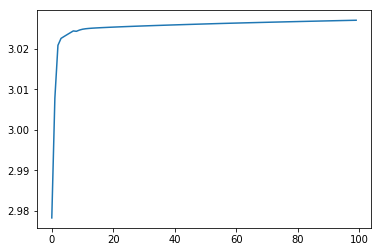

[[[4.41468445 2.13208683]
  [1.62997455 2.44971427]]

 [[3.62527261 1.59085499]
  [2.18700874 1.19321819]]]


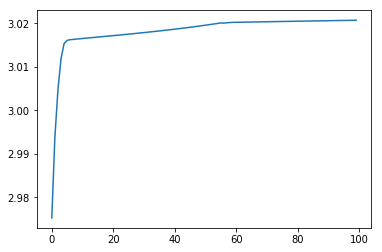

[0.83132728 1.09814341] 3.027614088606185


[[[4.44430628 3.01809389]
  [1.15735725 4.75409477]]

 [[2.75309813 1.85857785]
  [2.30140587 1.19330896]]]


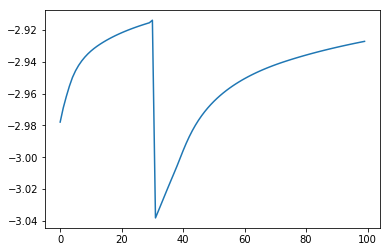

[[[5.07746781 1.9617186 ]
  [1.26057158 3.04966297]]

 [[3.89602724 1.1924878 ]
  [2.68266743 1.19321819]]]


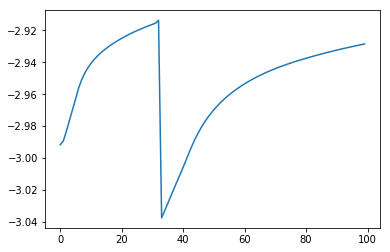

[[[4.40521101 2.79571266]
  [1.16706612 3.79248745]]

 [[2.9659394  1.80892785]
  [2.14120948 1.3766078 ]]]


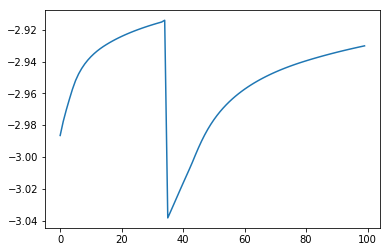

[[[4.0073354  1.98432116]
  [1.15733773 5.49849995]]

 [[3.69360504 1.76922322]
  [1.15733773 1.54366515]]]


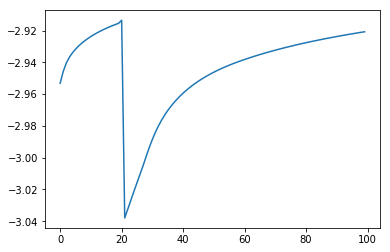

[[[5.7739048  1.19248607]
  [1.70340176 1.1932182 ]]

 [[4.11914097 1.19248607]
  [2.47293469 1.19321819]]]


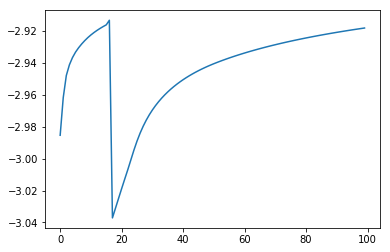

[[[3.49726827 2.18853671]
  [1.15733773 5.07463757]]

 [[3.39350895 2.11739786]
  [1.79689954 1.34884043]]]


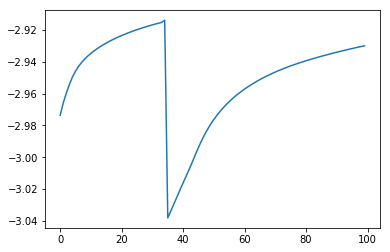

[[[5.37913904 2.0477249 ]
  [1.34082085 1.32182682]]

 [[3.72023093 1.19248607]
  [3.11503243 1.19321819]]]


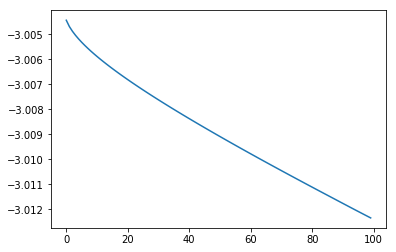

[[[3.05717932 3.74656576]
  [1.41095156 2.15700396]]

 [[1.76547262 2.86095351]
  [2.70009316 1.19321819]]]


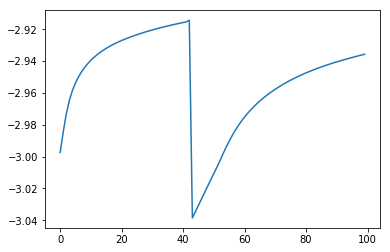

[[[5.61095463 1.34368996]
  [1.15733773 4.08852004]]

 [[4.08564109 1.19248607]
  [1.97434858 1.41004757]]]


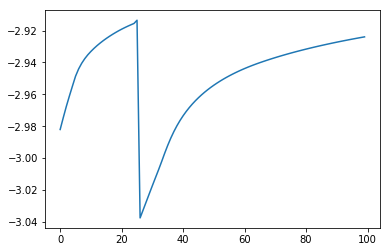

[[[2.91768343 3.31754888]
  [1.23873709 3.64403516]]

 [[2.16380463 2.80067899]
  [2.52302259 1.19321821]]]


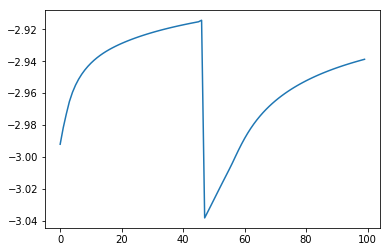

[[[1.23638202 4.31758734]
  [1.15733773 2.66054596]]

 [[1.23638202 3.69038412]
  [1.15733781 1.92029459]]]


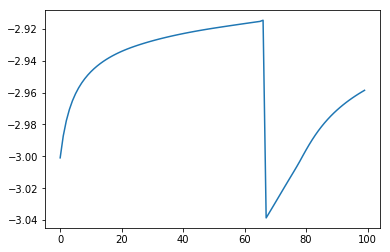

[[[4.48122395 2.4021786 ]
  [1.23401929 2.62650429]]

 [[3.37041995 1.64059579]
  [1.61186011 1.68945825]]]


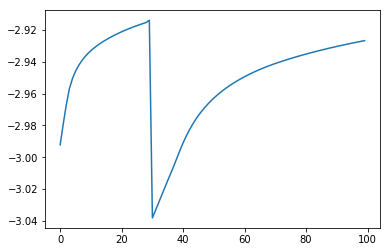

[[[2.81881053 3.39661434]
  [1.64168657 1.51536874]]

 [[2.0665168  2.8808312 ]
  [1.63822092 1.52396356]]]


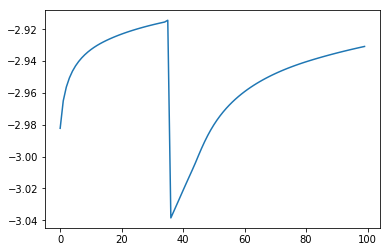

[[[5.31554959 1.27413904]
  [1.15733773 3.6198689 ]]

 [[4.24825441 1.19248607]
  [1.15733773 1.79298132]]]


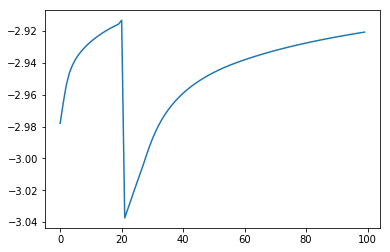

[[[5.01495624 2.46605636]
  [1.15733773 4.12779421]]

 [[3.40942608 1.36528235]
  [1.15733773 1.72557373]]]


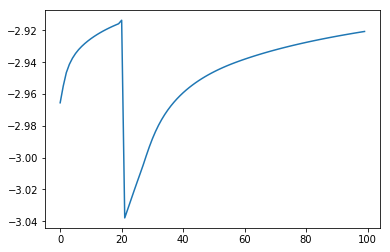

[[[5.52232844 2.84019255]
  [1.15733773 4.51237913]]

 [[3.13597732 1.20407675]
  [1.30306127 1.61732738]]]


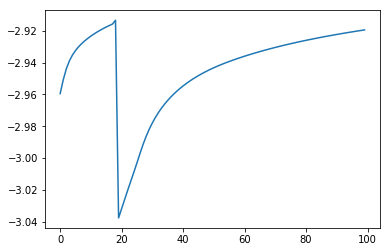

[[[3.91998529 1.82695721]
  [1.15733773 5.15795185]]

 [[3.83277889 1.76716727]
  [1.85517486 1.3149062 ]]]


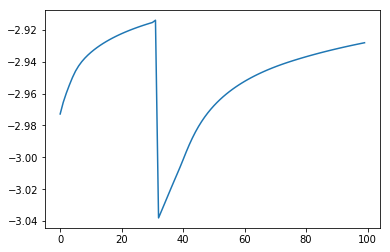

[[[2.28394001 2.84456233]
  [1.15733773 4.66000783]]

 [[2.51097337 3.00021959]
  [1.65678818 1.45887087]]]


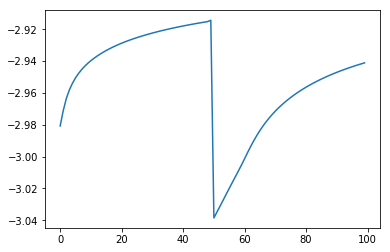

[[[1.9071345  3.33860101]
  [1.54631286 1.28122108]]

 [[1.94926294 3.36748487]
  [2.74021143 1.19321819]]]


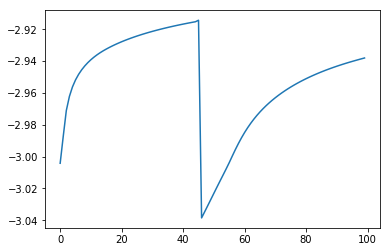

[[[1.74248896 3.918296  ]
  [1.15733773 5.22861442]]

 [[1.34334755 3.64463901]
  [2.14126077 1.19321819]]]


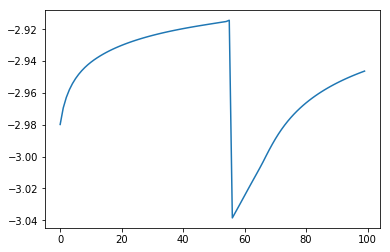

[[[3.14051189 4.00414908]
  [1.7153497  1.74437011]]

 [[1.52623186 2.89737603]
  [2.26402424 1.19321819]]]


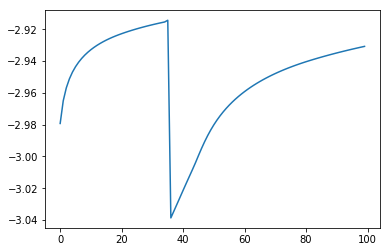

[[[2.77099972 4.29193501]
  [1.15733773 4.89153279]]

 [[1.23638207 3.13226435]
  [1.15733773 1.62421674]]]


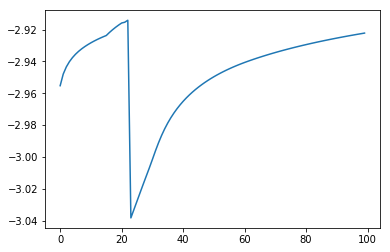

[[[2.83354752 4.017407  ]
  [1.27555852 2.77756558]]

 [[1.45426272 3.07174997]
  [2.74631343 1.19321819]]]


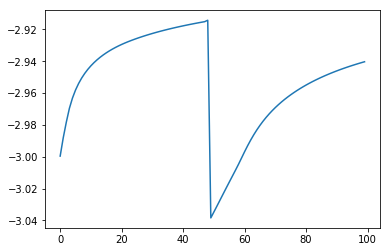

[[[4.13559447 3.58515307]
  [1.15733773 4.14474114]]

 [[2.13209025 2.21152247]
  [1.32538684 1.65735274]]]


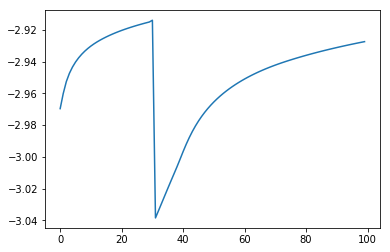

[[[4.09037947 2.35625443]
  [1.30859629 2.8983772 ]]

 [[3.34101156 1.84247728]
  [2.64300419 1.19321819]]]


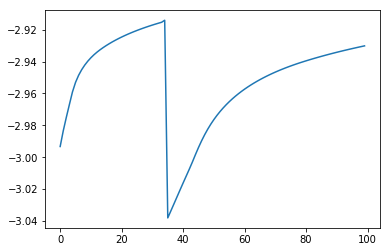

[1.520601   0.69708466] -2.913171125567529
1.75625


[[[4.66116261 1.96013286]
  [1.14096076 3.49898562]]

 [[3.84288421 1.39910971]
  [1.14104486 1.82757655]]]


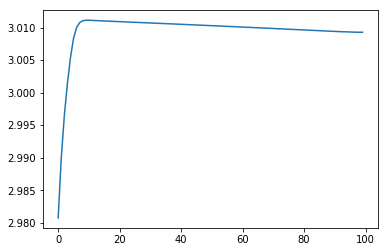

[[[5.46212752 1.71525413]
  [1.1408898  4.81680435]]

 [[3.92470689 1.17236386]
  [2.36302696 1.17301935]]]


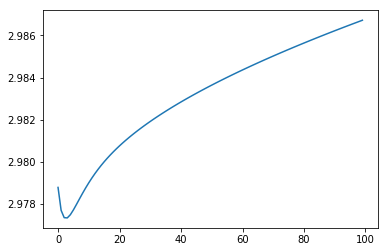

[[[1.21167087 4.62293018]
  [1.74268137 1.17301935]]

 [[1.21167087 3.53619096]
  [2.45694455 1.17301935]]]


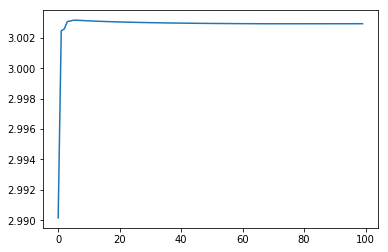

[[[2.9206059  2.79115943]
  [1.1408898  5.16027429]]

 [[2.68590907 2.63024799]
  [2.24691549 1.1730194 ]]]


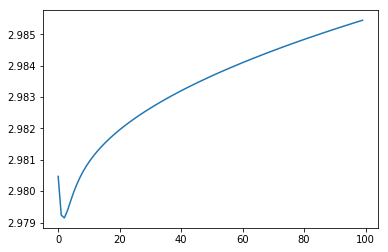

[[[1.72874399 4.29120674]
  [1.63586546 1.92183245]]

 [[1.21167087 3.54566201]
  [1.8497969  1.39128254]]]


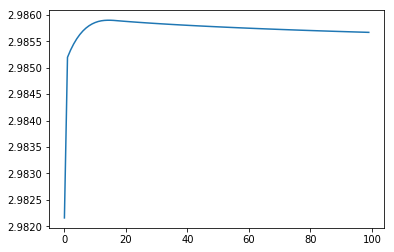

[[[5.8993943  2.51672862]
  [1.1408898  4.66690893]]

 [[3.23003581 1.17236387]
  [1.87292289 1.38531498]]]


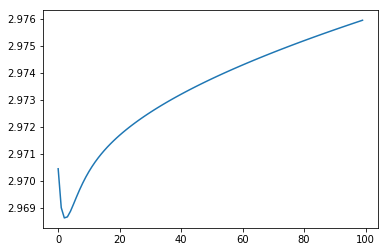

[[[3.35844148 2.48995439]
  [1.47661663 1.17301935]]

 [[3.06825791 2.29100046]
  [2.96002447 1.17301935]]]


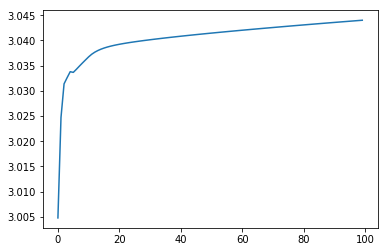

[[[3.089134   4.11667857]
  [1.3257413  3.20975968]]

 [[1.40489097 2.96193791]
  [2.55677421 1.17301935]]]


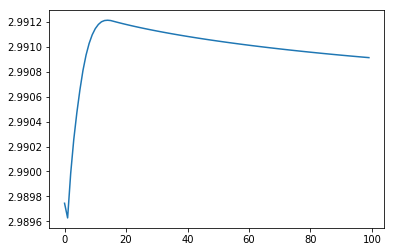

[[[4.86557992 1.17236376]
  [1.14088979 3.53147053]]

 [[4.51463394 1.17236376]
  [1.200767   1.79987267]]]


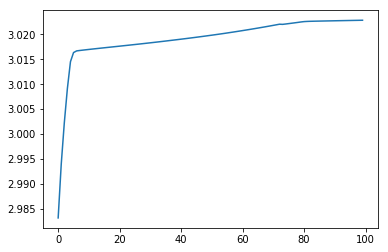

[[[5.56520492 1.17236385]
  [1.47008344 2.13888003]]

 [[4.23655883 1.17236376]
  [1.71166246 1.53976404]]]


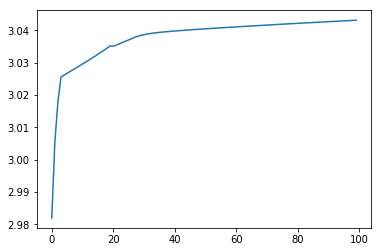

[[[5.07761154 1.72355996]
  [1.14088979 4.71543907]]

 [[4.07213982 1.17236389]
  [2.3972939  1.17301935]]]


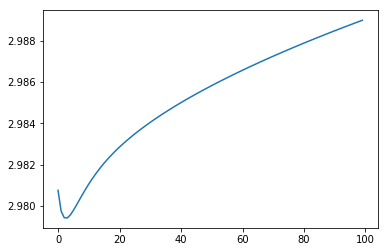

[[[3.52081254 2.44478386]
  [1.1408898  4.9272746 ]]

 [[3.14413295 2.18652705]
  [2.32568207 1.17301935]]]


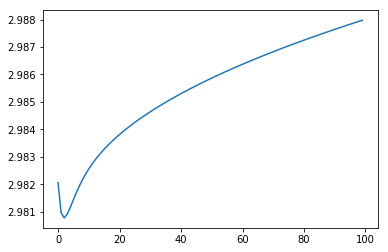

[[[5.05068924 2.4155602 ]
  [1.14088979 5.66290346]]

 [[3.46630609 1.32928488]
  [2.07699987 1.17301935]]]


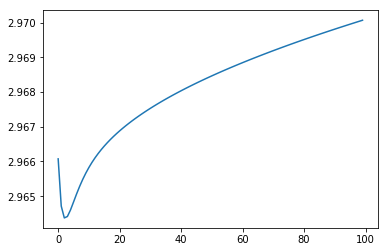

[[[1.54929583 3.8771357 ]
  [1.7853982  1.708322  ]]

 [[1.34710128 3.73850828]
  [2.19521366 1.17301935]]]


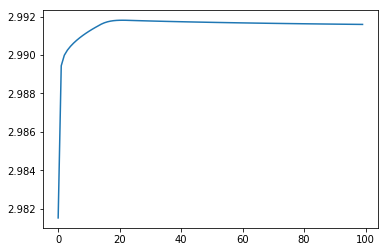

[[[6.36498563 1.17236376]
  [1.38104835 2.9146613 ]]

 [[3.91867565 1.17236376]
  [1.99518874 1.39159314]]]


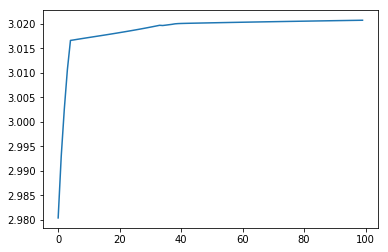

[[[1.54760214 4.61326586]
  [1.33951519 1.65180473]]

 [[1.21167087 3.41649274]
  [3.05740304 1.17301935]]]


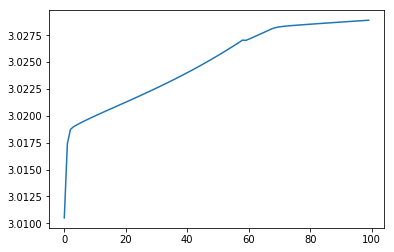

[[[3.01109161 4.08730698]
  [1.29588168 3.14443808]]

 [[1.41903449 2.99577028]
  [2.63531552 1.17301935]]]


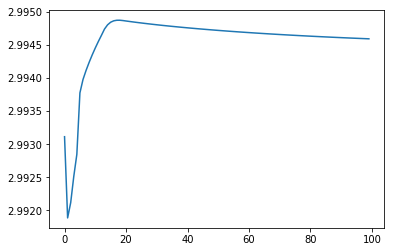

[[[5.94236417 2.14908632]
  [1.1408898  3.38247897]]

 [[3.45188562 1.17236376]
  [1.45127288 1.72130315]]]


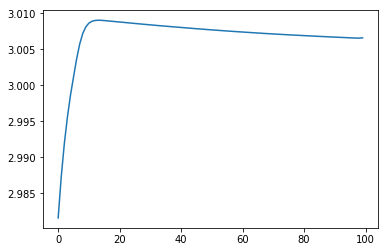

[[[5.80969578 2.0401542 ]
  [1.14089102 4.1286472 ]]

 [[3.57541075 1.17236377]
  [2.23989583 1.31268314]]]


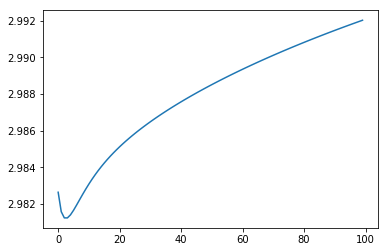

[[[4.87408824 3.26022542]
  [1.52562731 2.80996203]]

 [[2.59556795 1.69803993]
  [2.31397934 1.17301935]]]


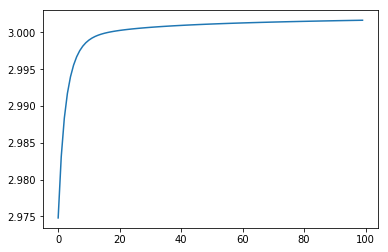

[[[5.63173086 3.2683421 ]
  [1.463565   2.50730117]]

 [[2.73273671 1.28075134]
  [2.53364355 1.17301935]]]


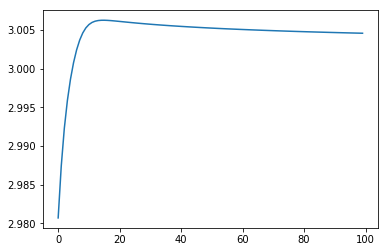

[[[3.61812239 1.64121199]
  [1.1408898  4.69161853]]

 [[3.95895897 1.87489425]
  [2.4053465  1.17301935]]]


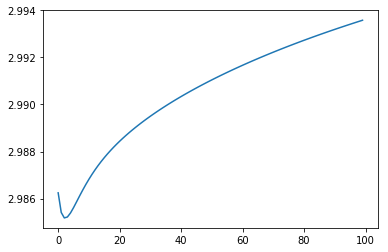

[[[4.67115226 3.73247859]
  [1.14088985 3.58816236]]

 [[2.0887666  1.96195874]
  [1.77360826 1.56746562]]]


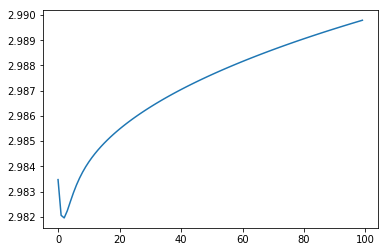

[[[1.21167096 4.14126354]
  [1.32338651 1.46461552]]

 [[1.21167087 3.83067049]
  [3.15117948 1.17301935]]]


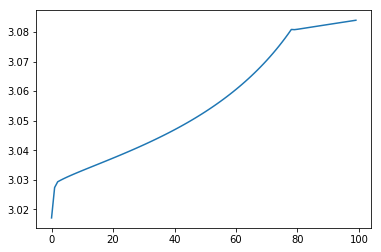

[[[1.74190907 3.45093934]
  [1.14088979 5.38760608]]

 [[1.80629128 3.49508068]
  [1.831705   1.30585122]]]


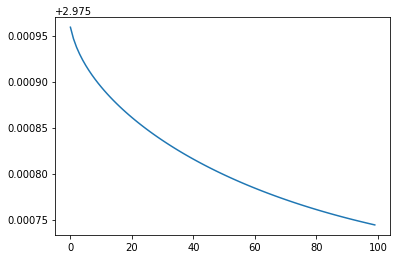

[0.48706921 1.29845238] 3.0839739594428495


[[[4.66116261 1.96013286]
  [1.14096076 3.49898562]]

 [[3.84288421 1.39910971]
  [1.14104486 1.82757655]]]


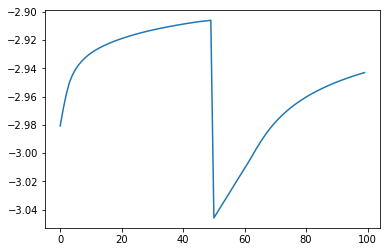

[[[3.28918695 4.30418614]
  [1.14088979 4.67873589]]

 [[1.25745245 2.91119933]
  [1.1408898  1.67112353]]]


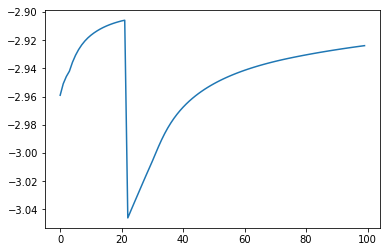

[[[2.74268357 3.94059345]
  [1.14088979 5.66401591]]

 [[1.51295412 3.09747367]
  [1.1408898  1.54036542]]]


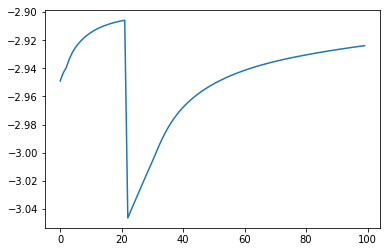

[[[5.74784171 1.64268591]
  [1.14088979 3.44298752]]

 [[3.85830784 1.17236376]
  [1.14088992 1.83512165]]]


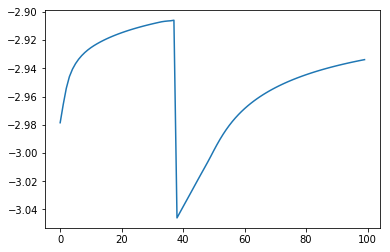

[[[1.21167087 4.07884613]
  [1.14088979 4.41328229]]

 [[1.21167087 3.86883106]
  [1.43929286 1.58920663]]]


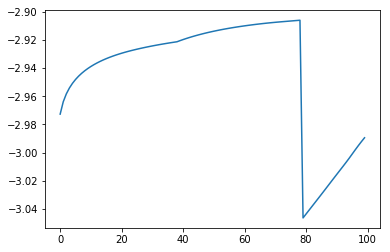

[[[3.02282263 3.33539329]
  [1.1408898  3.62765863]]

 [[2.1662756  2.74813263]
  [2.76502233 1.17301935]]]


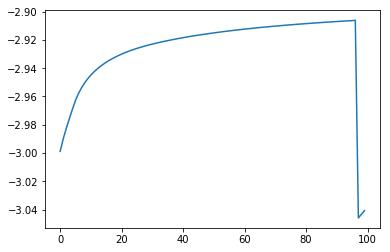

[[[3.49911179 3.47967547]
  [1.14088979 4.73777357]]

 [[2.11460776 2.53044008]
  [2.38974364 1.17301935]]]


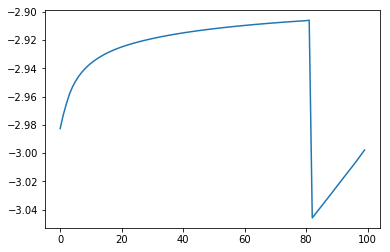

[[[1.21167087 4.43574991]
  [1.1408898  4.69130201]]

 [[1.21167087 3.65062854]
  [2.37852936 1.18358911]]]


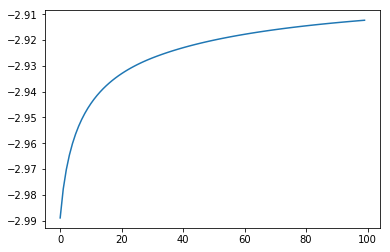

[[[2.31078993 3.87780945]
  [1.14088991 3.68768447]]

 [[1.49238284 3.31669806]
  [2.00185573 1.4646535 ]]]


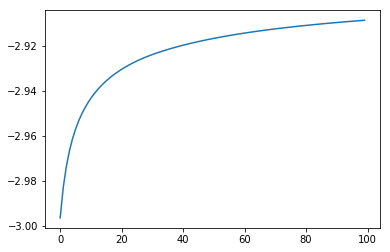

[[[4.49553531 1.93175786]
  [1.91930275 1.27769858]]

 [[3.83925365 1.48180194]
  [2.08759848 1.17301935]]]


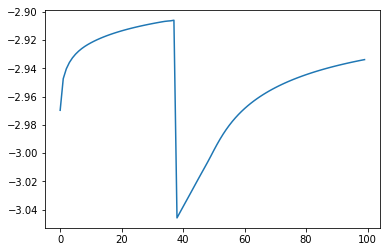

[[[5.40352652 2.82865418]
  [1.14088979 4.11546189]]

 [[3.12463974 1.26621743]
  [2.2055429  1.32792   ]]]


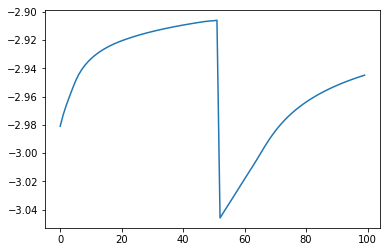

[[[5.46276188 1.34291045]
  [1.14088979 4.26837715]]

 [[4.16643889 1.17236376]
  [1.14088979 1.72558291]]]


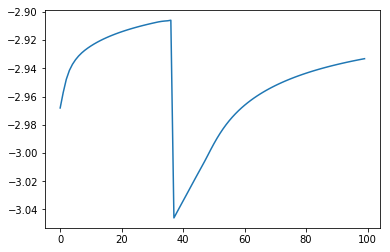

[[[5.30667429 1.86640208]
  [1.48863481 2.56198122]]

 [[3.88826359 1.17236387]
  [2.46775631 1.17301935]]]


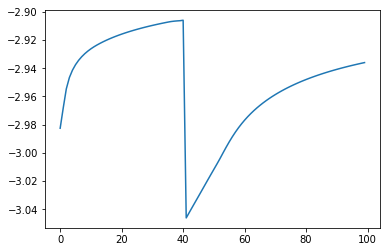

[[[5.42287984 1.17236376]
  [1.14088979 4.29697512]]

 [[4.29312784 1.17236376]
  [2.53875728 1.17301935]]]


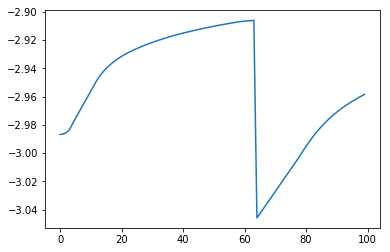

[[[2.37095967 2.85804208]
  [1.1408898  3.31789022]]

 [[2.51429602 2.95631549]
  [2.86974074 1.17301935]]]


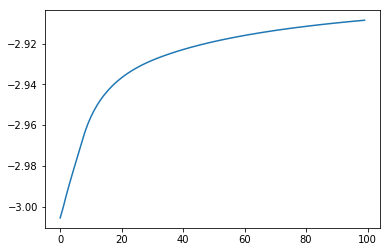

[[[2.21483711 4.37501012]
  [1.35230657 2.22242986]]

 [[1.21167087 3.31267341]
  [2.84031482 1.17301935]]]


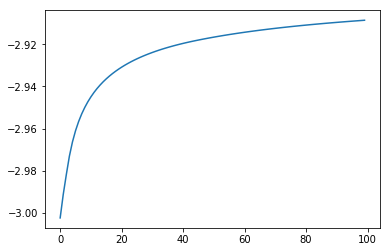

[[[5.38366548 2.59352762]
  [1.3289725  3.44081365]]

 [[3.35379482 1.2018209 ]
  [2.20031014 1.2798963 ]]]


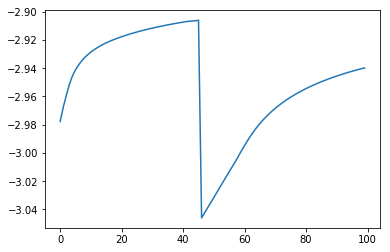

[[[3.16803739 1.89338734]
  [1.82463943 1.30177416]]

 [[3.62284075 2.2052069 ]
  [2.25845073 1.17301935]]]


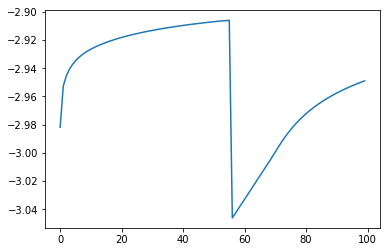

[[[5.50880516 1.37907053]
  [1.14088979 3.67506445]]

 [[4.12463816 1.17236376]
  [2.74899661 1.17301935]]]


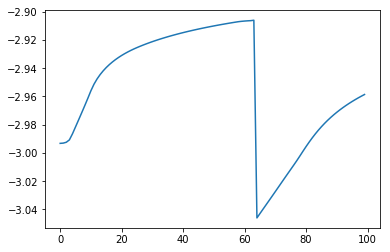

[[[6.10001504 1.79683799]
  [1.64355139 1.17301935]]

 [[3.61814942 1.17236376]
  [2.64438127 1.17301935]]]


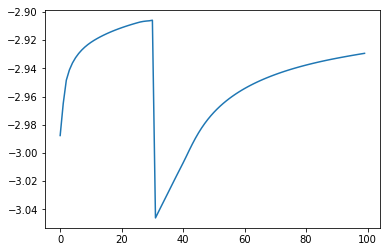

[[[1.21167087 4.47132296]
  [1.14088979 4.54375926]]

 [[1.21167087 3.62888002]
  [1.3859778  1.592821  ]]]


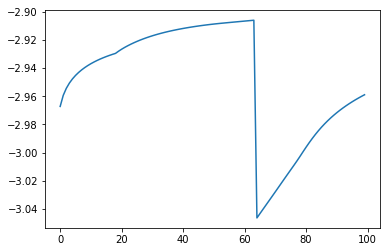

[[[2.5932245  4.30683708]
  [1.6290952  1.77576582]]

 [[1.21167087 3.21287143]
  [1.76008484 1.4509115 ]]]


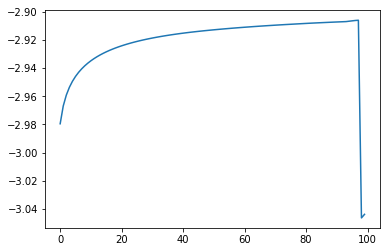

[[[4.13729991 1.47515964]
  [1.1408898  4.48213784]]

 [[4.2229892  1.53390941]
  [2.47616229 1.17301935]]]


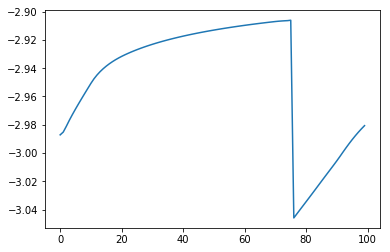

[[[5.90262995 1.6305996 ]
  [1.1408898  4.59383202]]

 [[3.80464006 1.17236377]
  [1.58339932 1.50867294]]]


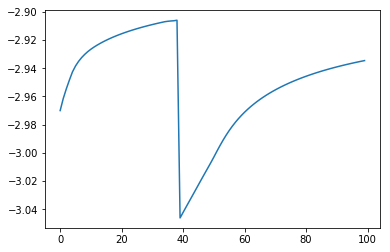

[[[4.72758705 3.46855371]
  [1.1408898  4.5959418 ]]

 [[2.36107857 1.84604228]
  [1.5138401  1.53570018]]]


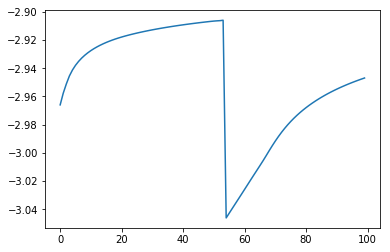

[1.57522181 0.66530316] -2.905828128257032
1.8666666666666667


[[[6.74712524 1.15450203]
  [1.12625222 3.87235251]]

 [[3.79746695 1.15442455]
  [1.25492537 1.74423773]]]


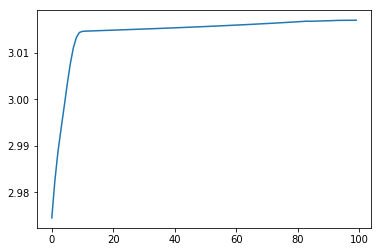

[[[5.94432949 1.73347792]
  [1.39918417 2.42714152]]

 [[3.74035996 1.15434503]
  [2.72854764 1.15493207]]]


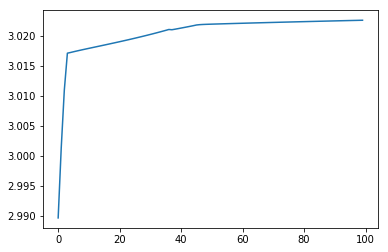

[[[2.62962487 4.53076017]
  [1.12616131 5.46868673]]

 [[1.189543   3.08317623]
  [1.40076107 1.47520161]]]


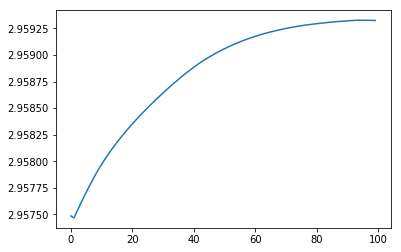

[[[4.46118272 4.1663826 ]
  [1.39541259 1.15493211]]

 [[1.61861336 2.21747716]
  [3.16575438 1.15493207]]]


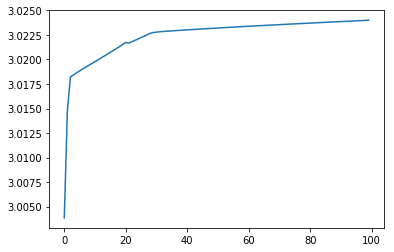

[[[3.81107583 1.78675077]
  [1.24274677 3.71528186]]

 [[3.8517415  1.81463172]
  [2.58888138 1.15493207]]]


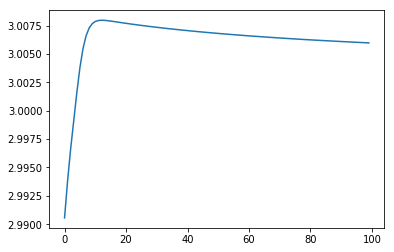

[[[2.09824477 2.74788151]
  [1.12616131 5.26310266]]

 [[2.57117366 3.07212821]
  [1.12616133 1.61028609]]]


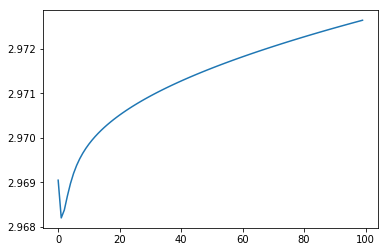

[[[1.189543   4.69583782]
  [1.12616131 3.00292264]]

 [[1.189543   3.5207071 ]
  [3.05013905 1.15493207]]]


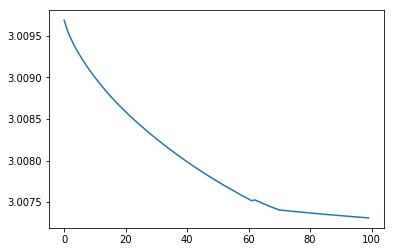

[[[6.2802145  1.15434502]
  [1.12616131 5.42246389]]

 [[3.98323328 1.15434502]
  [1.39835728 1.48227959]]]


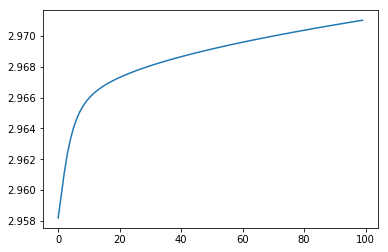

[[[4.15092987 2.24270954]
  [1.12616131 5.3275216 ]]

 [[3.46511652 1.77250628]
  [2.26429929 1.15493207]]]


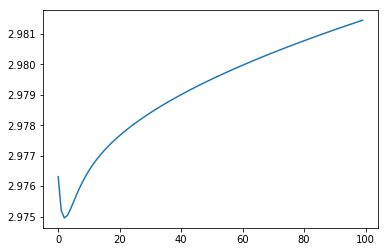

[[[6.38236557 1.74937859]
  [1.24898727 3.39072281]]

 [[3.55592308 1.15434502]
  [2.68680018 1.15493207]]]


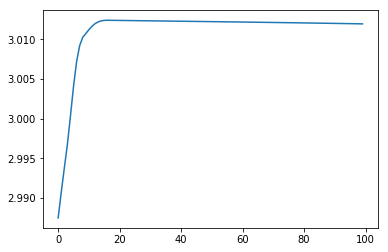

[[[2.84322194 3.90595901]
  [1.12616131 6.33048305]]

 [[1.5665391  3.03064734]
  [1.92524317 1.15493249]]]


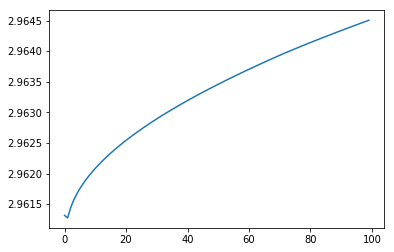

[[[6.05093109 2.81642253]
  [1.12616131 4.10786718]]

 [[2.99419023 1.15434505]
  [2.67660823 1.15493207]]]


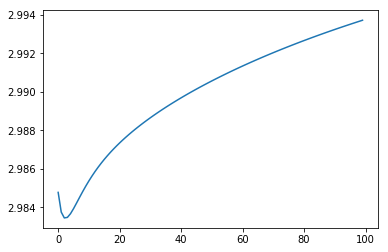

[[[6.14548249 2.30097798]
  [1.12616131 6.39962356]]

 [[3.29159405 1.15434502]
  [1.78739235 1.19987358]]]


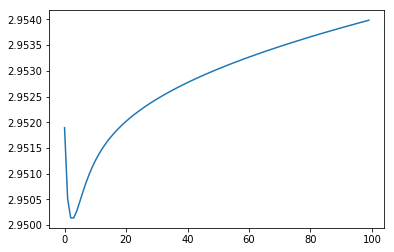

[[[6.37486888 1.15434503]
  [1.1859718  3.35049251]]

 [[3.94561165 1.15434502]
  [2.81955096 1.15493207]]]


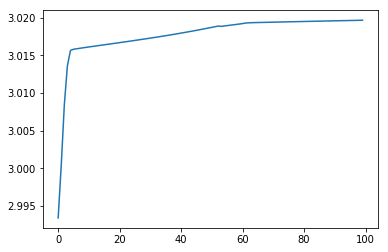

[[[5.30443696 3.00551732]
  [1.12616131 6.0163998 ]]

 [[2.93041288 1.37785309]
  [1.35937732 1.41875996]]]


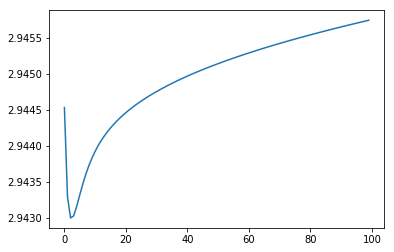

[[[6.71745973 1.15434502]
  [1.12616159 3.76115578]]

 [[3.80944447 1.15434502]
  [2.01718761 1.45981675]]]


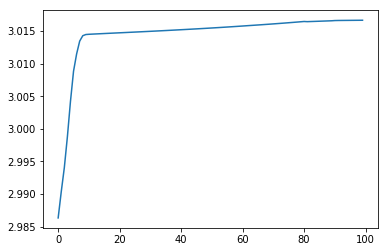

[[[6.1905312  1.15434502]
  [1.12616131 4.72631228]]

 [[4.01887907 1.15434502]
  [2.46754045 1.15493207]]]


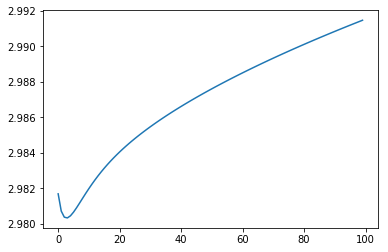

[[[5.85752834 3.588699  ]
  [1.45342075 2.98358181]]

 [[2.45860539 1.25834974]
  [2.14430637 1.2701855 ]]]


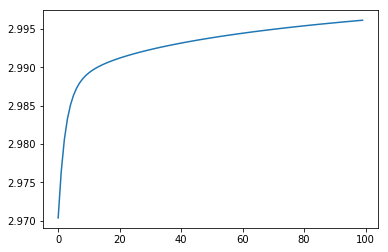

[[[3.4693323  2.51072845]
  [1.12616138 3.07513891]]

 [[3.06892857 2.23620603]
  [3.02572593 1.15493207]]]


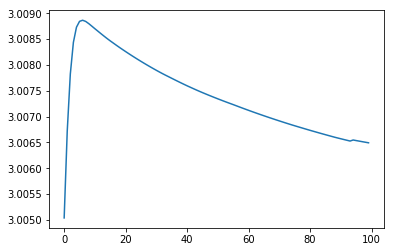

[[[2.91746435 4.23474692]
  [1.40154101 1.75228733]]

 [[1.25500692 3.09494277]
  [2.95222838 1.15493207]]]


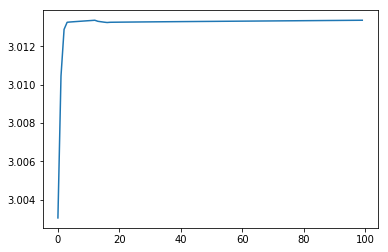

[[[5.38479137 2.65533881]
  [1.49655747 3.13731028]]

 [[3.29276903 1.22101893]
  [2.30435715 1.15493207]]]


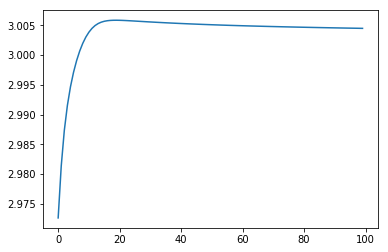

[[[2.66391435 4.64689475]
  [1.4090026  2.24052565]]

 [[1.189543   2.99935325]
  [2.773069   1.15493207]]]


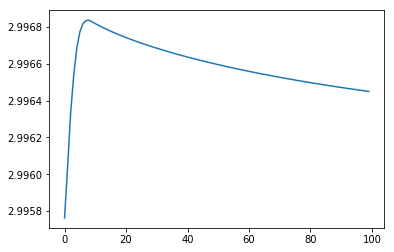

[[[1.96310046 3.04446636]
  [1.12616131 4.78880008]]

 [[2.25141676 3.24214007]
  [1.12616132 1.67323156]]]


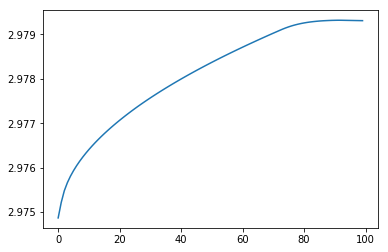

[[[1.68897067 3.18470993]
  [1.15195256 4.27576409]]

 [[2.05992393 3.43904069]
  [2.57108348 1.15493207]]]


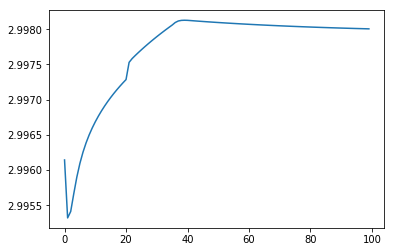

[[[3.18258621 2.52424849]
  [1.12616131 4.89097057]]

 [[3.00057478 2.3994589 ]
  [1.12616131 1.65967235]]]


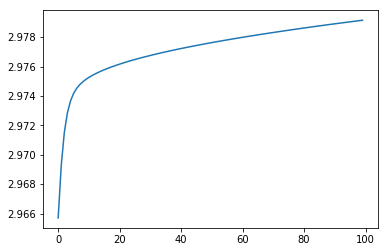

[0.85340288 1.08529856] 3.024000003714619


[[[6.74712524 1.15450203]
  [1.12625222 3.87235251]]

 [[3.79746695 1.15442455]
  [1.25492537 1.74423773]]]


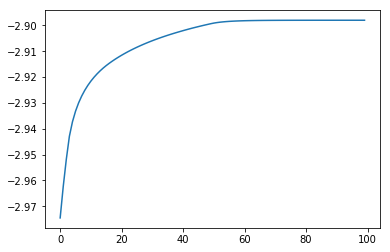

[[[4.63375446 4.14038802]
  [1.52497594 2.18416494]]

 [[1.67744405 2.1135001 ]
  [1.82097143 1.45009614]]]


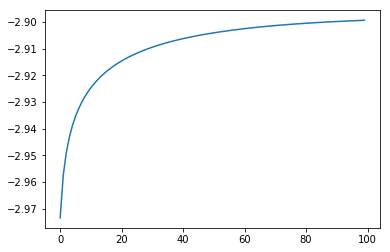

[[[3.1581098  4.56012737]
  [1.34302587 1.15493207]]

 [[1.189543   2.86761807]
  [3.26480812 1.15493207]]]


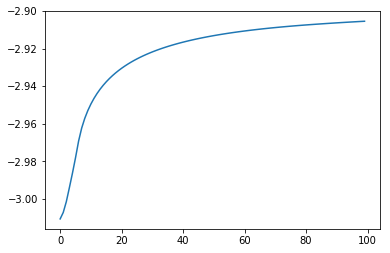

[[[2.90363764 3.70874945]
  [1.30798964 2.62211828]]

 [[1.77351281 2.93392001]
  [1.72366607 1.59124073]]]


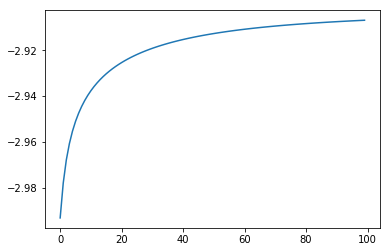

[[[5.29444476 2.22673969]
  [1.12616131 4.45636003]]

 [[3.67809696 1.15434515]
  [2.55879886 1.15493207]]]


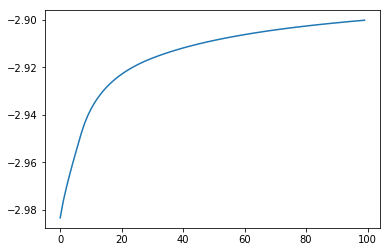

[[[4.3477632  2.16155746]
  [1.12616131 6.05792275]]

 [[3.58324701 1.63739443]
  [1.68521407 1.28533391]]]


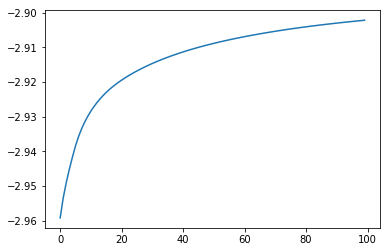

[[[2.41966172 2.52721683]
  [1.39276907 2.20033565]]

 [[2.8514105  2.82322986]
  [1.62566263 1.62275913]]]


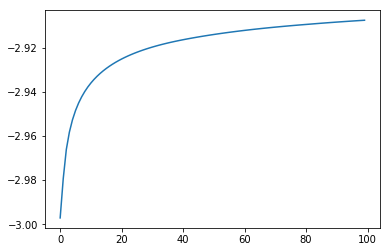

[[[1.18954303 4.41879485]
  [1.12616131 5.14301684]]

 [[1.189543   3.6900846 ]
  [2.32667184 1.15493207]]]


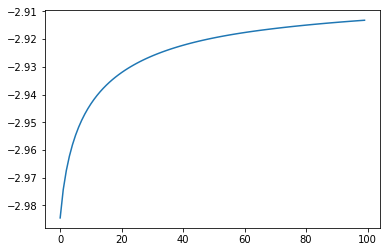

[[[3.56743745 2.47014008]
  [1.12616131 3.54475712]]

 [[3.12794632 2.16881879]
  [1.12616142 1.83833047]]]


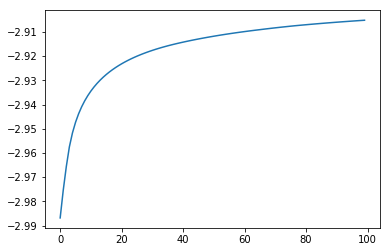

[[[5.84191888 1.15434502]
  [1.12616131 6.40511935]]

 [[4.15743957 1.15434502]
  [1.12616131 1.45872721]]]


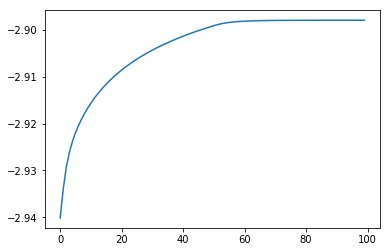

[[[3.6246793  4.26131838]
  [1.16004816 2.58166757]]

 [[1.36422591 2.71151981]
  [3.12847211 1.15493207]]]


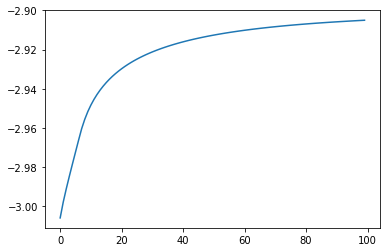

[[[5.03562082 3.65436259]
  [1.12616131 6.17256805]]

 [[2.23601818 1.73491572]
  [1.49097514 1.34637256]]]


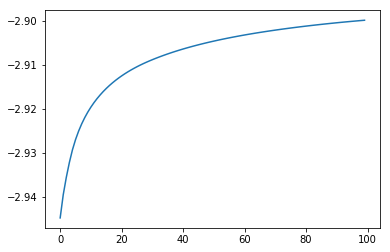

[[[4.87611373 1.28047923]
  [1.12616131 5.80872618]]

 [[4.45933748 1.15434502]
  [1.25252129 1.4882697 ]]]


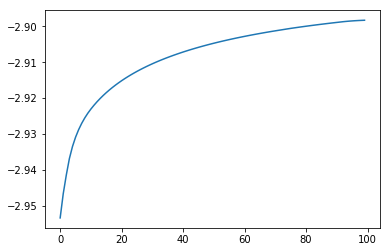

[[[2.55407875 2.37623037]
  [1.40784328 3.02051568]]

 [[3.02676979 2.70031398]
  [2.51158239 1.15493207]]]


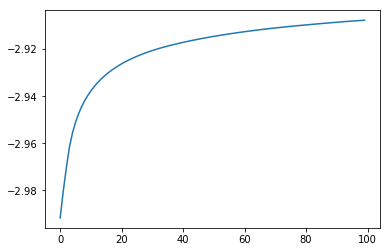

[[[1.99865704 4.34751808]
  [1.12616134 2.67921431]]

 [[1.189543   3.43112884]
  [3.15956986 1.15493207]]]


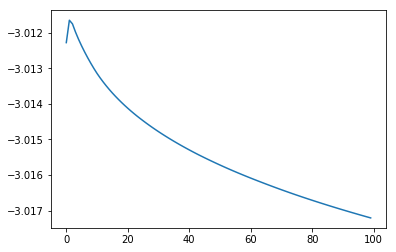

[[[5.98004358 1.15434502]
  [1.53215743 1.15493207]]

 [[4.10254011 1.15434502]
  [2.90719482 1.15493207]]]


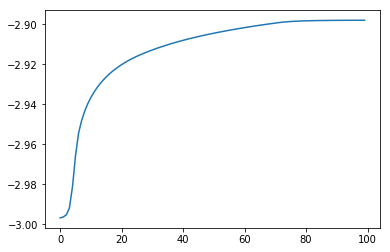

[[[6.16208719 2.87128897]
  [1.12616131 3.07778688]]

 [[2.91435241 1.15434504]
  [3.0248309  1.15493207]]]


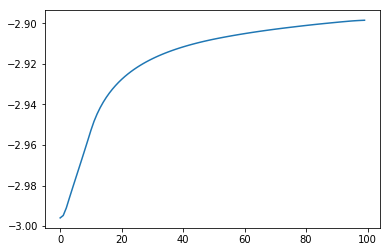

[[[6.83460808 1.15434502]
  [1.12616131 4.33957872]]

 [[3.76288234 1.15434502]
  [2.59827723 1.15493207]]]


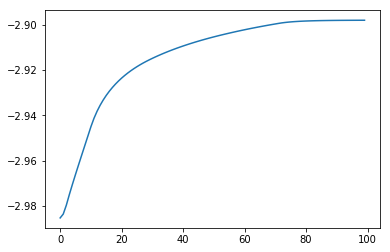

[[[1.18954448 4.30112104]
  [1.31223441 1.44347269]]

 [[1.189543   3.76202703]
  [3.22548688 1.15493207]]]


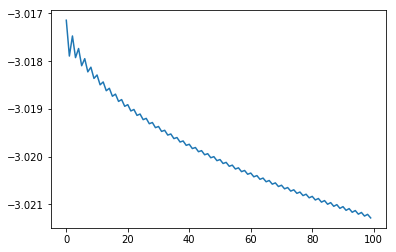

[[[6.39724823 1.52102202]
  [1.36862266 2.41765996]]

 [[3.69841541 1.15434502]
  [2.78953916 1.15493207]]]


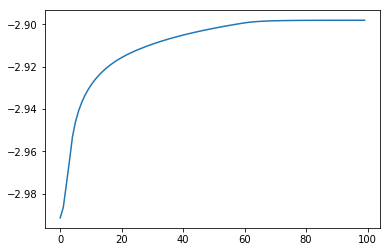

[[[4.71688839 1.20071949]
  [1.12616131 4.71831206]]

 [[4.57445883 1.15434524]
  [1.12616131 1.68258614]]]


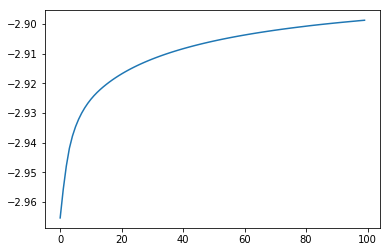

[[[6.54569275 1.15434527]
  [1.12616131 6.29015867]]

 [[3.87771533 1.15434502]
  [1.12616131 1.47398383]]]


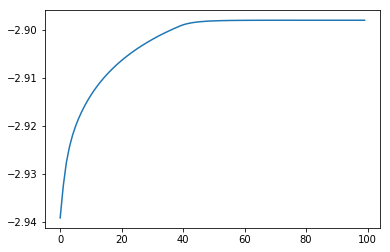

[[[1.189543   4.90027431]
  [1.12616131 3.59860036]]

 [[1.189543   3.39571948]
  [1.3294673  1.75137198]]]


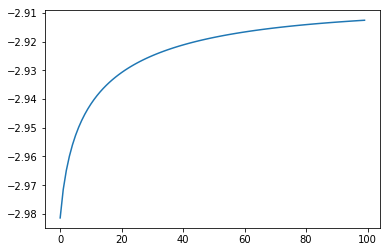

[[[3.9754736  3.08801436]
  [1.21053225 1.15493207]]

 [[2.59396406 2.14083203]
  [3.5153294  1.15493207]]]


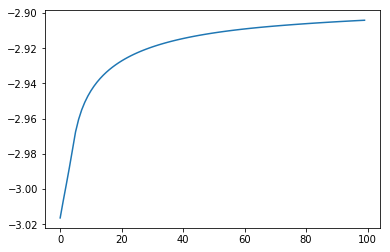

[[[2.97642577 2.89760536]
  [1.12617396 3.57296744]]

 [[2.59114144 2.63344901]
  [1.95260885 1.51013438]]]


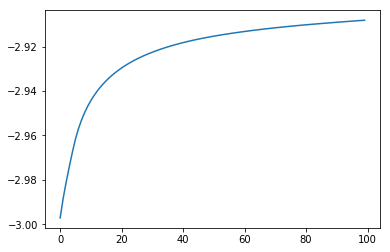

[1.62304751 0.63747544] -2.897998391263397
1.9770833333333333


[[[5.94620452 1.63613392]
  [1.11298097 4.5509485 ]]

 [[3.8199441  1.13829042]
  [2.59293025 1.13876355]]]


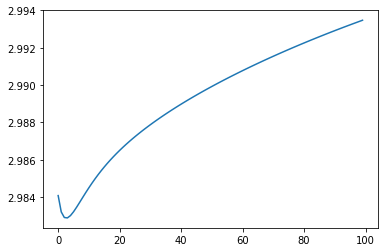

[[[4.68937765 3.34617361]
  [1.24662647 1.45189624]]

 [[2.47500895 1.82797136]
  [3.38794885 1.13873562]]]


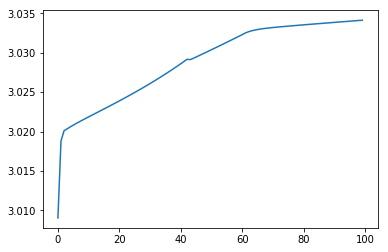

[[[1.79984309 4.71897522]
  [1.11297253 5.85109862]]

 [[1.16972835 3.29700677]
  [1.11297253 1.54721967]]]


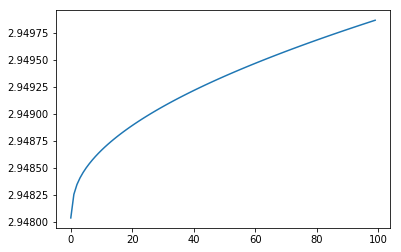

[[[4.24402541 3.37598259]
  [1.11297253 5.36530148]]

 [[2.36011747 2.08434887]
  [1.1129731  1.61169037]]]


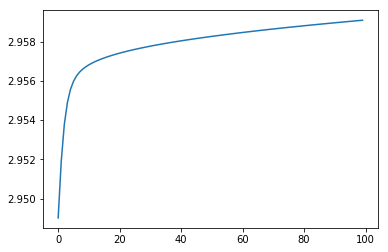

[[[5.17260468 1.13821016]
  [1.11297253 3.28410217]]

 [[4.45110478 1.13820994]
  [3.02127972 1.13873562]]]


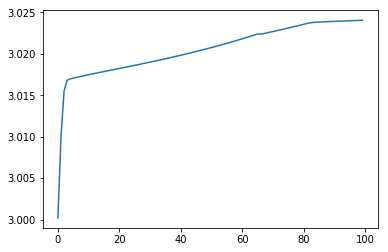

[[[1.16972837 5.03211225]
  [1.11297253 3.43258321]]

 [[1.16972835 3.34116597]
  [2.97108512 1.13873562]]]


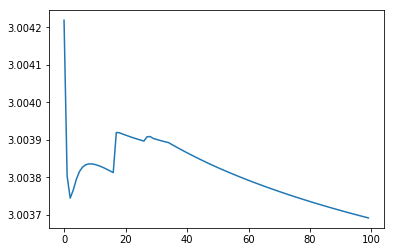

[[[3.27461922 2.78186107]
  [1.11297253 4.27528676]]

 [[2.76297257 2.43106895]
  [1.90032066 1.44725477]]]


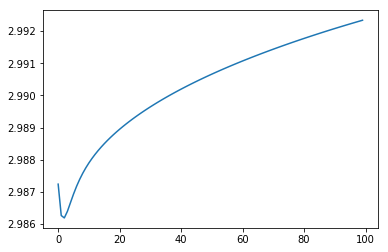

[[[5.69922562 1.13820994]
  [1.18693042 1.71127985]]

 [[4.24179258 1.13820994]
  [3.41313756 1.13873562]]]


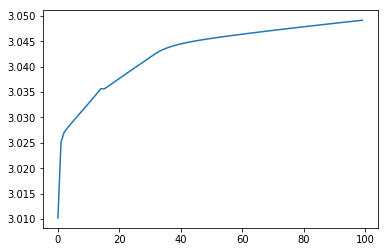

[[[2.85271457 3.74345433]
  [1.63510651 2.17609167]]

 [[1.72936738 2.97327173]
  [2.40858681 1.13873562]]]


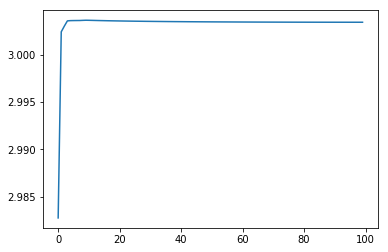

[[[1.4357231  4.84089713]
  [1.19329938 3.6396835 ]]

 [[1.16972835 3.3586133 ]
  [2.74919062 1.13873562]]]


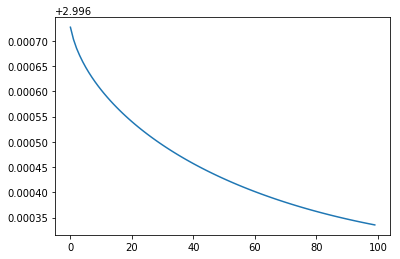

[[[6.52578373 1.13820994]
  [1.11297253 3.61247265]]

 [[3.91326632 1.13820994]
  [1.65240087 1.63254509]]]


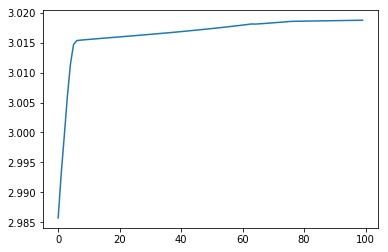

[[[3.74650284 2.75522108]
  [1.11297253 3.43357098]]

 [[2.87980928 2.16100381]
  [1.44825732 1.73642915]]]


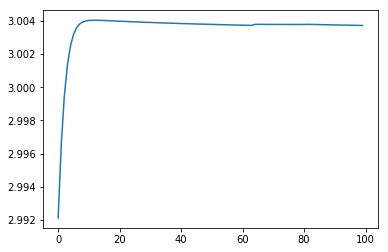

[[[6.06056127 3.78452218]
  [1.11297253 5.67810182]]

 [[2.30349825 1.20862707]
  [2.21197879 1.13873562]]]


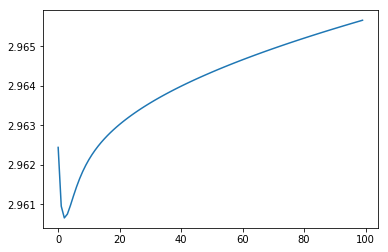

[[[4.93558613 4.3047427 ]
  [1.19944135 3.43908415]]

 [[1.57245167 1.99893051]
  [1.99941859 1.45514037]]]


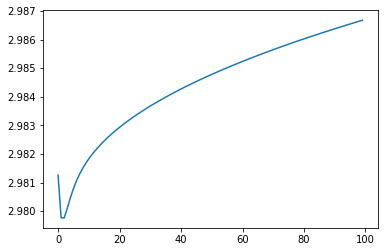

[[[1.16972835 4.57400652]
  [1.27246171 1.97352813]]

 [[1.16972835 3.62124096]
  [3.16275942 1.13873562]]]


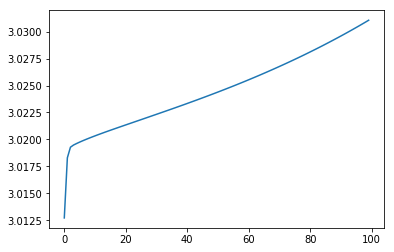

[[[5.6810404  1.55635926]
  [1.11297253 4.74335051]]

 [[3.97726768 1.13820994]
  [2.06364358 1.32102072]]]


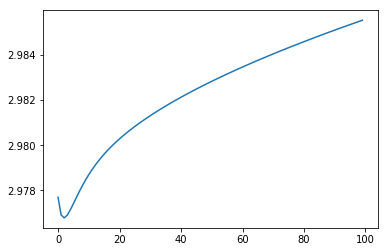

[[[3.98385196 3.31743142]
  [1.11297253 4.15864503]]

 [[2.36826447 2.20976197]
  [2.72563709 1.13873562]]]


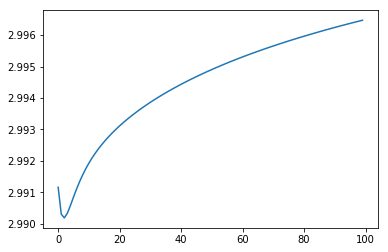

[[[6.2349912  2.42604732]
  [1.42861685 1.82549452]]

 [[3.19188743 1.13820994]
  [2.91754186 1.13873562]]]


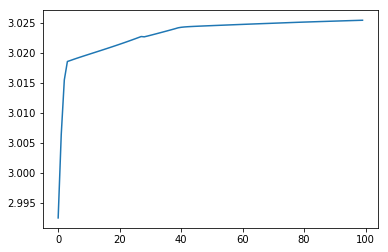

[[[2.3998046  3.99764633]
  [1.11297253 3.71928828]]

 [[1.39070968 3.30579669]
  [1.20489569 1.79404891]]]


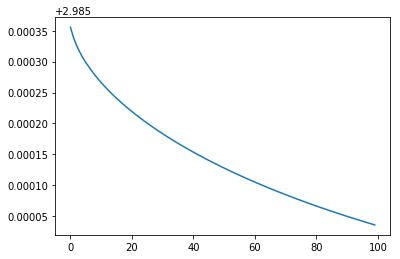

[[[2.00712065 2.50851027]
  [1.11297253 3.27483186]]

 [[2.79087665 3.04586438]
  [1.11297273 1.88912013]]]


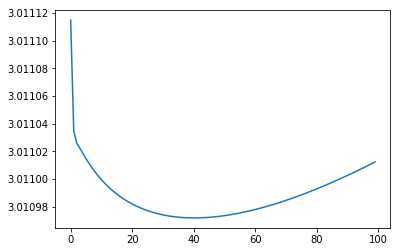

[[[6.3353832  1.13820994]
  [1.11297253 6.28423115]]

 [[3.98894348 1.13820994]
  [1.11297253 1.48973795]]]


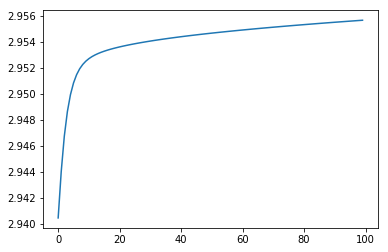

[[[1.67757615 4.6751487 ]
  [1.29034137 2.69057221]]

 [[1.16972835 3.36951762]
  [2.88655269 1.13873562]]]


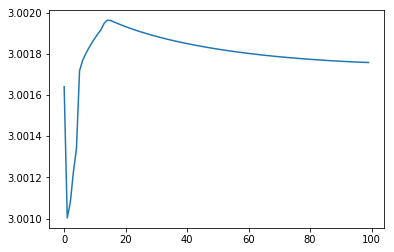

[[[6.70311326 1.51988356]
  [1.11297253 6.38894924]]

 [[3.59473688 1.13820994]
  [1.35146543 1.38221421]]]


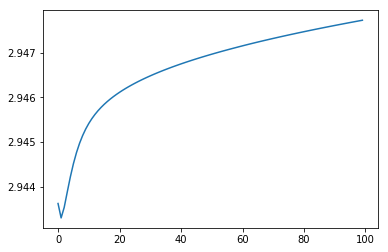

[[[1.36939059 3.9043475 ]
  [1.81512879 1.46530604]]

 [[1.28565904 3.84693998]
  [2.30848134 1.13873562]]]


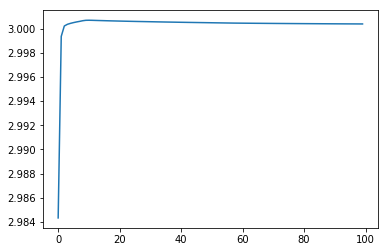

[[[5.30043735 3.53930583]
  [1.11297253 3.57999878]]

 [[2.40077104 1.55125391]
  [1.11297253 1.84862101]]]


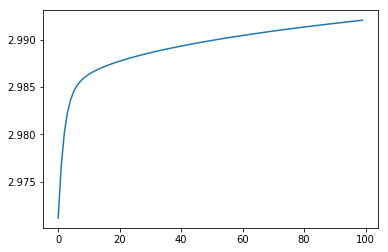

[0.69973636 1.17471051] 3.0491573667233727


[[[5.94620452 1.63613392]
  [1.11298097 4.5509485 ]]

 [[3.8199441  1.13829042]
  [2.59293025 1.13876355]]]


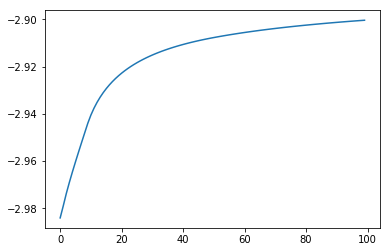

[[[5.52978426 2.7656436 ]
  [1.11297253 6.97821856]]

 [[3.21126858 1.17603754]
  [1.77246925 1.13873562]]]


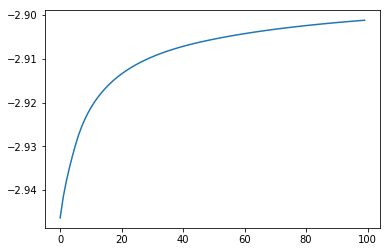

[[[3.99309496 3.49169098]
  [1.20199754 2.79151204]]

 [[2.19738041 2.26052388]
  [1.65196867 1.67558354]]]


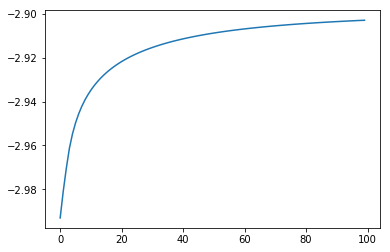

[[[3.05554215 1.88155322]
  [1.11297253 5.61601909]]

 [[3.61300494 2.26375752]
  [2.23296608 1.13873562]]]


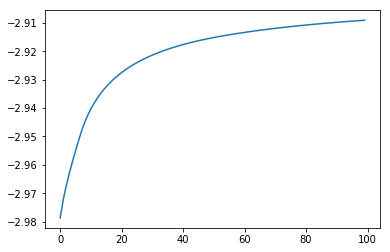

[[[5.63385129 3.29035275]
  [1.39972124 2.14713131]]

 [[2.71133524 1.28663475]
  [1.60752389 1.63178028]]]


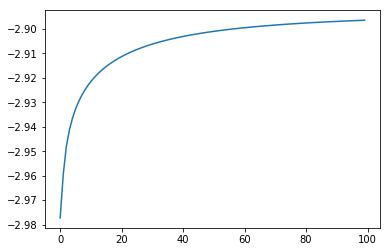

[[[5.55477612 1.13820994]
  [1.73764719 2.11069459]]

 [[4.29920592 1.13820994]
  [2.23680882 1.13873562]]]


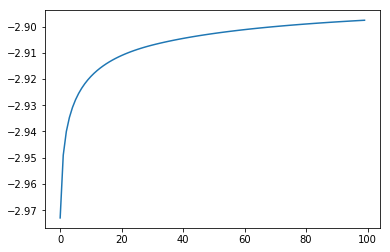

[[[2.73090871 3.03908155]
  [1.11297253 4.7037377 ]]

 [[2.40391129 2.81488753]
  [1.11297253 1.6994878 ]]]


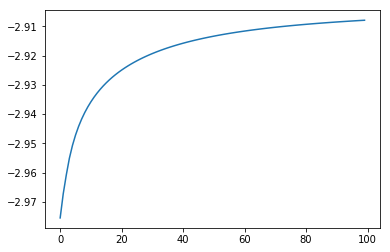

[[[4.10045787 4.6407957 ]
  [1.11297253 5.31134205]]

 [[1.16972836 2.48458992]
  [1.11297253 1.61885164]]]


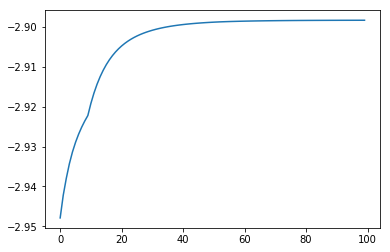

[[[4.72495925 2.65124356]
  [1.59996031 1.52512231]]

 [[3.17036217 1.58538999]
  [2.69510461 1.13873562]]]


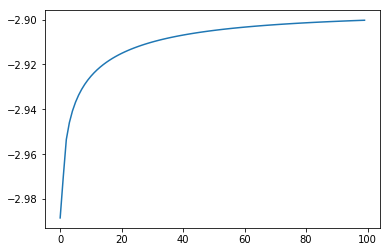

[[[5.64861223 1.13820994]
  [1.11297253 6.02555631]]

 [[4.26190953 1.13820994]
  [1.71815893 1.28648586]]]


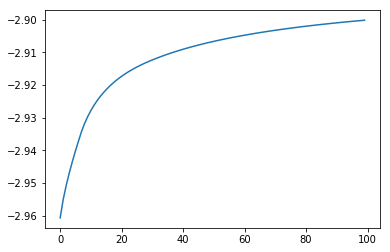

[[[1.41640433 4.35056069]
  [1.15226535 1.13873562]]

 [[1.16972835 3.66561678]
  [3.67223371 1.13873562]]]


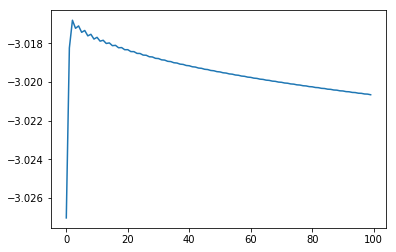

[[[4.78612349 2.32827323]
  [1.11297253 5.04312019]]

 [[3.50208256 1.44791675]
  [2.42663681 1.13873562]]]


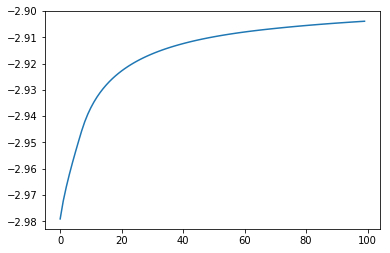

[[[4.58636993 3.75722906]
  [1.11297253 6.42236833]]

 [[2.04799444 2.01688319]
  [1.11297253 1.47140554]]]


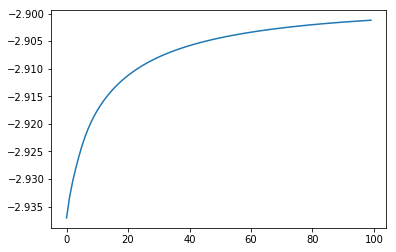

[[[5.32818565 3.50187691]
  [1.11297253 6.45824688]]

 [[2.44317372 1.52387224]
  [1.11297253 1.46664404]]]


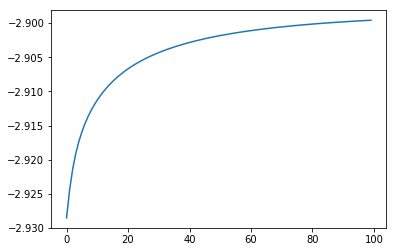

[[[6.31479423 3.63767239]
  [1.54527906 2.26750618]]

 [[2.37274045 1.13820994]
  [1.89753671 1.39390738]]]


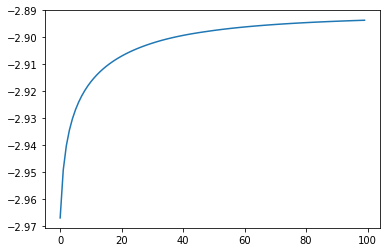

[[[5.16293099 3.11089618]
  [1.12027788 2.20559515]]

 [[2.79888273 1.49007151]
  [3.37206014 1.13873562]]]


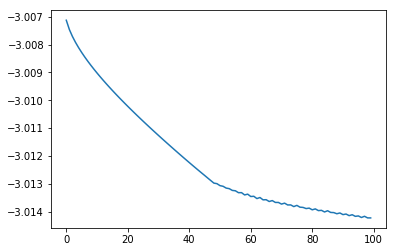

[[[6.79010595 1.13820994]
  [1.39501933 1.13873562]]

 [[3.80820802 1.13820994]
  [3.21323016 1.13873562]]]


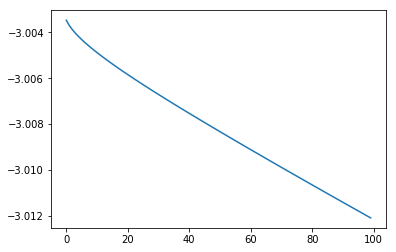

[[[5.6683427  1.81316917]
  [1.62653377 2.05219386]]

 [[3.81541525 1.13820994]
  [2.46668043 1.13873562]]]


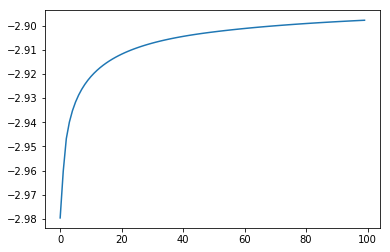

[[[2.14979368 2.95595503]
  [1.11297253 1.94577955]]

 [[2.37489529 3.11028786]
  [3.47370491 1.13873562]]]


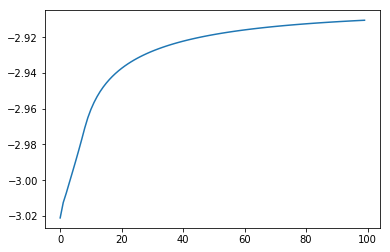

[[[4.93597948 3.20706813]
  [1.11297253 4.76474109]]

 [[2.66009812 1.64669193]
  [2.16951288 1.27662027]]]


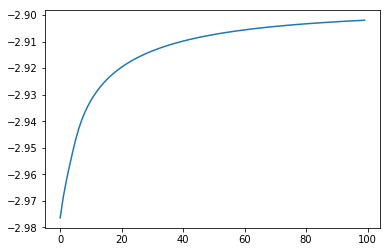

[[[3.56755473 2.04097486]
  [1.11297253 5.98009677]]

 [[3.55318378 2.03112193]
  [1.11297254 1.53010011]]]


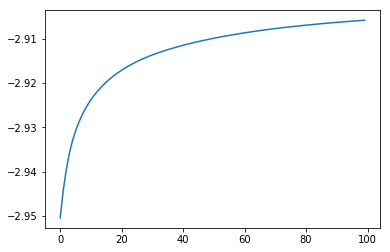

[[[6.77358608 1.13820994]
  [1.11297253 6.5458819 ]]

 [[3.81477405 1.13820994]
  [1.11297253 1.45501385]]]


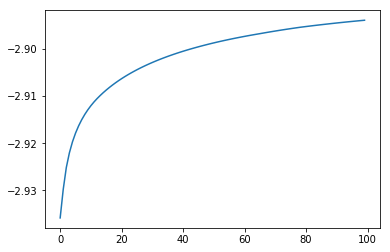

[[[4.76360279 2.45220708]
  [1.52900496 1.13873563]]

 [[3.37497311 1.50014308]
  [2.95988776 1.13873562]]]


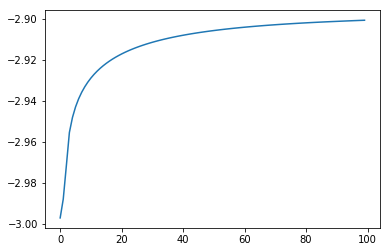

[[[5.35727272 1.13820994]
  [1.32334656 2.08147301]]

 [[4.37770621 1.13820994]
  [3.03005426 1.13873562]]]


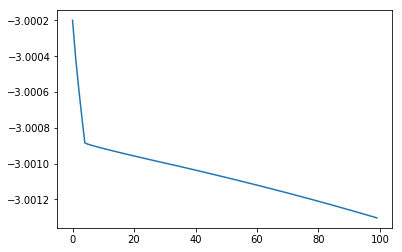

[[[3.3492894  3.62451298]
  [1.11297253 7.13163203]]

 [[1.94238822 2.65992178]
  [1.11297262 1.37727797]]]


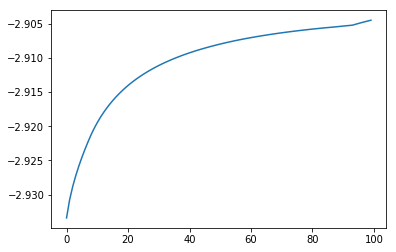

[1.64945155 0.62211207] -2.8936756798966847
2.0875


[[[7.41803951 3.1112342 ]
  [1.10134403 3.27532942]]

 [[2.29160503 1.12387828]
  [1.43147271 1.77265056]]]


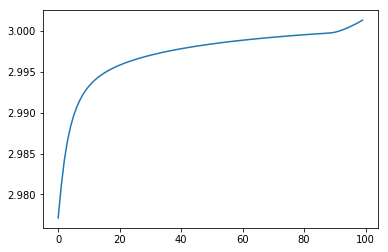

[[[1.15198516 4.73733869]
  [1.10116249 6.23671969]]

 [[1.15198511 3.54470946]
  [1.10116249 1.50944606]]]


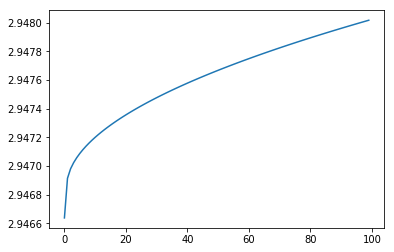

[[[1.15198511 5.40072425]
  [1.10116249 5.35806443]]

 [[1.15198511 3.13913128]
  [1.10116249 1.62605382]]]


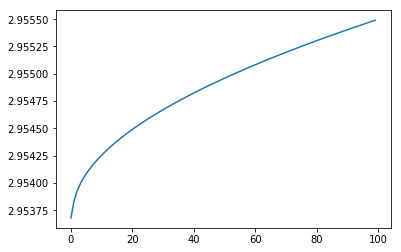

[[[1.15198511 5.28639178]
  [1.16473647 1.12423249]]

 [[1.15198511 3.20903144]
  [3.69049989 1.12423233]]]


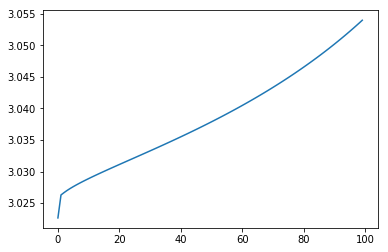

[[[3.47999692 3.74426598]
  [1.10116249 3.58314047]]

 [[1.84878908 2.625887  ]
  [2.97946326 1.12423233]]]


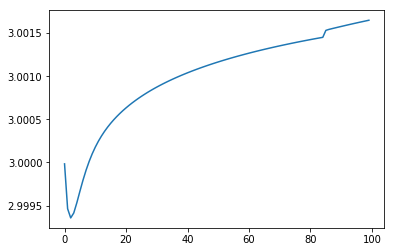

[[[2.32102212 2.36740348]
  [1.10116251 4.68564159]]

 [[2.99084744 2.82664513]
  [1.54022423 1.54292733]]]


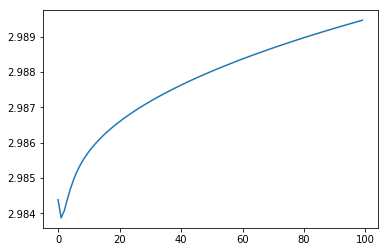

[[[5.96120622 1.1237616 ]
  [1.10116249 2.95807819]]

 [[4.16241349 1.1237616 ]
  [3.19076801 1.12423233]]]


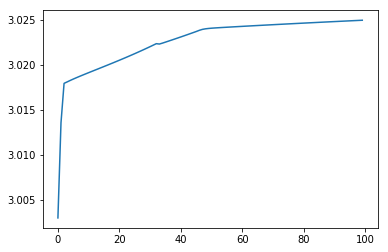

[[[7.24243112 1.1237616 ]
  [1.10116249 3.51883101]]

 [[3.65317399 1.1237616 ]
  [3.00120331 1.12423233]]]


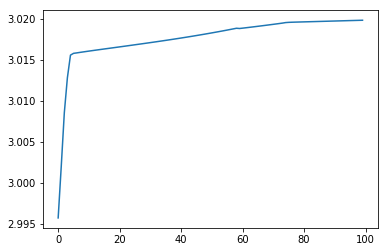

[[[2.86856021 4.72290084]
  [1.1011625  4.80610983]]

 [[1.15198512 2.9116985 ]
  [2.56603363 1.12423234]]]


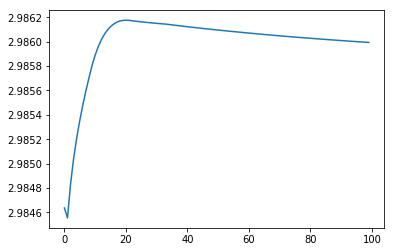

[[[7.49948451 1.24316856]
  [1.10116249 7.44848871]]

 [[3.47340288 1.1237616 ]
  [1.10116249 1.34863023]]]


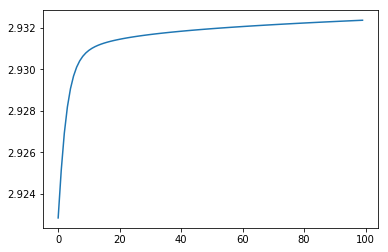

[[[5.0179791  2.79390375]
  [1.10116249 7.19358409]]

 [[3.08517572 1.46874662]
  [1.75893869 1.12423233]]]


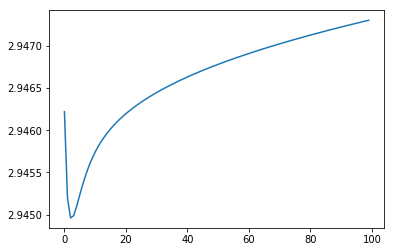

[[[4.86479667 1.42160968]
  [1.3217566  1.35030784]]

 [[4.40462437 1.12376309]
  [3.31717778 1.12423233]]]


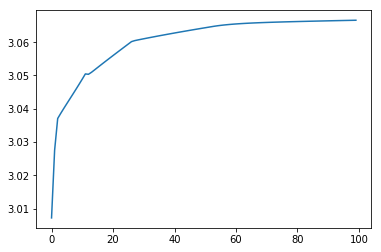

[[[5.84533694 1.84786833]
  [1.10116249 3.14166819]]

 [[3.73787442 1.1237616 ]
  [3.12870468 1.12423233]]]


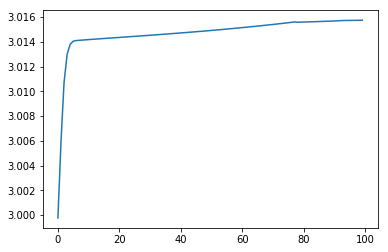

[[[7.29035248 1.1237616 ]
  [1.10116249 2.71398654]]

 [[3.63412703 1.1237616 ]
  [1.21346426 1.93286678]]]


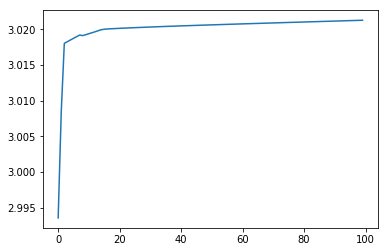

[[[4.53741488 1.96445007]
  [1.10116249 3.62207711]]

 [[3.81488906 1.46907623]
  [1.10116249 1.85643951]]]


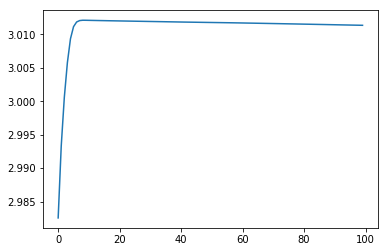

[[[5.94621342 3.36435404]
  [1.10116249 2.7450512 ]]

 [[2.6978829  1.13725305]
  [3.26278261 1.12423233]]]


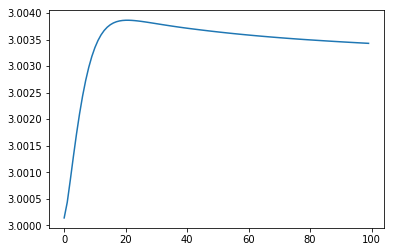

[[[1.92266036 4.20787444]
  [1.10116249 5.96567661]]

 [[1.15198511 3.58025117]
  [1.10116249 1.54541663]]]


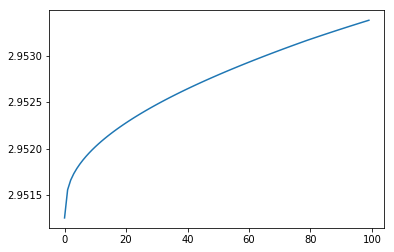

[[[3.83872485 2.5203891 ]
  [1.10836529 2.72152049]]

 [[3.13015517 2.03458378]
  [3.25711806 1.12423233]]]


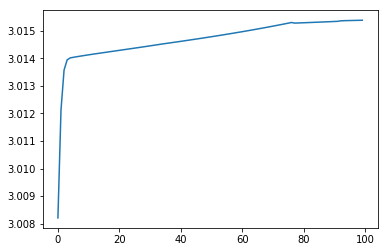

[[[2.04314592 3.36875613]
  [1.10116252 3.4167078 ]]

 [[1.94545355 3.30177686]
  [1.32457908 1.79598654]]]


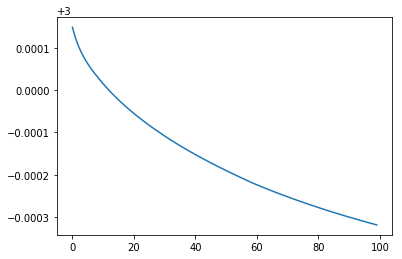

[[[4.95332283 2.55383454]
  [1.4742704  2.27747429]]

 [[3.3106431  1.42759026]
  [1.79333197 1.4862016 ]]]


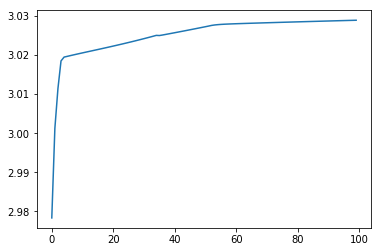

[[[3.23677315 4.11378466]
  [1.10116249 5.02597903]]

 [[1.436055   2.87918701]
  [1.77111    1.40712055]]]


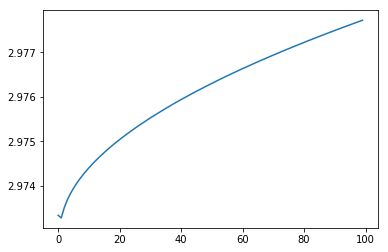

[[[6.99125607 1.1237616 ]
  [1.22037671 3.83865808]]

 [[3.75300679 1.1237616 ]
  [2.66767215 1.12423233]]]


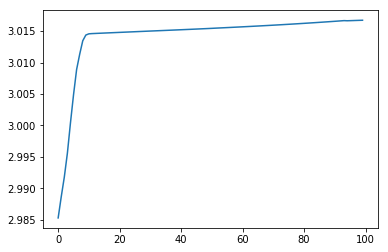

[[[6.3267839  4.25485068]
  [1.10116249 5.17948981]]

 [[1.88852348 1.21191711]
  [1.10116249 1.64975275]]]


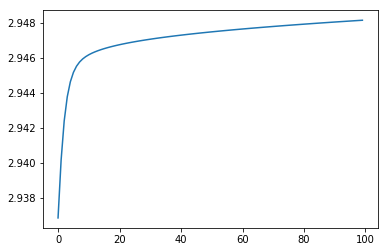

[[[2.97707041 3.92249535]
  [1.10116249 5.53991833]]

 [[1.57580857 2.96177056]
  [1.10116254 1.60191967]]]


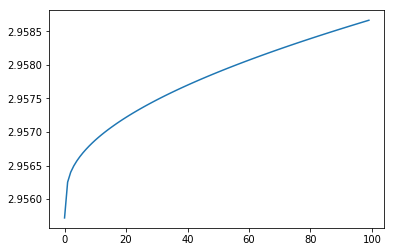

[[[3.95288685 3.27598415]
  [1.10116249 3.48657359]]

 [[2.40339543 2.21363108]
  [3.01210807 1.12423233]]]


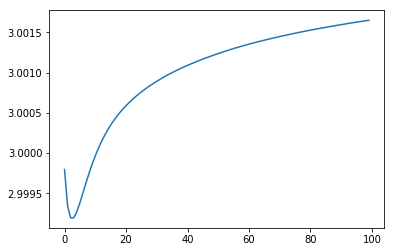

[0.59327586 1.23665529] 3.066586442478778


[[[7.41803951 3.1112342 ]
  [1.10134403 3.27532942]]

 [[2.29160503 1.12387828]
  [1.43147271 1.77265056]]]


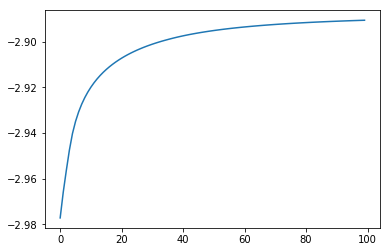

[[[6.81121287 2.14618873]
  [1.10116249 4.1767351 ]]

 [[3.16009774 1.1237616 ]
  [1.30224034 1.70389175]]]


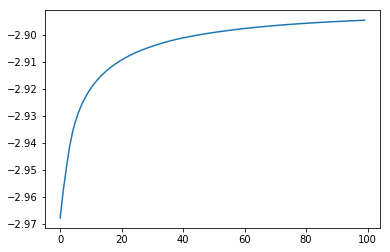

[[[7.6629675  2.09505894]
  [1.10116249 7.01819439]]

 [[2.85478575 1.1237616 ]
  [1.81822986 1.12423233]]]


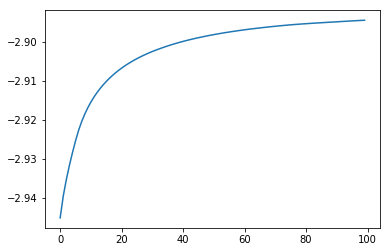

[[[5.54294529 1.2820497 ]
  [1.10116249 5.76379291]]

 [[4.22578621 1.1237616 ]
  [1.10116249 1.57220894]]]


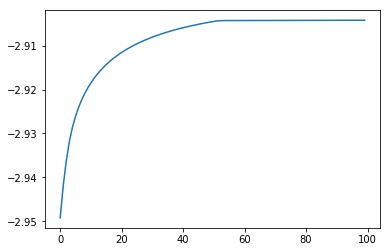

[[[3.89078843 3.58484521]
  [1.10116249 7.79093909]]

 [[2.08547539 2.34709725]
  [1.10116249 1.30318308]]]


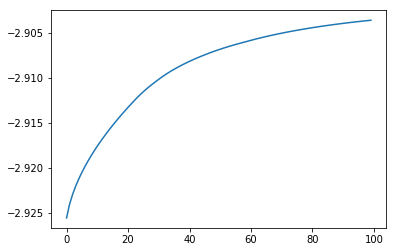

[[[4.79702726 4.32613658]
  [1.10116249 7.08179373]]

 [[1.52469831 2.08258192]
  [1.79672986 1.12423233]]]


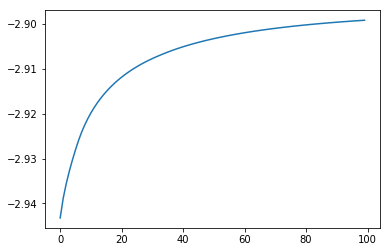

[[[1.15198515 5.16461363]
  [1.10116249 4.81486656]]

 [[1.15198511 3.2834837 ]
  [1.67787426 1.47173968]]]


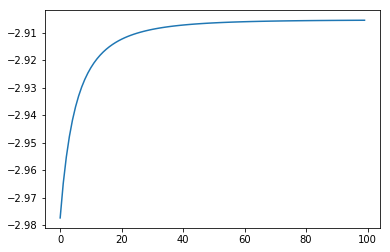

[[[7.75538064 1.12376161]
  [1.10116249 7.79438164]]

 [[3.44929554 1.1237616 ]
  [1.10116249 1.30272622]]]


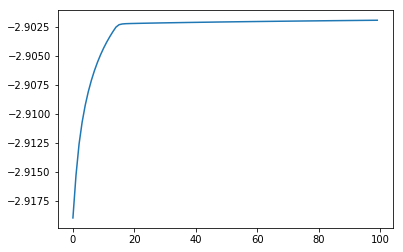

[[[4.16570273 1.58079757]
  [1.10116249 6.44609833]]

 [[4.12376734 1.55204607]
  [1.1011625  1.48165907]]]


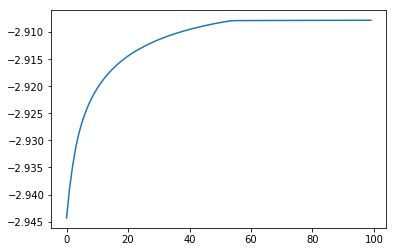

[[[4.85263884 2.85999052]
  [1.10116249 5.29370879]]

 [[2.98800788 1.58157336]
  [1.10116249 1.63459456]]]


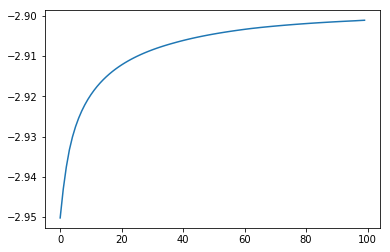

[[[5.46379049 1.49983027]
  [1.32328452 2.38774219]]

 [[4.11571296 1.1237616 ]
  [2.96358004 1.12423233]]]


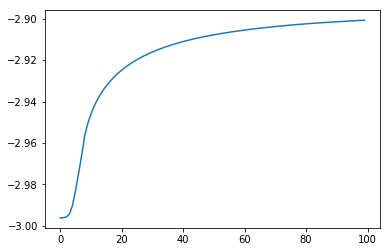

[[[6.43283126 2.64673534]
  [1.10116249 4.13064663]]

 [[2.98518804 1.12376161]
  [2.79437666 1.12423233]]]


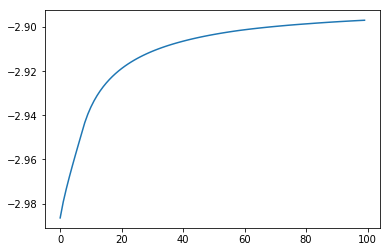

[[[5.39361544 2.68834827]
  [1.10116249 5.3338238 ]]

 [[3.26175461 1.22671462]
  [1.10116249 1.62927084]]]


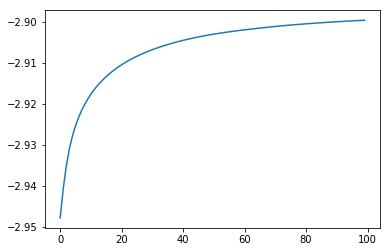

[[[3.7970512  2.47041302]
  [1.63556569 2.31048887]]

 [[3.17168401 2.0416525 ]
  [2.39922906 1.12423233]]]


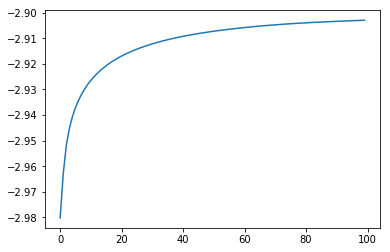

[[[4.72281602 2.31014023]
  [1.10116249 4.34897861]]

 [[3.50791506 1.47718707]
  [1.10116249 1.75997124]]]


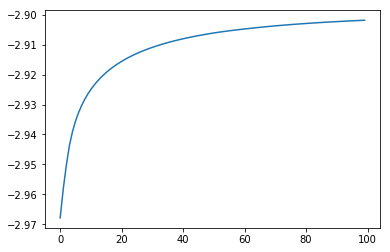

[[[4.05009    2.33190207]
  [1.20004466 3.9043789 ]]

 [[3.35741784 1.85699631]
  [2.25283559 1.29345725]]]


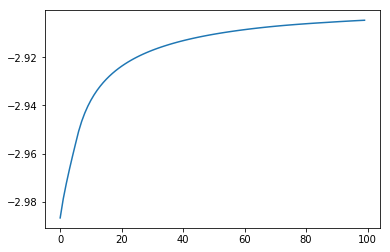

[[[7.85064991 1.1237616 ]
  [1.10116249 3.62019928]]

 [[3.41142953 1.1237616 ]
  [1.22512097 1.80802568]]]


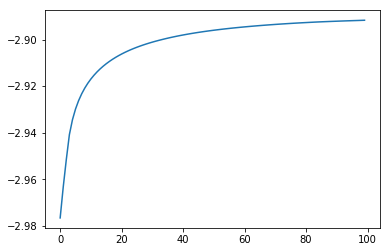

[[[7.32791536 1.77438634]
  [1.10116249 4.80025166]]

 [[3.19635987 1.1237616 ]
  [1.10116293 1.70008189]]]


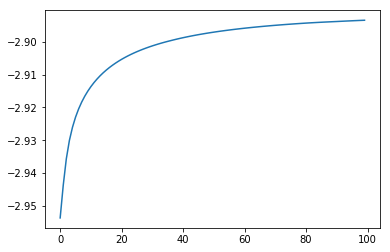

[[[5.17058678 4.6616403 ]
  [1.10116249 6.35821882]]

 [[1.2638797  1.98314709]
  [1.10116249 1.49332171]]]


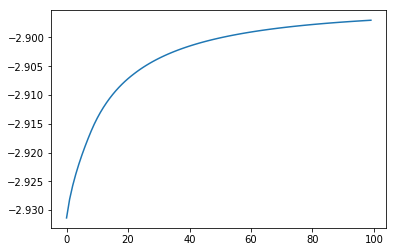

[[[4.5283248  4.68577388]
  [1.52958848 2.09677598]]

 [[1.15198533 2.31380068]
  [2.67185911 1.12423233]]]


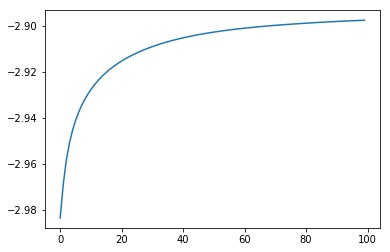

[[[2.58687892 4.72138724]
  [1.47980294 2.34697186]]

 [[1.15198511 3.01794624]
  [1.83958424 1.45471423]]]


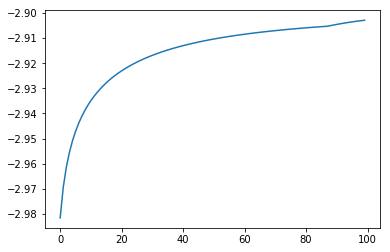

[[[7.57989084 1.1237616 ]
  [1.1390291  2.70505952]]

 [[3.51904624 1.1237616 ]
  [1.50785198 1.7903742 ]]]


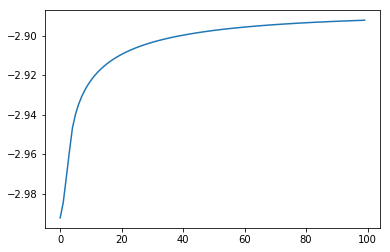

[[[2.96519142 3.51772972]
  [1.14175591 1.93985858]]

 [[1.9745718  2.83854701]
  [3.45822636 1.12423233]]]


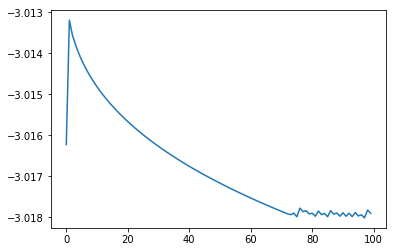

[[[2.5020652  3.8283226 ]
  [1.59600107 2.35276033]]

 [[1.57807429 3.19482147]
  [2.02209649 1.29604371]]]


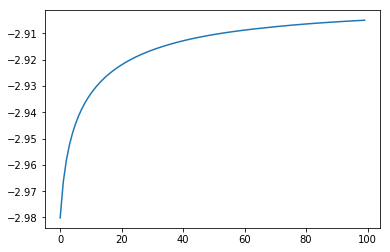

[[[2.13625059 2.8191253 ]
  [1.4337631  1.12423233]]

 [[2.50786989 3.07391271]
  [3.18181962 1.12423233]]]


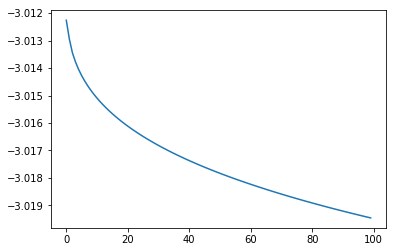

[1.66796721 0.6113386 ] -2.8906444061889442
2.1979166666666665


[[[1.13624602 4.56460717]
  [1.09061734 3.21470322]]

 [[1.13614963 3.67109532]
  [3.15701322 1.11125404]]]


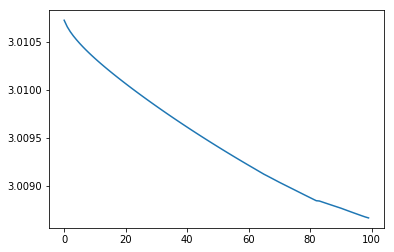

[[[7.35186563 1.11082368]
  [1.09058706 6.32825401]]

 [[3.63183915 1.11082368]
  [2.10454499 1.1112452 ]]]


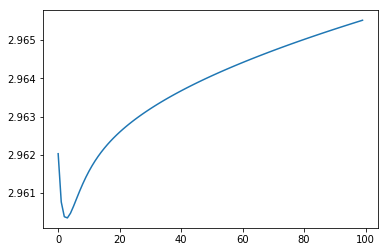

[[[1.13609675 5.21650669]
  [1.09058706 6.65772391]]

 [[1.13609673 3.27264499]
  [1.99316641 1.1112452 ]]]


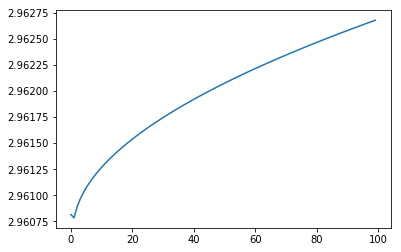

[[[3.40639197 3.61149471]
  [1.09058705 8.64299902]]

 [[1.96623103 2.62410016]
  [1.09058705 1.2021065 ]]]


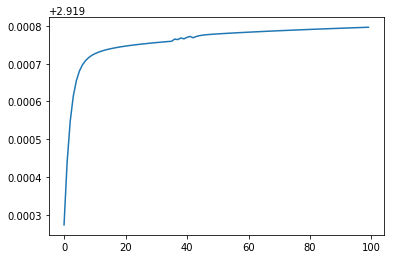

[[[7.81799825 1.11082368]
  [1.09058705 5.2472746 ]]

 [[3.44656867 1.11082368]
  [1.23061053 1.59778883]]]


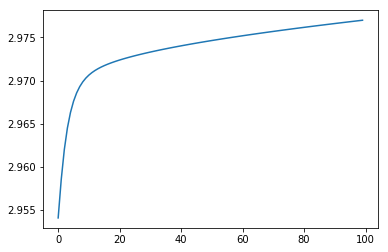

[[[1.13609691 4.38843653]
  [1.09058705 8.83262311]]

 [[1.13609673 3.77890739]
  [1.09058705 1.17694118]]]


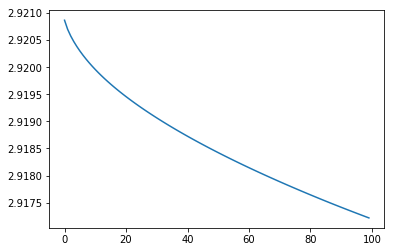

[[[5.11403109 2.57724362]
  [1.1236203  1.8974757 ]]

 [[3.31825108 1.34603164]
  [3.53992707 1.1112452 ]]]


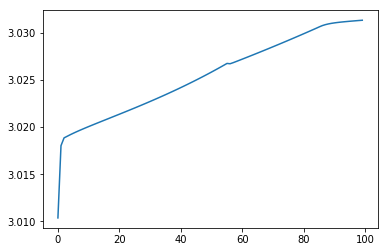

[[[3.34613823 2.41044816]
  [1.09058706 2.01627025]]

 [[3.14467427 2.27232164]
  [3.56222793 1.1112452 ]]]


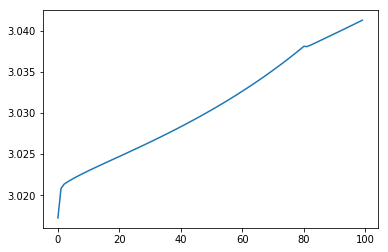

[[[5.97289297 4.14886859]
  [1.09058705 4.38055996]]

 [[1.92570283 1.37405824]
  [2.76297057 1.1112452 ]]]


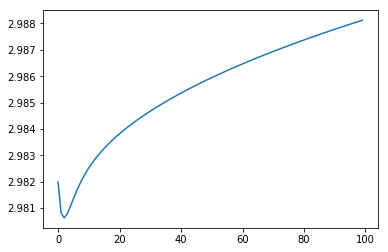

[[[7.80390699 1.11082368]
  [1.09058706 3.24949374]]

 [[3.45216943 1.11082368]
  [1.55531958 1.73544481]]]


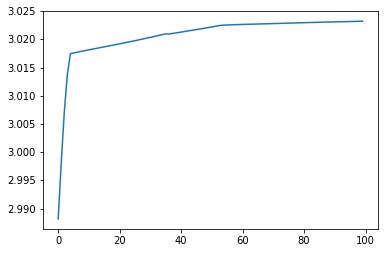

[[[7.17834502 1.11082368]
  [1.09058705 8.00461099]]

 [[3.70080717 1.11082368]
  [1.09058706 1.28682801]]]


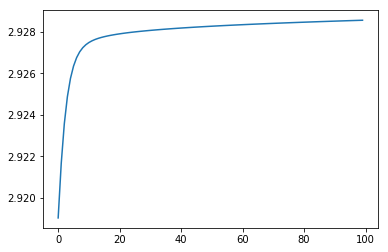

[[[5.03913789 3.30592942]
  [1.09058705 4.26395067]]

 [[2.58191829 1.62122518]
  [2.8023908  1.1112452 ]]]


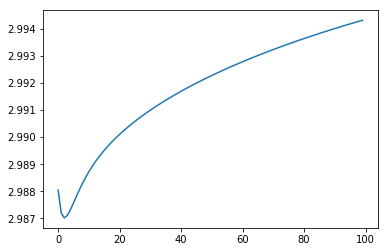

[[[6.13801702 3.96268316]
  [1.09058705 6.2515155 ]]

 [[2.14182244 1.22283608]
  [1.09058705 1.51948415]]]


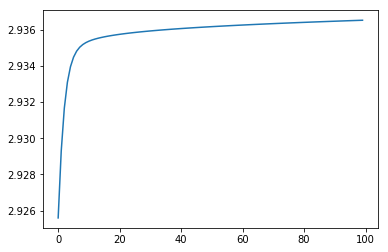

[[[7.87331371 2.60335387]
  [1.55396511 2.89996347]]

 [[2.45459598 1.11082368]
  [2.38732855 1.1112452 ]]]


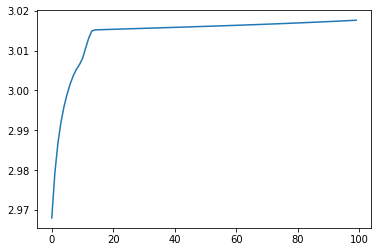

[[[1.13609676 5.44061661]
  [1.09058705 8.75259723]]

 [[1.13609673 3.13562949]
  [1.09058706 1.18756154]]]


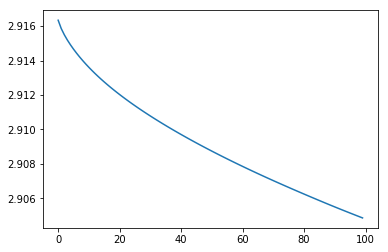

[[[1.81634441 4.68634657]
  [1.09058705 4.68283947]]

 [[1.13609673 3.34242355]
  [2.66078381 1.1112452 ]]]


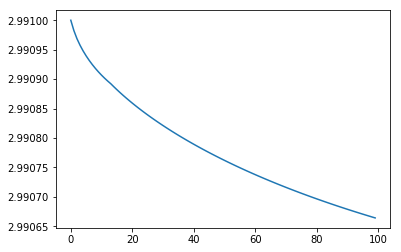

[[[2.20423959 4.73395345]
  [1.09058707 4.25369158]]

 [[1.13609673 3.16828145]
  [1.92372173 1.45755048]]]


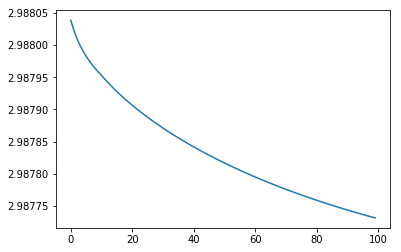

[[[3.56211384 3.01324033]
  [1.11074507 1.43559205]]

 [[2.58882469 2.34593963]
  [3.72041334 1.1112452 ]]]


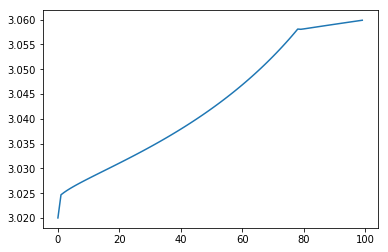

[[[2.48876256 5.07269022]
  [1.3448674  3.1391124 ]]

 [[1.13609673 2.85480094]
  [2.70184898 1.1112452 ]]]


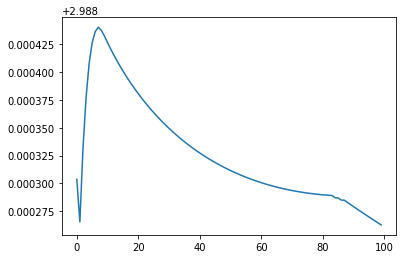

[[[6.31849106 1.65696263]
  [1.09058705 2.10033816]]

 [[3.68763472 1.11082368]
  [3.53380846 1.1112452 ]]]


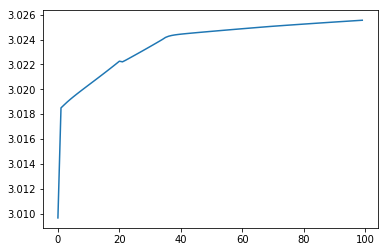

[[[5.95675748 4.51431954]
  [1.57654859 1.74706527]]

 [[1.56052311 1.50019955]
  [2.73436906 1.1112452 ]]]


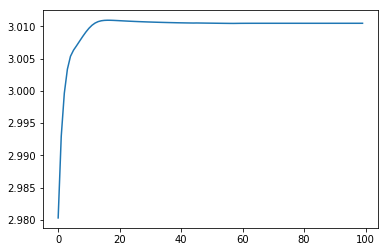

[[[8.46332112 1.11082368]
  [1.09058706 5.27320819]]

 [[3.19007671 1.11082368]
  [2.46120734 1.1112452 ]]]


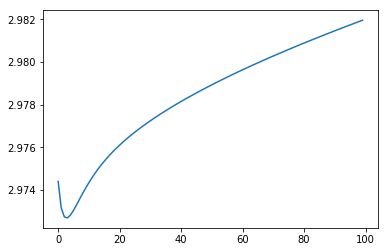

[[[1.26384498 4.19243202]
  [1.09058705 7.06744193]]

 [[1.13609673 3.85097412]
  [1.85465963 1.1112452 ]]]


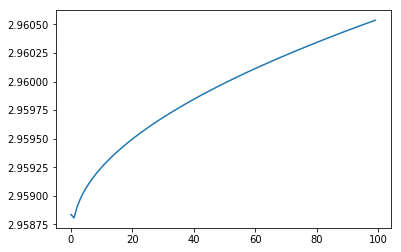

[[[6.74782548 1.11082368]
  [1.09058706 6.44071403]]

 [[3.87192276 1.11082368]
  [2.06652744 1.1112452 ]]]


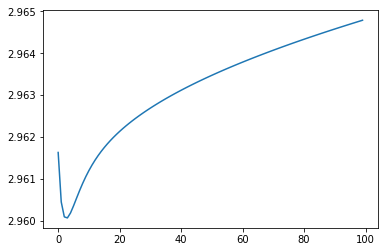

[[[2.6320111  5.21000316]
  [1.56843178 1.11124523]]

 [[1.13609673 2.71728955]
  [2.96465791 1.1112452 ]]]


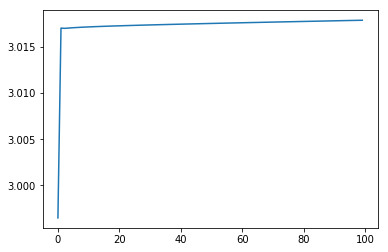

[0.6342778  1.21279802] 3.059873849168989


[[[1.13624602 4.56460717]
  [1.09061734 3.21470322]]

 [[1.13614963 3.67109532]
  [3.15701322 1.11125404]]]


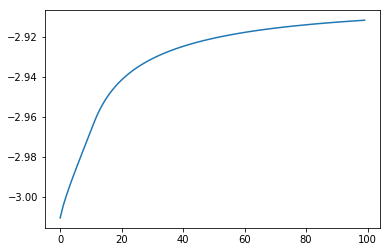

[[[1.17883626 4.19820224]
  [1.1528422  4.54329327]]

 [[1.13609673 3.87923162]
  [2.59024482 1.1112452 ]]]


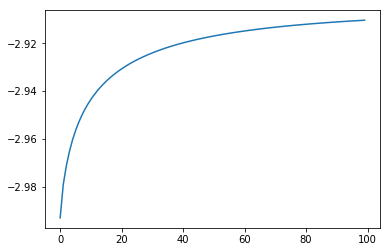

[[[4.15806134 3.36778018]
  [1.09058706 8.0740247 ]]

 [[2.35176838 2.12936038]
  [1.51438039 1.1112452 ]]]


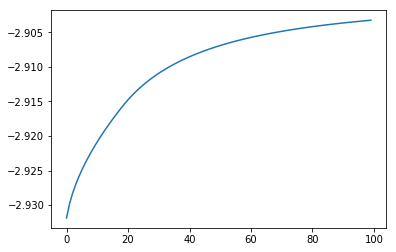

[[[7.89474046 1.11082368]
  [1.09058706 4.8266176 ]]

 [[3.41606648 1.11082368]
  [2.61217904 1.1112452 ]]]


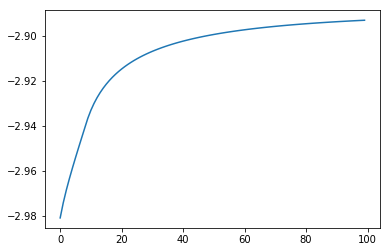

[[[3.06581335 4.60600953]
  [1.09058705 5.54681658]]

 [[1.13609673 2.92435562]
  [2.36871297 1.1112452 ]]]


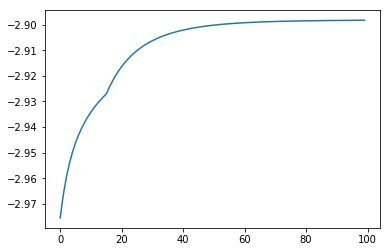

[[[7.27401603 3.55708375]
  [1.53064421 1.11124525]]

 [[2.07297102 1.11082368]
  [3.03610731 1.1112452 ]]]


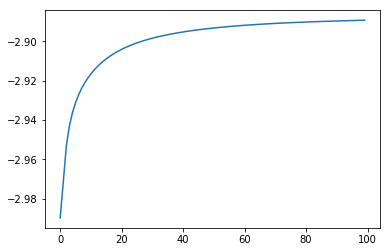

[[[7.22953431 2.92745942]
  [1.09058705 3.23820264]]

 [[2.49984012 1.11082368]
  [1.09058706 1.91938579]]]


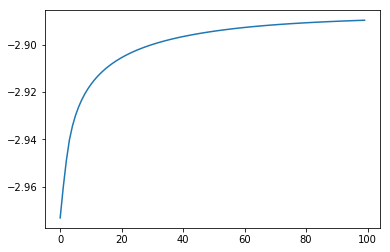

[[[7.44483922 3.81692695]
  [1.09058706 5.37559312]]

 [[1.83620452 1.11082368]
  [2.42659573 1.1112452 ]]]


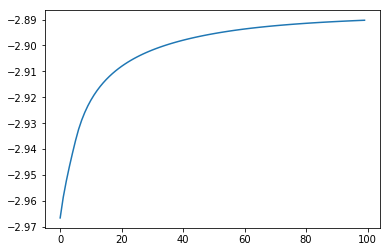

[[[5.33424003 4.35969015]
  [1.09058706 5.52409969]]

 [[1.5944166  1.7956147 ]
  [2.3763925  1.1112452 ]]]


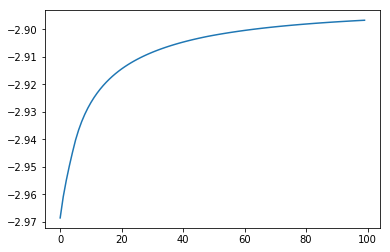

[[[6.70225509 4.19737128]
  [1.09058705 5.55787128]]

 [[1.88410563 1.11082368]
  [2.36497588 1.1112452 ]]]


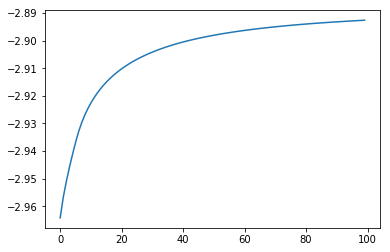

[[[7.8550179  1.72278722]
  [1.16993447 3.41333022]]

 [[3.03414312 1.11082368]
  [1.9398946  1.50382848]]]


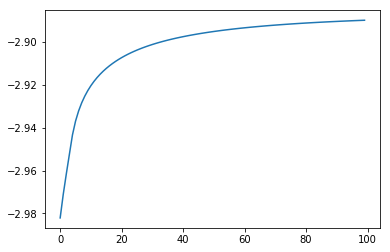

[[[6.25933644 1.11082368]
  [1.3606013  1.11124525]]

 [[4.06607907 1.11082368]
  [3.35762747 1.1112452 ]]]


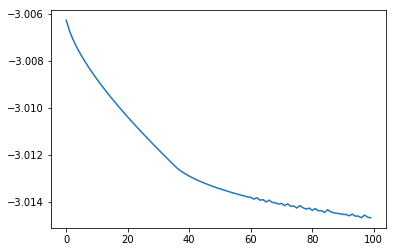

[[[6.91253397 2.7790693 ]
  [1.09058706 5.25298732]]

 [[2.72227392 1.11082368]
  [1.84347442 1.35643545]]]


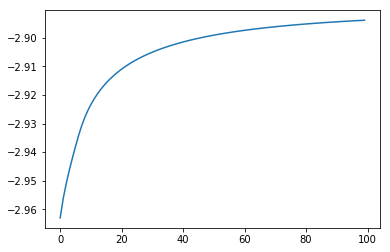

[[[7.8627768  1.11082368]
  [1.1971     1.4952646 ]]

 [[3.42877086 1.11082368]
  [3.53695939 1.1112452 ]]]


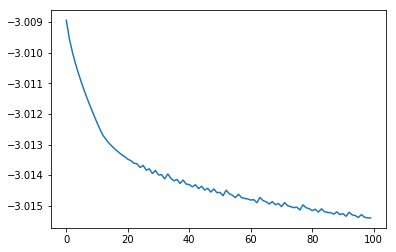

[[[7.57545905 2.63263847]
  [1.09058705 3.89529763]]

 [[2.55395029 1.11082368]
  [1.09058706 1.83218165]]]


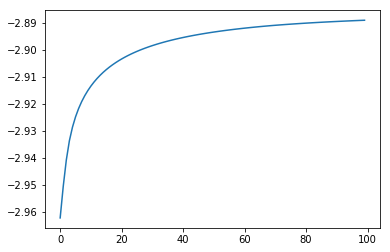

[[[1.86865186 3.12432476]
  [1.09058705 6.07246369]]

 [[2.15419126 3.32009458]
  [2.19101591 1.1112452 ]]]


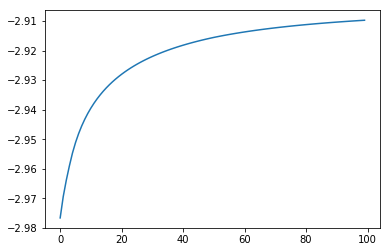

[[[6.91086358 1.11082368]
  [1.09058705 6.57267854]]

 [[3.80712114 1.11082368]
  [1.09058706 1.47686209]]]


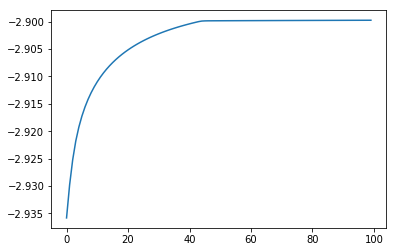

[[[6.22136429 1.11082368]
  [1.09058705 6.08004734]]

 [[4.0811716  1.11082368]
  [1.73349903 1.2898486 ]]]


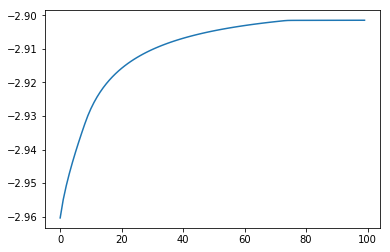

[[[7.91313541 1.11082368]
  [1.41566573 1.9847717 ]]

 [[3.40875517 1.11082368]
  [2.95821164 1.1112452 ]]]


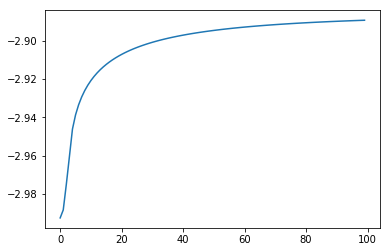

[[[2.42682099 2.36922332]
  [1.09058705 5.42848628]]

 [[3.00932193 2.76859414]
  [2.40871499 1.1112452 ]]]


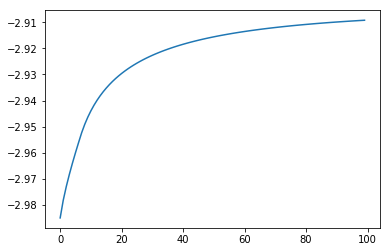

[[[6.18449153 4.61339688]
  [1.09058719 2.51033341]]

 [[1.50600558 1.40576124]
  [3.3952077  1.1112452 ]]]


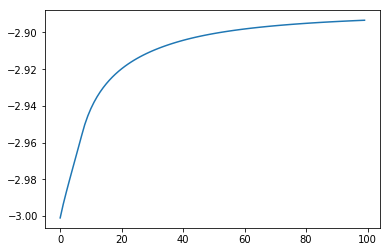

[[[3.02145407 3.02605244]
  [1.09058706 5.89206974]]

 [[2.47250684 2.64968652]
  [1.09058706 1.56718678]]]


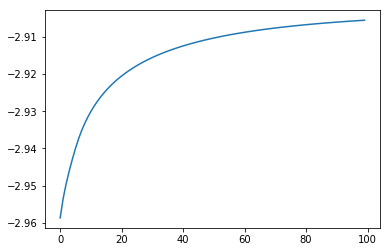

[[[5.23544615 1.81674548]
  [1.09058705 6.0810695 ]]

 [[4.01426294 1.11082377]
  [1.09058705 1.54210432]]]


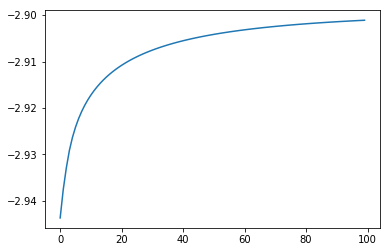

[[[7.8618241  1.78372057]
  [1.09058706 5.62185325]]

 [[2.99183767 1.11082368]
  [2.34334652 1.1112452 ]]]


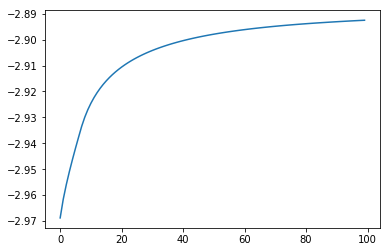

[[[8.03483962 1.11082368]
  [1.09058706 7.42127927]]

 [[3.36038225 1.11082368]
  [1.73504354 1.1112452 ]]]


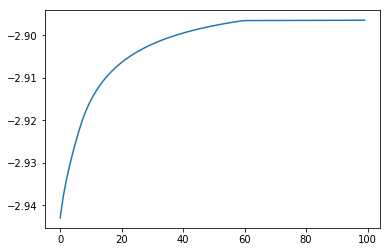

[1.67778089 0.60562844] -2.8890377691997755
2.308333333333333


[[[3.04040924 3.86567601]
  [1.08118406 5.95584111]]

 [[1.64424453 2.90844589]
  [2.27783636 1.09961854]]]


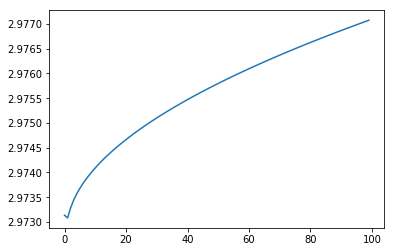

[[[5.84009294 2.53086283]
  [1.08111717 3.53237721]]

 [[3.32215283 1.09923828]
  [3.09723143 1.09961573]]]


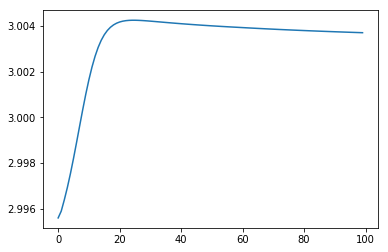

[[[7.9119061  1.09923829]
  [1.24578164 3.21360217]]

 [[3.42908836 1.09923828]
  [1.94859807 1.47061747]]]


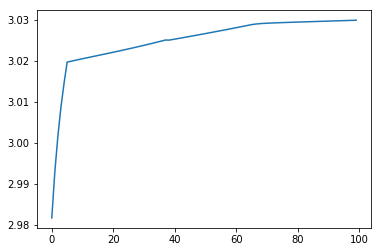

[[[3.53915973 1.79102889]
  [1.08111717 8.26317925]]

 [[3.79538691 1.96670183]
  [1.08111717 1.26326002]]]


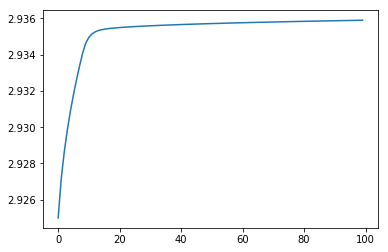

[[[2.13758005 4.98579992]
  [1.08111717 7.91336213]]

 [[1.12186931 3.05261709]
  [1.61622236 1.09961573]]]


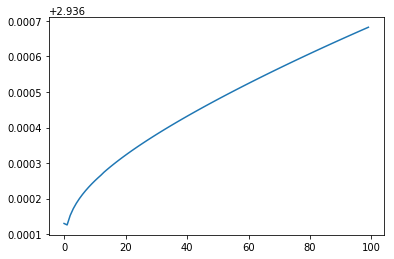

[[[2.02495501 4.11003298]
  [1.79068497 1.09961573]]

 [[1.20751326 3.54958343]
  [2.57797258 1.09961573]]]


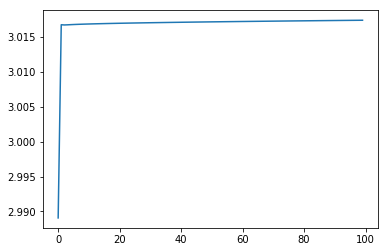

[[[3.04659822 3.46123938]
  [1.08111717 6.8507202 ]]

 [[2.04614472 2.77531443]
  [1.97545261 1.09961573]]]


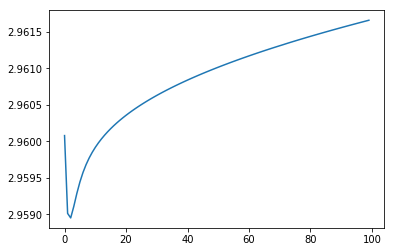

[[[8.16622164 2.2509716 ]
  [1.08111717 8.88426191]]

 [[2.57950244 1.09923828]
  [1.08111717 1.18083514]]]


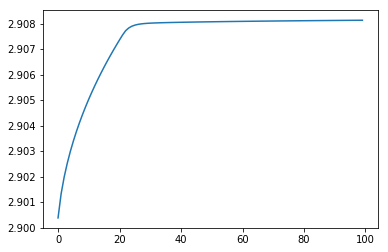

[[[5.48195018 2.52258777]
  [1.08111717 2.50089568]]

 [[3.44291956 1.12460011]
  [3.44592778 1.09961573]]]


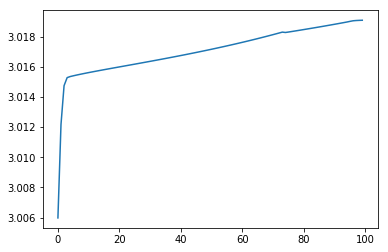

[[[1.12186931 5.0577118 ]
  [1.08111717 1.09961573]]

 [[1.12186931 3.38843234]
  [3.91963594 1.09961573]]]


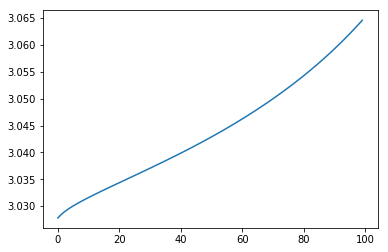

[[[4.22446129 1.57055087]
  [1.08111717 7.34721681]]

 [[4.14518147 1.51619551]
  [1.08111717 1.38481889]]]


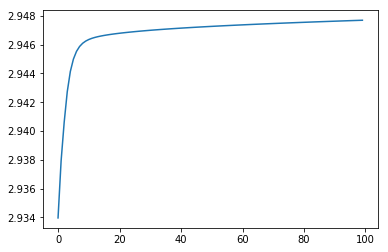

[[[7.85106688 1.09923828]
  [1.08111717 1.37835112]]

 [[3.45326971 1.09923828]
  [3.82540836 1.09961573]]]


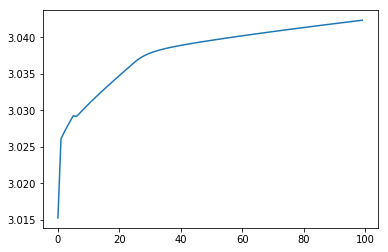

[[[8.57807402 1.2572199 ]
  [1.08111717 7.05524648]]

 [[3.06163992 1.09923828]
  [1.90631171 1.09961573]]]


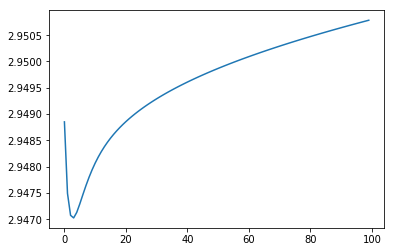

[[[2.6086607  4.8471754 ]
  [1.08111718 3.35151423]]

 [[1.12186931 2.96122889]
  [3.15837284 1.09961573]]]


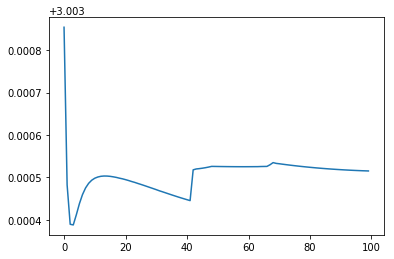

[[[3.23928246 4.63567019]
  [1.08111717 2.40032895]]

 [[1.12186931 2.85474482]
  [3.47992476 1.09961573]]]


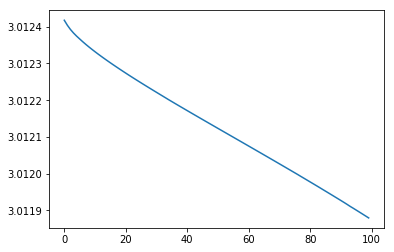

[[[7.91674914 1.09923828]
  [1.08111718 4.75245689]]

 [[3.42716344 1.09923828]
  [2.42181209 1.20284994]]]


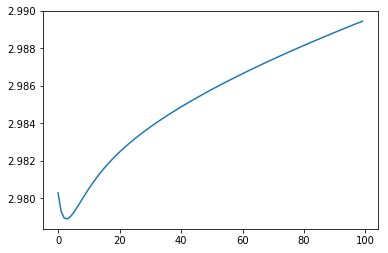

[[[1.58894974 5.56158863]
  [1.08111717 5.67550598]]

 [[1.12186931 2.90572976]
  [1.73701591 1.34918468]]]


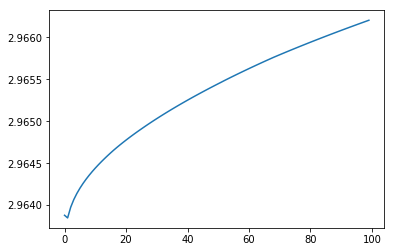

[[[6.08325802 1.09923828]
  [1.08111729 4.29282267]]

 [[4.15590833 1.09923828]
  [2.25438245 1.3295774 ]]]


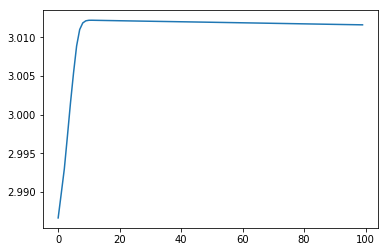

[[[3.06280052 4.89169854]
  [1.08111717 6.88783095]]

 [[1.12186931 2.76420284]
  [1.96290718 1.09961573]]]


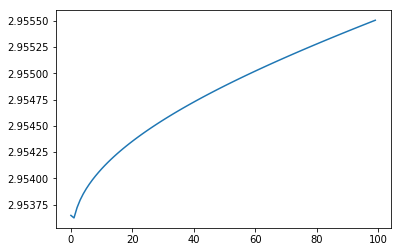

[[[7.61382784 3.30966506]
  [1.08111717 1.09961576]]

 [[2.1110197  1.09923828]
  [3.91963593 1.09961573]]]


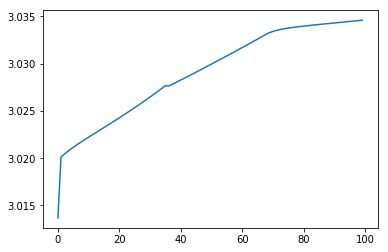

[[[3.86566517 4.84093698]
  [1.08111722 2.95688957]]

 [[1.12186931 2.49504124]
  [3.29177718 1.09961573]]]


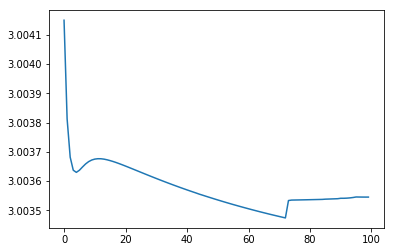

[[[1.69603815 5.04340525]
  [1.08111717 4.20811666]]

 [[1.12186931 3.18249378]
  [2.86879506 1.09961573]]]


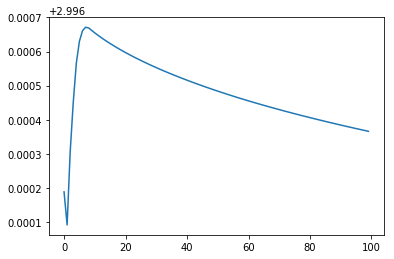

[[[9.17375317 1.09923828]
  [1.14003827 3.68007363]]

 [[2.92755085 1.09923828]
  [2.03848897 1.45191441]]]


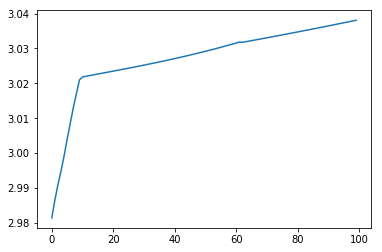

[[[2.18771849 4.76560545]
  [1.08111717 5.08922182]]

 [[1.12186931 3.1684917 ]
  [2.57093402 1.09961573]]]


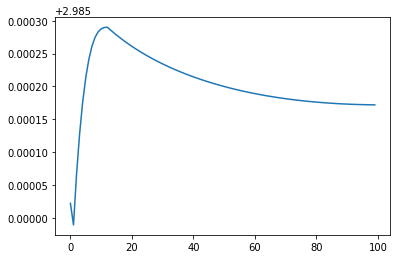

[[[3.92077716 5.0276781 ]
  [1.08111717 8.43615178]]

 [[1.12186931 2.36026544]
  [1.08111717 1.24030456]]]


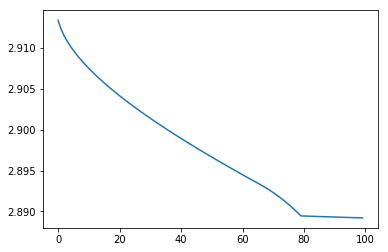

[0.60546176 1.22956484] 3.0645914395969833


[[[3.04040924 3.86567601]
  [1.08118406 5.95584111]]

 [[1.64424453 2.90844589]
  [2.27783636 1.09961854]]]


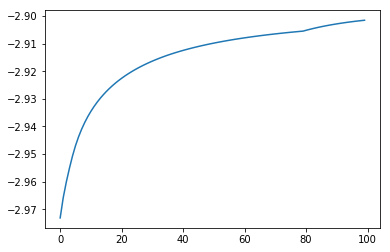

[[[4.6718037  1.60163395]
  [1.08111717 8.78085282]]

 [[4.20012281 1.27824291]
  [1.32296374 1.09961573]]]


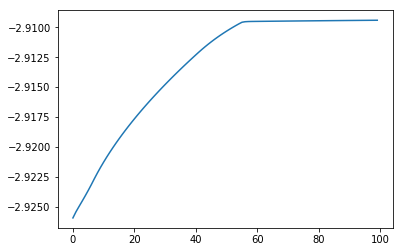

[[[7.57758493 4.32360946]
  [1.08111717 6.55925375]]

 [[1.46646825 1.09923828]
  [2.07398399 1.09961573]]]


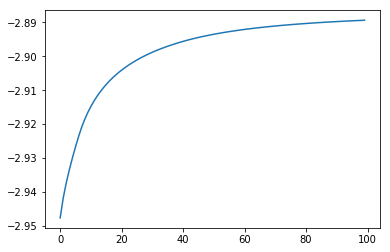

[[[1.47997622 5.53045272]
  [1.08111717 5.56818525]]

 [[1.12186931 2.96551138]
  [1.08111745 1.62091694]]]


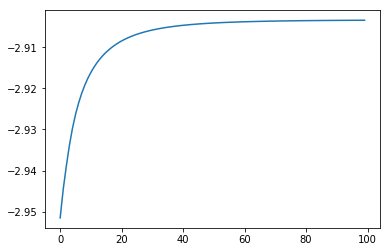

[[[7.88213879 1.09923828]
  [1.23851877 2.55562518]]

 [[3.44091978 1.09923828]
  [3.12980854 1.09961573]]]


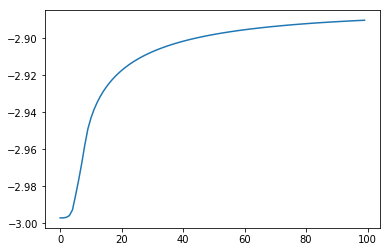

[[[4.60762316 2.55297754]
  [1.08111717 2.91330187]]

 [[3.24523489 1.61890503]
  [3.30651226 1.09961573]]]


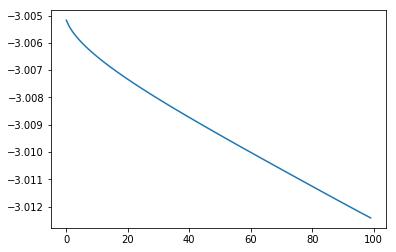

[[[5.66786274 1.47722016]
  [1.08111717 6.39228958]]

 [[4.07536432 1.09923828]
  [2.13042688 1.09961573]]]


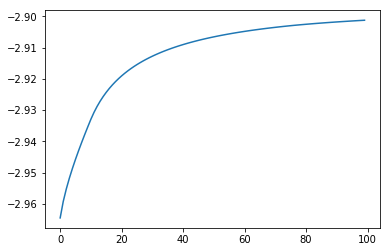

[[[3.07985779 5.07656438]
  [1.08111717 4.4521231 ]]

 [[1.12186931 2.64480243]
  [2.78630773 1.09961573]]]


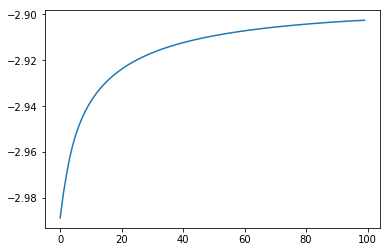

[[[8.9612121  1.09923828]
  [1.08111717 1.18146282]]

 [[3.01202806 1.09923828]
  [3.89196722 1.09961573]]]


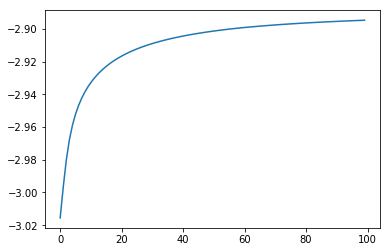

[[[1.12186931 4.32090416]
  [1.08111717 4.32166771]]

 [[1.12186931 3.83889906]
  [2.83040869 1.09961573]]]


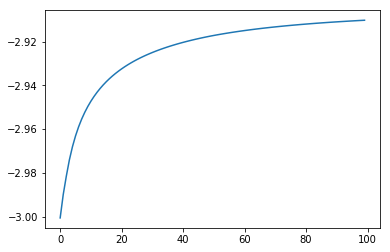

[[[5.09072451 3.9064572 ]
  [1.08111717 8.73021786]]

 [[1.99680522 1.78522271]
  [1.08111717 1.20127857]]]


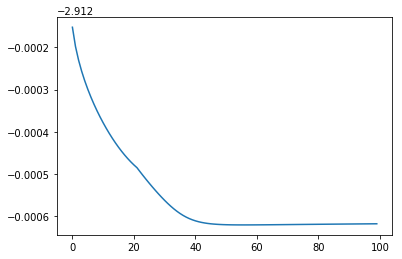

[[[1.12186931 5.29025109]
  [1.08111717 4.33895067]]

 [[1.12186931 3.24626333]
  [1.08111749 1.78405064]]]


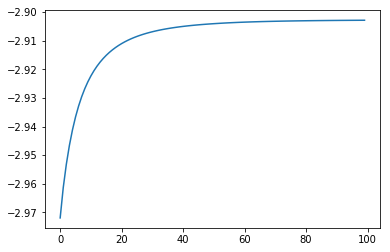

[[[4.96117181 4.8049234 ]
  [1.08111724 2.42508853]]

 [[1.12186979 2.107442  ]
  [3.47155455 1.09961573]]]


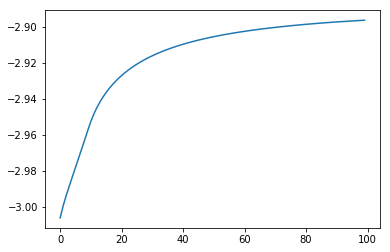

[[[7.84056706 1.09923828]
  [1.16606684 4.1270099 ]]

 [[3.457443   1.09923828]
  [2.73558918 1.09961573]]]


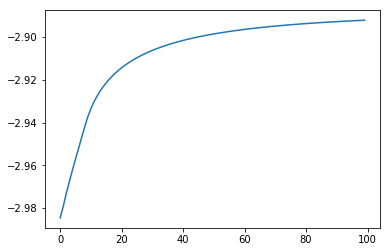

[[[5.696818   1.25829606]
  [1.08111717 5.03386341]]

 [[4.20613319 1.09923828]
  [2.58964815 1.09961573]]]


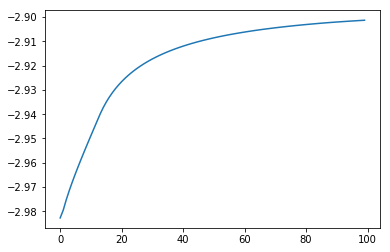

[[[4.41439853 1.37069622]
  [1.76609807 2.24235747]]

 [[4.37960022 1.34683801]
  [2.23815359 1.09961573]]]


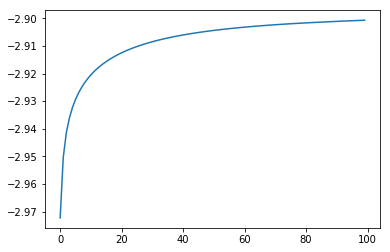

[[[7.59503854 3.99898067]
  [1.08111717 6.77724726]]

 [[1.67050547 1.09923828]
  [1.08111718 1.46046047]]]


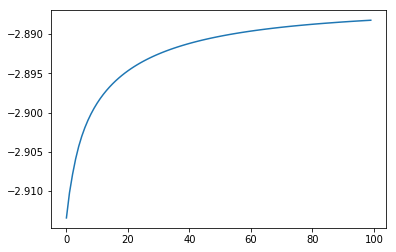

[[[4.9538448  4.96428963]
  [1.08111717 6.39912068]]

 [[1.12186931 2.01274933]
  [2.1281176  1.09961573]]]


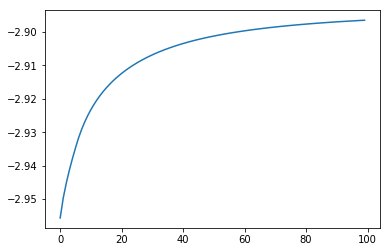

[[[4.16945268 1.75835861]
  [1.08111717 8.75027922]]

 [[3.94855937 1.60691106]
  [1.33329927 1.09961573]]]


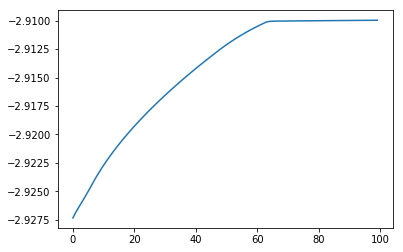

[[[8.97626308 1.34583118]
  [1.21416996 2.90440283]]

 [[2.84578653 1.09923828]
  [1.73201747 1.620141  ]]]


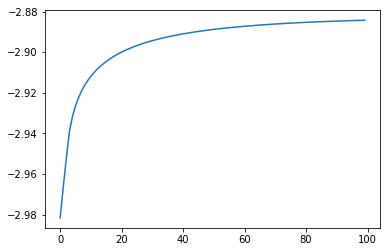

[[[7.71324029 1.09923828]
  [1.08111717 8.68228854]]

 [[3.50805068 1.09923828]
  [1.08111717 1.20763935]]]


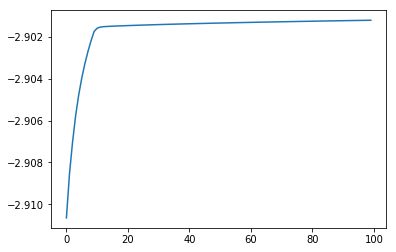

[[[4.5785287  4.35689212]
  [1.08111717 5.07363696]]

 [[1.45234809 2.21353882]
  [1.08111717 1.68654935]]]


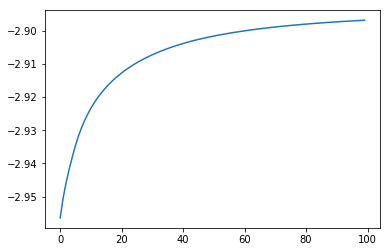

[[[7.99182325 1.09923828]
  [1.08111717 5.27890128]]

 [[3.39732426 1.09923828]
  [1.08111781 1.65930814]]]


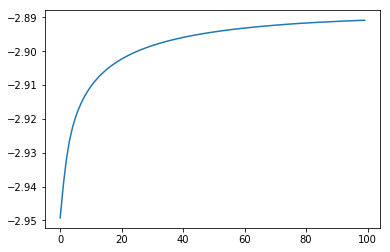

[[[6.43864755 2.1830303 ]
  [1.61419223 2.58665675]]

 [[3.31030389 1.09923828]
  [2.40898815 1.09961573]]]


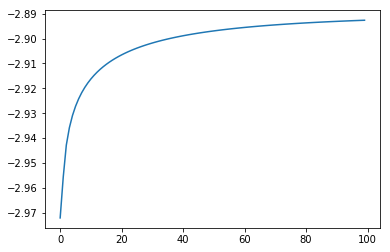

[[[7.81293252 2.56612416]
  [1.08111717 8.84183864]]

 [[2.51510595 1.09923828]
  [1.08111717 1.1864652 ]]]


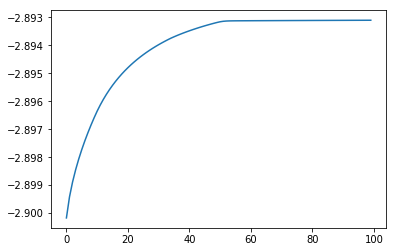

[1.70673778 0.58877967] -2.8842971215553703
2.41875


[[[1.10928575 5.95366   ]
  [1.07265927 5.95352267]]

 [[1.10917433 2.8573185 ]
  [2.32123564 1.08921659]]]


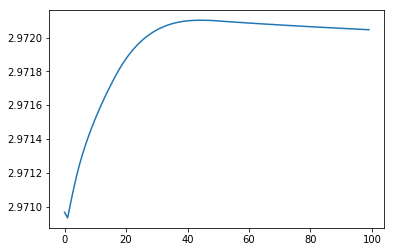

[[[9.15660841 1.088864  ]
  [1.07263726 8.88083418]]

 [[2.95213531 1.088864  ]
  [1.33172534 1.089202  ]]]


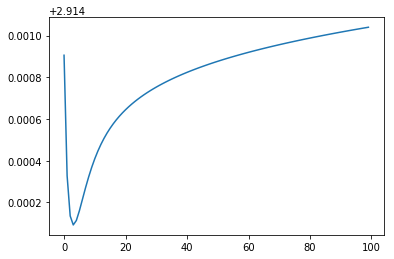

[[[6.62700531 1.088864  ]
  [1.65537639 1.08921102]]

 [[3.95755896 1.088864  ]
  [2.86386051 1.089202  ]]]


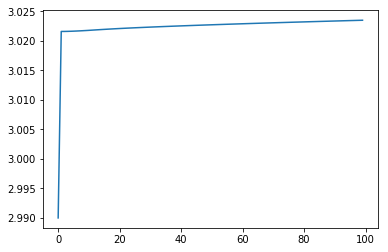

[[[5.26459087 1.51107088]
  [1.45487409 1.089202  ]]

 [[4.22467845 1.088864  ]
  [3.24297686 1.089202  ]]]


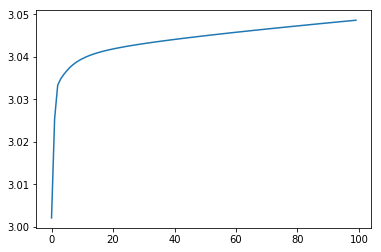

[[[5.64340618 2.13915387]
  [1.07263726 9.55783996]]

 [[3.66592583 1.088864  ]
  [1.07263726 1.10106705]]]


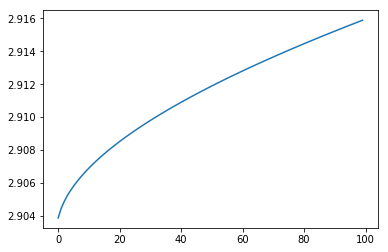

[[[8.28027485 1.42940522]
  [1.07263726 8.72569115]]

 [[3.07912969 1.088864  ]
  [1.07263726 1.21150287]]]


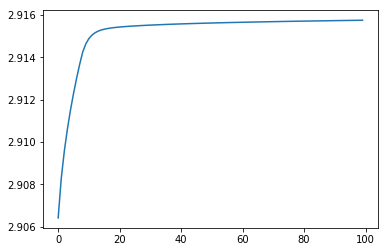

[[[2.45535456 5.1779316 ]
  [1.07263726 9.34489652]]

 [[1.10912921 2.82831952]
  [1.07263726 1.12932712]]]


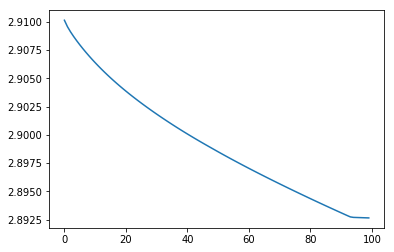

[[[8.23127041 4.206451  ]
  [1.07263726 1.94857882]]

 [[1.29382094 1.088864  ]
  [3.67520134 1.089202  ]]]


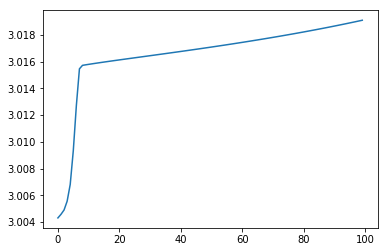

[[[4.20117375 5.03265925]
  [1.07263726 5.32047266]]

 [[1.10912923 2.26436308]
  [2.53531946 1.089202  ]]]


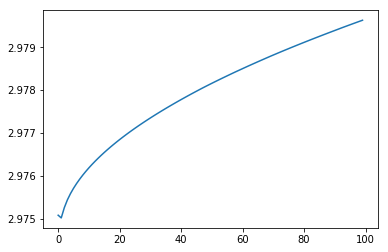

[[[9.76382625 1.0888642 ]
  [1.07263726 7.06964776]]

 [[2.71078856 1.088864  ]
  [1.94400398 1.089202  ]]]


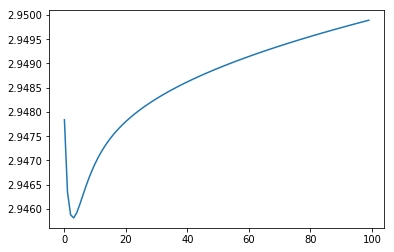

[[[4.26018259 3.59935546]
  [1.07263726 4.37912101]]

 [[2.14189734 2.14702936]
  [1.99965278 1.42441982]]]


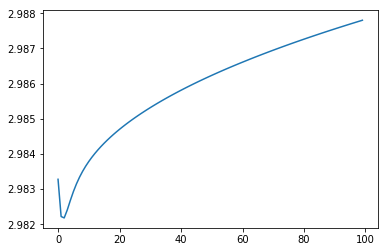

[[[1.10912921 5.05488815]
  [1.07263726 1.46221956]]

 [[1.10912921 3.40690727]
  [3.83961699 1.089202  ]]]


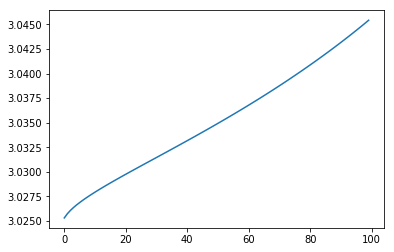

[[[2.73314997 5.05469261]
  [1.1999465  3.57536325]]

 [[1.10912921 2.79979551]
  [2.07414842 1.40734249]]]


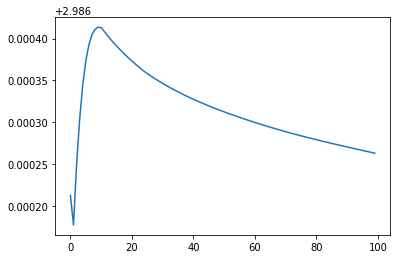

[[[6.89563136 3.33408524]
  [1.07263726 1.74323383]]

 [[2.39163357 1.088864  ]
  [3.74461902 1.089202  ]]]


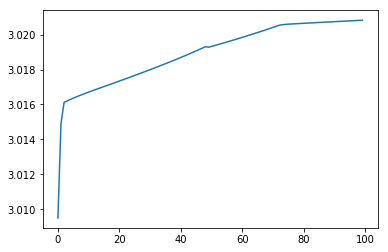

[[[8.91927833 1.088864  ]
  [1.07263726 5.25544558]]

 [[3.04646524 1.088864  ]
  [2.55730212 1.089202  ]]]


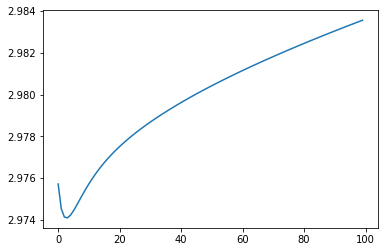

[[[3.20478959 5.91259898]
  [1.07263726 5.92904059]]

 [[1.10912921 2.09894295]
  [2.32959069 1.089202  ]]]


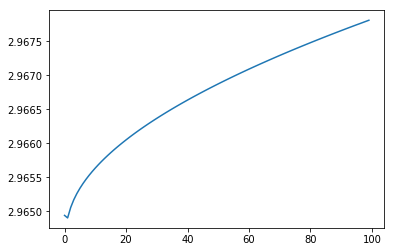

[[[8.9769127  1.11631588]
  [1.07263726 9.64724473]]

 [[3.00571689 1.088864  ]
  [1.07263726 1.089202  ]]]


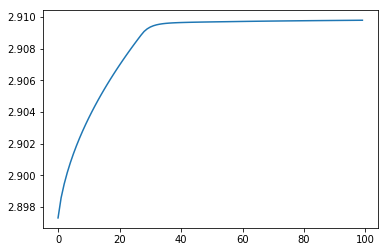

[[[7.61647011 1.088864  ]
  [1.66242882 2.53895964]]

 [[3.56428331 1.088864  ]
  [2.36043243 1.08920201]]]


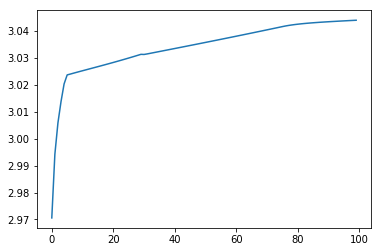

[[[5.80483021 1.08886401]
  [1.07263726 9.01767981]]

 [[4.28434314 1.088864  ]
  [1.28546414 1.089202  ]]]


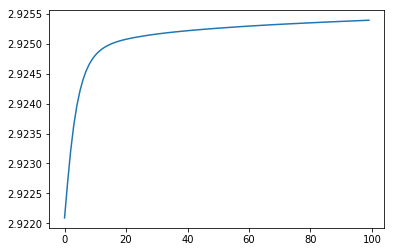

[[[9.74122913 1.088864  ]
  [1.07263726 7.72923892]]

 [[2.71977021 1.088864  ]
  [1.07263726 1.34374366]]]


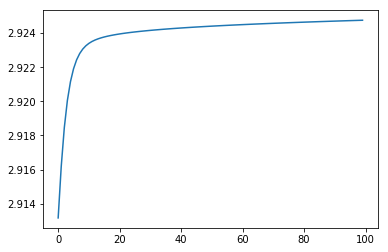

[[[4.69404639 2.91384339]
  [1.07263726 4.50302723]]

 [[2.90425462 1.68673704]
  [2.81166008 1.089202  ]]]


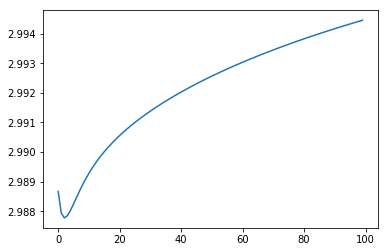

[[[1.10912923 6.19980018]
  [1.49417866 1.08920204]]

 [[1.10912921 2.7069352 ]
  [3.16865906 1.089202  ]]]


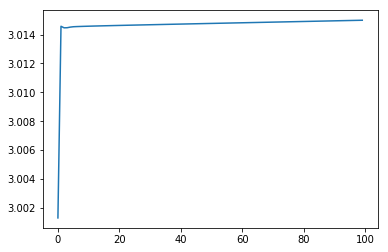

[[[5.32987409 3.38225792]
  [1.07263726 8.07431352]]

 [[2.56201529 1.48457508]
  [1.6043728  1.089202  ]]]


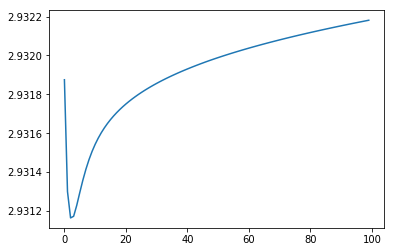

[[[9.20317392 1.088864  ]
  [1.07263726 4.57757957]]

 [[2.93362724 1.088864  ]
  [2.78645737 1.089202  ]]]


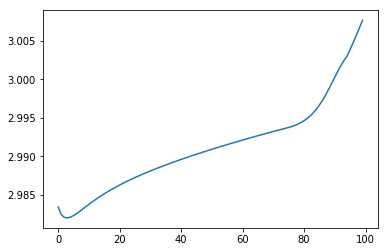

[[[1.10912921 5.80254016]
  [1.07263726 6.32236613]]

 [[1.10912921 2.94981056]
  [1.07263726 1.53045202]]]


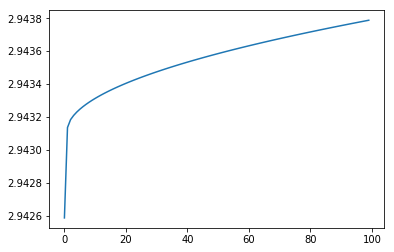

[0.70288512 1.17287837] 3.0486418695569677


[[[1.10928575 5.95366   ]
  [1.07265927 5.95352267]]

 [[1.10917433 2.8573185 ]
  [2.32123564 1.08921659]]]


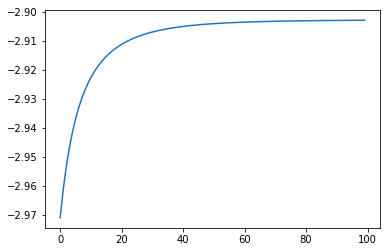

[[[5.64567566 5.42434942]
  [1.07263726 7.13995465]]

 [[1.10912921 1.4847849 ]
  [1.07263726 1.42194853]]]


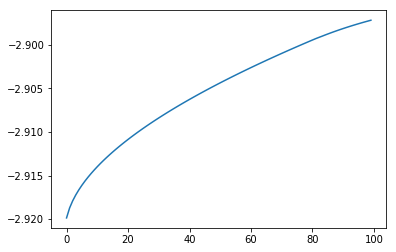

[[[3.16444712 2.62421519]
  [1.07263726 5.6995163 ]]

 [[2.89805165 2.44157072]
  [2.40718227 1.089202  ]]]


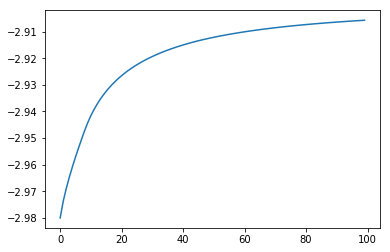

[[[6.21758931 5.08983936]
  [1.07263726 9.64724473]]

 [[1.10912922 1.4754544 ]
  [1.07263726 1.089202  ]]]


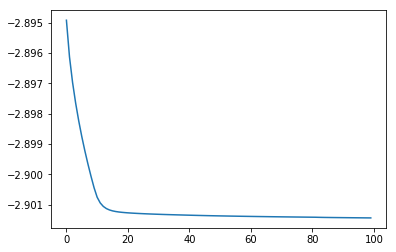

[[[9.53826444 2.22662736]
  [1.07263726 3.92308699]]

 [[2.06101525 1.088864  ]
  [3.00771113 1.089202  ]]]


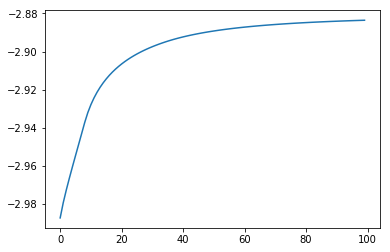

[[[8.40175874 3.910803  ]
  [1.19017274 3.92400039]]

 [[1.41819809 1.08886401]
  [2.78516418 1.089202  ]]]


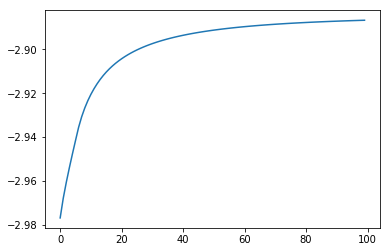

[[[1.97773636 4.98780958]
  [1.07263726 9.17070387]]

 [[1.10912921 3.12313998]
  [1.23373376 1.089202  ]]]


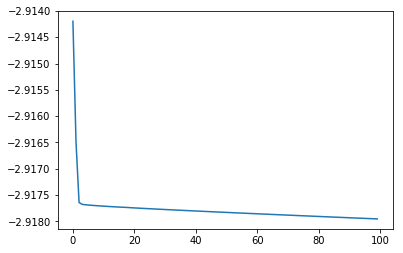

[[[9.19110482 1.90204706]
  [1.07263726 3.7654132 ]]

 [[2.40994124 1.088864  ]
  [1.07263732 1.86978937]]]


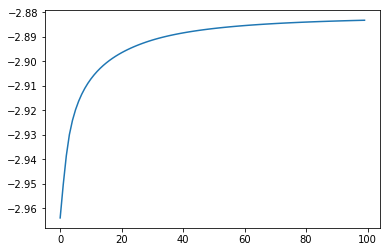

[[[5.29805893 2.28925664]
  [1.07263726 6.36965692]]

 [[3.63885815 1.15168561]
  [1.07263726 1.52417599]]]


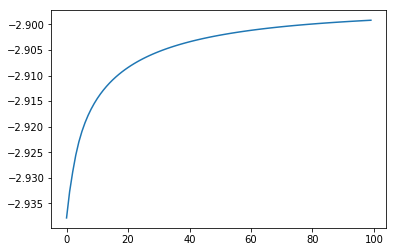

[[[1.12501538 3.99503009]
  [1.19669068 1.20237979]]

 [[1.14897373 4.01145641]
  [3.69289443 1.089202  ]]]


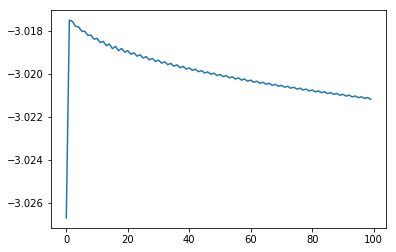

[[[4.34407976 2.16303844]
  [1.07263726 6.91860092]]

 [[3.58107368 1.63991077]
  [1.07263726 1.45132474]]]


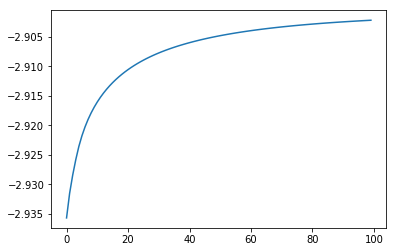

[[[8.8363409  2.85478845]
  [1.07263726 9.64724473]]

 [[1.93176558 1.088864  ]
  [1.07263726 1.089202  ]]]


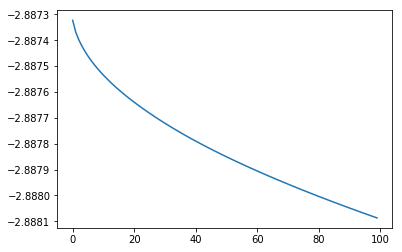

[[[3.86368084 5.86420661]
  [1.07263726 3.95771403]]

 [[1.10912921 1.88216542]
  [2.99600533 1.089202  ]]]


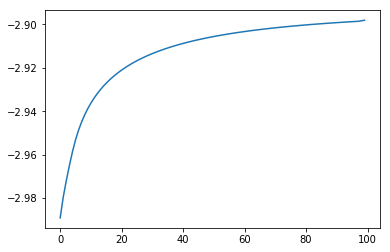

[[[3.16234705 5.72267553]
  [1.07263726 8.58886596]]

 [[1.10912921 2.23092717]
  [1.43042634 1.089202  ]]]


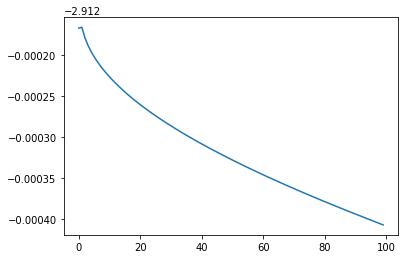

[[[4.75542034 5.71363488]
  [1.07263726 1.089202  ]]

 [[1.10912921 1.64079455]
  [3.96571703 1.089202  ]]]


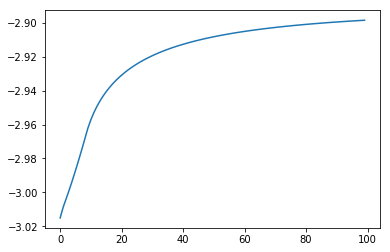

[[[9.77044038 1.088864  ]
  [1.07263726 5.16646711]]

 [[2.70815982 1.088864  ]
  [1.07263729 1.68385324]]]


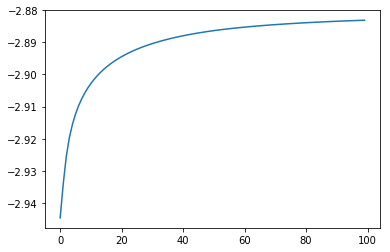

[[[5.35800444 5.52312137]
  [1.07263726 6.79460439]]

 [[1.10912921 1.5319601 ]
  [2.03698347 1.089202  ]]]


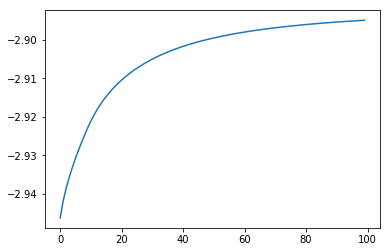

[[[4.18640689 3.18757124]
  [1.07263726 4.95853961]]

 [[2.53575135 2.05585863]
  [2.65767234 1.089202  ]]]


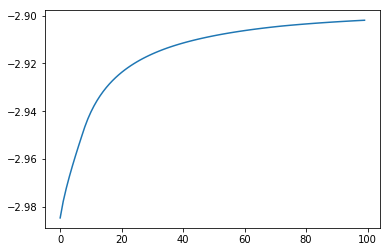

[[[2.34245317 2.47014069]
  [1.33688936 3.51403272]]

 [[2.89316338 2.84771534]
  [2.64634097 1.089202  ]]]


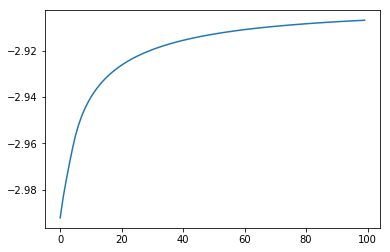

[[[1.10912921 5.0626558 ]
  [1.07263726 5.7536829 ]]

 [[1.10912921 3.40215831]
  [2.09445201 1.20478364]]]


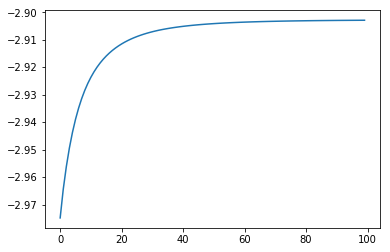

[[[7.62571091 1.088864  ]
  [1.07263726 7.66185292]]

 [[3.56061043 1.088864  ]
  [1.74380671 1.089202  ]]]


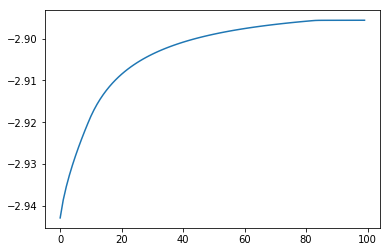

[[[7.58055777 1.088864  ]
  [1.07263726 2.70012676]]

 [[3.57855713 1.088864  ]
  [1.131235   1.98816126]]]


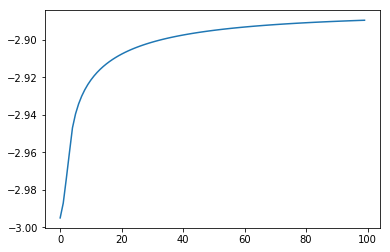

[[[6.89666851 1.9139175 ]
  [1.07263726 9.64724473]]

 [[3.31418025 1.088864  ]
  [1.07263726 1.089202  ]]]


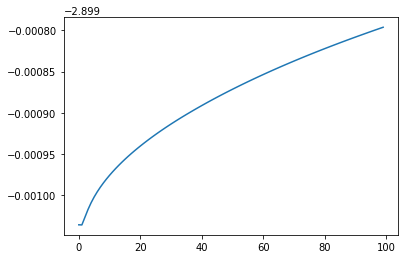

[[[8.51095512 1.08886401]
  [1.07263726 4.62713107]]

 [[3.20875861 1.088864  ]
  [2.76970629 1.089202  ]]]


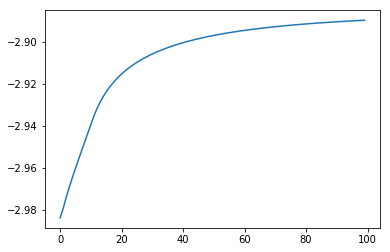

[[[8.72402927 1.75542058]
  [1.07263726 9.03455512]]

 [[2.69087821 1.088864  ]
  [1.07263726 1.17051303]]]


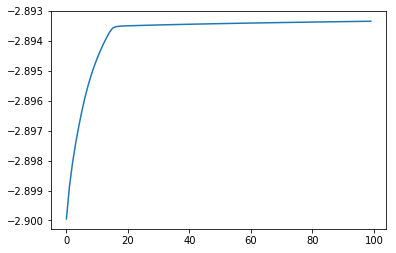

[1.71393239 0.58459343] -2.883119261865768
2.529166666666667


[[[2.42736825 4.54697263]
  [1.06507326 8.52700571]]

 [[1.09781897 3.23517703]
  [1.489319   1.07990643]]]


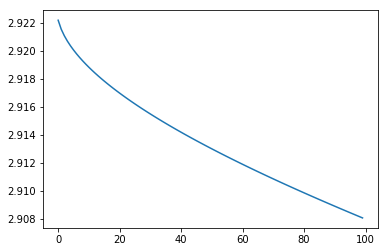

[[[5.85640679 5.43044856]
  [1.06504383 8.45913642]]

 [[1.09772095 1.41299449]
  [1.51239334 1.0798769 ]]]


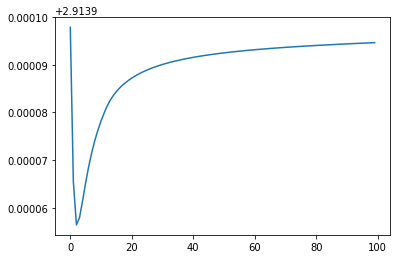

[[[2.80379877 4.88075322]
  [1.06504383 9.78244465]]

 [[1.09772094 2.89045403]
  [1.06504383 1.0798769 ]]]


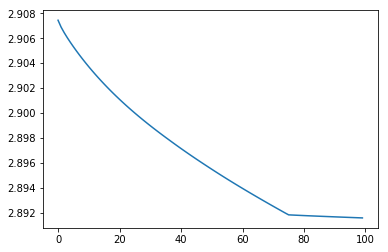

[[[6.91616177 5.32768267]
  [1.06504383 4.45604621]]

 [[1.09772094 1.07957424]
  [2.86565361 1.0798769 ]]]


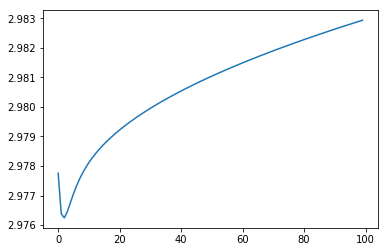

[[[1.09772094 6.44804053]
  [1.06504383 1.0798769 ]]

 [[1.09772094 2.57016467]
  [4.00698085 1.0798769 ]]]


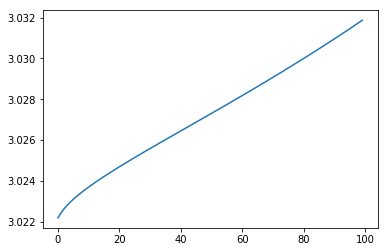

[[[1.09772094 6.18253505]
  [1.06504383 4.50225364]]

 [[1.09772094 2.73248843]
  [2.85003302 1.0798769 ]]]


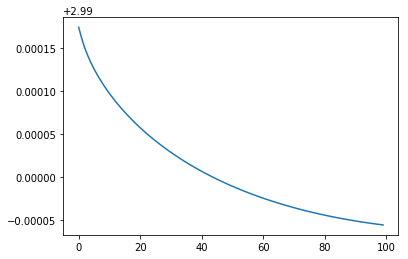

[[[9.47058858 3.67630704]
  [1.06504383 3.7424148 ]]

 [[1.15565038 1.07957424]
  [1.06504383 1.88145906]]]


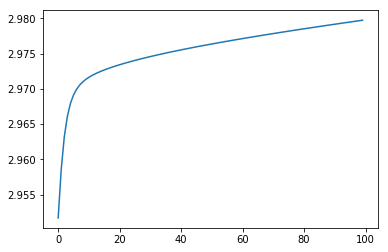

[[[2.5871147  5.54714829]
  [1.06504383 1.0798769 ]]

 [[1.09772094 2.56405538]
  [4.00698085 1.0798769 ]]]


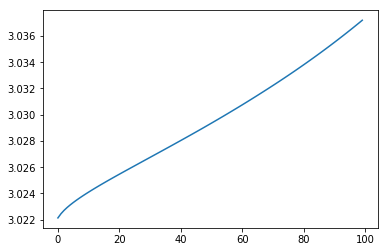

[[[5.34106966 2.48408799]
  [1.06504384 2.68610854]]

 [[3.45406381 1.1903303 ]
  [3.46398795 1.0798769 ]]]


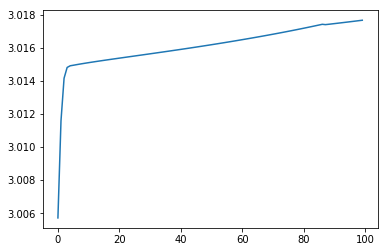

[[[1.09772094 5.54602917]
  [1.06504383 8.13028957]]

 [[1.09772094 3.12163303]
  [1.06504383 1.29913708]]]


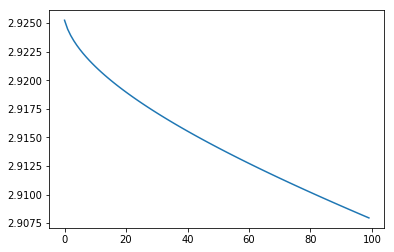

[[[8.30538737 1.07957425]
  [1.06504383 9.78244463]]

 [[3.30637657 1.07957424]
  [1.06504383 1.07987691]]]


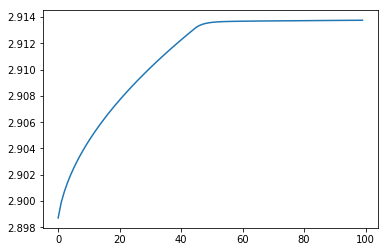

[[[4.70325426 4.10870765]
  [1.47943506 1.80840049]]

 [[1.72215324 2.06482296]
  [2.97716232 1.0798769 ]]]


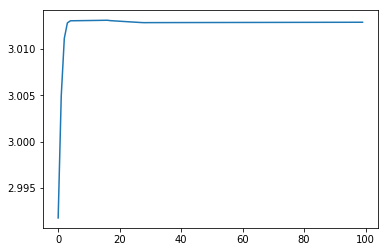

[[[5.1341795  5.83170765]
  [1.06504383 1.0798769 ]]

 [[1.09772094 1.43771941]
  [4.00698085 1.0798769 ]]]


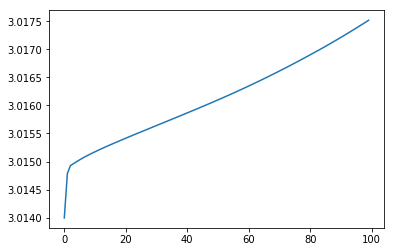

[[[10.60990621  1.07957425]
  [ 1.06504383  8.54449123]]

 [[ 2.3904156   1.07957424]
  [ 1.06504383  1.24416771]]]


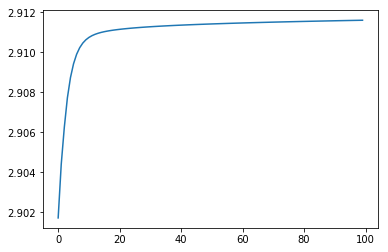

[[[6.27319744 1.48744465]
  [1.06504384 3.82654934]]

 [[3.84902424 1.07957424]
  [1.99233356 1.50626235]]]


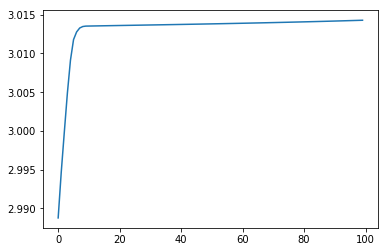

[[[1.59444313 5.37476186]
  [1.06504383 7.37721667]]

 [[1.09772094 3.04061433]
  [1.87814054 1.0798769 ]]]


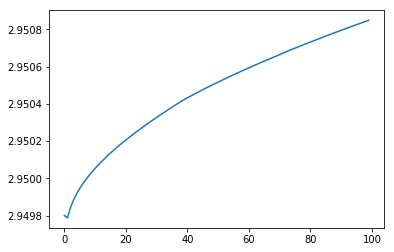

[[[8.85644534 1.07957425]
  [1.06504383 5.74256828]]

 [[3.08735142 1.07957424]
  [2.43073981 1.0798769 ]]]


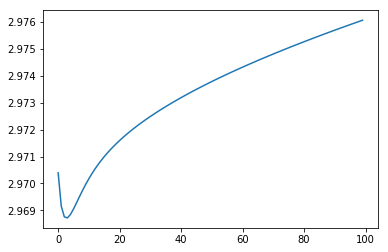

[[[10.64761202  1.07957424]
  [ 1.06504383  7.9240357 ]]

 [[ 2.37542894  1.07957424]
  [ 1.06504383  1.32650937]]]


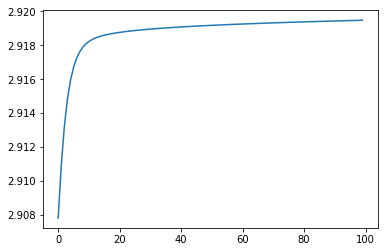

[[[2.29972776 3.5649959 ]
  [1.13492526 4.19687619]]

 [[1.80019692 3.22251054]
  [2.82113402 1.0798769 ]]]


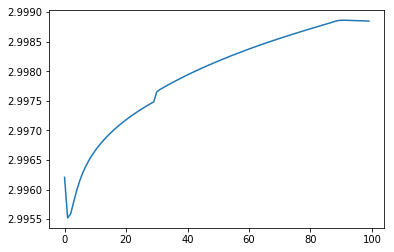

[[[10.58142229  1.07957424]
  [ 1.06504383  7.00417454]]

 [[ 2.40173691  1.07957424]
  [ 1.06504387  1.44858562]]]


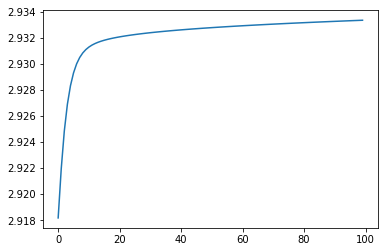

[[[3.02801446 1.8166794 ]
  [1.06504383 8.30512067]]

 [[3.67200562 2.25820878]
  [1.56445897 1.0798769 ]]]


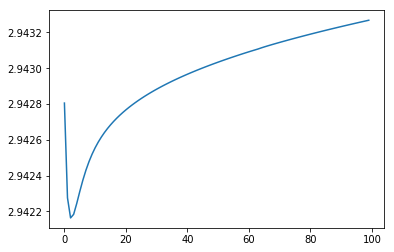

[[[1.55841191 5.70171737]
  [1.06504383 1.7640424 ]]

 [[1.09772094 2.85419378]
  [3.77569603 1.0798769 ]]]


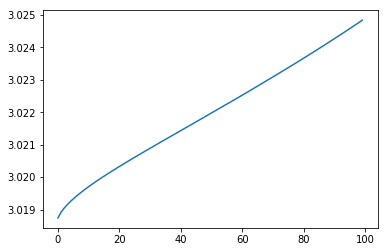

[[[7.10484316 1.07957424]
  [1.06504383 9.7824445 ]]

 [[3.78354848 1.07957424]
  [1.06504388 1.0798769 ]]]


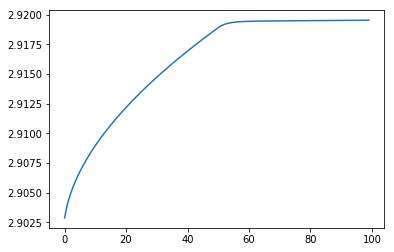

[[[4.93641633 5.27647716]
  [1.06504383 8.51976853]]

 [[1.09772094 1.85111902]
  [1.49189642 1.0798769 ]]]


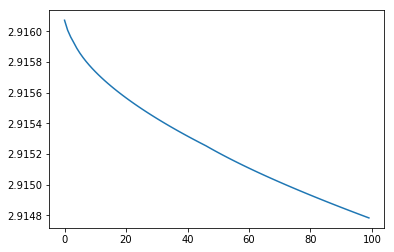

[[[7.38750499 1.07957424]
  [1.06504383 1.28284799]]

 [[3.67120086 1.07957424]
  [3.93836568 1.0798769 ]]]


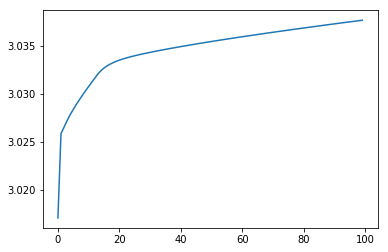

[0.76982189 1.13393074] 3.0376833816409192


[[[2.42736825 4.54697263]
  [1.06507326 8.52700571]]

 [[1.09781897 3.23517703]
  [1.489319   1.07990643]]]


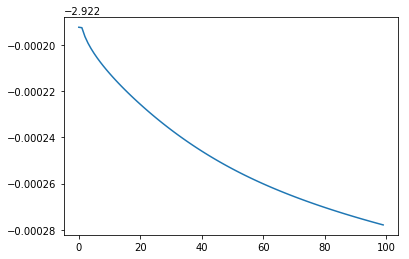

[[[7.47411604 1.46500906]
  [1.06504383 5.45074045]]

 [[3.38628429 1.07957424]
  [2.52939335 1.0798769 ]]]


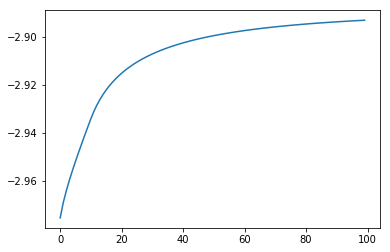

[[[7.5864409  4.91775268]
  [1.06504383 9.78244439]]

 [[1.09772095 1.07957425]
  [1.06504383 1.07987694]]]


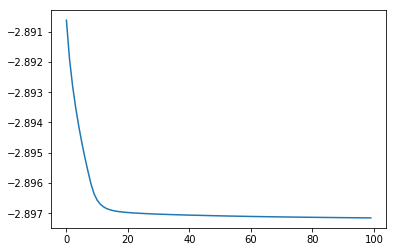

[[[2.29306442 3.54745046]
  [1.06504383 1.94857631]]

 [[1.81630376 3.22057665]
  [3.71331362 1.0798769 ]]]


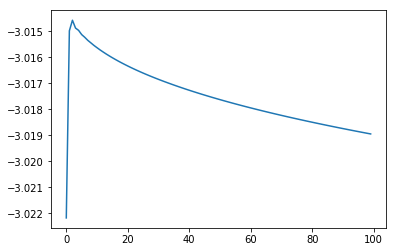

[[[3.58242393 4.35484038]
  [1.06504383 3.23532852]]

 [[1.26346602 2.76493027]
  [3.27832201 1.0798769 ]]]


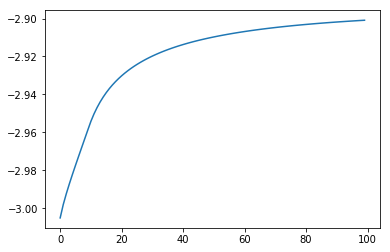

[[[10.10665923  1.07957424]
  [ 1.06504383  7.69885114]]

 [[ 2.59043766  1.07957424]
  [ 1.06504383  1.35639398]]]


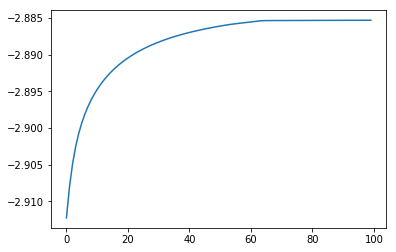

[[[4.42811341 1.64206475]
  [1.06504383 9.78244386]]

 [[4.11335811 1.4262641 ]
  [1.06504383 1.07987701]]]


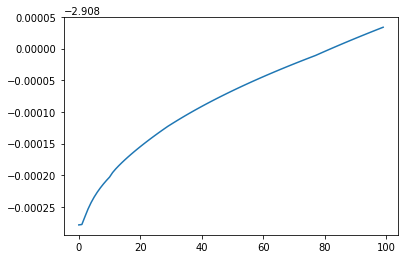

[[[6.51488599 1.73067134]
  [1.06504383 4.91080656]]

 [[3.59489034 1.07957425]
  [2.71192011 1.0798769 ]]]


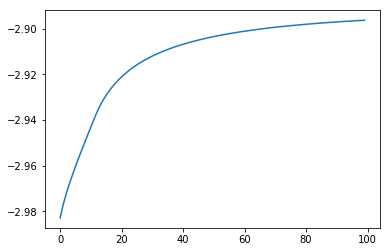

[[[4.07759517 4.74921071]
  [1.39948345 1.86818741]]

 [[1.09772096 2.49459571]
  [3.10812504 1.0798769 ]]]


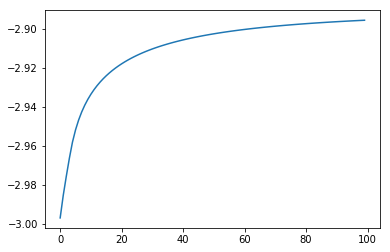

[[[7.45084168 1.07957425]
  [1.06504383 4.80146589]]

 [[3.64602687 1.07957424]
  [2.74888315 1.0798769 ]]]


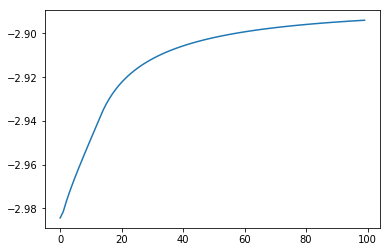

[[[6.41191149 4.96002364]
  [1.06504383 9.04953963]]

 [[1.20615698 1.39088528]
  [1.31280523 1.0798769 ]]]


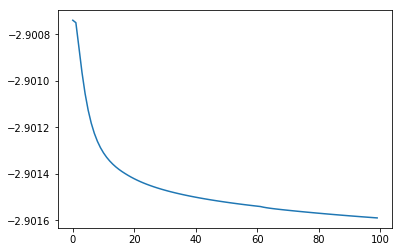

[[[10.15178905  1.07957424]
  [ 1.06504383  9.78243949]]

 [[ 2.57250023  1.07957424]
  [ 1.06504557  1.0798769 ]]]


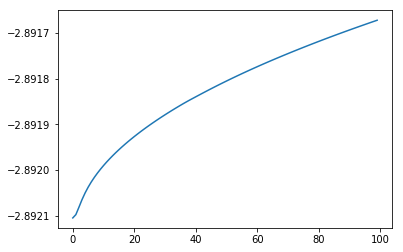

[[[1.09772094 6.64854086]
  [1.06504383 9.78244465]]

 [[1.09772094 2.44758352]
  [1.06504383 1.0798769 ]]]


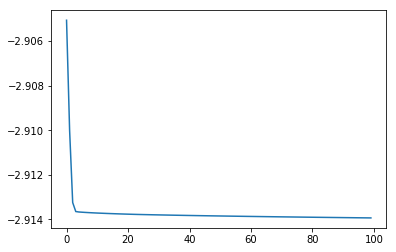

[[[1.09772095 4.43153645]
  [1.06504383 8.30039829]]

 [[1.09772094 3.80300746]
  [1.56605539 1.0798769 ]]]


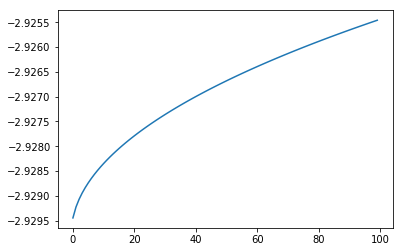

[[[9.3605752  1.07957424]
  [1.06504383 6.20200247]]

 [[2.88697846 1.07957424]
  [2.27542629 1.0798769 ]]]


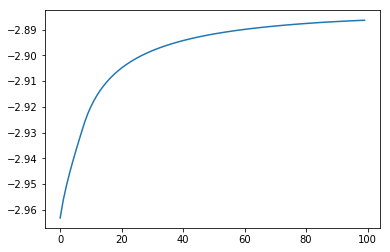

[[[1.146863   4.97478197]
  [1.06504383 4.91648837]]

 [[1.09772094 3.45250551]
  [2.70999935 1.0798769 ]]]


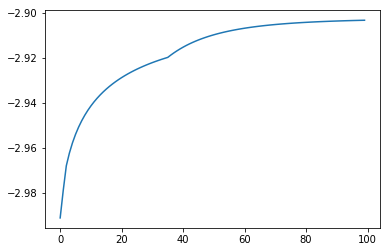

[[[1.09772094 6.62657984]
  [1.06504383 5.36715974]]

 [[1.09772094 2.46100997]
  [1.88890303 1.34240973]]]


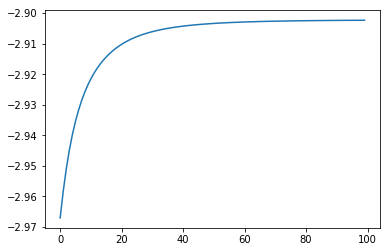

[[[7.46847798 4.13870271]
  [1.06504383 8.06183922]]

 [[1.65090697 1.07957424]
  [1.58079856 1.10574866]]]


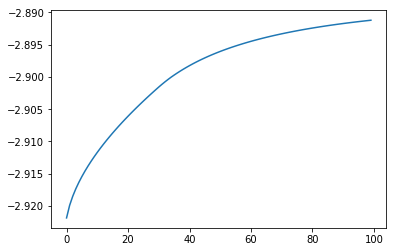

[[[2.19160769 2.14976752]
  [1.06504383 1.08541631]]

 [[3.18167642 2.82857254]
  [4.00510823 1.0798769 ]]]


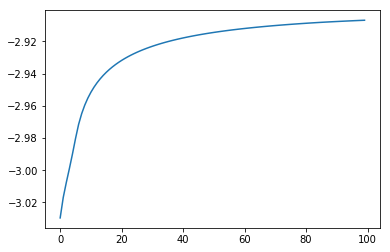

[[[1.42436599 3.28948569]
  [1.06504383 7.80500102]]

 [[1.90539805 3.61928802]
  [1.73352637 1.0798769 ]]]


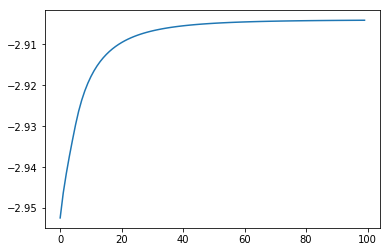

[[[4.5806843  4.09957906]
  [1.06504383 1.07987701]]

 [[1.70770587 2.12982473]
  [4.00698081 1.0798769 ]]]


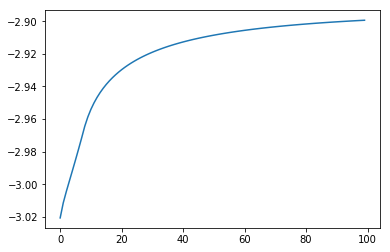

[[[6.7567827  2.83746049]
  [1.65024883 2.30975966]]

 [[2.7794494  1.07957424]
  [2.48469818 1.0798769 ]]]


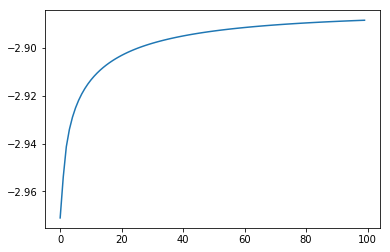

[[[5.45992945 4.60300578]
  [1.06504383 1.53124858]]

 [[1.37743038 1.80398711]
  [3.85439289 1.0798769 ]]]


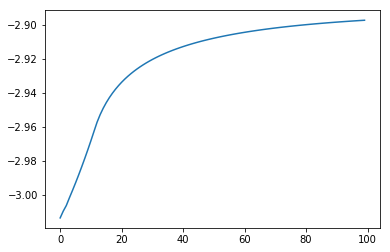

[[[2.910224   6.21236034]
  [1.06504383 9.78244465]]

 [[1.09772094 2.03654796]
  [1.06504383 1.0798769 ]]]


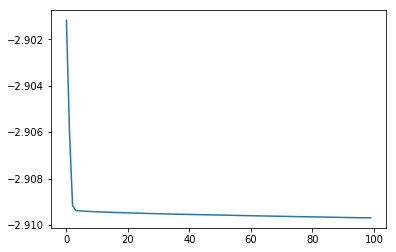

[[[1.09772094 4.71084405]
  [1.06504383 8.02670823]]

 [[1.09772094 3.63224542]
  [1.65365812 1.08180809]]]


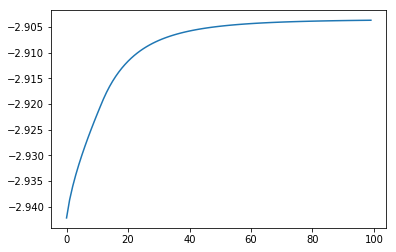

[1.70049108 0.59241436] -2.8853197934737933
2.6395833333333334


[[[1.51841985 4.20290265]
  [2.06286545 1.08331876]]

 [[1.08757929 3.79502743]
  [2.14027111 1.07157291]]]


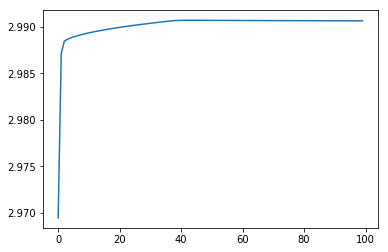

[[[10.80588669  1.07125563]
  [ 1.05824421  9.24581429]]

 [[ 2.32676954  1.07125563]
  [ 1.28058111  1.07152665]]]


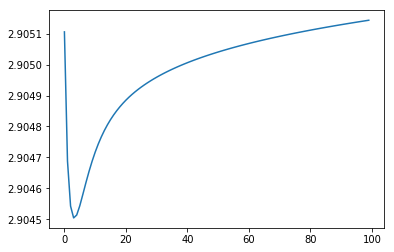

[[[5.01517556 2.8923614 ]
  [1.05824421 9.90351089]]

 [[2.98708698 1.50187541]
  [1.05824421 1.07152665]]]


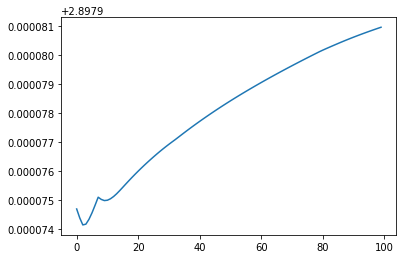

[[[3.28381349 1.74140592]
  [1.05824421 7.82629428]]

 [[3.79561308 2.0923029 ]
  [1.7604554  1.07152665]]]


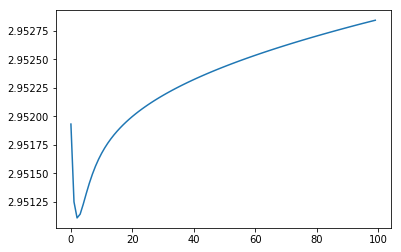

[[[10.64531024  1.07125563]
  [ 1.05824421  6.04762015]]

 [[ 2.39059274  1.07125563]
  [ 1.05824421  1.58324816]]]


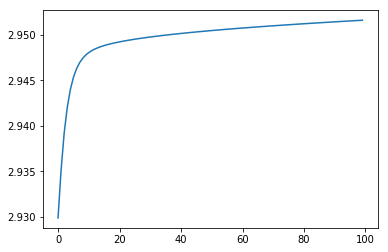

[[[4.47575284 5.48235198]
  [1.05824421 9.16880713]]

 [[1.08750529 1.90710713]
  [1.30661368 1.07152665]]]


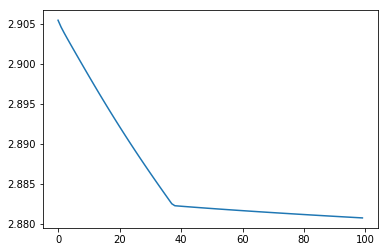

[[[10.4820159   1.07125563]
  [ 1.05824421  2.47352799]]

 [[ 2.4554962   1.07125563]
  [ 3.56997895  1.07152665]]]


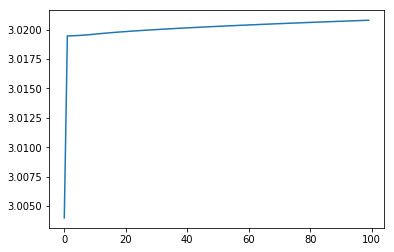

[[[9.13551265 1.07125563]
  [1.05824421 9.90351089]]

 [[2.99068142 1.07125563]
  [1.05824421 1.07152665]]]


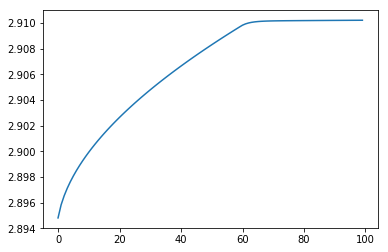

[[[6.28137961 2.39000849]
  [1.05824421 9.90351089]]

 [[3.26804375 1.07125563]
  [1.05824421 1.07152665]]]


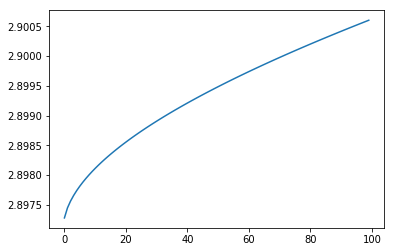

[[[9.45881626 1.07125563]
  [1.05824421 1.07152665]]

 [[2.86218019 1.07125563]
  [4.04393098 1.07152665]]]


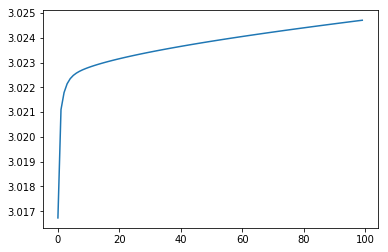

[[[1.08750531 6.30657673]
  [1.05824421 7.4689971 ]]

 [[1.08750529 2.67008217]
  [1.8812411  1.07152665]]]


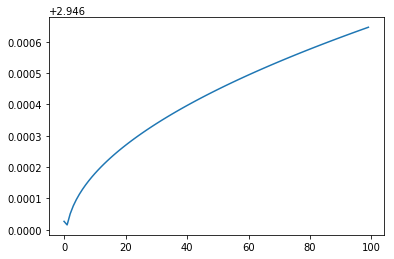

[[[1.0875053  5.65960323]
  [1.05824421 9.52038269]]

 [[1.08750529 3.06562643]
  [1.18776219 1.07152665]]]


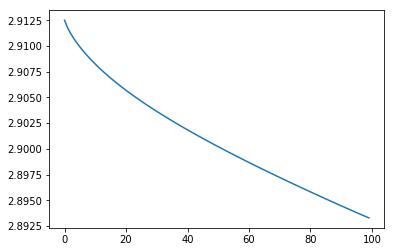

[[[11.52384915  1.07125563]
  [ 1.05824421  7.32457757]]

 [[ 2.04140602  1.07125563]
  [ 1.93006269  1.07152665]]]


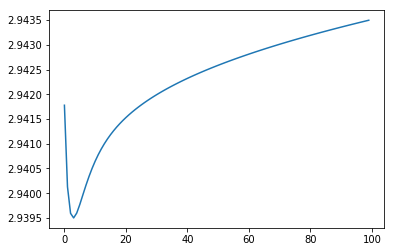

[[[2.21639638 4.06196248]
  [1.05824421 9.90351089]]

 [[1.29183323 3.428069  ]
  [1.05824421 1.07152665]]]


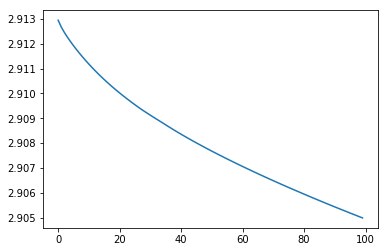

[[[3.09265448 5.29948234]
  [1.27822948 1.71291651]]

 [[1.08750529 2.53605824]
  [1.18436137 1.94571071]]]


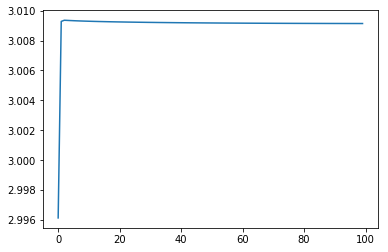

[[[1.08750529 6.86422565]
  [1.05824421 5.90366727]]

 [[1.08750529 2.32914884]
  [2.41040697 1.07152665]]]


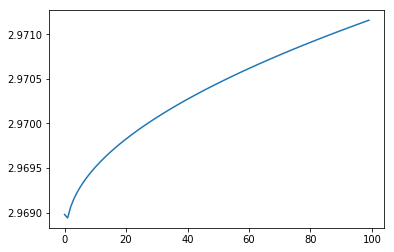

[[[9.90128181 1.07125563]
  [1.05824421 3.65360148]]

 [[2.68631651 1.07125563]
  [3.1710505  1.07152665]]]


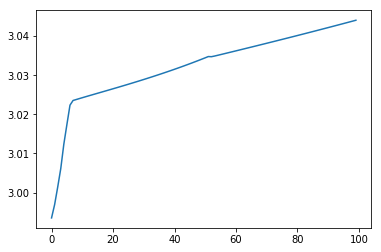

[[[4.91981796 3.14120058]
  [1.05824421 9.70435723]]

 [[2.72226185 1.63452528]
  [1.05824421 1.09795665]]]


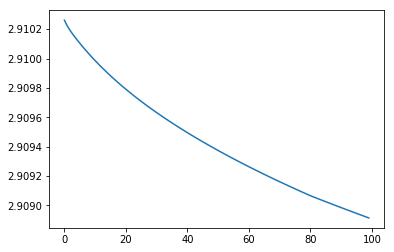

[[[7.08500132 1.07125563]
  [1.05824421 9.90351089]]

 [[3.80568381 1.07125563]
  [1.05824421 1.07152665]]]


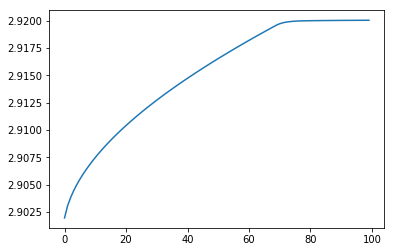

[[[1.08750529 6.38587356]
  [1.05824421 7.28036009]]

 [[1.08750529 2.62160197]
  [1.28480786 1.33070595]]]


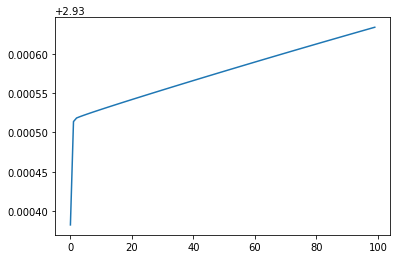

[[[8.23614709 1.07125563]
  [1.05824421 8.33547093]]

 [[3.34814595 1.07125563]
  [1.05824421 1.27962377]]]


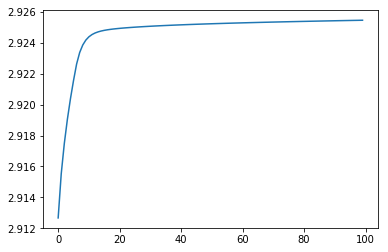

[[[10.40682667  1.07125564]
  [ 1.05824421  7.19342694]]

 [[ 2.48538112  1.07125563]
  [ 1.97439867  1.07152665]]]


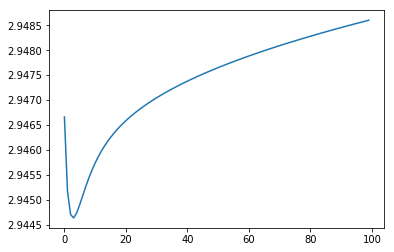

[[[9.26727263 2.46004267]
  [1.05824421 1.07152667]]

 [[2.03574694 1.07125563]
  [4.04393097 1.07152665]]]


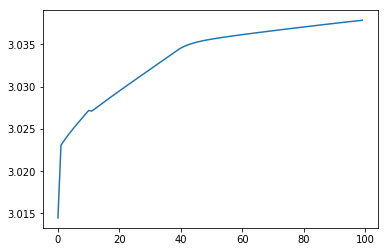

[[[4.28873333 5.61655224]
  [1.05824421 9.90351089]]

 [[1.08750529 1.89498802]
  [1.05824421 1.07152665]]]


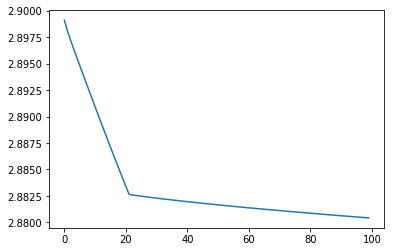

[[[1.08750529 6.81078785]
  [1.05824421 9.90351089]]

 [[1.08750529 2.36181945]
  [1.05824421 1.07152665]]]


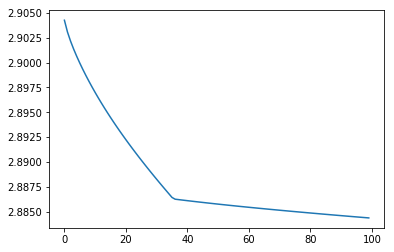

[0.73092413 1.15656368] 3.0440514907204843


[[[1.51841985 4.20290265]
  [2.06286545 1.08331876]]

 [[1.08757929 3.79502743]
  [2.14027111 1.07157291]]]


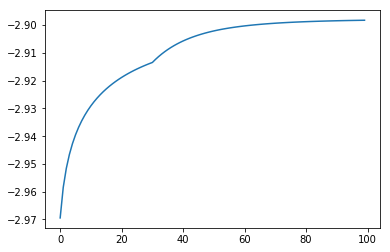

[[[3.40404807 6.75161601]
  [1.05824421 5.74306212]]

 [[1.08750529 1.53182617]
  [1.05824423 1.62366654]]]


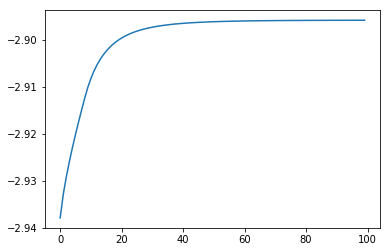

[[[11.66057526  1.29788995]
  [ 1.05824421  3.30331939]]

 [[ 1.8397741   1.07125563]
  [ 1.05824425  1.94744875]]]


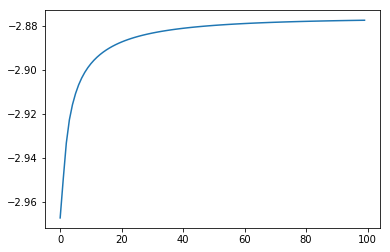

[[[5.51203007 3.25718911]
  [1.05824421 9.90351089]]

 [[2.7208452  1.34351359]
  [1.05824421 1.07152665]]]


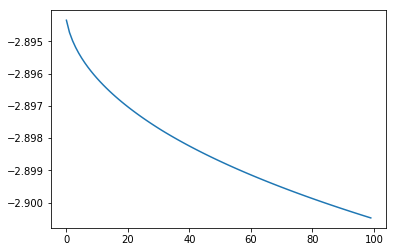

[[[10.46531904  1.07125563]
  [ 1.05824421  6.03788318]]

 [[ 2.46213258  1.07125563]
  [ 2.36503476  1.07152665]]]


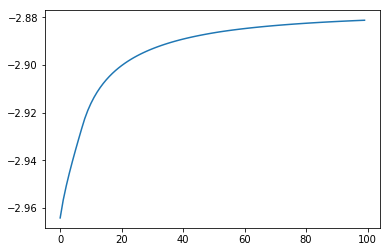

[[[11.6133812   1.07125563]
  [ 1.05824421  1.07152665]]

 [[ 2.00582035  1.07125563]
  [ 4.04393098  1.07152665]]]


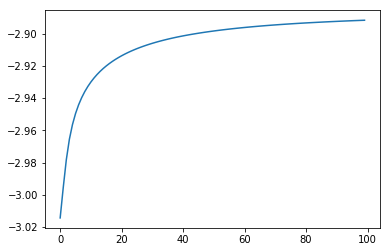

[[[1.73039889 5.41905521]
  [1.05824421 1.07152665]]

 [[1.08750529 2.97230994]
  [4.04393098 1.07152665]]]


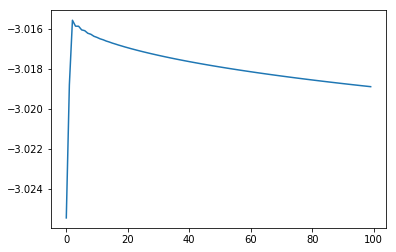

[[[7.68580286 1.07125563]
  [1.05824421 8.56568631]]

 [[3.56688742 1.07125563]
  [1.51050103 1.07152665]]]


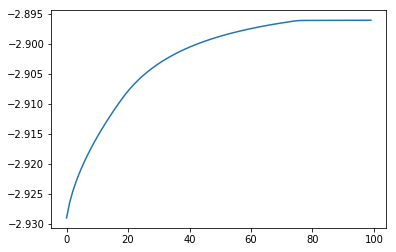

[[[9.92484968 2.09405884]
  [1.05824421 2.04728969]]

 [[2.01223519 1.07125563]
  [3.71407047 1.07152665]]]


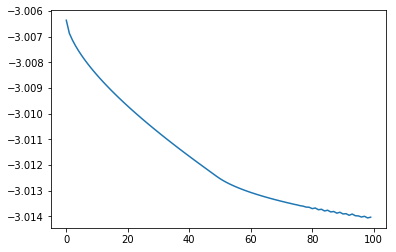

[[[6.86408848 4.95310724]
  [1.05824421 8.77871334]]

 [[1.29967463 1.13806703]
  [1.05824421 1.22080036]]]


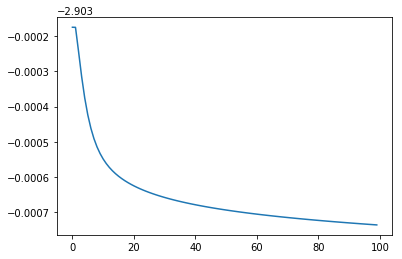

[[[9.72257968 1.07125563]
  [1.05824421 1.07152665]]

 [[2.757344   1.07125563]
  [4.04393098 1.07152665]]]


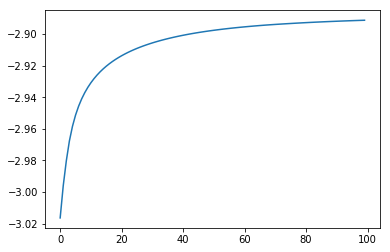

[[[2.99710338 6.7203557 ]
  [1.05824421 1.80423339]]

 [[1.08750529 1.7030971 ]
  [3.7962366  1.07152665]]]


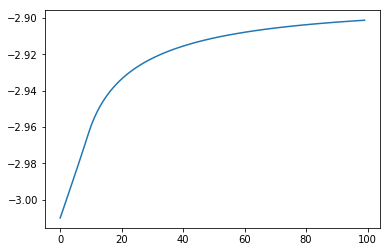

[[[4.20865936 5.80310461]
  [1.05824421 8.11132873]]

 [[1.08750529 1.81087446]
  [1.66409839 1.07152665]]]


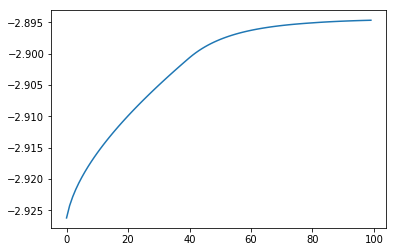

[[[3.8772921  3.33830506]
  [1.05824421 6.1311342 ]]

 [[2.32715955 2.27551242]
  [2.33351088 1.07152665]]]


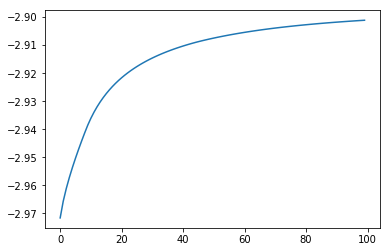

[[[7.81893222 1.07125566]
  [1.05824421 8.37731881]]

 [[3.51397341 1.07125563]
  [1.5741794  1.07152665]]]


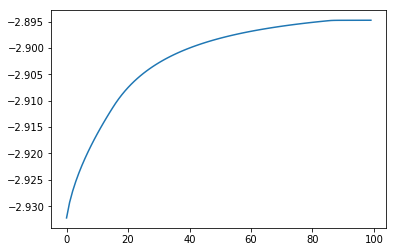

[[[8.18226464 4.58268352]
  [1.05824421 9.90351089]]

 [[1.08750529 1.07125563]
  [1.05824421 1.07152665]]]


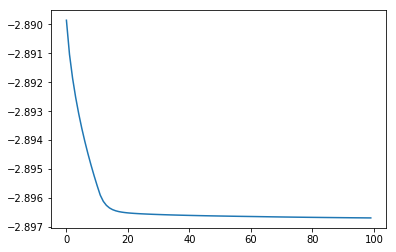

[[[1.08750533 5.96703203]
  [1.05824421 7.42889275]]

 [[1.08750529 2.87767174]
  [1.05824421 1.39993723]]]


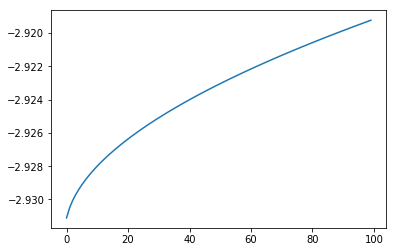

[[[9.8883159  1.68906163]
  [1.05824421 5.88358678]]

 [[2.28996139 1.07125563]
  [2.41719526 1.07152665]]]


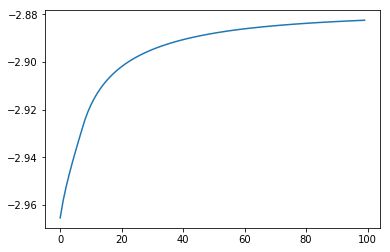

[[[1.08750529 6.58216313]
  [1.05824421 2.68539224]]

 [[1.08750529 2.50159518]
  [3.49835741 1.07152665]]]


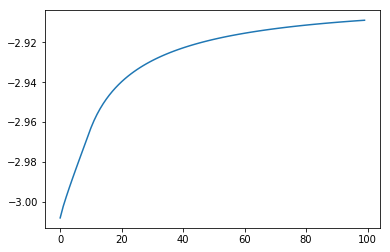

[[[11.16943598  1.07125563]
  [ 1.18449598  3.53074438]]

 [[ 2.18227215  1.07125563]
  [ 2.97386373  1.07152665]]]


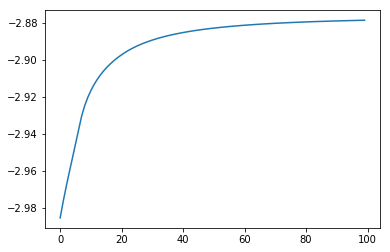

[[[1.08750529 6.92137793]
  [1.05824421 1.8365818 ]]

 [[1.08750529 2.2942073 ]
  [3.7853011  1.07152665]]]


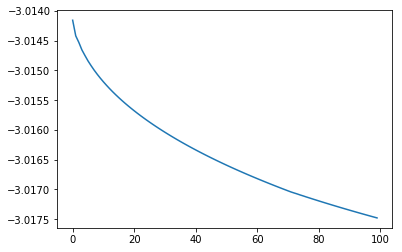

[[[10.54144038  1.07125563]
  [ 1.05824421  9.79388246]]

 [[ 2.43187716  1.07125563]
  [ 1.09530453  1.07152665]]]


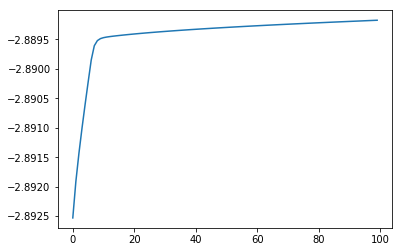

[[[10.07384985  1.07125563]
  [ 1.33344978  1.0715267 ]]

 [[ 2.6177271   1.07125563]
  [ 3.52356739  1.07152665]]]


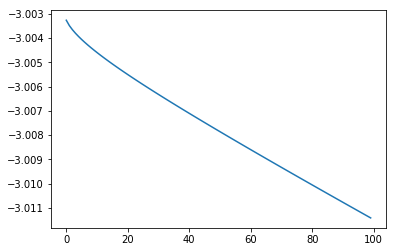

[[[10.27497027  1.07125563]
  [ 1.05824421  9.90351089]]

 [[ 2.53778917  1.07125563]
  [ 1.05824421  1.07152665]]]


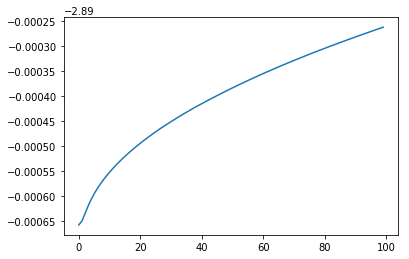

[[[2.4002282  2.10945608]
  [1.05824421 9.90351089]]

 [[3.26160133 2.7000256 ]
  [1.05824421 1.07152665]]]


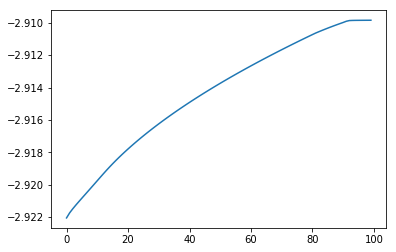

[1.74857823 0.56443451] -2.8774472527207546
2.75


[[[8.38513072 1.09355788]
  [1.05219094 6.71232636]]

 [[3.28225345 1.06390185]
  [2.16749651 1.06406211]]]


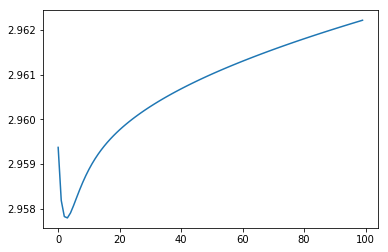

[[[7.86040433 1.3713629 ]
  [1.05215541 9.95079292]]

 [[3.3103701  1.06380663]
  [1.07282    1.06404932]]]


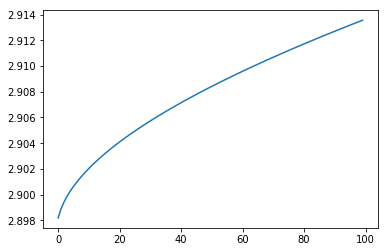

[[[ 8.14011157  1.06380664]
  [ 1.05215541 10.01192099]]

 [[ 3.39907588  1.06380663]
  [ 1.05215541  1.06404932]]]


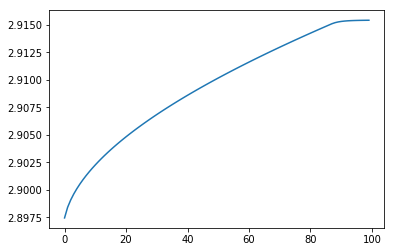

[[[7.79706823 1.43792473]
  [1.05215541 8.29330898]]

 [[3.2922857  1.06380663]
  [1.63313892 1.06404932]]]


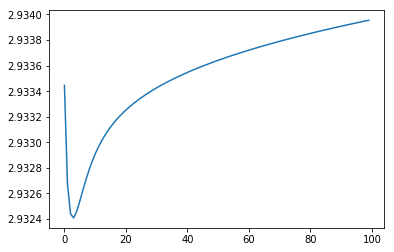

[[[10.70653773  1.06380663]
  [ 1.05215541  5.30734505]]

 [[ 2.37901643  1.06380663]
  [ 2.64255568  1.06404932]]]


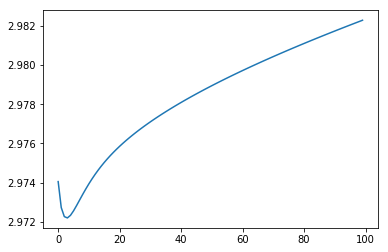

[[[1.84166268 4.6578521 ]
  [1.05215541 5.203293  ]]

 [[1.07835757 3.40469481]
  [2.67773089 1.06404932]]]


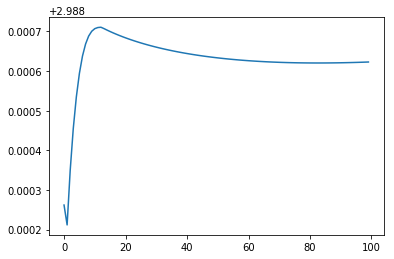

[[[ 5.52575524  2.1308154 ]
  [ 1.05215541 10.01192099]]

 [[ 3.74474287  1.06380664]
  [ 1.05215541  1.06404932]]]


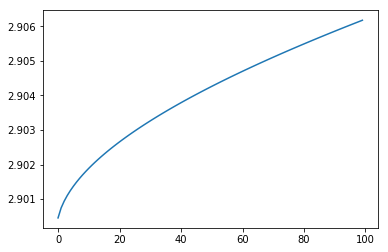

[[[ 5.9696357   1.06380663]
  [ 1.05215541 10.01192099]]

 [[ 4.26175974  1.06380663]
  [ 1.05215541  1.06404932]]]


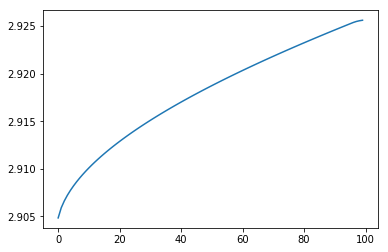

[[[7.30887757 1.06380667]
  [1.22222849 2.04928298]]

 [[3.72946062 1.06380663]
  [3.42237911 1.06404932]]]


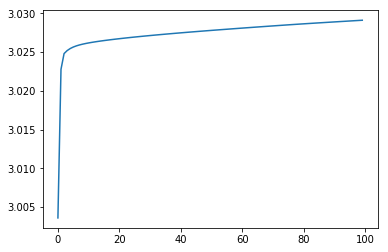

[[[1.74169647 5.22484706]
  [1.05215541 1.06404933]]

 [[1.07835757 3.09542551]
  [4.07701838 1.06404932]]]


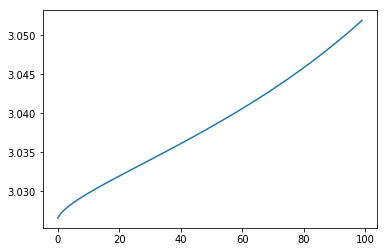

[[[11.83292316  1.06380663]
  [ 1.05215541 10.01192098]]

 [[ 1.9313199   1.06380663]
  [ 1.05215541  1.06404932]]]


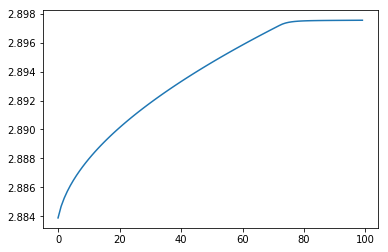

[[[ 1.07835757  7.04793123]
  [ 1.05215541 10.01192099]]

 [[ 1.07835757  2.22886155]
  [ 1.05215541  1.06404932]]]


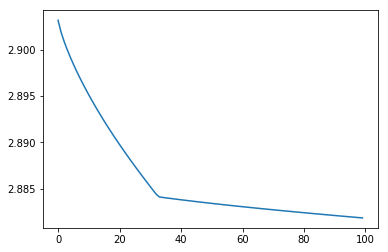

[[[12.58420714  1.06380663]
  [ 1.08358389  1.06404932]]

 [[ 1.63271231  1.06380663]
  [ 4.01759286  1.06404932]]]


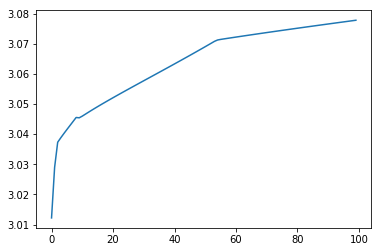

[[[12.08316961  1.79900173]
  [ 1.05215541 10.01192099]]

 [[ 1.3540571   1.06380663]
  [ 1.05215541  1.06404932]]]


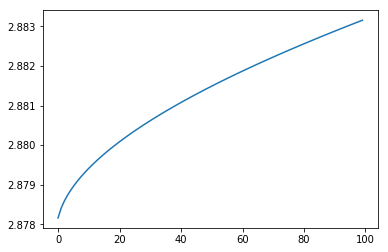

[[[10.95304044  1.06380663]
  [ 1.05215541 10.01192098]]

 [[ 2.28104073  1.06380663]
  [ 1.05215541  1.06404932]]]


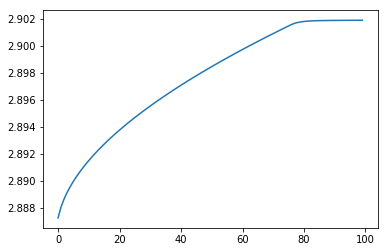

[[[11.99774069  1.14603838]
  [ 1.05215541  6.28955557]]

 [[ 1.81236909  1.06380663]
  [ 2.31051558  1.06404932]]]


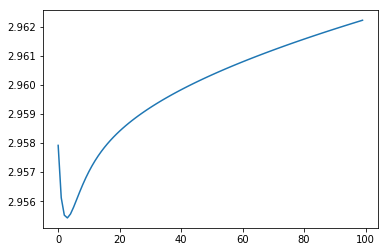

[[[11.28962333  1.06380663]
  [ 1.05215541  7.17029994]]

 [[ 2.14726148  1.06380663]
  [ 2.01277651  1.06404932]]]


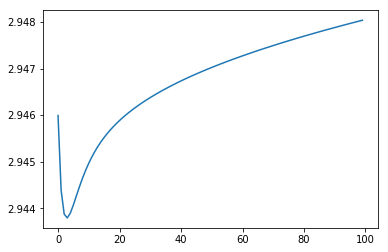

[[[11.71063284  1.06380663]
  [ 1.05215541 10.01192099]]

 [[ 1.97992578  1.06380663]
  [ 1.05215541  1.06404932]]]


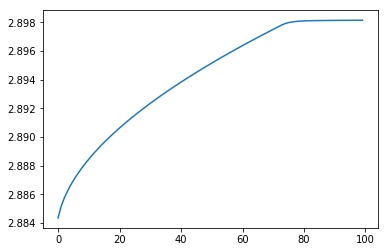

[[[5.88935821 2.97480364]
  [1.05215541 1.94203381]]

 [[3.05172101 1.06380664]
  [3.7802123  1.06404932]]]


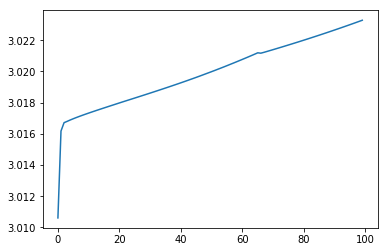

[[[6.34584165 2.78313883]
  [1.05215541 5.45207122]]

 [[2.99484761 1.06380663]
  [1.05215541 1.66919438]]]


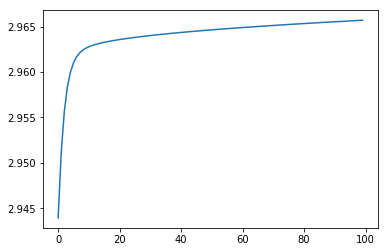

[[[9.57000503 3.76022754]
  [1.05215541 8.89186824]]

 [[1.07835757 1.06380663]
  [1.43079362 1.06404932]]]


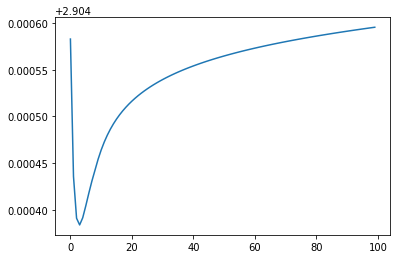

[[[5.95812816 1.88903818]
  [1.05215541 8.86669697]]

 [[3.73002027 1.06380664]
  [1.43930287 1.06404932]]]


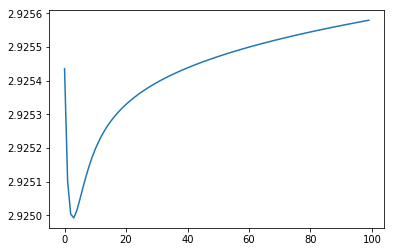

[[[1.07835757 5.33738595]
  [1.43576626 3.27470084]]

 [[1.07835757 3.27464838]
  [2.60436082 1.06404932]]]


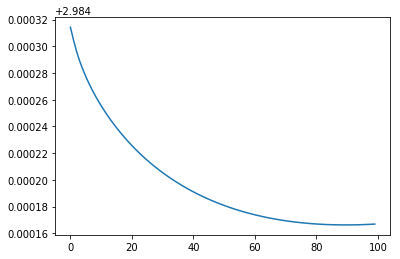

[[[10.7616962   3.03141187]
  [ 1.05215541  2.11691137]]

 [[ 1.07835757  1.06380663]
  [ 3.72109425  1.06404932]]]


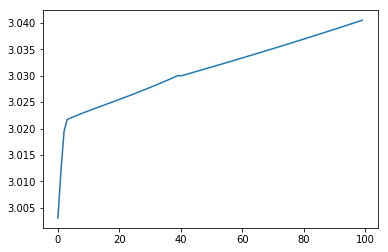

[[[ 9.87461869  1.26220085]
  [ 1.05215541 10.01192099]]

 [[ 2.5807382   1.06380663]
  [ 1.05215541  1.06404932]]]


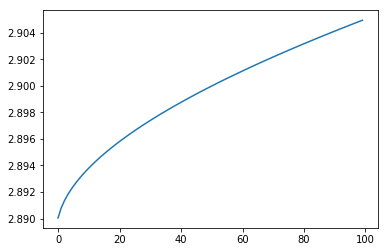

[0.5249279  1.27642403] 3.0777759610519633


[[[8.38513072 1.09355788]
  [1.05219094 6.71232636]]

 [[3.28225345 1.06390185]
  [2.16749651 1.06406211]]]


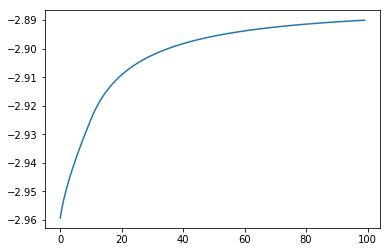

[[[8.8023673  1.06380663]
  [1.05215542 5.56203593]]

 [[3.13585373 1.06380663]
  [2.55645643 1.06404932]]]


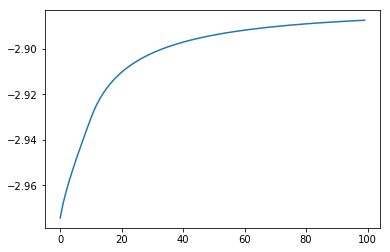

[[[12.63369179  1.06380663]
  [ 1.05215541  3.02379636]]

 [[ 1.613044    1.06380663]
  [ 3.41451824  1.06404932]]]


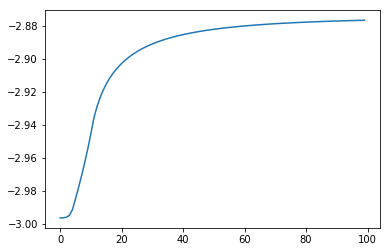

[[[1.07835757 6.47621707]
  [1.05215541 8.39175582]]

 [[1.07835757 2.57839403]
  [1.05215541 1.27906407]]]


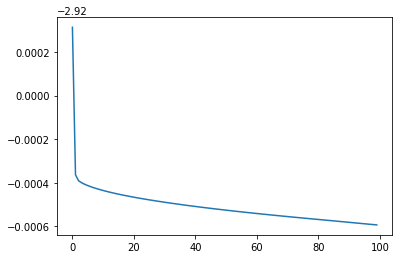

[[[10.2033536   3.3728836 ]
  [ 1.05215541  1.06404932]]

 [[ 1.07835757  1.06380663]
  [ 4.07701838  1.06404932]]]


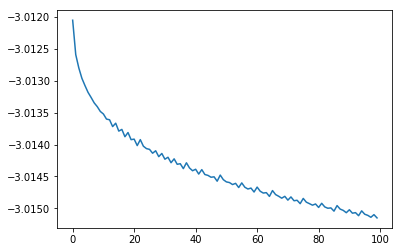

[[[5.94806817 5.97533532]
  [1.05215541 8.92603818]]

 [[1.07835757 1.06380663]
  [1.41924233 1.06404932]]]


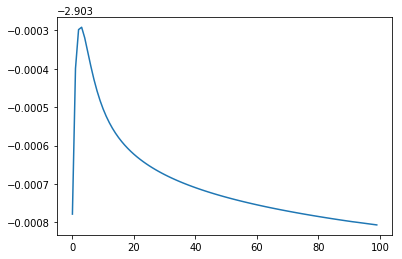

[[[4.89741769 3.89094416]
  [1.05215541 9.3112253 ]]

 [[1.97512599 1.88737996]
  [1.28902833 1.06404932]]]


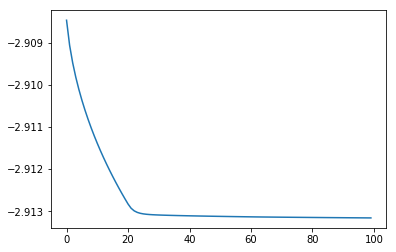

[[[ 1.57255254  3.12734174]
  [ 1.05215541 10.01192099]]

 [[ 2.09445121  3.48516279]
  [ 1.05215541  1.06404932]]]


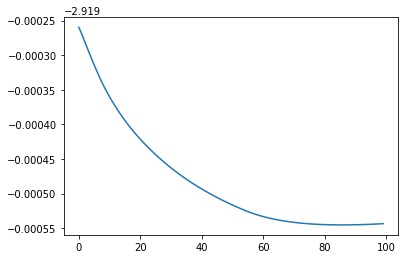

[[[8.0714996  1.06380663]
  [1.05215541 6.14156181]]

 [[3.4263466  1.06380663]
  [2.36054545 1.06404932]]]


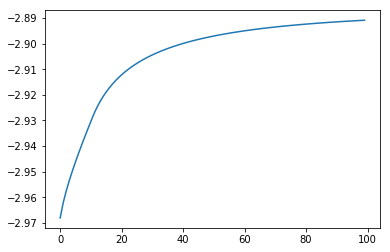

[[[3.09459264 6.40716711]
  [1.05215541 7.26053965]]

 [[1.07835757 1.8667269 ]
  [1.98227062 1.06404932]]]


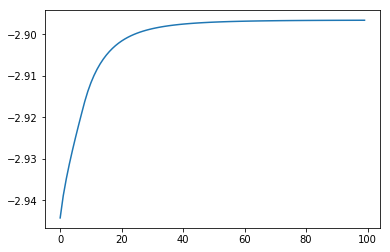

[[[ 8.22602556  1.88465163]
  [ 1.05215541 10.01192099]]

 [[ 2.83146577  1.06380663]
  [ 1.05215541  1.06404932]]]


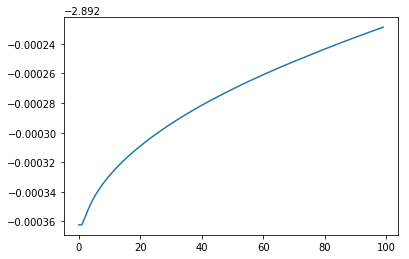

[[[ 9.91709057  1.06380665]
  [ 1.05215541 10.01192099]]

 [[ 2.69279246  1.06380663]
  [ 1.05215541  1.06404932]]]


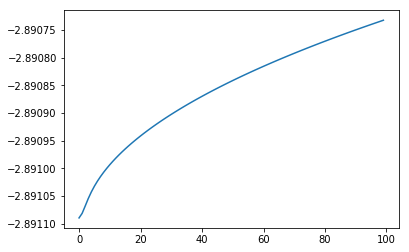

[[[1.07835757 7.2958392 ]
  [1.05215541 5.06953297]]

 [[1.07835757 2.07729649]
  [2.53232286 1.13888443]]]


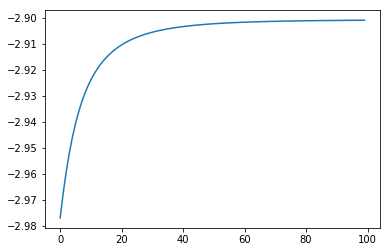

[[[8.00368859 4.71815693]
  [1.05215541 9.97939826]]

 [[1.07835757 1.06380663]
  [1.06314985 1.06404932]]]


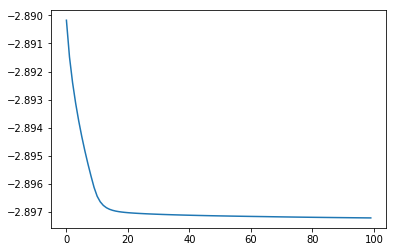

[[[4.91996896 2.65393722]
  [1.05215541 2.19515533]]

 [[3.20506916 1.47817785]
  [3.69464358 1.06404932]]]


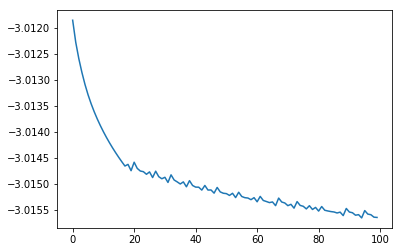

[[[9.40523287 1.06380663]
  [1.05215541 6.50143084]]

 [[2.89623697 1.06380663]
  [1.9023827  1.19615391]]]


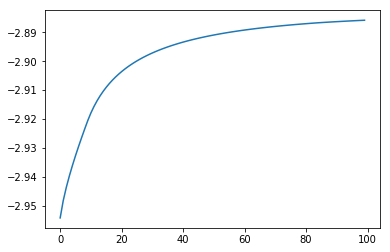

[[[7.65477869 3.91100004]
  [1.05215541 1.06404932]]

 [[1.741603   1.06380663]
  [4.07701838 1.06404932]]]


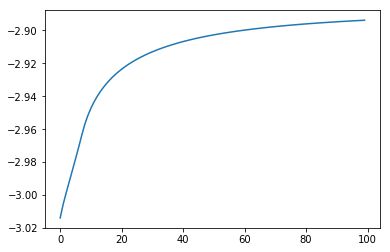

[[[ 4.7086129   2.48519372]
  [ 1.05215541 10.01192099]]

 [[ 3.33175064  1.54119764]
  [ 1.05215541  1.06404932]]]


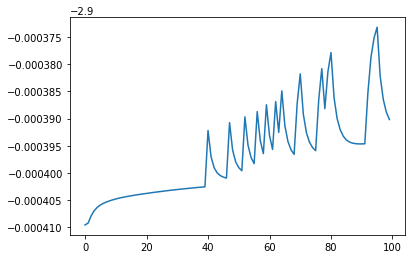

[[[11.29305374  1.06380664]
  [ 1.05215541  9.61697498]]

 [[ 2.14589802  1.06380663]
  [ 1.18566846  1.06404932]]]


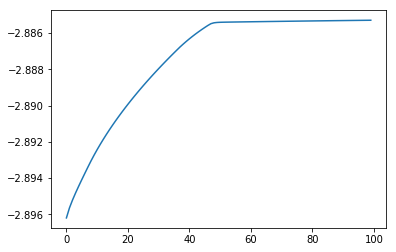

[[[ 7.44958937  3.33505814]
  [ 1.05215541 10.01192099]]

 [[ 2.19745951  1.06380664]
  [ 1.05215541  1.06404932]]]


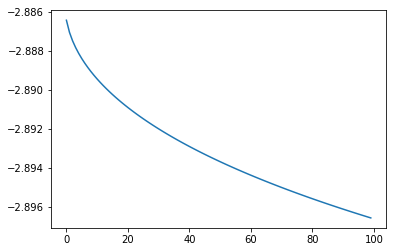

[[[ 9.6569577   3.46951536]
  [ 1.05215541 10.01192099]]

 [[ 1.2327293   1.06380663]
  [ 1.05215541  1.06404932]]]


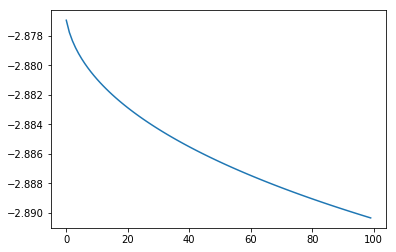

[[[1.51420027 6.59804584]
  [1.05215541 1.89240891]]

 [[1.07835757 2.34094656]
  [3.79698819 1.06404932]]]


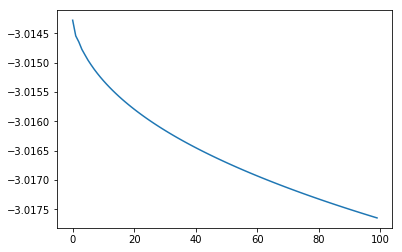

[[[11.6781348   1.06380663]
  [ 1.05215541 10.01192099]]

 [[ 1.99284255  1.06380663]
  [ 1.05215541  1.06404932]]]


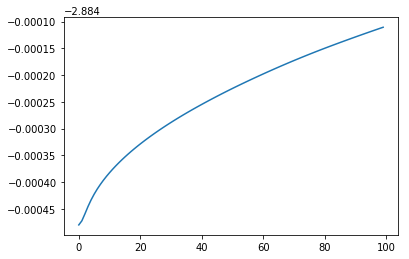

[[[1.87092245 3.27356867]
  [1.05215541 3.85879837]]

 [[2.00675624 3.36669823]
  [3.13224255 1.06404932]]]


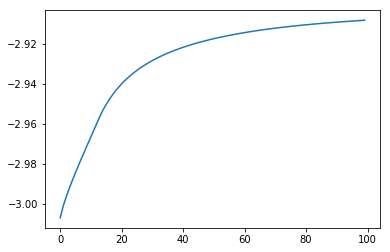

[[[10.99091114  1.0638067 ]
  [ 1.05215541  8.83655344]]

 [[ 2.26598848  1.06380663]
  [ 1.05215541  1.22003425]]]


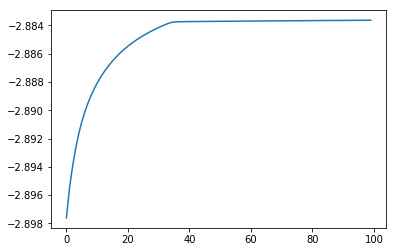

[1.75317778 0.56175823] -2.8766942423645068


In [289]:
ngams = 25 
logGams = np.linspace(0.1, 2.75, ngams)
[ w_min_pgd_bnds, w_max_pgd_bnds ] = get_bounds_pgd(logGams, N_RST, N_RNDS, p_a1_s, *[data_])

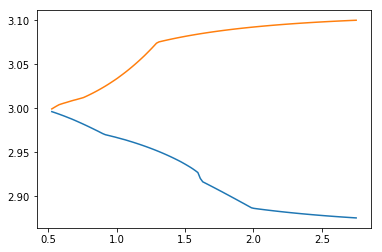

In [181]:
[min_,max_] = plot_bounds(w_min_bnds, w_max_bnds, Phi, len(logGams_full), nSmarg, logGams_full, rearrange=False)
ngams = 25 


In [241]:
w_max_pgd_bnds

[None,
 None,
 None,
 None,
 None,
 None,
 array([1.18176294, 0.89423996]),
 array([1.21517485, 0.87479901]),
 array([1.24181274, 0.85929956]),
 array([1.3513307 , 0.79557577]),
 array([1.28822563, 0.8322939 ]),
 array([1.3036999 , 0.82329009]),
 array([1.35171558, 0.79535182]),
 array([1.41027482, 0.76127872]),
 array([1.52044484, 0.69717552]),
 array([1.57506087, 0.66539681]),
 array([1.62305513, 0.63747101]),
 array([1.65000934, 0.62178751]),
 array([1.65179526, 0.62074836]),
 array([1.66226281, 0.61465775]),
 array([1.68897487, 0.59911514]),
 array([1.72059276, 0.58071805]),
 array([1.7335    , 0.57320789]),
 array([1.7474226 , 0.56510692]),
 array([1.7291421 , 0.57574356])]

[2.9961685  2.99523829 2.99428537 2.99329616 2.99227794 2.99125465
 2.99016297 2.98905737 2.9879866  2.9868072  2.98560621 2.98437706
 2.98313614 2.98187212 2.98058767 2.9792829  2.97795109 2.97660384
 2.97524108 2.9739046  2.97246762 2.9710821  2.96994077 2.96928165
 2.96860258 2.96790466 2.96723962 2.96646359 2.96572752 2.96495872
 2.96422863 2.96339722 2.96253564 2.96170871 2.96082582 2.95992956
 2.95901033 2.95806785 2.95710141 2.95611018 2.95509345 2.95405119
 2.95298235 2.95188604 2.95076147 2.94960749 2.94842319 2.947207
 2.94595801 2.94467406 2.94335309 2.94199448 2.9406144  2.93918361
 2.93763515 2.93606353 2.934435   2.93276007 2.9309533  2.92899728
 2.92690711 2.92020617 2.91639136 2.91498513 2.91356719 2.91214208
 2.91070993 2.90926753 2.90781768 2.90634876 2.90491481 2.9034136
 2.90194203 2.9004601  2.89894981 2.89747139 2.89596667 2.89444399
 2.89293341 2.89144784 2.88990577 2.88839021 2.88686674 2.88620457
 2.885837   2.88547617 2.88512194 2.88477421 2.88443283 2.8840977

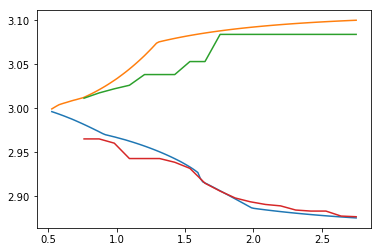

In [291]:
[min_,max_] = plot_bounds(w_min_bnds, w_max_bnds, Phi, len(logGams_full), nSmarg, logGams_full, rearrange=False)
ngams = 25 


ngams = 25 
Phi = np.asarray([1,2])
logGams = np.linspace(0.1, 2.75, ngams)
[cum_min_,cum_max_] = plot_bounds(w_min_pgd_bnds, w_max_pgd_bnds, Phi, ngams, nSmarg, logGams, rearrange=True)
print cum_min_
print cum_max_


{'Phi': array([-1, -2]), 'a_bnd': array([[1.07835757, 1.06380663],
        [1.05215541, 1.06404932]]), 'b_bnd': array([[20.17346498, 16.61296823],
        [13.76200898, 16.67235189]]), 'check_grad': False, 'gamma': 1, 'p_e_s': array([[0.1, 0.2],
        [0.9, 0.8]]), 'pbs': array([0.36783161, 0.63216839]), 's_a_giv_sprime': array([[[0.12777586, 0.18705459],
         [0.56262158, 0.17313425]],
 
        [[0.20892712, 0.19883943],
         [0.10058951, 0.44102173]]]), 'sense_min': False, 'tight': True}

In [300]:
data_['Phi'] = np.asarray([1,2])
N_RST = 25
ngams = 25 
logGams = np.linspace(0.1, 2.75, ngams)
[ w_min_pgd_bnds, w_max_pgd_bnds ] = get_bounds_pgd_parallel(logGams,N_RST,N_RNDS, p_a1_s, *[data_])

0.1


[Parallel(n_jobs=12)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=12)]: Done   1 tasks      | elapsed:    1.1s
[Parallel(n_jobs=12)]: Done   5 out of  25 | elapsed:    2.3s remaining:    9.2s
[Parallel(n_jobs=12)]: Done   8 out of  25 | elapsed:    2.3s remaining:    4.9s
[Parallel(n_jobs=12)]: Done  11 out of  25 | elapsed:    2.3s remaining:    2.9s
[Parallel(n_jobs=12)]: Done  14 out of  25 | elapsed:    2.3s remaining:    1.8s
[Parallel(n_jobs=12)]: Done  17 out of  25 | elapsed:    2.3s remaining:    1.1s
[Parallel(n_jobs=12)]: Done  20 out of  25 | elapsed:    3.4s remaining:    0.9s
[Parallel(n_jobs=12)]: Done  23 out of  25 | elapsed:    3.4s remaining:    0.3s
[Parallel(n_jobs=12)]: Done  25 out of  25 | elapsed:    3.4s finished
[Parallel(n_jobs=12)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=12)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=12)]: Batch computation too fast (0.0106s.) Setting batch_size=2.
[

None None
None None
0.21041666666666667
None None
None None
0.3208333333333333
None None


[Parallel(n_jobs=12)]: Done   8 out of  25 | elapsed:    1.1s remaining:    2.3s
[Parallel(n_jobs=12)]: Done  11 out of  25 | elapsed:    1.6s remaining:    2.1s
[Parallel(n_jobs=12)]: Done  14 out of  25 | elapsed:    1.6s remaining:    1.3s
[Parallel(n_jobs=12)]: Done  17 out of  25 | elapsed:    1.7s remaining:    0.8s
[Parallel(n_jobs=12)]: Done  20 out of  25 | elapsed:    2.2s remaining:    0.6s
[Parallel(n_jobs=12)]: Done  23 out of  25 | elapsed:    2.2s remaining:    0.2s
[Parallel(n_jobs=12)]: Done  25 out of  25 | elapsed:    2.2s finished
[Parallel(n_jobs=12)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=12)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=12)]: Batch computation too fast (0.0163s.) Setting batch_size=2.
[Parallel(n_jobs=12)]: Done   5 out of  25 | elapsed:    0.0s remaining:    0.1s
[Parallel(n_jobs=12)]: Done   8 out of  25 | elapsed:    0.0s remaining:    0.1s
[Parallel(n_jobs=12)]: Done  11 out of  25 | elapsed:    0.

None None
0.43125
None None
None None
0.5416666666666666


[Parallel(n_jobs=12)]: Done   8 out of  25 | elapsed:    0.4s remaining:    0.8s
[Parallel(n_jobs=12)]: Done  11 out of  25 | elapsed:    0.6s remaining:    0.8s
[Parallel(n_jobs=12)]: Done  14 out of  25 | elapsed:    0.6s remaining:    0.5s
[Parallel(n_jobs=12)]: Done  17 out of  25 | elapsed:    1.0s remaining:    0.5s
[Parallel(n_jobs=12)]: Done  20 out of  25 | elapsed:    1.2s remaining:    0.3s
[Parallel(n_jobs=12)]: Done  23 out of  25 | elapsed:    2.2s remaining:    0.2s
[Parallel(n_jobs=12)]: Done  25 out of  25 | elapsed:    2.3s finished
[Parallel(n_jobs=12)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=12)]: Batch computation too fast (0.0402s.) Setting batch_size=4.
[Parallel(n_jobs=12)]: Batch computation too fast (0.0402s.) Setting batch_size=2.
[Parallel(n_jobs=12)]: Done   4 tasks      | elapsed:    0.0s
[Parallel(n_jobs=12)]: Done   8 out of  25 | elapsed:    0.1s remaining:    0.1s
[Parallel(n_jobs=12)]: Done  11 out of  25 | elapsed:    

[2.9977736019060863, 2.995859555120232, 2.9988383261161453, 2.99671588612049, 2.9981130907080953, 2.9997218049218235, 2.9959606246016914, 2.9964493565490984]
[1.00169927 0.99901127]
[1.00169927 0.99901127] 2.9997218049218235


[Parallel(n_jobs=12)]: Done  20 out of  25 | elapsed:    0.7s remaining:    0.2s
[Parallel(n_jobs=12)]: Done  23 out of  25 | elapsed:    0.8s remaining:    0.1s
[Parallel(n_jobs=12)]: Done  25 out of  25 | elapsed:    0.8s finished
[Parallel(n_jobs=12)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=12)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=12)]: Batch computation too fast (0.0370s.) Setting batch_size=2.


[-2.996344909757575, -2.995859555120232, -2.9984540476899744, -2.99671588612049, -2.9973145994230492, -2.998604540353835, -2.9959606246016914, -2.995868726298248]
[1.02529072 0.98528442]
[1.02529072 0.98528442] -2.995859555120232
0.6520833333333332


[Parallel(n_jobs=12)]: Done   5 out of  25 | elapsed:    0.9s remaining:    3.7s
[Parallel(n_jobs=12)]: Done   8 out of  25 | elapsed:    0.9s remaining:    2.0s
[Parallel(n_jobs=12)]: Done  11 out of  25 | elapsed:    0.9s remaining:    1.2s
[Parallel(n_jobs=12)]: Done  14 out of  25 | elapsed:    1.0s remaining:    0.8s
[Parallel(n_jobs=12)]: Done  17 out of  25 | elapsed:    1.0s remaining:    0.5s
[Parallel(n_jobs=12)]: Done  20 out of  25 | elapsed:    1.6s remaining:    0.4s
[Parallel(n_jobs=12)]: Done  23 out of  25 | elapsed:    1.6s remaining:    0.1s
[Parallel(n_jobs=12)]: Done  25 out of  25 | elapsed:    1.6s finished
[Parallel(n_jobs=12)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=12)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=12)]: Batch computation too fast (0.0376s.) Setting batch_size=2.


[2.993934139967191, 2.99649810742486, 2.9916773820211104, 2.9923625883304568, 2.99061816125936, 2.9962321531474148, 2.990198969348527, 2.9944031677277847, 2.992966521442759, 2.989329126747591, 2.9914489394900885, 2.9928075814479684, 2.999610538290015, 2.99219218260576, 2.994708395264607, 2.9984997498921038, 2.9902700310598815, 2.998744147764464, 2.9967229962553015, 2.998885032229537]
[1.00237891 0.99861581]
[1.00237891 0.99861581] 2.999610538290015


[Parallel(n_jobs=12)]: Done   5 out of  25 | elapsed:    0.9s remaining:    3.6s
[Parallel(n_jobs=12)]: Done   8 out of  25 | elapsed:    0.9s remaining:    1.9s
[Parallel(n_jobs=12)]: Done  11 out of  25 | elapsed:    0.9s remaining:    1.2s
[Parallel(n_jobs=12)]: Done  14 out of  25 | elapsed:    0.9s remaining:    0.7s
[Parallel(n_jobs=12)]: Done  17 out of  25 | elapsed:    1.0s remaining:    0.5s
[Parallel(n_jobs=12)]: Done  20 out of  25 | elapsed:    1.6s remaining:    0.4s
[Parallel(n_jobs=12)]: Done  23 out of  25 | elapsed:    1.6s remaining:    0.1s
[Parallel(n_jobs=12)]: Done  25 out of  25 | elapsed:    1.6s finished
[Parallel(n_jobs=12)]: Using backend LokyBackend with 12 concurrent workers.


[-2.9959416708965896, -2.99649810742486, -2.9916773820211104, -2.9923625883304568, -2.989860934019151, -2.9962321531474148, -2.990198969348527, -2.994182488526451, -2.992966521442759, -2.989329126747591, -2.9914489394900885, -2.9928075814479684, -2.999058199784087, -2.99219218260576, -2.994708395264607, -2.9984997498921038, -2.9902700310598815, -2.998744147764464, -2.9967229962553015, -2.9986177272209718]
[1.06517996 0.96207458]
[1.06517996 0.96207458] -2.989329126747591
0.7625


[Parallel(n_jobs=12)]: Done   1 tasks      | elapsed:    0.8s
[Parallel(n_jobs=12)]: Done   5 out of  25 | elapsed:    0.9s remaining:    3.5s
[Parallel(n_jobs=12)]: Done   8 out of  25 | elapsed:    0.9s remaining:    1.9s
[Parallel(n_jobs=12)]: Done  11 out of  25 | elapsed:    0.9s remaining:    1.2s
[Parallel(n_jobs=12)]: Done  14 out of  25 | elapsed:    1.8s remaining:    1.4s
[Parallel(n_jobs=12)]: Done  17 out of  25 | elapsed:    1.8s remaining:    0.9s
[Parallel(n_jobs=12)]: Done  20 out of  25 | elapsed:    1.8s remaining:    0.5s
[Parallel(n_jobs=12)]: Done  23 out of  25 | elapsed:    1.8s remaining:    0.2s
[Parallel(n_jobs=12)]: Done  25 out of  25 | elapsed:    2.2s finished
[Parallel(n_jobs=12)]: Using backend LokyBackend with 12 concurrent workers.


[2.9861236003607203, 2.9997141217408805, 2.9886462462473133, 2.9945527376207357, 2.992550479495347, 2.98576711759546, 2.9939952143896544, 2.9928987906535416, 2.9930719929250373, 2.9915699923260846, 2.9903848180099524, 2.9933223706482552, 2.9968906919276783, 2.9869397732776846, 2.9978559976889327, 2.993868811449216, 2.992384186253608, 2.9878852451261757, 2.9965889062409934, 2.9888573587553258, 2.9922906335440116, 2.9976328018867804, 2.9885972479976806, 2.9944333644683505, 2.9970808340899646]
[1.00174621 0.99898396]
[1.00174621 0.99898396] 2.9997141217408805


[Parallel(n_jobs=12)]: Done   1 tasks      | elapsed:    0.9s
[Parallel(n_jobs=12)]: Done   5 out of  25 | elapsed:    0.9s remaining:    3.7s
[Parallel(n_jobs=12)]: Done   8 out of  25 | elapsed:    0.9s remaining:    2.0s
[Parallel(n_jobs=12)]: Done  11 out of  25 | elapsed:    1.0s remaining:    1.2s
[Parallel(n_jobs=12)]: Done  14 out of  25 | elapsed:    1.9s remaining:    1.5s
[Parallel(n_jobs=12)]: Done  17 out of  25 | elapsed:    1.9s remaining:    0.9s
[Parallel(n_jobs=12)]: Done  20 out of  25 | elapsed:    1.9s remaining:    0.5s
[Parallel(n_jobs=12)]: Done  23 out of  25 | elapsed:    1.9s remaining:    0.2s
[Parallel(n_jobs=12)]: Done  25 out of  25 | elapsed:    2.3s finished
[Parallel(n_jobs=12)]: Using backend LokyBackend with 12 concurrent workers.


[-2.9893305167826867, -2.9997141217408805, -2.9886462462473133, -2.9945527376207357, -2.990063927242874, -2.98576711759546, -2.9939952143896544, -2.9928987906535416, -2.9919795076016085, -2.9915699923260846, -2.9877307389308623, -2.9929731745070636, -2.9968906919276783, -2.985111472188514, -2.9978559976889327, -2.993868811449216, -2.992384186253608, -2.9878852451261757, -2.9965889062409934, -2.9888573587553258, -2.9922906335440116, -2.9976328018867804, -2.9885972479976806, -2.9944333644683505, -2.9970808340899646]
[1.09094229 0.94708459]
[1.09094229 0.94708459] -2.985111472188514
0.8729166666666667


[Parallel(n_jobs=12)]: Done   1 tasks      | elapsed:    0.8s
[Parallel(n_jobs=12)]: Done   5 out of  25 | elapsed:    0.9s remaining:    3.6s
[Parallel(n_jobs=12)]: Done   8 out of  25 | elapsed:    0.9s remaining:    2.0s
[Parallel(n_jobs=12)]: Done  11 out of  25 | elapsed:    1.0s remaining:    1.3s
[Parallel(n_jobs=12)]: Done  14 out of  25 | elapsed:    1.8s remaining:    1.4s
[Parallel(n_jobs=12)]: Done  17 out of  25 | elapsed:    1.9s remaining:    0.9s
[Parallel(n_jobs=12)]: Done  20 out of  25 | elapsed:    1.9s remaining:    0.5s
[Parallel(n_jobs=12)]: Done  23 out of  25 | elapsed:    1.9s remaining:    0.2s
[Parallel(n_jobs=12)]: Done  25 out of  25 | elapsed:    2.2s finished
[Parallel(n_jobs=12)]: Using backend LokyBackend with 12 concurrent workers.


[2.979612417382663, 3.002473864221913, 2.9863755898019813, 2.9960731041889272, 2.9923145124010864, 2.985695381897206, 2.9925776741556476, 2.995627973869842, 2.9914405557452253, 2.9900984165889115, 2.9908665314334604, 2.9945178403797454, 2.9993643830329773, 2.98728306604165, 2.9968704258685133, 2.9951707834336343, 2.9905731850776913, 2.98681521128581, 2.9954465854684136, 2.988945290735693, 2.992434687951471, 2.9965835176646722, 2.9890024462186644, 2.992924829989578, 2.99603475145443]
[0.98488911 1.00879238]
[0.98488911 1.00879238] 3.002473864221913


[Parallel(n_jobs=12)]: Done   1 tasks      | elapsed:    0.9s
[Parallel(n_jobs=12)]: Done   5 out of  25 | elapsed:    0.9s remaining:    3.7s
[Parallel(n_jobs=12)]: Done   8 out of  25 | elapsed:    0.9s remaining:    1.9s
[Parallel(n_jobs=12)]: Done  11 out of  25 | elapsed:    0.9s remaining:    1.2s
[Parallel(n_jobs=12)]: Done  14 out of  25 | elapsed:    1.9s remaining:    1.5s
[Parallel(n_jobs=12)]: Done  17 out of  25 | elapsed:    1.9s remaining:    0.9s
[Parallel(n_jobs=12)]: Done  20 out of  25 | elapsed:    2.0s remaining:    0.5s
[Parallel(n_jobs=12)]: Done  23 out of  25 | elapsed:    2.0s remaining:    0.2s
[Parallel(n_jobs=12)]: Done  25 out of  25 | elapsed:    2.3s finished
[Parallel(n_jobs=12)]: Using backend LokyBackend with 12 concurrent workers.


[-2.9853481236263697, -3.002473864221913, -2.9863755898019813, -2.995272779063556, -2.990229278168496, -2.985695381897206, -2.9925776741556476, -2.995627973869842, -2.9895716560614156, -2.9900984165889115, -2.990786663724884, -2.9929045452312795, -2.9993643830329773, -2.9848298281709025, -2.9968704258685133, -2.9951707834336343, -2.9905731850776913, -2.98681521128581, -2.9954465854684136, -2.988945290735693, -2.9924019261084567, -2.9965835176646722, -2.9890024462186644, -2.992924829989578, -2.99603475145443]
[1.09266263 0.9460836 ]
[1.09266263 0.9460836 ] -2.9848298281709025
0.9833333333333333


[Parallel(n_jobs=12)]: Done   1 tasks      | elapsed:    0.9s
[Parallel(n_jobs=12)]: Done   5 out of  25 | elapsed:    0.9s remaining:    3.7s
[Parallel(n_jobs=12)]: Done   8 out of  25 | elapsed:    1.0s remaining:    2.0s
[Parallel(n_jobs=12)]: Done  11 out of  25 | elapsed:    1.0s remaining:    1.2s
[Parallel(n_jobs=12)]: Done  14 out of  25 | elapsed:    1.9s remaining:    1.5s
[Parallel(n_jobs=12)]: Done  17 out of  25 | elapsed:    1.9s remaining:    0.9s
[Parallel(n_jobs=12)]: Done  20 out of  25 | elapsed:    1.9s remaining:    0.5s
[Parallel(n_jobs=12)]: Done  23 out of  25 | elapsed:    1.9s remaining:    0.2s
[Parallel(n_jobs=12)]: Done  25 out of  25 | elapsed:    2.3s finished
[Parallel(n_jobs=12)]: Using backend LokyBackend with 12 concurrent workers.


[2.983199870048302, 3.004716315834144, 2.9847508273907613, 2.9969106536035746, 2.991486256301523, 2.984548917258729, 2.991792327707616, 2.9964031806639992, 2.990466834044769, 2.988837114581042, 2.9907003710922444, 2.995042204545428, 3.000897471571044, 2.9867982776229316, 2.9965517688551504, 2.9958287843752274, 2.9894259369878187, 2.9856185684595156, 2.994963832522945, 2.9880476657899173, 2.991552693902884, 2.9962170928028815, 2.9886198129501818, 2.992093807352254, 2.9956344983744714]
[0.97119174 1.01676229]
[0.97119174 1.01676229] 3.004716315834144


[Parallel(n_jobs=12)]: Done   1 tasks      | elapsed:    0.9s
[Parallel(n_jobs=12)]: Done   5 out of  25 | elapsed:    0.9s remaining:    3.7s
[Parallel(n_jobs=12)]: Done   8 out of  25 | elapsed:    0.9s remaining:    2.0s
[Parallel(n_jobs=12)]: Done  11 out of  25 | elapsed:    1.0s remaining:    1.2s
[Parallel(n_jobs=12)]: Done  14 out of  25 | elapsed:    1.9s remaining:    1.5s
[Parallel(n_jobs=12)]: Done  17 out of  25 | elapsed:    1.9s remaining:    0.9s
[Parallel(n_jobs=12)]: Done  20 out of  25 | elapsed:    1.9s remaining:    0.5s
[Parallel(n_jobs=12)]: Done  23 out of  25 | elapsed:    1.9s remaining:    0.2s
[Parallel(n_jobs=12)]: Done  25 out of  25 | elapsed:    2.2s finished
[Parallel(n_jobs=12)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=12)]: Done   1 tasks      | elapsed:    0.1s
[Parallel(n_jobs=12)]: Batch computation too fast (0.0640s.) Setting batch_size=2.


[-2.984836734197107, -3.004716315834144, -2.9847508273907613, -2.995533105399031, -2.9899435825115073, -2.984548917258729, -2.991792327707616, -2.9964031806639992, -2.989044861263962, -2.988837114581042, -2.9907003710922444, -2.993855313109939, -3.000897471571044, -2.9846786094357958, -2.9965517688551504, -2.9958287843752274, -2.9894259369878187, -2.9856185684595156, -2.994963832522945, -2.9880476657899173, -2.9907896670216054, -2.9962170928028815, -2.9886198129501818, -2.992093807352254, -2.9956344983744714]
[1.0943785  0.94508521]
[1.0943785  0.94508521] -2.984548917258729
1.09375


[Parallel(n_jobs=12)]: Done   5 out of  25 | elapsed:    0.4s remaining:    1.4s
[Parallel(n_jobs=12)]: Done   8 out of  25 | elapsed:    0.5s remaining:    1.0s
[Parallel(n_jobs=12)]: Done  11 out of  25 | elapsed:    0.6s remaining:    0.8s
[Parallel(n_jobs=12)]: Done  14 out of  25 | elapsed:    1.0s remaining:    0.8s
[Parallel(n_jobs=12)]: Done  17 out of  25 | elapsed:    1.0s remaining:    0.5s
[Parallel(n_jobs=12)]: Done  20 out of  25 | elapsed:    1.1s remaining:    0.3s
[Parallel(n_jobs=12)]: Done  23 out of  25 | elapsed:    1.3s remaining:    0.1s
[Parallel(n_jobs=12)]: Done  25 out of  25 | elapsed:    1.4s finished
[Parallel(n_jobs=12)]: Using backend LokyBackend with 12 concurrent workers.


[2.986146343498425, 2.98248402207072, 2.9964697909305107, 3.001753710001934, 2.98886610744009, 2.9842933526896096, 2.995057572777319, 2.991262542570402, 2.987421142706423]
[0.98928797 1.00623287]
[0.98928797 1.00623287] 3.001753710001934


[Parallel(n_jobs=12)]: Done   1 tasks      | elapsed:    0.9s
[Parallel(n_jobs=12)]: Done   5 out of  25 | elapsed:    0.9s remaining:    3.8s
[Parallel(n_jobs=12)]: Done   8 out of  25 | elapsed:    1.0s remaining:    2.0s
[Parallel(n_jobs=12)]: Done  11 out of  25 | elapsed:    1.0s remaining:    1.2s
[Parallel(n_jobs=12)]: Done  14 out of  25 | elapsed:    1.9s remaining:    1.5s
[Parallel(n_jobs=12)]: Done  17 out of  25 | elapsed:    1.9s remaining:    0.9s
[Parallel(n_jobs=12)]: Done  20 out of  25 | elapsed:    1.9s remaining:    0.5s
[Parallel(n_jobs=12)]: Done  23 out of  25 | elapsed:    1.9s remaining:    0.2s
[Parallel(n_jobs=12)]: Done  25 out of  25 | elapsed:    2.3s finished
[Parallel(n_jobs=12)]: Using backend LokyBackend with 12 concurrent workers.


[-2.984588542233526, -3.0063819219482393, -2.9836848516648455, -2.996137611613015, -2.9906109453721372, -2.98248402207072, -2.991551702392952, -2.9964697909305107, -2.989527138189723, -2.9881833697698577, -2.9901769563872564, -2.994629746955434, -3.001753710001934, -2.983881889305672, -2.9968231162632577, -2.9958131236542513, -2.98886610744009, -2.9842933526896096, -2.995057572777319, -2.9870270741571123, -2.9896370989817056, -2.9964612597045237, -2.987421142706423, -2.991862641735132, -2.9957939230948636]
[1.10699132 0.93774635]
[1.10699132 0.93774635] -2.98248402207072
1.2041666666666666


[Parallel(n_jobs=12)]: Done   1 tasks      | elapsed:    0.4s
[Parallel(n_jobs=12)]: Done   5 out of  25 | elapsed:    0.6s remaining:    2.4s
[Parallel(n_jobs=12)]: Done   8 out of  25 | elapsed:    0.6s remaining:    1.4s
[Parallel(n_jobs=12)]: Done  11 out of  25 | elapsed:    0.7s remaining:    0.9s
[Parallel(n_jobs=12)]: Done  14 out of  25 | elapsed:    1.0s remaining:    0.8s
[Parallel(n_jobs=12)]: Done  17 out of  25 | elapsed:    1.1s remaining:    0.5s
[Parallel(n_jobs=12)]: Done  20 out of  25 | elapsed:    1.3s remaining:    0.3s
[Parallel(n_jobs=12)]: Done  23 out of  25 | elapsed:    1.3s remaining:    0.1s
[Parallel(n_jobs=12)]: Done  25 out of  25 | elapsed:    1.5s finished
[Parallel(n_jobs=12)]: Using backend LokyBackend with 12 concurrent workers.


[4.684891439595129, 4.54638907334115, 4.454130257486971, 4.967240198439779]
[1.44786878 0.73940441]
[1.44786878 0.73940441] 4.967240198439779


[Parallel(n_jobs=12)]: Done   1 tasks      | elapsed:    1.0s
[Parallel(n_jobs=12)]: Done   5 out of  25 | elapsed:    1.0s remaining:    4.1s
[Parallel(n_jobs=12)]: Done   8 out of  25 | elapsed:    1.1s remaining:    2.2s
[Parallel(n_jobs=12)]: Done  11 out of  25 | elapsed:    1.1s remaining:    1.4s
[Parallel(n_jobs=12)]: Done  14 out of  25 | elapsed:    2.1s remaining:    1.6s
[Parallel(n_jobs=12)]: Done  17 out of  25 | elapsed:    2.1s remaining:    1.0s
[Parallel(n_jobs=12)]: Done  20 out of  25 | elapsed:    2.1s remaining:    0.5s
[Parallel(n_jobs=12)]: Done  23 out of  25 | elapsed:    2.2s remaining:    0.2s
[Parallel(n_jobs=12)]: Done  25 out of  25 | elapsed:    2.5s finished
[Parallel(n_jobs=12)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=12)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=12)]: Batch computation too fast (0.0159s.) Setting batch_size=2.


[-2.982518937751608, -3.007412934654913, -2.98311044289066, -2.9959166381128344, -2.990875254051547, -2.979433191310596, -2.991787169228845, -2.995814341200873, -2.98969082024269, -2.988083418886986, -2.989122878151848, -2.9941332445881548, -3.001900200564988, -2.9825395642358883, -2.9976252908602463, -2.9951062724878597, -2.988836599178079, -2.98283838094161, -2.9956628708808086, -2.9858811452254495, -2.989917984052794, -2.9972617208508883, -2.985379117924217, -2.9921723590957967, -2.9964450276864545]
[1.12562644 0.92690338]
[1.12562644 0.92690338] -2.979433191310596
1.3145833333333334


[Parallel(n_jobs=12)]: Done   5 out of  25 | elapsed:    0.8s remaining:    3.4s
[Parallel(n_jobs=12)]: Done   8 out of  25 | elapsed:    1.0s remaining:    2.1s
[Parallel(n_jobs=12)]: Done  11 out of  25 | elapsed:    1.0s remaining:    1.3s
[Parallel(n_jobs=12)]: Done  14 out of  25 | elapsed:    1.0s remaining:    0.8s
[Parallel(n_jobs=12)]: Done  17 out of  25 | elapsed:    1.7s remaining:    0.8s
[Parallel(n_jobs=12)]: Done  20 out of  25 | elapsed:    1.8s remaining:    0.4s
[Parallel(n_jobs=12)]: Done  23 out of  25 | elapsed:    1.8s remaining:    0.2s
[Parallel(n_jobs=12)]: Done  25 out of  25 | elapsed:    1.8s finished
[Parallel(n_jobs=12)]: Using backend LokyBackend with 12 concurrent workers.


[4.004172142155725, 3.9535065703566863, 3.8162268663421237, 3.9799389170746284, 4.059696434941963, 3.9653253154477284, 4.065854481221099, 4.280898753555489, 4.0451189672220185, 3.937584689321848, 4.134865081784933, 4.036033045954087, 4.220732500052227, 4.132664430285257, 3.9777551189420812]
[1.50730049 0.70482365]
[1.50730049 0.70482365] 4.280898753555489


[Parallel(n_jobs=12)]: Done   1 tasks      | elapsed:    0.9s
[Parallel(n_jobs=12)]: Done   5 out of  25 | elapsed:    0.9s remaining:    3.8s
[Parallel(n_jobs=12)]: Done   8 out of  25 | elapsed:    1.0s remaining:    2.1s
[Parallel(n_jobs=12)]: Done  11 out of  25 | elapsed:    1.0s remaining:    1.3s
[Parallel(n_jobs=12)]: Done  14 out of  25 | elapsed:    1.9s remaining:    1.5s
[Parallel(n_jobs=12)]: Done  17 out of  25 | elapsed:    2.0s remaining:    0.9s
[Parallel(n_jobs=12)]: Done  20 out of  25 | elapsed:    2.0s remaining:    0.5s
[Parallel(n_jobs=12)]: Done  23 out of  25 | elapsed:    2.0s remaining:    0.2s
[Parallel(n_jobs=12)]: Done  25 out of  25 | elapsed:    2.3s finished
[Parallel(n_jobs=12)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=12)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=12)]: Batch computation too fast (0.0173s.) Setting batch_size=2.


[-2.9794625457916863, -3.0077536753617045, -2.982974834101026, -2.994665976002188, -2.9906059535383984, -2.975335872957292, -2.992443346126768, -2.9944252919340966, -2.9895094841375975, -2.988498303121837, -2.9877404384267354, -2.9927413488530763, -3.001300293445161, -2.980538836184161, -2.9989116272122924, -2.9940055346886565, -2.9892943552836106, -2.9812534294778223, -2.9967275155556385, -2.9846080393549914, -2.989791984361121, -2.9985771215799026, -2.9824671473905644, -2.9929775290608047, -2.997532447476196]
[1.15065373 0.91234107]
[1.15065373 0.91234107] -2.975335872957292
1.425


[Parallel(n_jobs=12)]: Done   5 out of  25 | elapsed:    1.0s remaining:    4.1s
[Parallel(n_jobs=12)]: Done   8 out of  25 | elapsed:    1.1s remaining:    2.3s
[Parallel(n_jobs=12)]: Done  11 out of  25 | elapsed:    1.2s remaining:    1.5s
[Parallel(n_jobs=12)]: Done  14 out of  25 | elapsed:    1.9s remaining:    1.5s
[Parallel(n_jobs=12)]: Done  17 out of  25 | elapsed:    2.0s remaining:    1.0s
[Parallel(n_jobs=12)]: Done  20 out of  25 | elapsed:    2.1s remaining:    0.5s
[Parallel(n_jobs=12)]: Done  23 out of  25 | elapsed:    2.1s remaining:    0.2s
[Parallel(n_jobs=12)]: Done  25 out of  25 | elapsed:    2.1s finished
[Parallel(n_jobs=12)]: Using backend LokyBackend with 12 concurrent workers.


[3.007350686776407, 3.6937763711980023, 2.9932795281011337, 2.99045856259296, 2.9629132087163192, 4.717410676835728, 2.9921614051209033, 2.991716165811543, 2.9894004455815155, 2.9863699762876204, 2.990760890118355, 2.999912265624099, 3.0006441797066525, 2.9938224202056207, 2.9902068810963938, 2.9795394174444523, 2.998208135496137, 2.983206630276763, 2.9892672597071552, 3.000375354750518, 2.978659335371133, 2.994242509300977, 2.999269236245708]
[1.5058112  0.70569021]
[1.5058112  0.70569021] 4.717410676835728


[Parallel(n_jobs=12)]: Done   1 tasks      | elapsed:    0.9s
[Parallel(n_jobs=12)]: Done   5 out of  25 | elapsed:    1.0s remaining:    3.9s
[Parallel(n_jobs=12)]: Done   8 out of  25 | elapsed:    1.0s remaining:    2.1s
[Parallel(n_jobs=12)]: Done  11 out of  25 | elapsed:    1.0s remaining:    1.3s
[Parallel(n_jobs=12)]: Done  14 out of  25 | elapsed:    2.0s remaining:    1.6s
[Parallel(n_jobs=12)]: Done  17 out of  25 | elapsed:    2.1s remaining:    1.0s
[Parallel(n_jobs=12)]: Done  20 out of  25 | elapsed:    2.1s remaining:    0.5s
[Parallel(n_jobs=12)]: Done  23 out of  25 | elapsed:    2.1s remaining:    0.2s
[Parallel(n_jobs=12)]: Done  25 out of  25 | elapsed:    2.5s finished
[Parallel(n_jobs=12)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=12)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=12)]: Batch computation too fast (0.0105s.) Setting batch_size=2.


[-2.975359737478157, -3.007350686776407, -2.983235842057401, -2.99246478365598, -2.9891810307455957, -2.9629132087163192, -2.994279824826635, -2.9921614051209033, -2.990390532913704, -2.9894004455815155, -2.9863699762876204, -2.9907083933387657, -2.999912265624099, -2.977679294104442, -3.0006441797066525, -2.9938224202056207, -2.9902068810963938, -2.9795394174444523, -2.998208135496137, -2.983206630276763, -2.987823402864777, -3.000375354750518, -2.978659335371133, -2.994242509300977, -2.9990095417945]
[1.226534  0.8681896]
[1.226534  0.8681896] -2.9629132087163192
1.5354166666666667


[Parallel(n_jobs=12)]: Done   5 out of  25 | elapsed:    1.0s remaining:    3.9s
[Parallel(n_jobs=12)]: Done   8 out of  25 | elapsed:    1.0s remaining:    2.1s
[Parallel(n_jobs=12)]: Done  11 out of  25 | elapsed:    1.0s remaining:    1.3s
[Parallel(n_jobs=12)]: Done  14 out of  25 | elapsed:    2.0s remaining:    1.6s
[Parallel(n_jobs=12)]: Done  17 out of  25 | elapsed:    2.0s remaining:    0.9s
[Parallel(n_jobs=12)]: Done  20 out of  25 | elapsed:    2.0s remaining:    0.5s
[Parallel(n_jobs=12)]: Done  23 out of  25 | elapsed:    2.1s remaining:    0.2s
[Parallel(n_jobs=12)]: Done  25 out of  25 | elapsed:    2.1s finished
[Parallel(n_jobs=12)]: Using backend LokyBackend with 12 concurrent workers.


[3.0061528180270938, 2.9838589831753146, 2.9906141993975948, 2.9893499408916586, 2.958572873434089, 2.9967692499012344, 2.989024815765166, 2.9930726424602128, 2.9907710899469766, 2.984642995915691, 2.988225453938962, 2.997687909141789, 2.9766036525328925, 3.002790891299615, 2.992449713305885, 2.991549447749691, 2.9776985844739636, 3.000067348149328, 2.9815572820493577, 2.9866837243454736, 3.002630759628754, 2.973930652149755, 2.9959386137062403, 3.0024013577725284]
[0.96241728 1.02186777]
[0.96241728 1.02186777] 3.0061528180270938


[Parallel(n_jobs=12)]: Done   1 tasks      | elapsed:    1.0s
[Parallel(n_jobs=12)]: Done   5 out of  25 | elapsed:    1.1s remaining:    4.4s
[Parallel(n_jobs=12)]: Done   8 out of  25 | elapsed:    1.1s remaining:    2.3s
[Parallel(n_jobs=12)]: Done  11 out of  25 | elapsed:    1.1s remaining:    1.4s
[Parallel(n_jobs=12)]: Done  14 out of  25 | elapsed:    2.1s remaining:    1.7s
[Parallel(n_jobs=12)]: Done  17 out of  25 | elapsed:    2.2s remaining:    1.0s
[Parallel(n_jobs=12)]: Done  20 out of  25 | elapsed:    2.2s remaining:    0.6s
[Parallel(n_jobs=12)]: Done  23 out of  25 | elapsed:    2.2s remaining:    0.2s
[Parallel(n_jobs=12)]: Done  25 out of  25 | elapsed:    2.7s finished
[Parallel(n_jobs=12)]: Using backend LokyBackend with 12 concurrent workers.


[-2.9629258487604853, -3.0061528180270938, -2.9838589831753146, -2.9893581195461008, -2.9880913607921284, -2.958572873434089, -2.9967692499012344, -2.989024815765166, -2.9919095467950116, -2.9907710899469766, -2.984642995915691, -2.9877529065770343, -2.997687909141789, -2.9749430292308885, -3.002790891299615, -2.992449713305885, -2.991549447749691, -2.9776985844739636, -3.000067348149328, -2.9815572820493577, -2.9852196289542396, -3.002630759628754, -2.973930652149755, -2.9959386137062403, -3.001015460911954]
[1.25304569 0.85276359]
[1.25304569 0.85276359] -2.958572873434089
1.6458333333333335


[Parallel(n_jobs=12)]: Done   1 tasks      | elapsed:    0.9s
[Parallel(n_jobs=12)]: Done   5 out of  25 | elapsed:    0.9s remaining:    3.8s
[Parallel(n_jobs=12)]: Done   8 out of  25 | elapsed:    1.0s remaining:    2.1s
[Parallel(n_jobs=12)]: Done  11 out of  25 | elapsed:    1.0s remaining:    1.3s
[Parallel(n_jobs=12)]: Done  14 out of  25 | elapsed:    2.0s remaining:    1.6s
[Parallel(n_jobs=12)]: Done  17 out of  25 | elapsed:    2.0s remaining:    1.0s
[Parallel(n_jobs=12)]: Done  20 out of  25 | elapsed:    2.1s remaining:    0.5s
[Parallel(n_jobs=12)]: Done  23 out of  25 | elapsed:    2.1s remaining:    0.2s
[Parallel(n_jobs=12)]: Done  25 out of  25 | elapsed:    2.6s finished
[Parallel(n_jobs=12)]: Using backend LokyBackend with 12 concurrent workers.


[2.9898753557518134, 3.0045274720733923, 2.984815288112876, 2.9872520656044, 2.98783189968412, 2.9536865822077534, 2.9996675111072153, 2.9850963890926914, 2.9946961616995322, 2.992598314508671, 2.982595282650072, 2.985173379012155, 2.9942694483456997, 2.9733270283133453, 3.005323431305461, 2.9903236434445146, 2.993302979106189, 2.9757346509975053, 3.0070852501748186, 2.9797976082003723, 2.9834379268590516, 3.0053219290474935, 2.968257275494896, 2.9980419138672483, 3.0114526974665434]
[0.93004449 1.0407041 ]
[0.93004449 1.0407041 ] 3.0114526974665434


[Parallel(n_jobs=12)]: Done   1 tasks      | elapsed:    0.9s
[Parallel(n_jobs=12)]: Done   5 out of  25 | elapsed:    0.9s remaining:    3.8s
[Parallel(n_jobs=12)]: Done   8 out of  25 | elapsed:    1.0s remaining:    2.0s
[Parallel(n_jobs=12)]: Done  11 out of  25 | elapsed:    1.0s remaining:    1.2s
[Parallel(n_jobs=12)]: Done  14 out of  25 | elapsed:    2.0s remaining:    1.6s
[Parallel(n_jobs=12)]: Done  17 out of  25 | elapsed:    2.1s remaining:    1.0s
[Parallel(n_jobs=12)]: Done  20 out of  25 | elapsed:    2.1s remaining:    0.5s
[Parallel(n_jobs=12)]: Done  23 out of  25 | elapsed:    2.1s remaining:    0.2s
[Parallel(n_jobs=12)]: Done  25 out of  25 | elapsed:    2.6s finished
[Parallel(n_jobs=12)]: Using backend LokyBackend with 12 concurrent workers.


[-2.958583670514161, -3.004051997723196, -2.984815288112876, -2.9858966847251915, -2.986562638259412, -2.9536138332980517, -2.9996675111072153, -2.9847386659830555, -2.993685774138809, -2.992598314508671, -2.9813548542130675, -2.9839650885286755, -2.993810089376301, -2.971664188428024, -3.005323431305461, -2.9903236434445146, -2.993302979106189, -2.9757346509975053, -3.0022716403802705, -2.9795321407274704, -2.9819369829216504, -3.0053219290474935, -2.9680878370412827, -2.9980419138672483, -3.004229817292847]
[1.28333657 0.83513863]
[1.28333657 0.83513863] -2.9536138332980517
1.75625


[Parallel(n_jobs=12)]: Done   1 tasks      | elapsed:    0.9s
[Parallel(n_jobs=12)]: Done   5 out of  25 | elapsed:    1.0s remaining:    3.9s
[Parallel(n_jobs=12)]: Done   8 out of  25 | elapsed:    1.0s remaining:    2.1s
[Parallel(n_jobs=12)]: Done  11 out of  25 | elapsed:    1.0s remaining:    1.3s
[Parallel(n_jobs=12)]: Done  14 out of  25 | elapsed:    2.0s remaining:    1.6s
[Parallel(n_jobs=12)]: Done  17 out of  25 | elapsed:    2.1s remaining:    1.0s
[Parallel(n_jobs=12)]: Done  20 out of  25 | elapsed:    2.1s remaining:    0.5s
[Parallel(n_jobs=12)]: Done  23 out of  25 | elapsed:    2.1s remaining:    0.2s
[Parallel(n_jobs=12)]: Done  25 out of  25 | elapsed:    2.5s finished
[Parallel(n_jobs=12)]: Using backend LokyBackend with 12 concurrent workers.


[3.0152892771826743, 3.0012534318805613, 2.9860796093328954, 2.9832025986128725, 2.9858760770143373, 2.9481768215010247, 3.0088852697798742, 2.980245987930016, 2.992495382935603, 2.9948754379185596, 2.980102390307347, 2.9816474244419546, 2.9793543954756707, 2.968852199941213, 3.0082155216976036, 2.987540146619966, 2.9954523462690545, 2.973652952749968, 3.012972232392155, 2.977951295059367, 2.9794438105492054, 3.0084299454757364, 2.961617181642464, 3.000531488156753, 3.0147953646058854]
[0.90660985 1.05433972]
[0.90660985 1.05433972] 3.0152892771826743


[Parallel(n_jobs=12)]: Done   1 tasks      | elapsed:    0.9s
[Parallel(n_jobs=12)]: Done   5 out of  25 | elapsed:    0.9s remaining:    3.8s
[Parallel(n_jobs=12)]: Done   8 out of  25 | elapsed:    1.0s remaining:    2.0s
[Parallel(n_jobs=12)]: Done  11 out of  25 | elapsed:    1.0s remaining:    1.2s
[Parallel(n_jobs=12)]: Done  14 out of  25 | elapsed:    2.0s remaining:    1.6s
[Parallel(n_jobs=12)]: Done  17 out of  25 | elapsed:    2.0s remaining:    0.9s
[Parallel(n_jobs=12)]: Done  20 out of  25 | elapsed:    2.0s remaining:    0.5s
[Parallel(n_jobs=12)]: Done  23 out of  25 | elapsed:    2.0s remaining:    0.2s
[Parallel(n_jobs=12)]: Done  25 out of  25 | elapsed:    2.4s finished
[Parallel(n_jobs=12)]: Using backend LokyBackend with 12 concurrent workers.


[-2.9536134983744566, -3.0008147746497826, -2.9860796093328954, -2.9817746472810356, -2.9845670940118305, -2.948149287880151, -3.0025412311345443, -2.979979290802077, -2.9914166732018463, -2.9948754379185596, -2.9786925357454783, -2.980423404252461, -2.979138342562972, -2.9671718126053808, -3.0082155216976036, -2.987540146619966, -2.9954523462690545, -2.973652952749968, -3.004789774674347, -2.977951295059367, -2.977890208351636, -3.0084299454757364, -2.961580399316807, -3.0002151113576487, -3.007829270293362]
[1.31671517 0.81571706]
[1.31671517 0.81571706] -2.948149287880151
1.8666666666666667


[Parallel(n_jobs=12)]: Done   1 tasks      | elapsed:    0.9s
[Parallel(n_jobs=12)]: Done   5 out of  25 | elapsed:    1.0s remaining:    3.8s
[Parallel(n_jobs=12)]: Done   8 out of  25 | elapsed:    1.0s remaining:    2.1s
[Parallel(n_jobs=12)]: Done  11 out of  25 | elapsed:    1.0s remaining:    1.2s
[Parallel(n_jobs=12)]: Done  14 out of  25 | elapsed:    1.9s remaining:    1.5s
[Parallel(n_jobs=12)]: Done  17 out of  25 | elapsed:    2.0s remaining:    0.9s
[Parallel(n_jobs=12)]: Done  20 out of  25 | elapsed:    2.0s remaining:    0.5s
[Parallel(n_jobs=12)]: Done  23 out of  25 | elapsed:    2.0s remaining:    0.2s
[Parallel(n_jobs=12)]: Done  25 out of  25 | elapsed:    2.4s finished
[Parallel(n_jobs=12)]: Using backend LokyBackend with 12 concurrent workers.


[3.016766989549252, 2.997270436695705, 2.987629290813346, 2.978479591018149, 2.9834383060651346, 2.942103940370792, 3.0145276857037975, 2.97481725687268, 2.989841263706646, 2.997185987425818, 2.976270552321487, 2.977694328105458, 2.9749324299710365, 2.9631623337121633, 3.016061162488989, 2.984069272241873, 2.9979849522458313, 2.971460532532518, 3.0147550713520745, 2.9757468681185424, 2.9745819998192156, 3.018862458000769, 2.9516156101047253, 3.003311273945714, 3.0155464873195483]
[0.8847841  1.06703918]
[0.8847841  1.06703918] 3.018862458000769


[Parallel(n_jobs=12)]: Done   1 tasks      | elapsed:    0.9s
[Parallel(n_jobs=12)]: Done   5 out of  25 | elapsed:    0.9s remaining:    3.7s
[Parallel(n_jobs=12)]: Done   8 out of  25 | elapsed:    0.9s remaining:    2.0s
[Parallel(n_jobs=12)]: Done  11 out of  25 | elapsed:    1.0s remaining:    1.2s
[Parallel(n_jobs=12)]: Done  14 out of  25 | elapsed:    1.9s remaining:    1.5s
[Parallel(n_jobs=12)]: Done  17 out of  25 | elapsed:    1.9s remaining:    0.9s
[Parallel(n_jobs=12)]: Done  20 out of  25 | elapsed:    2.0s remaining:    0.5s
[Parallel(n_jobs=12)]: Done  23 out of  25 | elapsed:    2.0s remaining:    0.2s
[Parallel(n_jobs=12)]: Done  25 out of  25 | elapsed:    2.4s finished
[Parallel(n_jobs=12)]: Using backend LokyBackend with 12 concurrent workers.


[-2.948149294973244, -2.9967145378142384, -2.987629290813346, -2.976981688209073, -2.9820637316558947, -2.942103940370792, -3.005774460464262, -2.974641143703146, -2.9886718476704766, -2.997185987425818, -2.9747935784507953, -2.976465386553656, -2.9747436781689167, -2.9614717241236077, -3.011441632890644, -2.984069272241873, -2.9979849522458313, -2.971460532532518, -3.0075916348743057, -2.9757468681185424, -2.9729932679656486, -3.011936933221632, -2.951588985000811, -3.002703799725486, -3.0111534090439327]
[1.35364144 0.79423125]
[1.35364144 0.79423125] -2.942103940370792
1.9770833333333333


[Parallel(n_jobs=12)]: Done   1 tasks      | elapsed:    0.9s
[Parallel(n_jobs=12)]: Done   5 out of  25 | elapsed:    0.9s remaining:    3.7s
[Parallel(n_jobs=12)]: Done   8 out of  25 | elapsed:    0.9s remaining:    2.0s
[Parallel(n_jobs=12)]: Done  11 out of  25 | elapsed:    1.0s remaining:    1.2s
[Parallel(n_jobs=12)]: Done  14 out of  25 | elapsed:    1.9s remaining:    1.5s
[Parallel(n_jobs=12)]: Done  17 out of  25 | elapsed:    2.0s remaining:    0.9s
[Parallel(n_jobs=12)]: Done  20 out of  25 | elapsed:    2.0s remaining:    0.5s
[Parallel(n_jobs=12)]: Done  23 out of  25 | elapsed:    2.0s remaining:    0.2s
[Parallel(n_jobs=12)]: Done  25 out of  25 | elapsed:    2.4s finished
[Parallel(n_jobs=12)]: Using backend LokyBackend with 12 concurrent workers.


[3.0214659132288233, 2.9925974373088535, 2.98987229714721, 2.9731016577213536, 2.9804563968064706, 2.9355264765869538, 3.0155358544445656, 2.9688798390394595, 2.9866930682223893, 2.9996924310616153, 2.971607000703455, 2.9733642441505324, 2.9699316621127805, 2.9561863803105277, 3.015863033154077, 2.9798802883800706, 3.0008895310416808, 2.9691661823441793, 3.015365100304596, 2.97367243145412, 2.968690628597657, 3.020886434637375, 2.9445704294651245, 3.0062107583645057, 3.0156529657901774]
[0.86888164 1.07629214]
[0.86888164 1.07629214] 3.0214659132288233


[Parallel(n_jobs=12)]: Done   1 tasks      | elapsed:    0.9s
[Parallel(n_jobs=12)]: Done   5 out of  25 | elapsed:    0.9s remaining:    3.7s
[Parallel(n_jobs=12)]: Done   8 out of  25 | elapsed:    0.9s remaining:    2.0s
[Parallel(n_jobs=12)]: Done  11 out of  25 | elapsed:    0.9s remaining:    1.2s
[Parallel(n_jobs=12)]: Done  14 out of  25 | elapsed:    1.9s remaining:    1.5s
[Parallel(n_jobs=12)]: Done  17 out of  25 | elapsed:    1.9s remaining:    0.9s
[Parallel(n_jobs=12)]: Done  20 out of  25 | elapsed:    2.0s remaining:    0.5s
[Parallel(n_jobs=12)]: Done  23 out of  25 | elapsed:    2.0s remaining:    0.2s
[Parallel(n_jobs=12)]: Done  25 out of  25 | elapsed:    2.4s finished
[Parallel(n_jobs=12)]: Using backend LokyBackend with 12 concurrent workers.


[-2.9422593463206272, -2.9921970230312995, -2.98987229714721, -2.971554381648175, -2.978987907164877, -2.9355264765869538, -3.0093509262956113, -2.9687908137816943, -2.985405162831125, -2.9996924310616153, -2.9700547947180453, -2.97214497260388, -2.9698253452997116, -2.9545210730335443, -3.0149760017449037, -2.9798802883800706, -3.0008895310416808, -2.9691661823441793, -3.010704608581597, -2.97367243145412, -2.967085999213798, -3.0158248582191285, -2.9445555603350853, -3.004443580123691, -3.01161400024987]
[1.39381799 0.77085425]
[1.39381799 0.77085425] -2.9355264765869538
2.0875


[Parallel(n_jobs=12)]: Done   1 tasks      | elapsed:    0.9s
[Parallel(n_jobs=12)]: Done   5 out of  25 | elapsed:    0.9s remaining:    3.6s
[Parallel(n_jobs=12)]: Done   8 out of  25 | elapsed:    0.9s remaining:    2.0s
[Parallel(n_jobs=12)]: Done  11 out of  25 | elapsed:    0.9s remaining:    1.2s
[Parallel(n_jobs=12)]: Done  14 out of  25 | elapsed:    2.0s remaining:    1.6s
[Parallel(n_jobs=12)]: Done  17 out of  25 | elapsed:    2.0s remaining:    1.0s
[Parallel(n_jobs=12)]: Done  20 out of  25 | elapsed:    2.0s remaining:    0.5s
[Parallel(n_jobs=12)]: Done  23 out of  25 | elapsed:    2.1s remaining:    0.2s
[Parallel(n_jobs=12)]: Done  25 out of  25 | elapsed:    2.5s finished
[Parallel(n_jobs=12)]: Using backend LokyBackend with 12 concurrent workers.


[3.0219425197665375, 2.9872491316835754, 2.992545078621214, 2.967092727099171, 2.976320377338049, 2.9285029065647183, 3.0132532803455248, 2.9625081396559274, 2.9839991020206704, 3.002519536771021, 2.96594198235866, 2.9687100534903683, 2.9643903899376367, 2.9475967954807487, 3.0187918628084303, 2.974941824917887, 3.004155094633793, 2.9675703414546195, 3.015262917247253, 2.9744040777007683, 2.961551042105011, 3.020510892358852, 2.9370020008803057, 3.0076694511929634, 3.015684845280272]
[0.86597043 1.07798605]
[0.86597043 1.07798605] 3.0219425197665375


[Parallel(n_jobs=12)]: Done   1 tasks      | elapsed:    0.8s
[Parallel(n_jobs=12)]: Done   5 out of  25 | elapsed:    0.9s remaining:    3.6s
[Parallel(n_jobs=12)]: Done   8 out of  25 | elapsed:    0.9s remaining:    2.0s
[Parallel(n_jobs=12)]: Done  11 out of  25 | elapsed:    1.0s remaining:    1.2s
[Parallel(n_jobs=12)]: Done  14 out of  25 | elapsed:    1.8s remaining:    1.4s
[Parallel(n_jobs=12)]: Done  17 out of  25 | elapsed:    1.9s remaining:    0.9s
[Parallel(n_jobs=12)]: Done  20 out of  25 | elapsed:    1.9s remaining:    0.5s
[Parallel(n_jobs=12)]: Done  23 out of  25 | elapsed:    1.9s remaining:    0.2s
[Parallel(n_jobs=12)]: Done  25 out of  25 | elapsed:    2.3s finished
[Parallel(n_jobs=12)]: Using backend LokyBackend with 12 concurrent workers.


[-2.9358417587870096, -2.9872491316835754, -2.992545078621214, -2.965532645741958, -2.974716973156812, -2.9285029065647183, -3.0132532803455248, -2.962495786852747, -2.9826032518477916, -3.002519536771021, -2.964321991783824, -2.967520617289259, -2.9643057547, -2.946028541947174, -3.0187918628084303, -2.974941824917887, -3.004155094633793, -2.9675703414546195, -3.0131354232087593, -2.9744040777007683, -2.9600472546206307, -3.020074538225942, -2.9370020008803057, -3.0051275332993033, -3.012009666194377]
[1.43671944 0.74589173]
[1.43671944 0.74589173] -2.9285029065647183
2.1979166666666665


[Parallel(n_jobs=12)]: Done   1 tasks      | elapsed:    0.9s
[Parallel(n_jobs=12)]: Done   5 out of  25 | elapsed:    0.9s remaining:    3.7s
[Parallel(n_jobs=12)]: Done   8 out of  25 | elapsed:    0.9s remaining:    2.0s
[Parallel(n_jobs=12)]: Done  11 out of  25 | elapsed:    1.0s remaining:    1.2s
[Parallel(n_jobs=12)]: Done  14 out of  25 | elapsed:    1.9s remaining:    1.5s
[Parallel(n_jobs=12)]: Done  17 out of  25 | elapsed:    1.9s remaining:    0.9s
[Parallel(n_jobs=12)]: Done  20 out of  25 | elapsed:    1.9s remaining:    0.5s
[Parallel(n_jobs=12)]: Done  23 out of  25 | elapsed:    1.9s remaining:    0.2s
[Parallel(n_jobs=12)]: Done  25 out of  25 | elapsed:    2.3s finished
[Parallel(n_jobs=12)]: Using backend LokyBackend with 12 concurrent workers.


[3.022096684590883, 2.981268917474419, 2.9919134093093698, 2.960482477436153, 2.9712873757731675, 2.9218397431253056, 3.0169211965652947, 2.9557797361205815, 2.980767320865546, 3.005647285772897, 2.959044608811089, 2.9637865542106527, 2.9583472194423317, 2.936929716809078, 3.0192006573240344, 2.969222168030014, 3.0077700291387135, 2.968176170279336, 3.0135924240693495, 2.9753740531958157, 2.952953724656337, 3.024664844862241, 2.9289678196555036, 3.0060395228468435, 3.0157632886334955]
[0.84934188 1.08766148]
[0.84934188 1.08766148] 3.024664844862241


[Parallel(n_jobs=12)]: Done   1 tasks      | elapsed:    0.8s
[Parallel(n_jobs=12)]: Done   5 out of  25 | elapsed:    0.9s remaining:    3.5s
[Parallel(n_jobs=12)]: Done   8 out of  25 | elapsed:    0.9s remaining:    2.0s
[Parallel(n_jobs=12)]: Done  11 out of  25 | elapsed:    1.0s remaining:    1.3s
[Parallel(n_jobs=12)]: Done  14 out of  25 | elapsed:    1.8s remaining:    1.4s
[Parallel(n_jobs=12)]: Done  17 out of  25 | elapsed:    1.9s remaining:    0.9s
[Parallel(n_jobs=12)]: Done  20 out of  25 | elapsed:    1.9s remaining:    0.5s
[Parallel(n_jobs=12)]: Done  23 out of  25 | elapsed:    1.9s remaining:    0.2s
[Parallel(n_jobs=12)]: Done  25 out of  25 | elapsed:    2.3s finished
[Parallel(n_jobs=12)]: Using backend LokyBackend with 12 concurrent workers.


[-2.9289317268984147, -2.981268917474419, -2.9919134093093698, -2.958956579527745, -2.9695285625099004, -2.901922484250905, -3.0169211965652947, -2.9557531171468385, -2.9792428516273066, -3.005647285772897, -2.9573860270632863, -2.962650987454417, -2.9583229893976046, -2.935581465106649, -3.0192006573240344, -2.969222168030014, -3.0077700291387135, -2.968176170279336, -3.0135924240693495, -2.9753740531958157, -2.9519464584467734, -3.024664844862241, -2.9289678196555036, -3.0042852046916453, -3.0123493346650534]
[1.59907831 0.65142209]
[1.59907831 0.65142209] -2.901922484250905
2.308333333333333


[Parallel(n_jobs=12)]: Done   1 tasks      | elapsed:    0.9s
[Parallel(n_jobs=12)]: Done   5 out of  25 | elapsed:    0.9s remaining:    3.6s
[Parallel(n_jobs=12)]: Done   8 out of  25 | elapsed:    0.9s remaining:    2.0s
[Parallel(n_jobs=12)]: Done  11 out of  25 | elapsed:    0.9s remaining:    1.2s
[Parallel(n_jobs=12)]: Done  14 out of  25 | elapsed:    1.9s remaining:    1.5s
[Parallel(n_jobs=12)]: Done  17 out of  25 | elapsed:    1.9s remaining:    0.9s
[Parallel(n_jobs=12)]: Done  20 out of  25 | elapsed:    1.9s remaining:    0.5s
[Parallel(n_jobs=12)]: Done  23 out of  25 | elapsed:    1.9s remaining:    0.2s
[Parallel(n_jobs=12)]: Done  25 out of  25 | elapsed:    2.3s finished
[Parallel(n_jobs=12)]: Using backend LokyBackend with 12 concurrent workers.


[3.019794880461468, 2.975471289727525, 2.9892040209586117, 2.9533066661940106, 2.965201384269685, 2.917027478248227, 3.0167009318536193, 2.9486741102029494, 2.9768943100089276, 3.0090544819254808, 2.950596672099379, 2.9561947673120144, 2.9517228478407898, 2.9235109191400626, 3.0184180623882444, 2.9626897025197017, 3.0115232342791365, 2.969002244154882, 3.0140142160870678, 2.976572360780394, 2.9426862561345635, 3.029572075872716, 2.9208972554172234, 3.004137770252781, 3.0154991668578255]
[0.81936747 1.1051023 ]
[0.81936747 1.1051023 ] 3.029572075872716


[Parallel(n_jobs=12)]: Done   1 tasks      | elapsed:    0.9s
[Parallel(n_jobs=12)]: Done   5 out of  25 | elapsed:    0.9s remaining:    3.5s
[Parallel(n_jobs=12)]: Done   8 out of  25 | elapsed:    0.9s remaining:    2.0s
[Parallel(n_jobs=12)]: Done  11 out of  25 | elapsed:    0.9s remaining:    1.2s
[Parallel(n_jobs=12)]: Done  14 out of  25 | elapsed:    1.8s remaining:    1.4s
[Parallel(n_jobs=12)]: Done  17 out of  25 | elapsed:    1.9s remaining:    0.9s
[Parallel(n_jobs=12)]: Done  20 out of  25 | elapsed:    1.9s remaining:    0.5s
[Parallel(n_jobs=12)]: Done  23 out of  25 | elapsed:    1.9s remaining:    0.2s
[Parallel(n_jobs=12)]: Done  25 out of  25 | elapsed:    2.3s finished
[Parallel(n_jobs=12)]: Using backend LokyBackend with 12 concurrent workers.


[-2.893790685653561, -2.975471289727525, -2.9892040209586117, -2.9518723998319554, -2.9632791989332183, -2.8977935042244733, -3.0167009318536193, -2.9486568267848794, -2.975217947412469, -3.0090544819254808, -2.948958085811064, -2.955158056312877, -2.95170649157327, -2.9225753221884565, -3.0184180623882444, -2.9626897025197017, -3.0115232342791365, -2.969002244154882, -3.0140142160870678, -2.976572360780394, -2.941525663865801, -3.029572075872716, -2.917215343609276, -3.0034067357955907, -3.012640272527704]
[1.64874907 0.62252081]
[1.64874907 0.62252081] -2.893790685653561
2.41875


[Parallel(n_jobs=12)]: Done   1 tasks      | elapsed:    1.0s
[Parallel(n_jobs=12)]: Done   5 out of  25 | elapsed:    1.0s remaining:    3.9s
[Parallel(n_jobs=12)]: Done   8 out of  25 | elapsed:    1.0s remaining:    2.1s
[Parallel(n_jobs=12)]: Done  11 out of  25 | elapsed:    1.0s remaining:    1.3s
[Parallel(n_jobs=12)]: Done  14 out of  25 | elapsed:    1.9s remaining:    1.5s
[Parallel(n_jobs=12)]: Done  17 out of  25 | elapsed:    2.0s remaining:    0.9s
[Parallel(n_jobs=12)]: Done  20 out of  25 | elapsed:    2.0s remaining:    0.5s
[Parallel(n_jobs=12)]: Done  23 out of  25 | elapsed:    2.0s remaining:    0.2s
[Parallel(n_jobs=12)]: Done  25 out of  25 | elapsed:    2.4s finished
[Parallel(n_jobs=12)]: Using backend LokyBackend with 12 concurrent workers.


[3.020227670061716, 2.9690692515194717, 2.9859764666034057, 2.9456073005067056, 2.9578053358787466, 2.91658335954593, 3.0163619784017883, 2.9358086892915862, 2.9722570468988883, 3.018073597515782, 2.94015059234438, 2.946258495902999, 2.9445016818865746, 2.9063260030858826, 3.017165189536785, 2.955313567862655, 3.018016167275494, 2.970047768937322, 3.0144083040420764, 2.977989580815569, 2.9302856519271563, 3.031419515794804, 2.918156057339976, 3.0019461742605054, 3.0128884189716634]
[0.80808292 1.1116683 ]
[0.80808292 1.1116683 ] 3.031419515794804


[Parallel(n_jobs=12)]: Done   1 tasks      | elapsed:    0.9s
[Parallel(n_jobs=12)]: Done   5 out of  25 | elapsed:    0.9s remaining:    3.6s
[Parallel(n_jobs=12)]: Done   8 out of  25 | elapsed:    0.9s remaining:    1.9s
[Parallel(n_jobs=12)]: Done  11 out of  25 | elapsed:    0.9s remaining:    1.2s
[Parallel(n_jobs=12)]: Done  14 out of  25 | elapsed:    1.8s remaining:    1.4s
[Parallel(n_jobs=12)]: Done  17 out of  25 | elapsed:    1.9s remaining:    0.9s
[Parallel(n_jobs=12)]: Done  20 out of  25 | elapsed:    1.9s remaining:    0.5s
[Parallel(n_jobs=12)]: Done  23 out of  25 | elapsed:    1.9s remaining:    0.2s
[Parallel(n_jobs=12)]: Done  25 out of  25 | elapsed:    2.3s finished
[Parallel(n_jobs=12)]: Using backend LokyBackend with 12 concurrent workers.


[-2.8882264893232614, -2.9690692515194717, -2.9858534762943014, -2.9443227460806423, -2.9557349753654076, -2.892262420761354, -3.0163619784017883, -2.935803972552522, -2.970404469464209, -3.0127182864759585, -2.938643537970032, -2.9454182858719307, -2.944491703943938, -2.9063260030858826, -3.017165189536785, -2.955313567862655, -3.0153959734830185, -2.970047768937322, -3.0144083040420764, -2.977989580815569, -2.929555180339004, -3.031419515794804, -2.902428020183315, -3.001396311111951, -3.0128884189716634]
[1.68273636 0.60274506]
[1.68273636 0.60274506] -2.8882264893232614
2.529166666666667


[Parallel(n_jobs=12)]: Done   1 tasks      | elapsed:    0.8s
[Parallel(n_jobs=12)]: Done   5 out of  25 | elapsed:    0.9s remaining:    3.5s
[Parallel(n_jobs=12)]: Done   8 out of  25 | elapsed:    0.9s remaining:    1.9s
[Parallel(n_jobs=12)]: Done  11 out of  25 | elapsed:    0.9s remaining:    1.1s
[Parallel(n_jobs=12)]: Done  14 out of  25 | elapsed:    1.8s remaining:    1.4s
[Parallel(n_jobs=12)]: Done  17 out of  25 | elapsed:    1.8s remaining:    0.9s
[Parallel(n_jobs=12)]: Done  20 out of  25 | elapsed:    1.8s remaining:    0.5s
[Parallel(n_jobs=12)]: Done  23 out of  25 | elapsed:    1.8s remaining:    0.2s
[Parallel(n_jobs=12)]: Done  25 out of  25 | elapsed:    2.2s finished
[Parallel(n_jobs=12)]: Using backend LokyBackend with 12 concurrent workers.


[3.022566322929955, 2.962074606124922, 2.982137444365544, 2.9374326079180824, 2.9487440307522794, 2.915605205095904, 3.015900310692713, 2.9176977292374335, 2.9676633866554587, 3.020100665613828, 2.927059426494642, 2.934084409307153, 2.936857863052149, 2.896199030061669, 3.0156520811644953, 2.947064438577163, 3.019479736815946, 2.971307356702777, 3.014781288587496, 2.979616358264977, 2.9151718438324843, 3.0317302429985356, 2.917609298703861, 2.9994432429676765, 3.0130986489190903]
[0.80618493 1.11277266]
[0.80618493 1.11277266] 3.0317302429985356


[Parallel(n_jobs=12)]: Done   1 tasks      | elapsed:    0.9s
[Parallel(n_jobs=12)]: Done   5 out of  25 | elapsed:    0.9s remaining:    3.5s
[Parallel(n_jobs=12)]: Done   8 out of  25 | elapsed:    0.9s remaining:    1.9s
[Parallel(n_jobs=12)]: Done  11 out of  25 | elapsed:    0.9s remaining:    1.1s
[Parallel(n_jobs=12)]: Done  14 out of  25 | elapsed:    1.8s remaining:    1.4s
[Parallel(n_jobs=12)]: Done  17 out of  25 | elapsed:    1.8s remaining:    0.9s
[Parallel(n_jobs=12)]: Done  20 out of  25 | elapsed:    1.8s remaining:    0.5s
[Parallel(n_jobs=12)]: Done  23 out of  25 | elapsed:    1.9s remaining:    0.2s
[Parallel(n_jobs=12)]: Done  25 out of  25 | elapsed:    2.3s finished
[Parallel(n_jobs=12)]: Using backend LokyBackend with 12 concurrent workers.


[-2.8811880299157586, -2.962074606124922, -2.9810901182865672, -2.9363623103195993, -2.946578295045549, -2.8889782358384313, -3.015900310692713, -2.8899044211177767, -2.9656945677967164, -3.016613917973529, -2.9258696223482406, -2.933572074124891, -2.936857863052149, -2.896199030061669, -3.0156520811644953, -2.947064438577163, -3.019479736815946, -2.971307356702777, -3.014781288587496, -2.979616358264977, -2.9150613318481464, -3.0317302429985356, -2.894262376365295, -2.998797011997641, -3.0130986489190903]
[1.72572877 0.57772963]
[1.72572877 0.57772963] -2.8811880299157586
2.6395833333333334


[Parallel(n_jobs=12)]: Done   1 tasks      | elapsed:    0.8s
[Parallel(n_jobs=12)]: Done   5 out of  25 | elapsed:    0.9s remaining:    3.5s
[Parallel(n_jobs=12)]: Done   8 out of  25 | elapsed:    0.9s remaining:    1.9s
[Parallel(n_jobs=12)]: Done  11 out of  25 | elapsed:    0.9s remaining:    1.2s
[Parallel(n_jobs=12)]: Done  14 out of  25 | elapsed:    1.8s remaining:    1.4s
[Parallel(n_jobs=12)]: Done  17 out of  25 | elapsed:    1.8s remaining:    0.9s
[Parallel(n_jobs=12)]: Done  20 out of  25 | elapsed:    1.8s remaining:    0.5s
[Parallel(n_jobs=12)]: Done  23 out of  25 | elapsed:    1.9s remaining:    0.2s
[Parallel(n_jobs=12)]: Done  25 out of  25 | elapsed:    2.3s finished
[Parallel(n_jobs=12)]: Using backend LokyBackend with 12 concurrent workers.


[3.0231763186082397, 2.9545025819185167, 2.9775657458252205, 2.9288367715144834, 2.9375147411735307, 2.914349007822635, 3.015309329559685, 2.9156400138947953, 2.9629699259133053, 3.0224390531867074, 2.9103549502636152, 2.9189807436933113, 2.929186065377131, 2.8925799688760554, 3.0139182448077664, 2.9379155143498368, 3.0237448157317073, 2.9727599561420206, 3.0151390873673365, 2.9814429561629483, 2.898822393224098, 3.031632768640355, 2.9167932742859026, 2.9966040284929436, 3.0129631209894256]
[0.80678033 1.11242622]
[0.80678033 1.11242622] 3.031632768640355


[Parallel(n_jobs=12)]: Done   1 tasks      | elapsed:    0.8s
[Parallel(n_jobs=12)]: Done   5 out of  25 | elapsed:    0.9s remaining:    3.5s
[Parallel(n_jobs=12)]: Done   8 out of  25 | elapsed:    0.9s remaining:    1.9s
[Parallel(n_jobs=12)]: Done  11 out of  25 | elapsed:    0.9s remaining:    1.1s
[Parallel(n_jobs=12)]: Done  14 out of  25 | elapsed:    1.8s remaining:    1.4s
[Parallel(n_jobs=12)]: Done  17 out of  25 | elapsed:    1.8s remaining:    0.9s
[Parallel(n_jobs=12)]: Done  20 out of  25 | elapsed:    1.8s remaining:    0.5s
[Parallel(n_jobs=12)]: Done  23 out of  25 | elapsed:    1.9s remaining:    0.2s
[Parallel(n_jobs=12)]: Done  25 out of  25 | elapsed:    2.2s finished
[Parallel(n_jobs=12)]: Using backend LokyBackend with 12 concurrent workers.


[-2.8726849199502977, -2.9545025819185167, -2.9764025821615716, -2.9280358209009156, -2.93536954310013, -2.8854710803768397, -3.015309329559685, -2.888144044223634, -2.960933389843678, -3.0207145189095574, -2.909764297659697, -2.9189807436933113, -2.9267090256575283, -2.8925799688760554, -3.0139182448077664, -2.9379155143498368, -3.0237448157317073, -2.9727599561420206, -3.0151390873673365, -2.981263075527849, -2.8764773674578117, -3.031632768640355, -2.8905694642425885, -2.9958511365071523, -3.0129631209894256]
[1.77766757 0.54750867]
[1.77766757 0.54750867] -2.8726849199502977
2.75


[Parallel(n_jobs=12)]: Done   1 tasks      | elapsed:    0.8s
[Parallel(n_jobs=12)]: Done   5 out of  25 | elapsed:    0.9s remaining:    3.5s
[Parallel(n_jobs=12)]: Done   8 out of  25 | elapsed:    0.9s remaining:    1.9s
[Parallel(n_jobs=12)]: Done  11 out of  25 | elapsed:    0.9s remaining:    1.2s
[Parallel(n_jobs=12)]: Done  14 out of  25 | elapsed:    1.8s remaining:    1.4s
[Parallel(n_jobs=12)]: Done  17 out of  25 | elapsed:    1.8s remaining:    0.9s
[Parallel(n_jobs=12)]: Done  20 out of  25 | elapsed:    1.8s remaining:    0.5s
[Parallel(n_jobs=12)]: Done  23 out of  25 | elapsed:    1.8s remaining:    0.2s
[Parallel(n_jobs=12)]: Done  25 out of  25 | elapsed:    2.2s finished
[Parallel(n_jobs=12)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=12)]: Done   1 tasks      | elapsed:    0.0s
[Parallel(n_jobs=12)]: Batch computation too fast (0.0205s.) Setting batch_size=2.


[3.0233466710938126, 2.94637296614234, 2.9721023536371076, 2.920747354888972, 2.923383945496845, 2.9129108738997456, 3.014579750366711, 2.9146275079231163, 2.957364232892335, 3.0224131842481845, 2.88892923176862, 2.9080242670218683, 2.9210983941616315, 2.888692969110283, 3.0145849497942754, 2.9278436605844025, 3.023456420231309, 2.9743971091704937, 3.015487093291669, 2.9834588711517265, 2.8990345642226227, 3.031462919357793, 2.9158479480952355, 2.9948567690982086, 3.0126992874351926]
[0.8078178  1.11182256]
[0.8078178  1.11182256] 3.031462919357793


[Parallel(n_jobs=12)]: Done   5 out of  25 | elapsed:    0.9s remaining:    3.5s
[Parallel(n_jobs=12)]: Done   8 out of  25 | elapsed:    0.9s remaining:    1.9s
[Parallel(n_jobs=12)]: Done  11 out of  25 | elapsed:    0.9s remaining:    1.1s


[-2.94637296614234, -2.9708181825170024, -2.9202437584409293, -2.9214804948658717, -2.8818790935695757, -3.014579750366711, -2.8843432586351665, -2.955272533287938, -3.0205583040352617, -2.88892923176862, -2.9080242670218683, -2.8830634200001617, -2.888692969110283, -3.012049108011372, -2.9278436605844025, -3.023456420231309, -2.9743971091704937, -3.015487093291669, -2.9833083825717823, -2.8753467487005087, -3.031462919357793, -2.8878402539522563, -2.994051319759423, -3.0126992874351926]
[1.76140856 0.5569691 ]
[1.76140856 0.5569691 ] -2.8753467487005087


[Parallel(n_jobs=12)]: Done  14 out of  25 | elapsed:    1.8s remaining:    1.4s
[Parallel(n_jobs=12)]: Done  17 out of  25 | elapsed:    1.9s remaining:    0.9s
[Parallel(n_jobs=12)]: Done  20 out of  25 | elapsed:    1.9s remaining:    0.5s
[Parallel(n_jobs=12)]: Done  23 out of  25 | elapsed:    1.9s remaining:    0.2s
[Parallel(n_jobs=12)]: Done  25 out of  25 | elapsed:    1.9s finished


Parallelizing over gamma values

In [359]:
ngams = 50
logGams = np.linspace(0.1, 2.75, ngams)
N_RST = 75
N_RNDS = 150 
res_ = parallelize_pgd_over_gamma_helper(logGams,N_RST,N_RNDS, p_a1_s, Phi, data_)
min_pgd_bnds = [res_[k][0] for k in range(len(logGams))]
max_pgd_bnds = [res_[k][1]for k in range(len(logGams))]



[Parallel(n_jobs=12)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=12)]: Done   1 tasks      | elapsed:    1.9s
[Parallel(n_jobs=12)]: Done   2 tasks      | elapsed:    2.5s
[Parallel(n_jobs=12)]: Done   3 tasks      | elapsed:    3.1s
[Parallel(n_jobs=12)]: Done   4 tasks      | elapsed:    3.7s
[Parallel(n_jobs=12)]: Done   5 tasks      | elapsed:    3.7s
[Parallel(n_jobs=12)]: Done   6 tasks      | elapsed:    4.3s
[Parallel(n_jobs=12)]: Done   7 tasks      | elapsed:    4.8s
[Parallel(n_jobs=12)]: Done   8 tasks      | elapsed:    4.8s
[Parallel(n_jobs=12)]: Done   9 tasks      | elapsed:    4.8s
[Parallel(n_jobs=12)]: Done  10 tasks      | elapsed:    5.5s
[Parallel(n_jobs=12)]: Done  11 tasks      | elapsed:    7.8s
[Parallel(n_jobs=12)]: Done  12 tasks      | elapsed:   14.5s
[Parallel(n_jobs=12)]: Done  13 tasks      | elapsed:   37.8s
[Parallel(n_jobs=12)]: Done  14 tasks      | elapsed:   37.8s
[Parallel(n_jobs=12)]: Done  15 tasks      | elapsed:  

KeyboardInterrupt: 

In [358]:
import pickle
pickle.dump( {'min_pgd_bnds':min_pgd_bnds, 'max_pgd_bnds': max_pgd_bnds}, open('pgd_bnds.pkl', 'wb') )

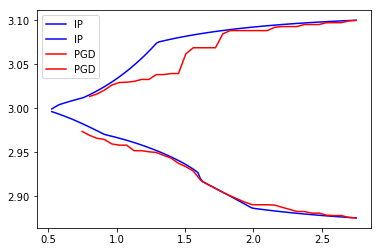

In [352]:
[min_,max_] = plot_bounds(w_min_bnds, w_max_bnds, Phi, len(logGams_full), nSmarg, logGams_full, rearrange=False, label = 'IP')

ngams = 50
logGams = np.linspace(0.1, 2.75, ngams)
Phi = np.asarray([1,2])
[cum_min_,cum_max_] = plot_bounds(min_pgd_bnds, max_pgd_bnds, Phi, ngams, nSmarg, logGams, rearrange=True, label = 'PGD', color = 'r')
plt.legend()
plt.savefig('2state-bounds-ip-vs-pgd.pdf')

In [357]:
oracle_w_s = reshape_byxrow((p_infty_e_long / p_infty_b_su_long).T, nU).T / 2
np.dot(oracle_w_s, Phi)


array([3.04219791])

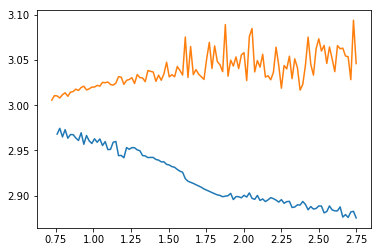

In [101]:
# plt.plot(logGams,min_pgd_bnds)


w_max_pgd_bnds_ = ([np.zeros(nSmarg) if w is None else w for w in w_max_pgd_bnds])
max_ = np.asarray([np.dot(w_max_pgd_bnds_[k], Phi) for k in range(ngams)])
plt.plot(logGams[max_ > 0],max_[max_>0] )


w_min_pgd_bnds_ = ([np.zeros(nSmarg) if w is None else w for w in w_min_pgd_bnds])
min_ = np.asarray([np.dot(w_min_pgd_bnds_[k], Phi) for k in range(ngams)])
plt.plot(logGams[min_>0], min_[min_>0])


[[[3.67144801 5.67418447]
  [1.60928808 1.06404934]]

 [[1.07835757 2.09916535]
  [3.02358206 1.06404932]]]


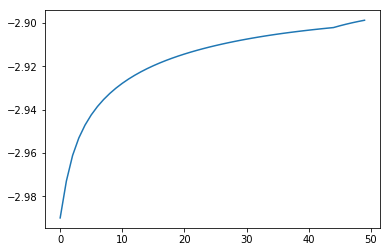

[[[6.49012054 4.40304252]
  [1.05215541 2.22790575]]

 [[1.77300068 1.16891954]
  [3.68357217 1.06404932]]]


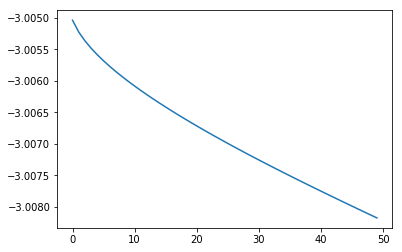

[[[4.91839057 2.2241359 ]
  [1.1164185  4.17240639]]

 [[3.63061187 1.34121675]
  [2.90471635 1.06404932]]]


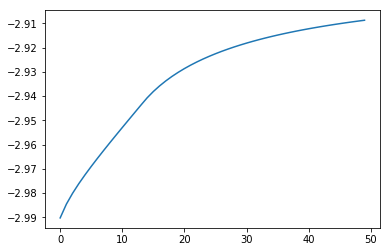

[[[11.12664793  2.80821432]
  [ 1.05215541 10.01192099]]

 [[ 1.07835757  1.06380663]
  [ 1.05215541  1.06404932]]]


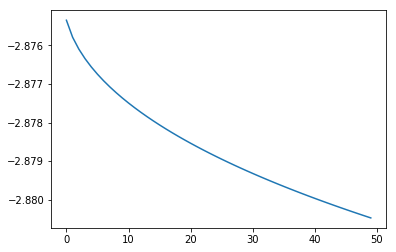

[[[10.87591914  1.48761711]
  [ 1.05215541 10.01192099]]

 [[ 2.03626158  1.06380663]
  [ 1.05215541  1.06404932]]]


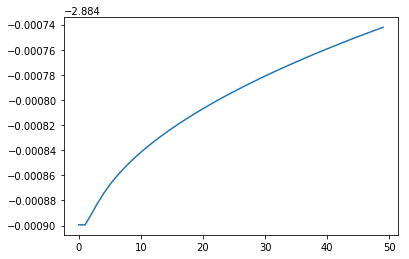

[[[10.9322513   1.06380663]
  [ 1.05215541  2.43458974]]

 [[ 2.28930364  1.06380663]
  [ 3.61370184  1.06404932]]]


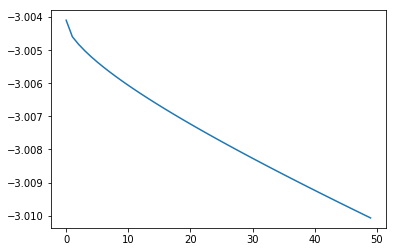

[[[1.07835757 6.77459024]
  [1.05215541 3.41025832]]

 [[1.07835757 2.39597575]
  [3.28387326 1.06404932]]]


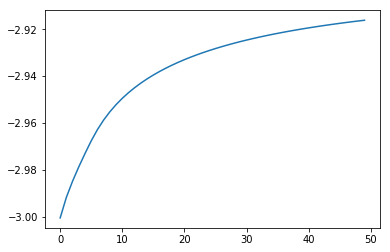

[[[11.16261864  1.06380663]
  [ 1.19280364  4.34350881]]

 [[ 2.19774114  1.06380663]
  [ 2.70244413  1.06404932]]]


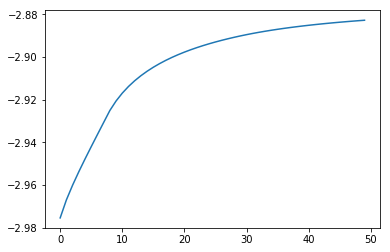

[[[9.53933476 1.06380664]
  [1.05215541 3.67952299]]

 [[2.84293643 1.06380663]
  [3.19284729 1.06404932]]]


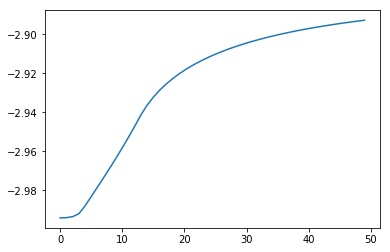

[[[7.22627118 1.06380663]
  [1.05215541 9.0724493 ]]

 [[3.76229362 1.06380663]
  [1.36974749 1.06404932]]]


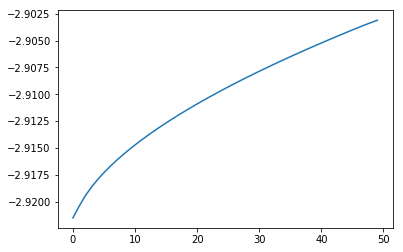

[[[12.2334069   1.06380663]
  [ 1.05215541  7.74199431]]

 [[ 1.77214243  1.06380663]
  [ 1.46112849  1.20474223]]]


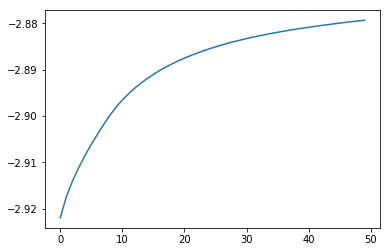

[[[6.58610515 5.58512403]
  [1.05215541 5.4180372 ]]

 [[1.07835757 1.06380663]
  [2.60513577 1.06404932]]]


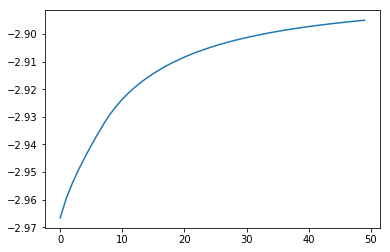

[[[ 1.89394652  6.03204145]
  [ 1.05215541 10.01192099]]

 [[ 1.07835757  2.54499877]
  [ 1.05215541  1.06404932]]]


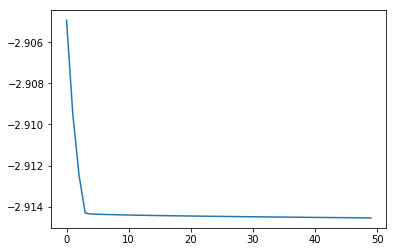

[[[7.11286682 1.06380665]
  [1.05215541 8.27005014]]

 [[3.80736765 1.06380663]
  [1.64100166 1.06404932]]]


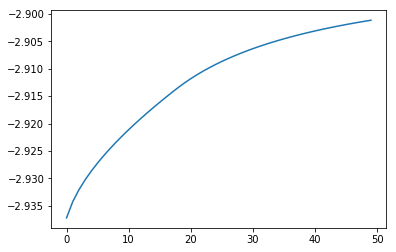

[[[8.02366294 1.27761061]
  [1.05215541 8.07213279]]

 [[3.30640991 1.06380663]
  [1.70790839 1.06404932]]]


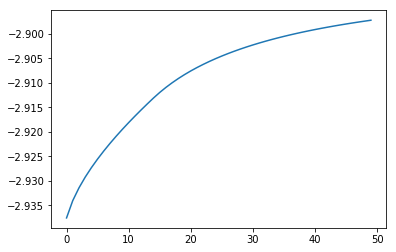

[[[3.43804322 4.38397108]
  [1.05215541 7.37036461]]

 [[1.20693123 2.85428937]
  [1.94514387 1.06404932]]]


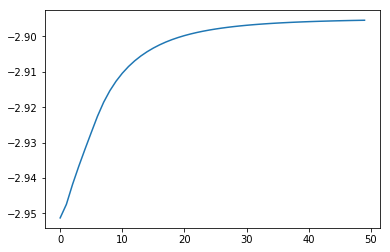

[[[1.07835757 6.42140835]
  [1.05215541 1.06404932]]

 [[1.07835757 2.61190279]
  [4.07701838 1.06404932]]]


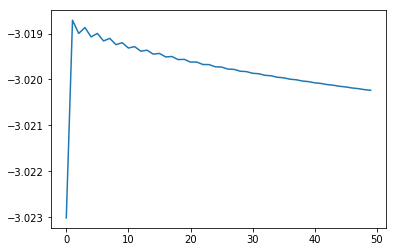

[[[10.42567466  1.06380663]
  [ 1.05215541 10.01192098]]

 [[ 2.49064911  1.06380663]
  [ 1.05215541  1.06404932]]]


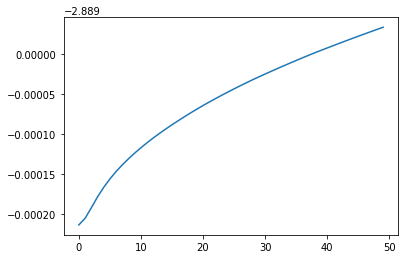

[[[10.8942312   2.95035598]
  [ 1.05215541 10.01192099]]

 [[ 1.07835757  1.06380663]
  [ 1.05215541  1.06404932]]]


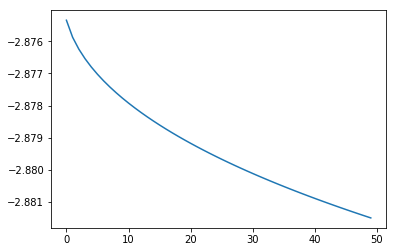

[[[2.8030349  4.72275707]
  [1.05215541 8.98294954]]

 [[1.07835758 3.00555048]
  [1.05215542 1.20060579]]]


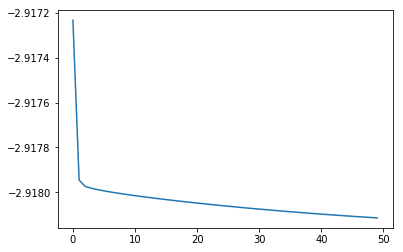

[1.76141452 0.55696563]
-2.8753457722309266


In [69]:
N_RST = 20 
N_RNDS = 50


[th, ls] = opt_w_restarts(N_RST, N_RNDS, data_, logging = True)
print th
print ls

In [70]:
print th
print ls

[1.76141452 0.55696563]
-2.8753457722309266


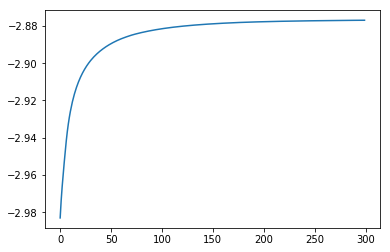

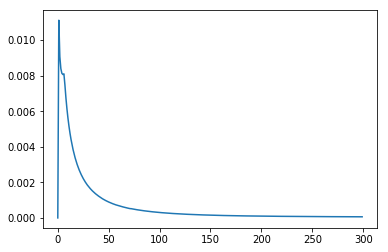

In [589]:
plt.plot(losses)
plt.figure()
plt.plot(residuals_)

In [592]:
# best_ = plt.np.argmin(losses)
best_ = plt.np.argmax(losses)


# print gs[best_]
print THTS[best_]/THTS[best_].sum()
print 'residuals from pb-s formulation', residuals_[best_]
[feas, _] = primal_feasibility(gamma, THTS[best_], data_['a_bnd'],data_['b_bnd'], s_a_giv_sprime_agg, p_infty_b_s, p_e_s, p_a1_s,nSmarg, nA)
print feas
print _

[feas, _] = primal_feasibility_testg(gamma, THTS[best_], data_['a_bnd'],data_['b_bnd'], s_a_giv_sprime_agg, p_infty_b_s, p_e_s, nSmarg, nA)
print feas
print _

w_best = get_w_withAmatrix_cond_from_g(gs_proj[best_],s_a_giv_sprime_agg,p_infty_b_s, p_e_s, nSmarg)
w_best

[0.72057401 0.27942599]
residuals from pb-s formulation 6.28683984896794e-05
True
[[[7.97280563 1.06296402]
  [1.18653205 9.24228423]]

 [[3.28676061 1.06296402]
  [1.05219613 1.06490645]]]


TypeError: primal_feasibility_testg() takes at least 10 arguments (9 given)

[-1 -2]
False


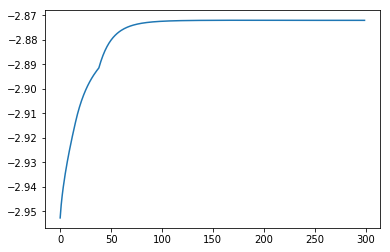

[-1 -2]
False


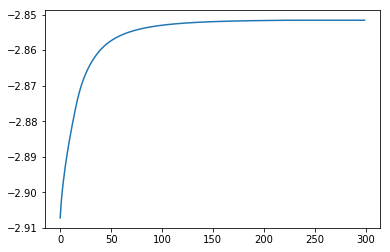

[-1 -2]
False


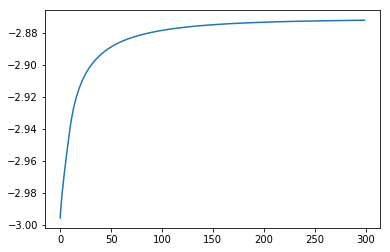

[-1 -2]
False


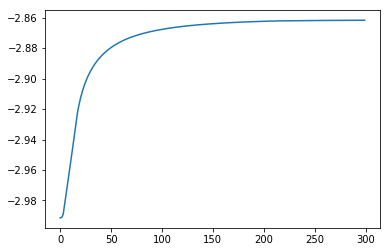

[-1 -2]
False


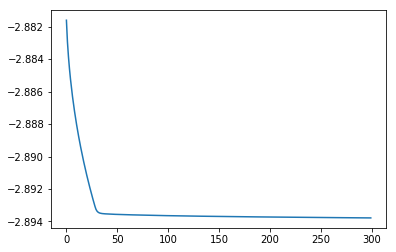

[-1 -2]
False


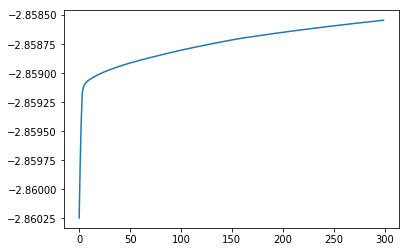

[-1 -2]
False


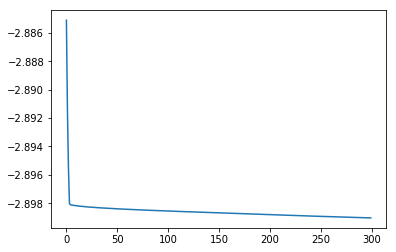

[-1 -2]
False


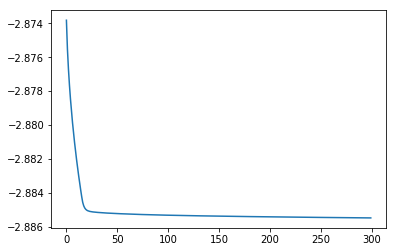

[-1 -2]
False


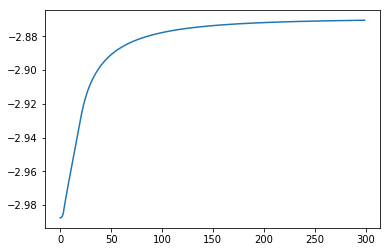

[-1 -2]
False


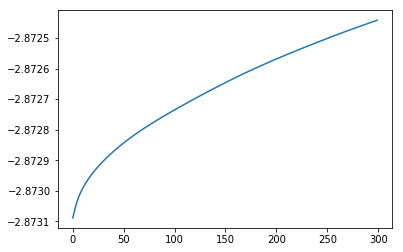

[-1 -2]
False


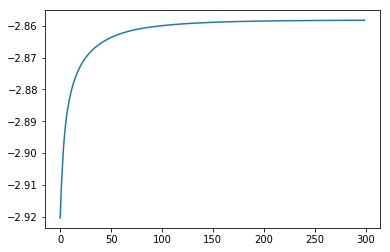

[-1 -2]
False


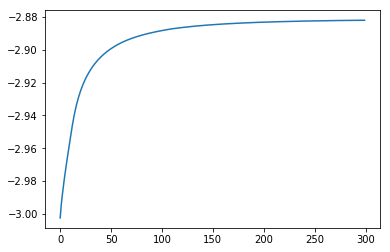

[-1 -2]
False


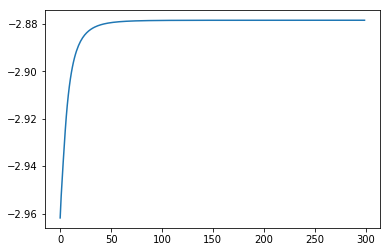

[-1 -2]
False


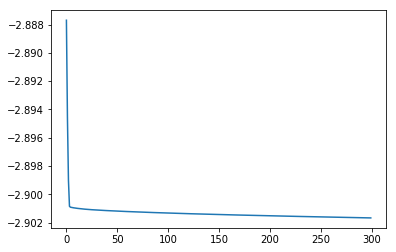

[-1 -2]
False


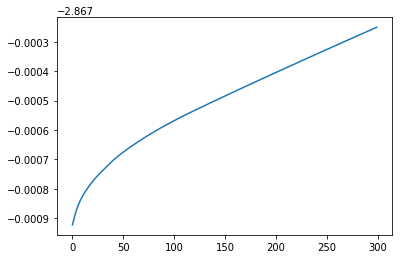

[-1 -2]
False


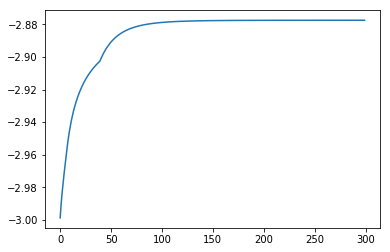

[-1 -2]
False


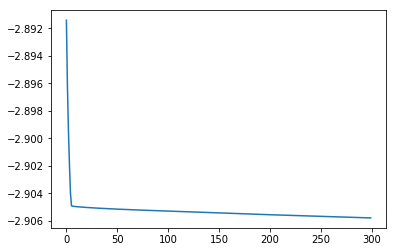

[-1 -2]
False


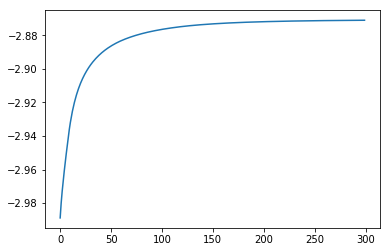

[-1 -2]
False


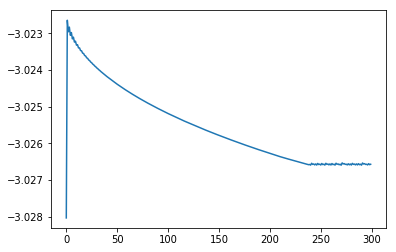

[-1 -2]
False


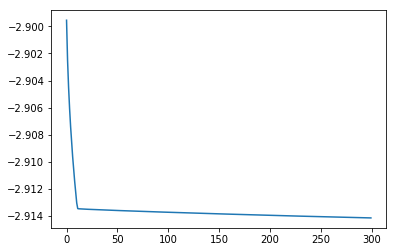

[1.74811555 0.55174079]


In [593]:
N_RST = 20 
data_['gamma']  = 1
[th, ls] = opt_w_restarts(N_RST, th, N_RNDS, data_, logging = True)
print th

In [595]:
print th / th.sum()

[0.76009771 0.23990229]


In [582]:
sense_min = False
[objVal, w_, m] = primal_opt_outer_L1_(gamma, data_['Phi'], a_bnd,b_bnd, s_a_giv_sprime_agg, p_infty_b_s, p_e_s, p_a1_s, nSmarg, nA, tight, sense_min, quiet=True)
print objVal, w_

1.74754397784 [0.25245602216441243, 0.7475439778355876]


In [346]:
data_['sense_min'] = True
N_RNDS = 100
[losses, gs_init, gs_proj, THTS, residuals_] = proj_grad_descent_smoothed(g_init, N_RNDS, *[data_], eta_0 = 1000,step_schedule=0.5)

eta 1000.0
w [2.66893515 0.        ]
residuals,  1.3578308119635074
theta from grad comp, [ 8.60855838 -3.55892992]
th, [ 1.70479045 -0.70479045]
eta 707.1067811865474
w [0.83834432 1.09686157]
residuals,  0.09130349392861477
theta from grad comp, [0.39019315 1.36538678]
th, [0.22225884 0.77774116]
eta 577.3502691896258
w [0.83834432 1.09686157]
residuals,  0.09130349392849121
theta from grad comp, [0.39019315 1.36538678]
th, [0.22225884 0.77774116]
eta 500.0
w [0.83834432 1.09686157]
residuals,  0.0913034939284102
theta from grad comp, [0.39019315 1.36538678]
th, [0.22225884 0.77774116]
eta 447.21359549995793
w [0.83834432 1.09686157]
residuals,  0.0913034939281768
theta from grad comp, [0.39019315 1.36538678]
th, [0.22225884 0.77774116]
eta 408.24829046386304
w [0.83834432 1.09686157]
residuals,  0.09130349392826775
theta from grad comp, [0.39019315 1.36538678]
th, [0.22225884 0.77774116]
eta 377.9644730092272
w [0.83834432 1.09686157]
residuals,  0.09130349392558237
theta from grad 

w [0.82069532 1.10743658]
residuals,  0.08501772345995075
theta from grad comp, [0.40569849 1.35609623]
th, [0.23027569 0.76972431]
eta 102.06207261596576
w [0.82101107 1.10724739]
residuals,  0.0849853188831225
theta from grad comp, [0.40627097 1.35575321]
th, [0.2305706 0.7694294]
eta 101.53461651336191
w [0.82039977 1.10761367]
residuals,  0.08475265154406433
theta from grad comp, [0.4068814  1.35538745]
th, [0.23088498 0.76911502]
eta 101.01525445522107
w [0.82072103 1.10742117]
residuals,  0.0847242313892009
theta from grad comp, [0.40743572 1.3550553 ]
th, [0.23117038 0.76882962]
eta 100.50378152592121
w [0.82011355 1.10778516]
residuals,  0.08449643023046043
theta from grad comp, [0.40802325 1.35470327]
th, [0.2314728 0.7685272]
eta 100.0
w [0.82043999 1.10758957]
residuals,  0.08447177883618821
theta from grad comp, [0.40856047 1.35438138]
th, [0.23174926 0.76825074]


Text(0.5,1,'parameters')

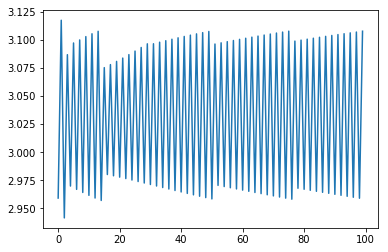

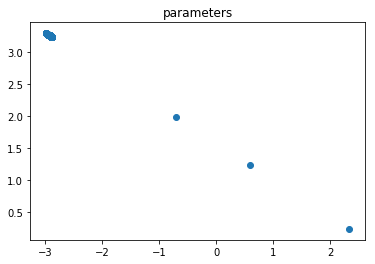

In [445]:
plt.plot(losses)
# plt.plot(residuals)
gs[-1][0,:,:]
plt.figure()

plt.scatter(THTS_[:,0], THTS_[:,1])
plt.title('parameters')




In [253]:
data_['sense_min'] = True
[losses, gs_init, gs_proj, THTS] = proj_grad_descent_smoothed(g_init, N_RNDS, *[data_], eta_0 = 100)

100.0
98.533981389
[1. 0.]
[ 8.60855838 -3.55892992]
70.71067811865474
28.9538822149
[0.76011078 0.23988922]
[-0.49547567  1.89606578]
57.73502691896258
6.39888631745
[0.43320678 0.56679322]
[0.39019315 1.36538678]
50.0
1.63359907213
[0.30813959 0.69186041]
[0.56220885 1.26231765]
44.72135954999579
-0.952401014095
[0.2805811 0.7194189]
[0.50555646 1.29626288]
40.824829046386306
1.13337292481
[0.30794291 0.69205709]
[0.56179947 1.26256295]
37.79644730092272
-0.846522813464
[0.2746442 0.7253558]
[0.493536   1.30346536]
35.35533905932737
0.841342300867
[0.30794115 0.69205885]
[0.5617958  1.26256514]
33.333333333333336
-0.753914562978
[0.27092542 0.72907458]
[0.48603926 1.30795729]
31.622776601683793
0.641004850971
[0.30787444 0.69212556]
[0.56165698 1.26264832]
30.15113445777636
-0.711708716141
[0.26845025 0.73154975]
[0.48106342 1.31093873]
28.86751345948129
0.49341501868
[0.30781683 0.69218317]
[0.56153708 1.26272016]
27.735009811261456
-0.691148619339
[0.26662777 0.73337223]
[0.4774067

-0.520518132587
[0.30742882 0.69257118]
[0.56072977 1.26320389]
9.245003270420485
-0.802913649111
[0.25328903 0.74671097]
[0.45082457 1.32905738]
9.205746178983233
-0.524440990865
[0.30742879 0.69257121]
[0.56072972 1.26320392]
9.166984970282114
-0.804321017675
[0.25323084 0.74676916]
[0.45070931 1.32912644]
9.128709291752768
-0.528265347442
[0.30742877 0.69257123]
[0.56072967 1.26320395]
9.090909090909092
-0.805702315363
[0.25317411 0.74682589]
[0.45059693 1.32919378]
9.053574604251853
-0.531995255925
[0.30742875 0.69257125]
[0.56072962 1.26320398]
9.016696346674323
-0.807058316584
[0.25311877 0.74688123]
[0.45048731 1.32925946]
8.980265101338746
-0.535634540466
[0.30742872 0.69257128]
[0.56072957 1.26320401]
8.94427190999916
-0.808389766328
[0.25306476 0.74693524]
[0.45038035 1.32932355]
8.90870806374748
-0.539186812128
[0.3074287 0.6925713]
[0.56072953 1.26320404]
8.873565094161139
-0.809697381187
[0.25301204 0.74698796]
[0.45027593 1.32938612]
8.838834764831843
-0.542655483704
[0.3

6.262242910851495
-0.863352870685
[0.25106599 0.74893401]
[0.4464251  1.33169347]
6.25
-0.671163032481
[0.30742789 0.69257211]
[0.56072785 1.26320505]
6.237828615518053
-0.86390381822
[0.2510478 0.7489522]
[0.44638913 1.33171503]
6.225728063646904
-0.672367779741
[0.30742789 0.69257211]
[0.56072783 1.26320505]
6.213697660012
-0.864449270466
[0.25102982 0.74897018]
[0.44635358 1.33173633]
6.201736729460423
-0.673558597688
[0.30742788 0.69257212]
[0.56072782 1.26320506]
6.18984460590173
-0.86498931922
[0.25101204 0.74898796]
[0.44631844 1.33175738]
6.178020632152155
-0.674735752686
[0.30742787 0.69257213]
[0.56072781 1.26320507]
6.166264159782074
-0.865524054139
[0.25099447 0.74900553]
[0.44628371 1.3317782 ]
6.154574548966636
-0.67589950402
[0.30742787 0.69257213]
[0.5607278  1.26320508]
6.142951168339512
-0.866053562808
[0.2509771 0.7490229]
[0.44624936 1.33179877]
6.131393394849659
-0.67705010414
[0.30742786 0.69257214]
[0.56072778 1.26320509]
6.119900613621046
-0.866577930797
[0.2509